In [1]:
from F1_library import libraryF1dataNotebook as libraryDataF1
import pandas as pd
import fastf1 as ff1

# FORMULA 1 STC SAUDI ARABIAN GRAND PRIX 2024
The Saudi Arabian Grand Prix (Arabic: جائزة السعودية الكبرى) is a Formula One motor racing event which took place for the first time in 2021. The inaugural edition of the race was held in Jeddah, in Saudi Arabia. It was the fifth full-night race title on the Formula One calendar, following the Singapore, Bahrain, Sakhir and Qatar Grands Prix.[1] Source: Wikipedia

## Obtain session information

In [2]:
libraryDataF1.obtain_information('sessions',year=2024,country_acronym='KSA')

,session_key,session_name,date_start,date_end,gmt_offset,session_type,meeting_key,location,country_key,country_code,country_name,circuit_key,circuit_short_name,year
0,9473,Practice 1,2024-03-07T13:30:00+00:00,2024-03-07T14:30:00+00:00,03:00:00,Practice,1230,Jeddah,153,KSA,Saudi Arabia,149,Jeddah,2024
1,9474,Practice 2,2024-03-07T17:00:00+00:00,2024-03-07T18:00:00+00:00,03:00:00,Practice,1230,Jeddah,153,KSA,Saudi Arabia,149,Jeddah,2024
2,9475,Practice 3,2024-03-08T13:30:00+00:00,2024-03-08T14:30:00+00:00,03:00:00,Practice,1230,Jeddah,153,KSA,Saudi Arabia,149,Jeddah,2024
3,9476,Qualifying,2024-03-08T17:00:00+00:00,2024-03-08T18:00:00+00:00,03:00:00,Qualifying,1230,Jeddah,153,KSA,Saudi Arabia,149,Jeddah,2024
4,9480,Race,2024-03-09T17:00:00+00:00,2024-03-09T19:00:00+00:00,03:00:00,Race,1230,Jeddah,153,KSA,Saudi Arabia,149,Jeddah,2024


## Free Practice 1
### Obtain setup

In [3]:
practice = libraryDataF1.obtain_information('laps',session_key=9473)
stintInformation = libraryDataF1.obtain_information('stints',session_key=9473)
drivers = libraryDataF1.obtain_information('drivers',session_key=9473)

In [4]:
stintsDataFrame =libraryDataF1.stint_configuration(drivers,stintInformation)
jointables2 = pd.merge(practice,stintsDataFrame,on=['lap_number','driver_number'])
libraryDataF1.obtain_drivers_colours(drivers)

### Speed trap

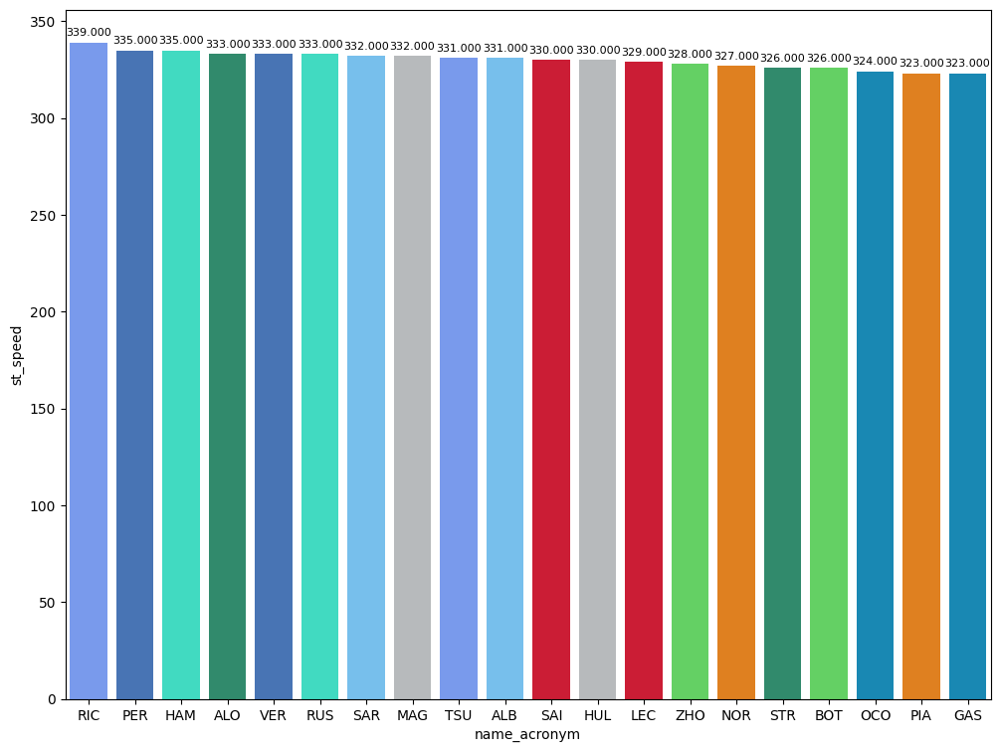

In [5]:
top_speed = jointables2.loc[jointables2.groupby(['name_acronym'])['st_speed'].idxmax()].sort_values(by=['st_speed'],ascending=False)
libraryDataF1.obtainchart("name_acronym","st_speed",top_speed)

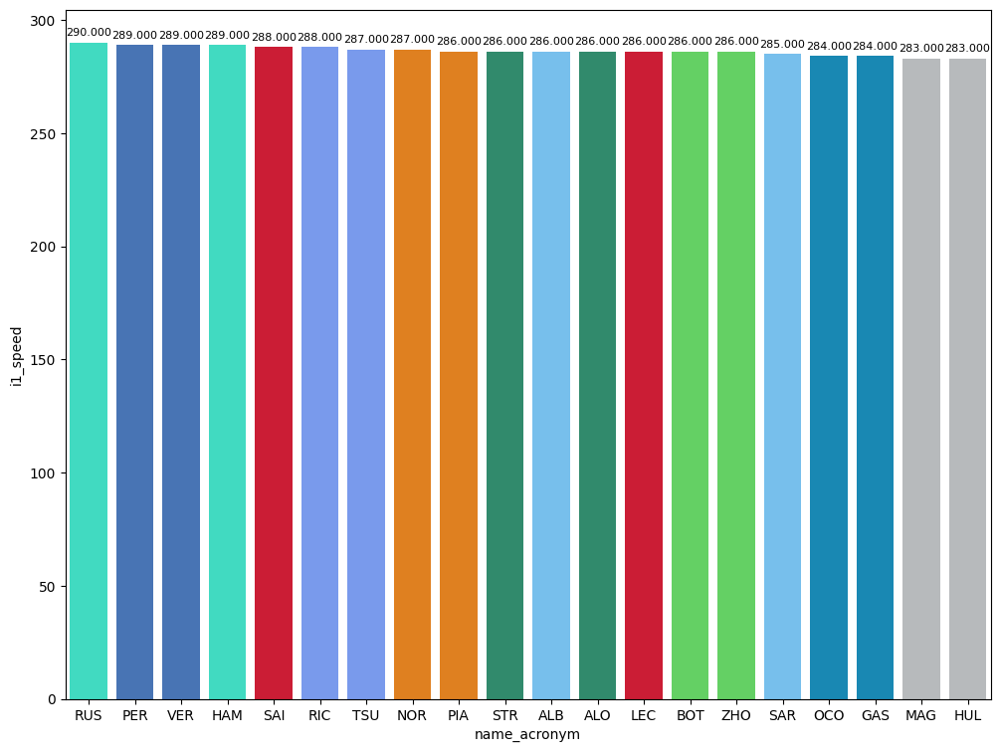

In [6]:
top_speed = jointables2.loc[jointables2.groupby(['name_acronym'])['i1_speed'].idxmax()].sort_values(by=['i1_speed'],ascending=False)
libraryDataF1.obtainchart("name_acronym","i1_speed",top_speed)

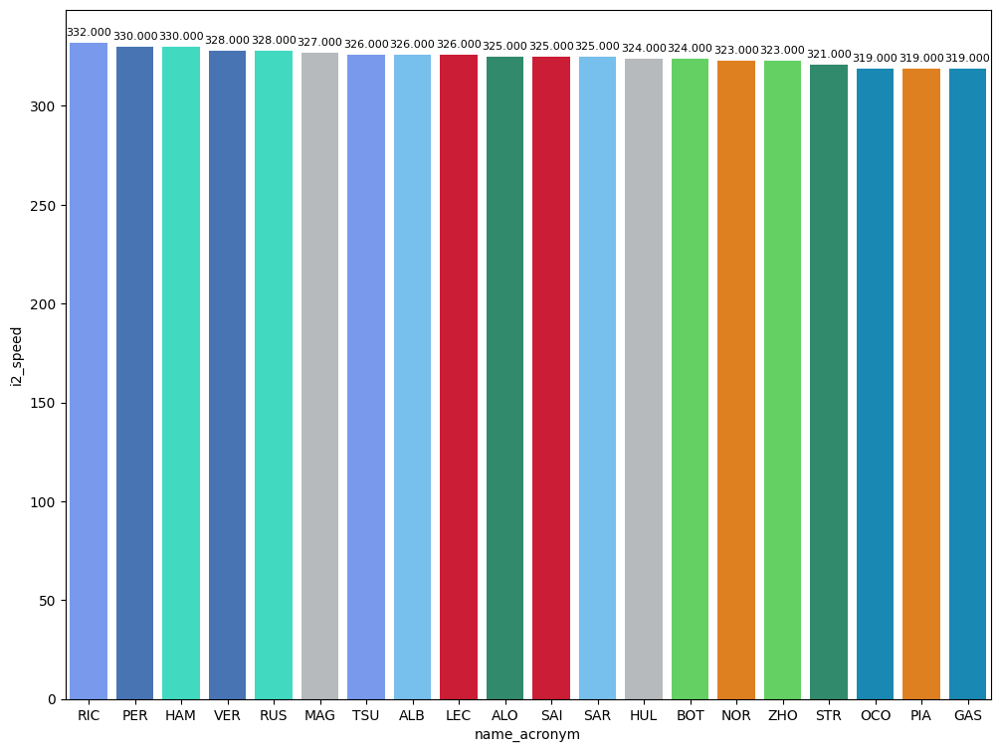

In [7]:
top_speed = jointables2.loc[jointables2.groupby(['name_acronym'])['i2_speed'].idxmax()].sort_values(by=['i2_speed'],ascending=False)
libraryDataF1.obtainchart("name_acronym","i2_speed",top_speed)

### Fastest lap per compound
In this section, I will show the best lap with the different compounds of the session. 

In [8]:
compoundsPace = jointables2.loc[jointables2.groupby(['compound'])['lap_duration'].idxmin()]
compoundsPace[['full_name','compound','duration_sector_1','duration_sector_2','duration_sector_3','lap_duration']]

,full_name,compound,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
152,George RUSSELL,HARD,33.078,28.482,28.994,90.554
340,Daniel RICCIARDO,MEDIUM,33.045,28.887,28.985,90.917
263,Max VERSTAPPEN,SOFT,32.615,28.428,28.616,89.659


### Deltas
In this section we can see the deltas of the fastest lap of each driver compared with the fastest lap of the session

In [9]:
practiceCleaned = jointables2.query("lap_duration >1")
drivers_list = list(practiceCleaned['driver_number'].unique())
newdataset = pd.DataFrame()
for driver in drivers_list:
    newdataset =libraryDataF1.obtain_fastest_lap(driver,practiceCleaned,newdataset)

arr= libraryDataF1.obtain_deltas(newdataset)
newdataset.insert(3,'delta',arr)


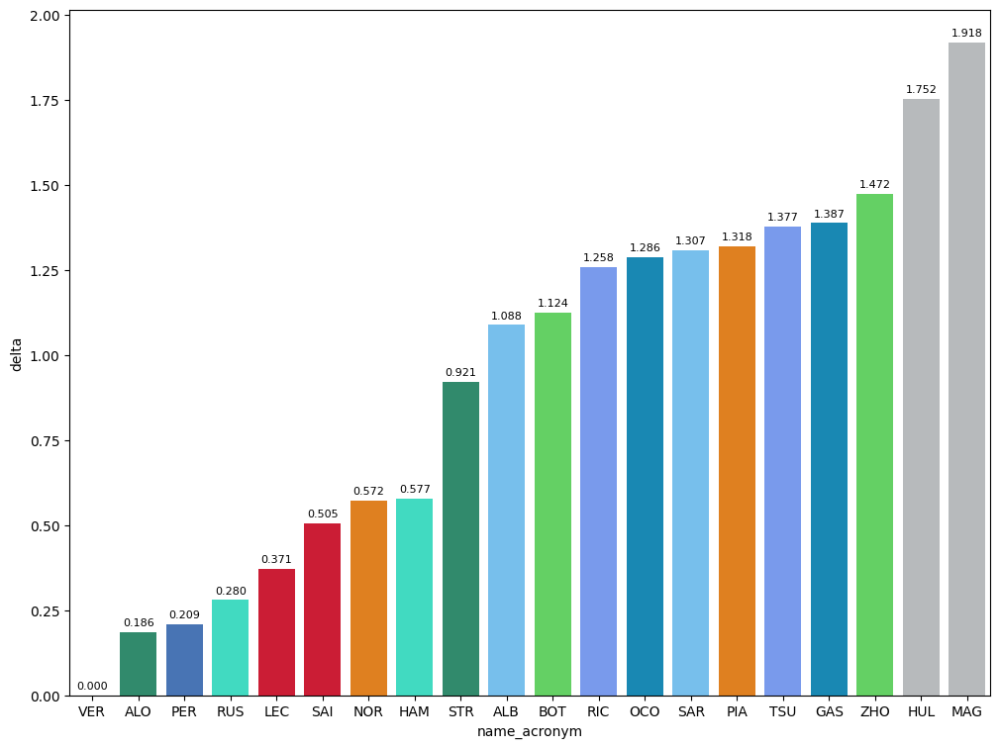

In [10]:
dt = newdataset.sort_values(ascending=True,by='delta')
libraryDataF1.obtainchart("name_acronym","delta",dt)

### Track dominance
In this section, best sector are taken of each sector to see the car's performance in each sector.

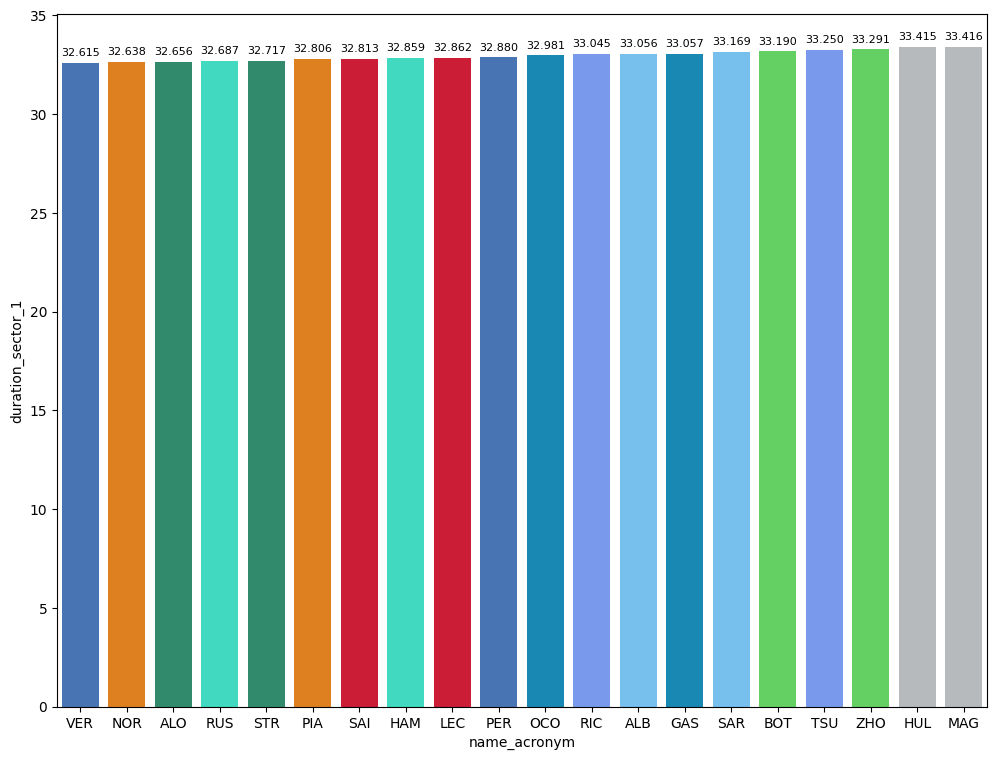

In [19]:
sectorPace = jointables2.loc[jointables2.groupby(['driver_number'])['duration_sector_1'].idxmin()].sort_values(by=['duration_sector_1'],ascending=True)
libraryDataF1.obtainchart("name_acronym","duration_sector_1",sectorPace)

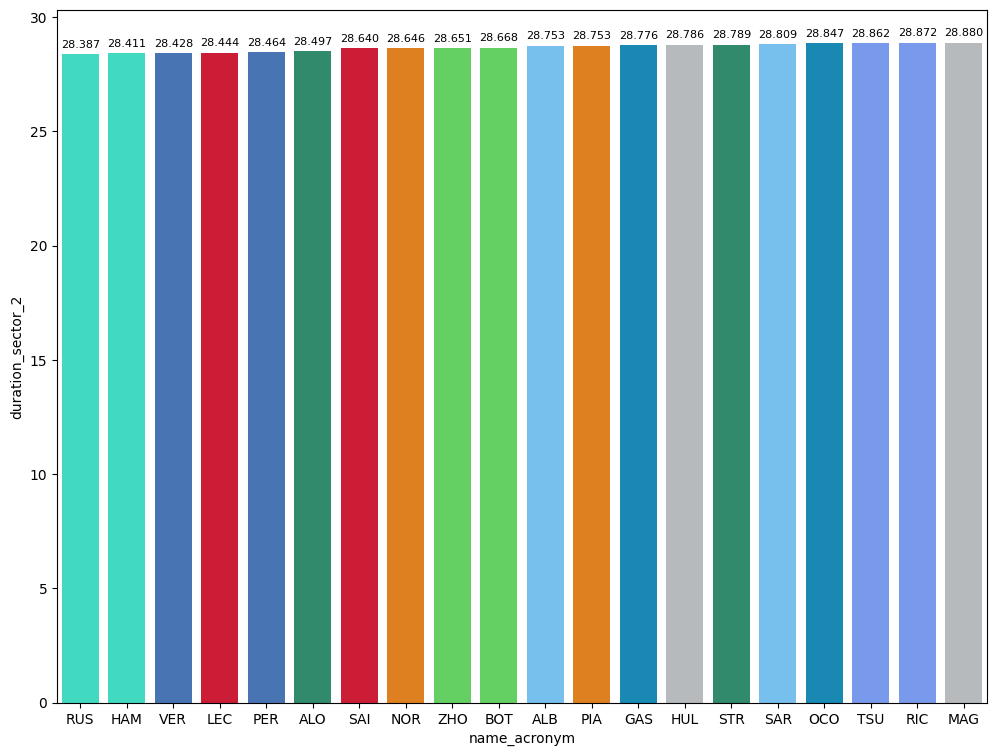

In [20]:
sectorPace = jointables2.loc[jointables2.groupby(['driver_number'])['duration_sector_2'].idxmin()].sort_values(by=['duration_sector_2'],ascending=True)
libraryDataF1.obtainchart("name_acronym","duration_sector_2",sectorPace)

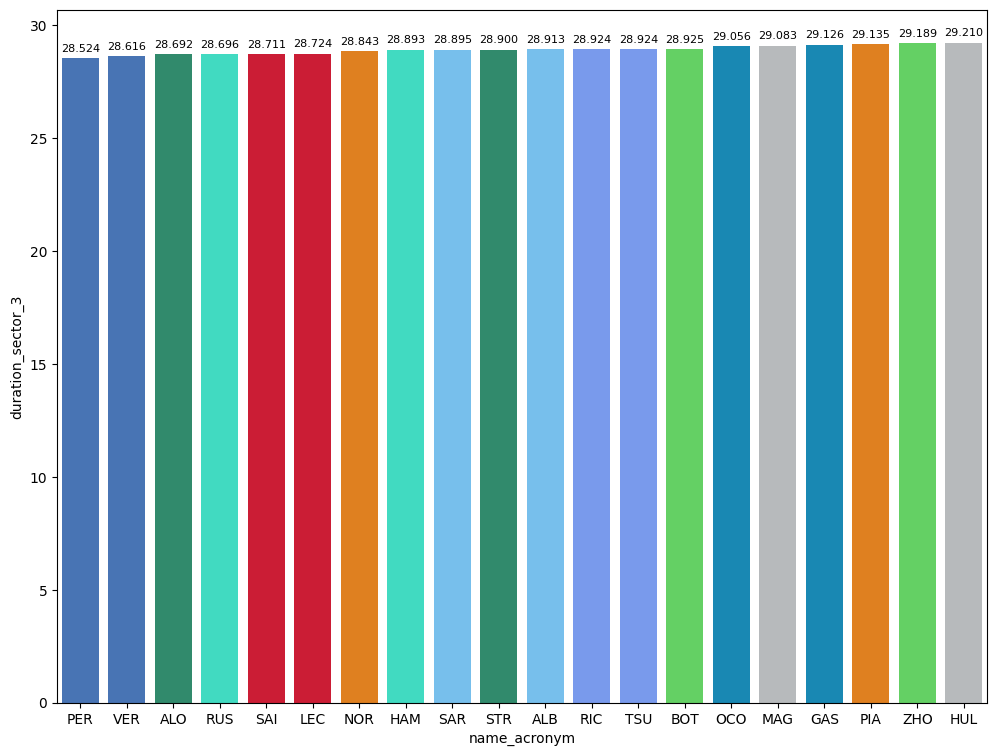

In [21]:
sectorPace = jointables2.loc[jointables2.groupby(['driver_number'])['duration_sector_3'].idxmin()].sort_values(by=['duration_sector_3'],ascending=True)
libraryDataF1.obtainchart("name_acronym","duration_sector_3",sectorPace)

### Mean pace with the different compound used on the session

In [14]:
race_pace = pd.DataFrame(jointables2.query("is_pit_out_lap == False  and lap_duration <= 108").groupby("compound")['lap_duration'].mean().sort_values(ascending=True))
race_pace

,lap_duration
compound,
SOFT,93.566053
HARD,94.272567
MEDIUM,94.639274


## Free Practice 2
### Obtain setup

In [22]:
practice = libraryDataF1.obtain_information('laps',session_key=9474)
stintInformation = libraryDataF1.obtain_information('stints',session_key=9474)
drivers = libraryDataF1.obtain_information('drivers',session_key=9474)

In [23]:
stintsDataFrame =libraryDataF1.stint_configuration(drivers,stintInformation)
jointables2 = pd.merge(practice,stintsDataFrame,on=['lap_number','driver_number'])
libraryDataF1.obtain_drivers_colours(drivers)

### Speed trap

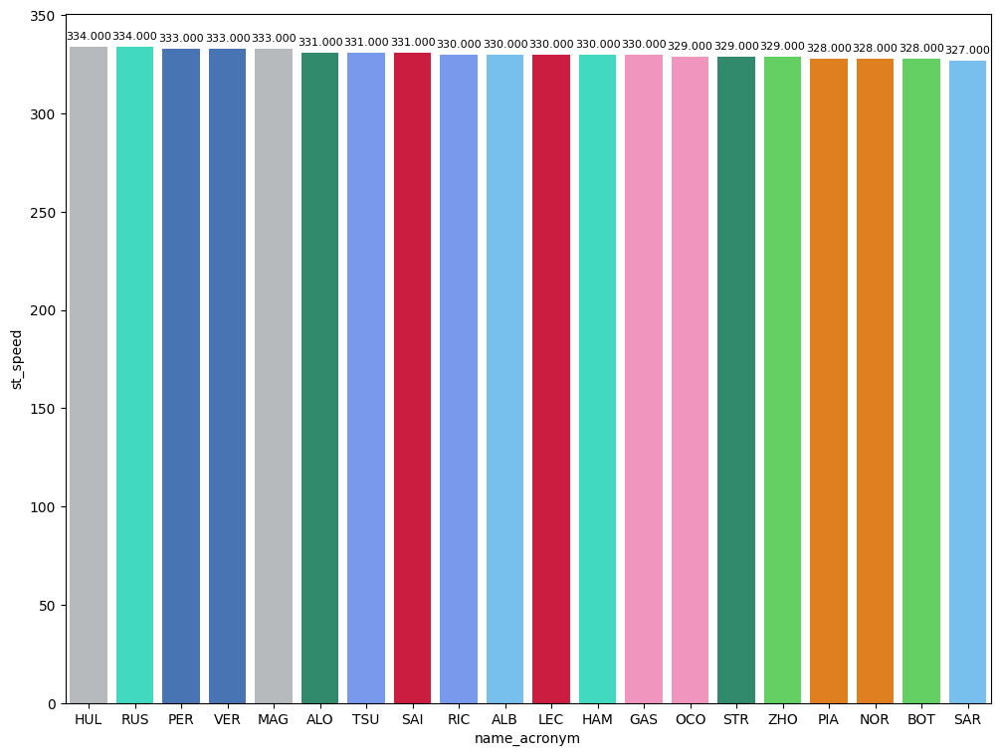

In [24]:
top_speed = jointables2.loc[jointables2.groupby(['name_acronym'])['st_speed'].idxmax()].sort_values(by=['st_speed'],ascending=False)
libraryDataF1.obtainchart("name_acronym","st_speed",top_speed)

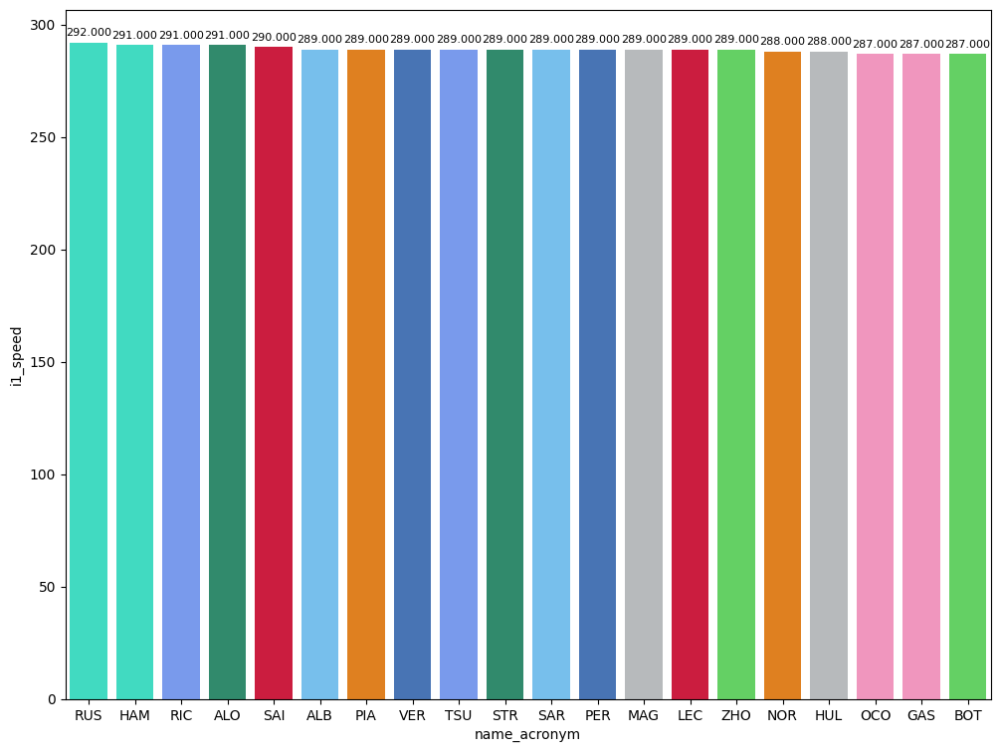

In [25]:
top_speed = jointables2.loc[jointables2.groupby(['name_acronym'])['i1_speed'].idxmax()].sort_values(by=['i1_speed'],ascending=False)
libraryDataF1.obtainchart("name_acronym","i1_speed",top_speed)

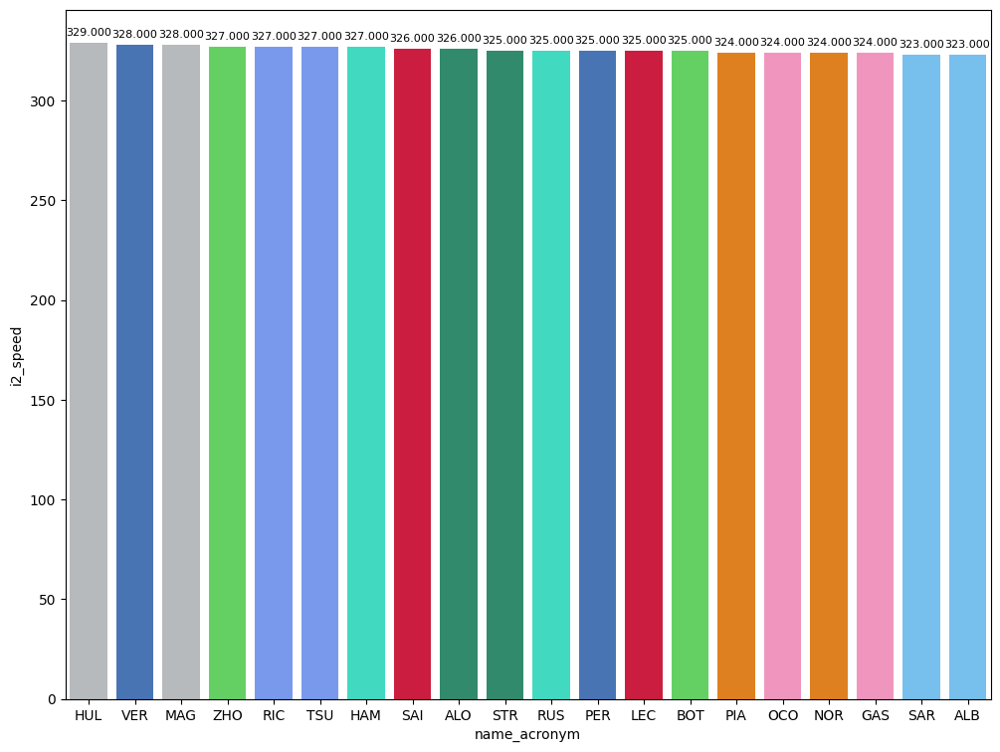

In [26]:
top_speed = jointables2.loc[jointables2.groupby(['name_acronym'])['i2_speed'].idxmax()].sort_values(by=['i2_speed'],ascending=False)
libraryDataF1.obtainchart("name_acronym","i2_speed",top_speed)

### Fastest lap per compound
In this section, I will show the best lap with the different compounds of the session. 

In [27]:
compoundsPace = jointables2.loc[jointables2.groupby(['compound'])['lap_duration'].idxmin()]
compoundsPace[['full_name','compound','duration_sector_1','duration_sector_2','duration_sector_3','lap_duration']]

,full_name,compound,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
71,Lando NORRIS,HARD,32.983,28.486,28.691,90.160
123,Max VERSTAPPEN,MEDIUM,32.438,28.415,28.690,89.543
164,Fernando ALONSO,SOFT,32.260,28.222,28.345,88.827


### Deltas
In this section we can see the deltas of the fastest lap of each driver compared with the fastest lap of the session

In [28]:
practiceCleaned = jointables2.query("lap_duration >1")
drivers_list = list(practiceCleaned['driver_number'].unique())
newdataset = pd.DataFrame()
for driver in drivers_list:
    newdataset =libraryDataF1.obtain_fastest_lap(driver,practiceCleaned,newdataset)

arr= libraryDataF1.obtain_deltas(newdataset)
newdataset.insert(3,'delta',arr)


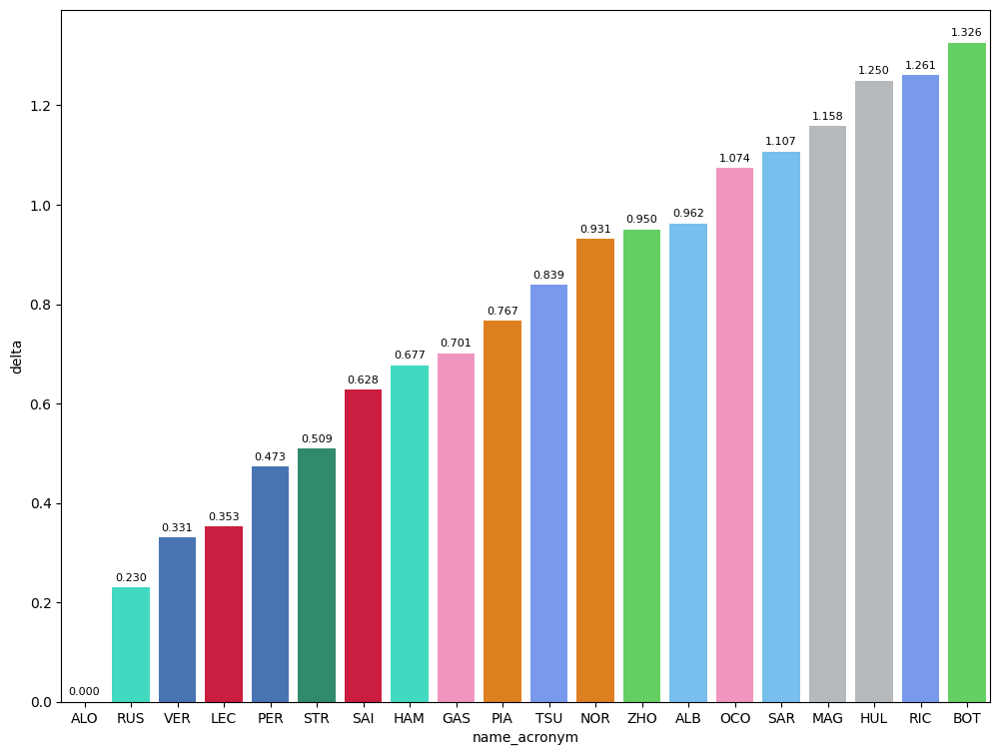

In [29]:
dt = newdataset.sort_values(ascending=True,by='delta')
libraryDataF1.obtainchart("name_acronym","delta",dt)

### Track dominance
In this section, best sector are taken of each sector to see the car's performance in each sector.

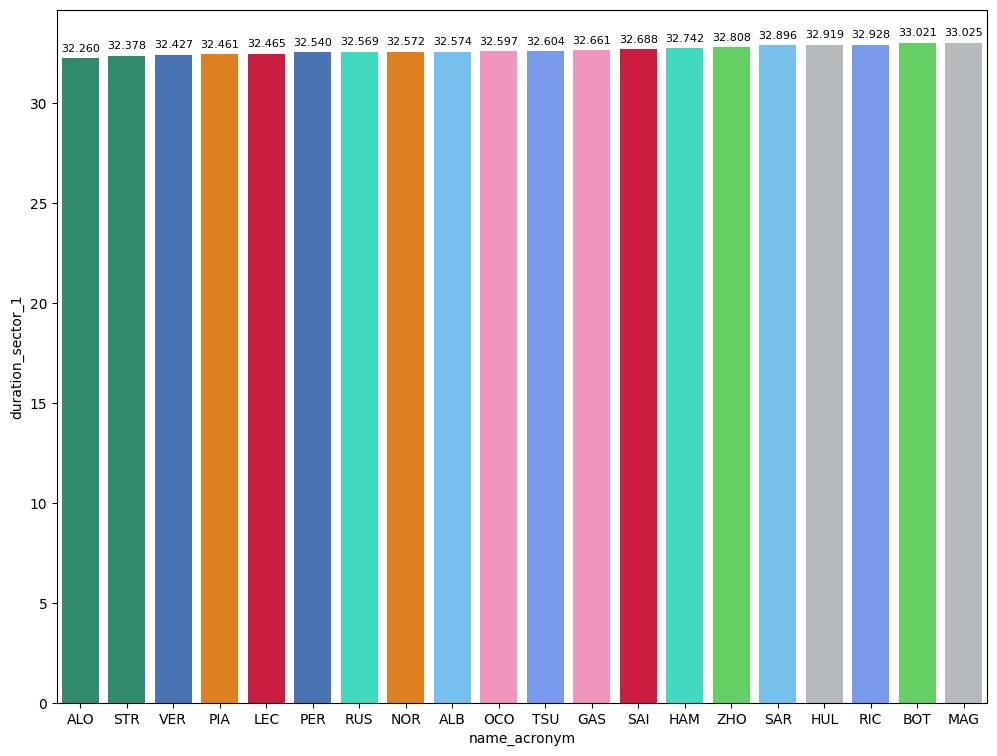

In [30]:
sectorPace = jointables2.loc[jointables2.groupby(['driver_number'])['duration_sector_1'].idxmin()].sort_values(by=['duration_sector_1'],ascending=True)
libraryDataF1.obtainchart("name_acronym","duration_sector_1",sectorPace)

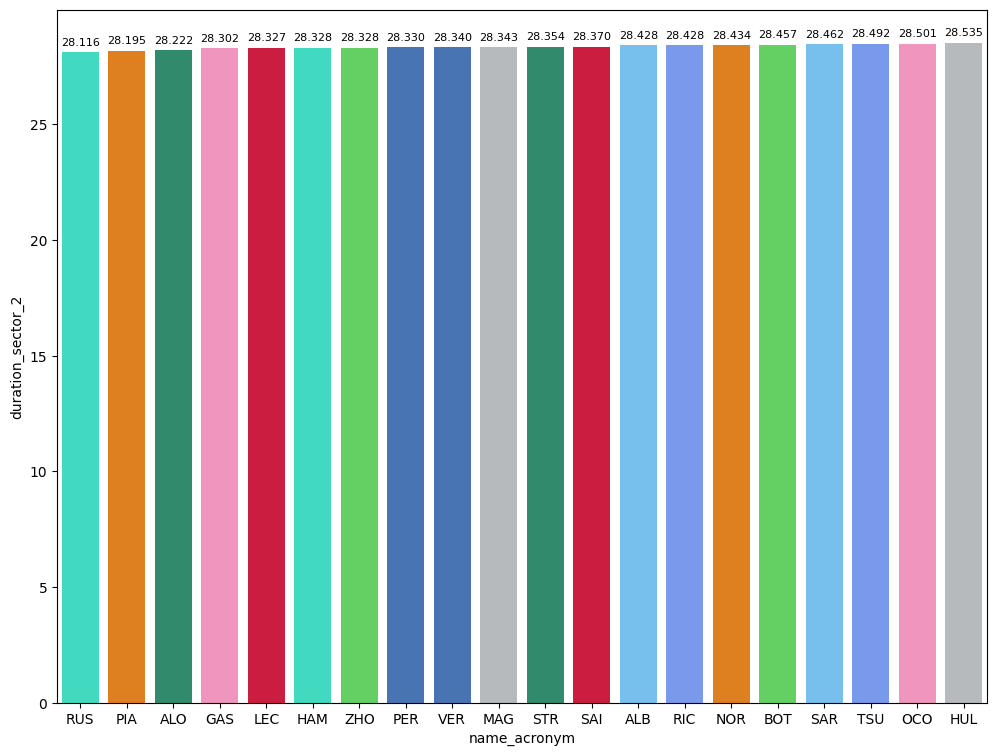

In [31]:
sectorPace = jointables2.loc[jointables2.groupby(['driver_number'])['duration_sector_2'].idxmin()].sort_values(by=['duration_sector_2'],ascending=True)
libraryDataF1.obtainchart("name_acronym","duration_sector_2",sectorPace)

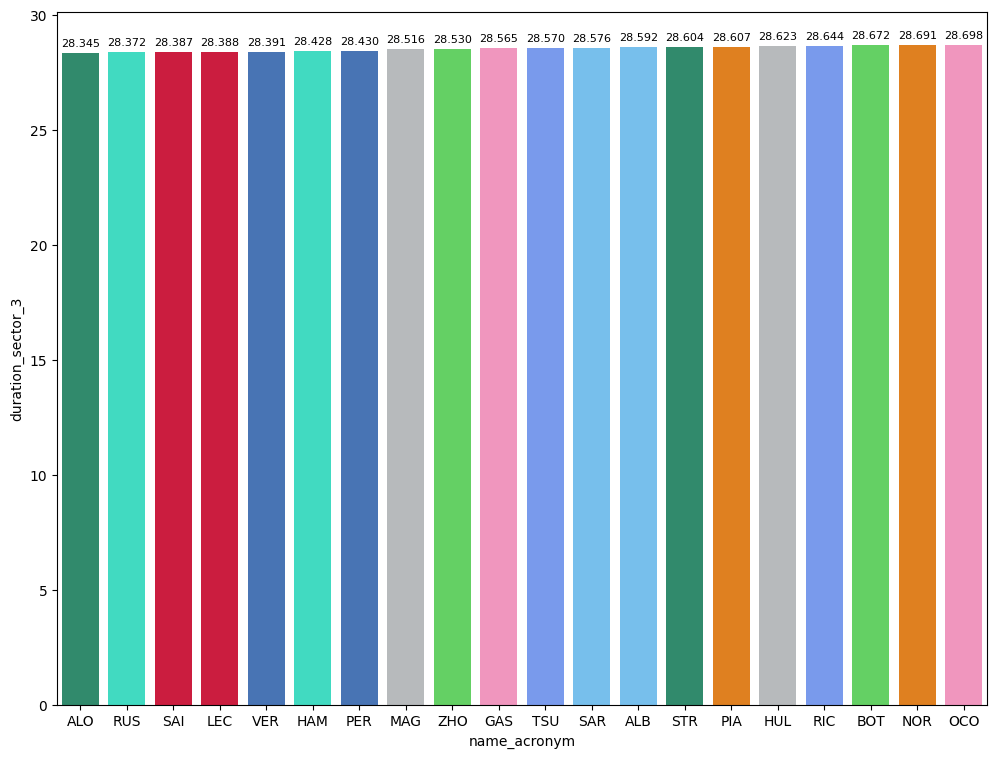

In [32]:
sectorPace = jointables2.loc[jointables2.groupby(['driver_number'])['duration_sector_3'].idxmin()].sort_values(by=['duration_sector_3'],ascending=True)
libraryDataF1.obtainchart("name_acronym","duration_sector_3",sectorPace)

### Mean pace with the different compound used on the session

In [33]:
race_pace = pd.DataFrame(jointables2.query("is_pit_out_lap == False  and lap_duration <= 108").groupby("compound")['lap_duration'].mean().sort_values(ascending=True))
race_pace

,lap_duration
compound,
SOFT,93.119570
MEDIUM,94.253638
HARD,94.822848


### Long runs

In [34]:
MINIMUN_SECONDS = 93
MAXIMUM_SECONDS = 108

#### Red Bull Racing

In [35]:
stintInformation.query('driver_number == 1 or driver_number == 11')

,meeting_key,session_key,stint_number,driver_number,lap_start,lap_end,compound,tyre_age_at_start
1,1230,9474,1,1,1,4,MEDIUM,0
2,1230,9474,1,11,1,4,MEDIUM,0
21,1230,9474,2,11,5,7,MEDIUM,3
22,1230,9474,2,1,5,9,MEDIUM,3
26,1230,9474,3,11,8,10,SOFT,0
40,1230,9474,3,1,10,15,SOFT,0
44,1230,9474,4,11,11,28,MEDIUM,6
60,1230,9474,4,1,16,28,MEDIUM,0


In [36]:
data = libraryDataF1.getinfolongruns(jointables2,1,'Red Bull Racing',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
300,Max VERSTAPPEN,MEDIUM,2024-03-07T17:54:15.188000+00:00,16,34.401,29.906,29.937,94.244
317,Max VERSTAPPEN,MEDIUM,2024-03-07T17:55:49.540000+00:00,17,34.547,29.825,29.967,94.339
334,Max VERSTAPPEN,MEDIUM,2024-03-07T17:57:23.828000+00:00,18,34.450,29.636,29.827,93.913
354,Max VERSTAPPEN,MEDIUM,2024-03-07T17:58:57.660000+00:00,19,34.407,29.680,29.824,93.911
374,Max VERSTAPPEN,MEDIUM,2024-03-07T18:00:31.999000+00:00,20,34.527,29.782,29.922,94.231
394,Max VERSTAPPEN,MEDIUM,2024-03-07T18:02:05.831000+00:00,21,34.430,29.723,39.531,103.684
414,Max VERSTAPPEN,MEDIUM,2024-03-07T18:03:49.518000+00:00,22,34.481,29.714,29.822,94.017
433,Max VERSTAPPEN,MEDIUM,2024-03-07T18:05:23.584000+00:00,23,34.401,29.737,29.915,94.053
451,Max VERSTAPPEN,MEDIUM,2024-03-07T18:06:57.656000+00:00,24,34.354,29.786,29.771,93.911
469,Max VERSTAPPEN,MEDIUM,2024-03-07T18:08:31.548000+00:00,25,34.268,29.698,29.760,93.726


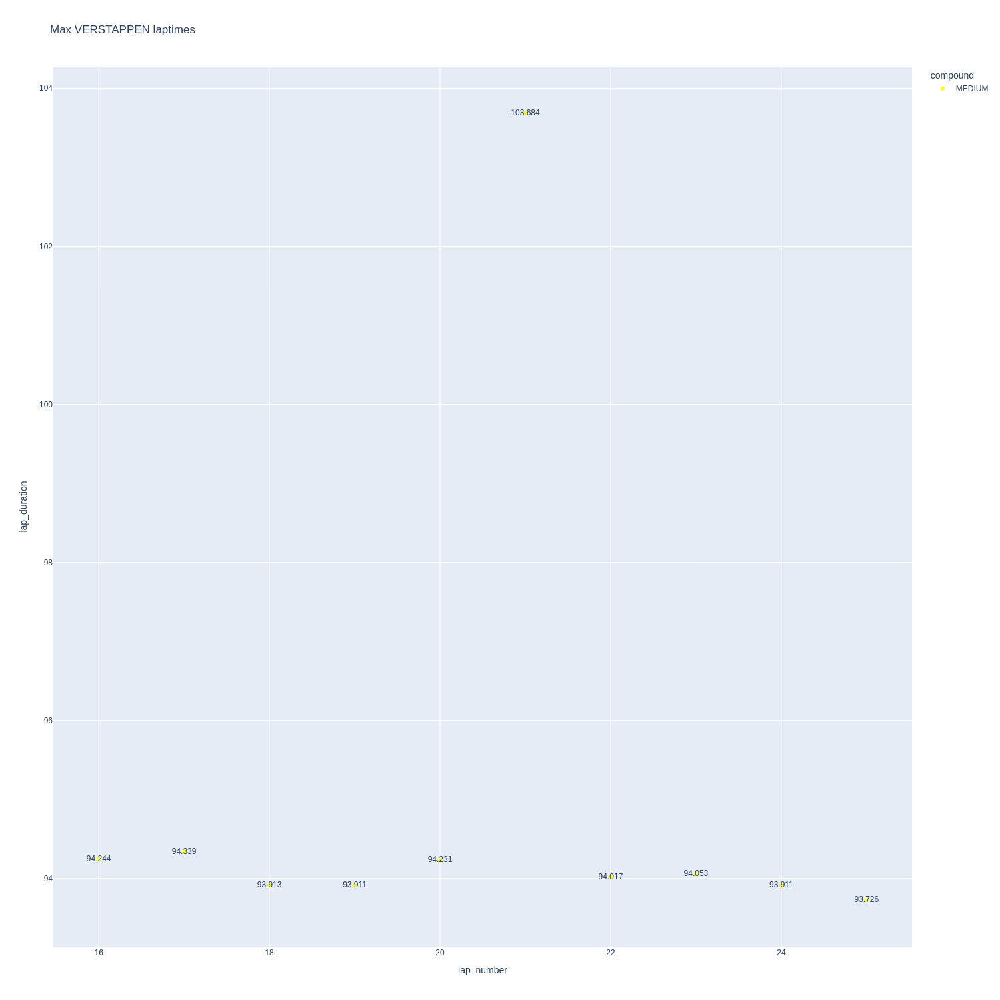

In [37]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

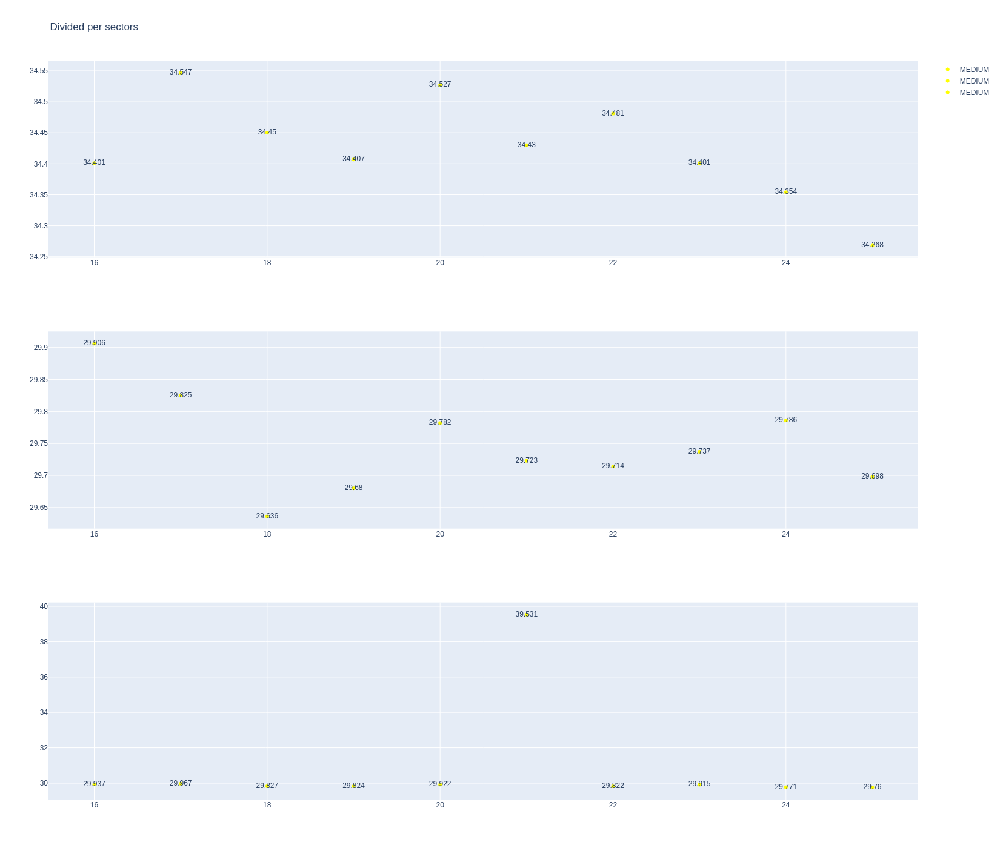

In [38]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

In [39]:
data = libraryDataF1.getinfolongruns(jointables2,11,'Red Bull Racing',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
265,Sergio PEREZ,MEDIUM,2024-03-07T17:47:50.069000+00:00,11,34.848,30.136,29.957,94.941
269,Sergio PEREZ,MEDIUM,2024-03-07T17:49:24.978000+00:00,12,34.562,29.922,29.731,94.215
276,Sergio PEREZ,MEDIUM,2024-03-07T17:50:59.270000+00:00,13,34.660,29.899,29.880,94.439
284,Sergio PEREZ,MEDIUM,2024-03-07T17:52:33.671000+00:00,14,34.576,29.996,29.746,94.318
299,Sergio PEREZ,MEDIUM,2024-03-07T17:54:08.066000+00:00,15,34.551,29.819,29.795,94.165
316,Sergio PEREZ,MEDIUM,2024-03-07T17:55:42.209000+00:00,16,34.800,29.895,29.959,94.654
333,Sergio PEREZ,MEDIUM,2024-03-07T17:57:16.841000+00:00,17,35.065,29.992,29.961,95.018
353,Sergio PEREZ,MEDIUM,2024-03-07T17:58:51.829000+00:00,18,34.842,29.757,29.592,94.191
373,Sergio PEREZ,MEDIUM,2024-03-07T18:00:25.990000+00:00,19,35.587,29.826,30.055,95.468
393,Sergio PEREZ,MEDIUM,2024-03-07T18:02:01.641000+00:00,20,34.893,29.874,29.883,94.650


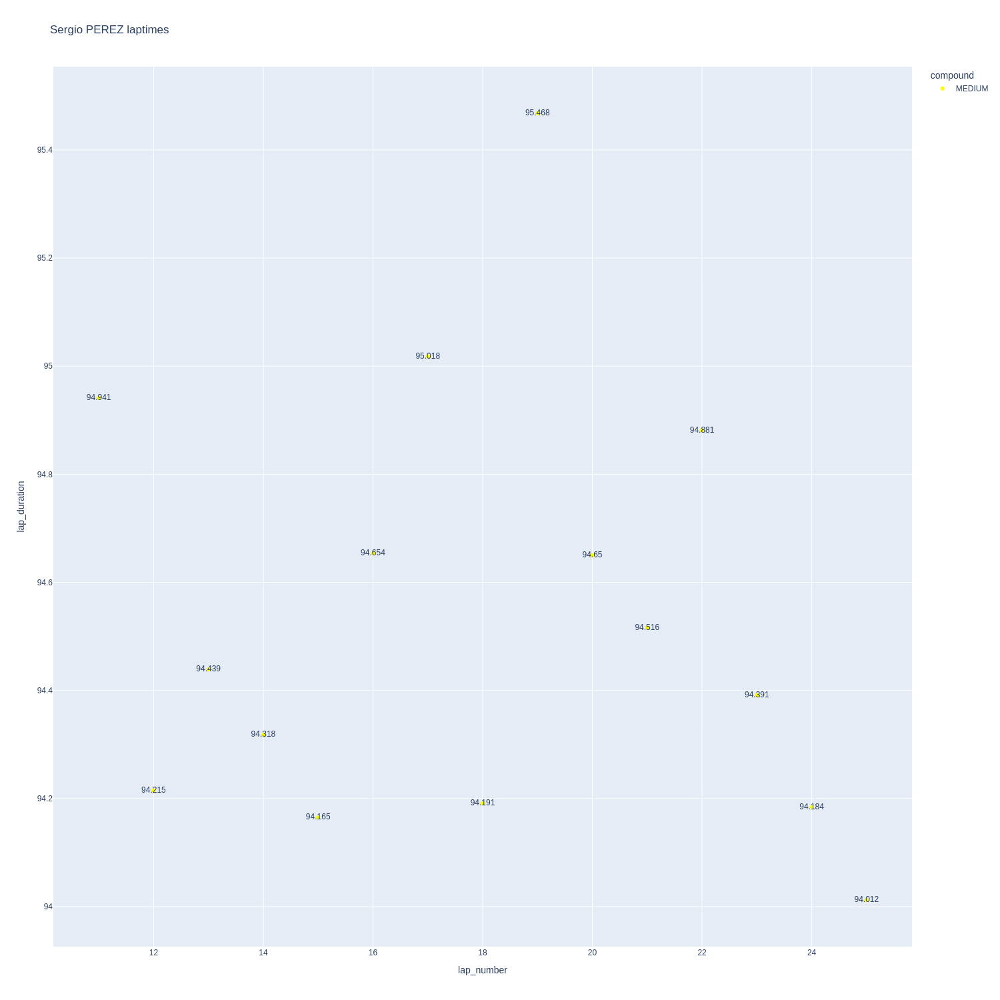

In [40]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

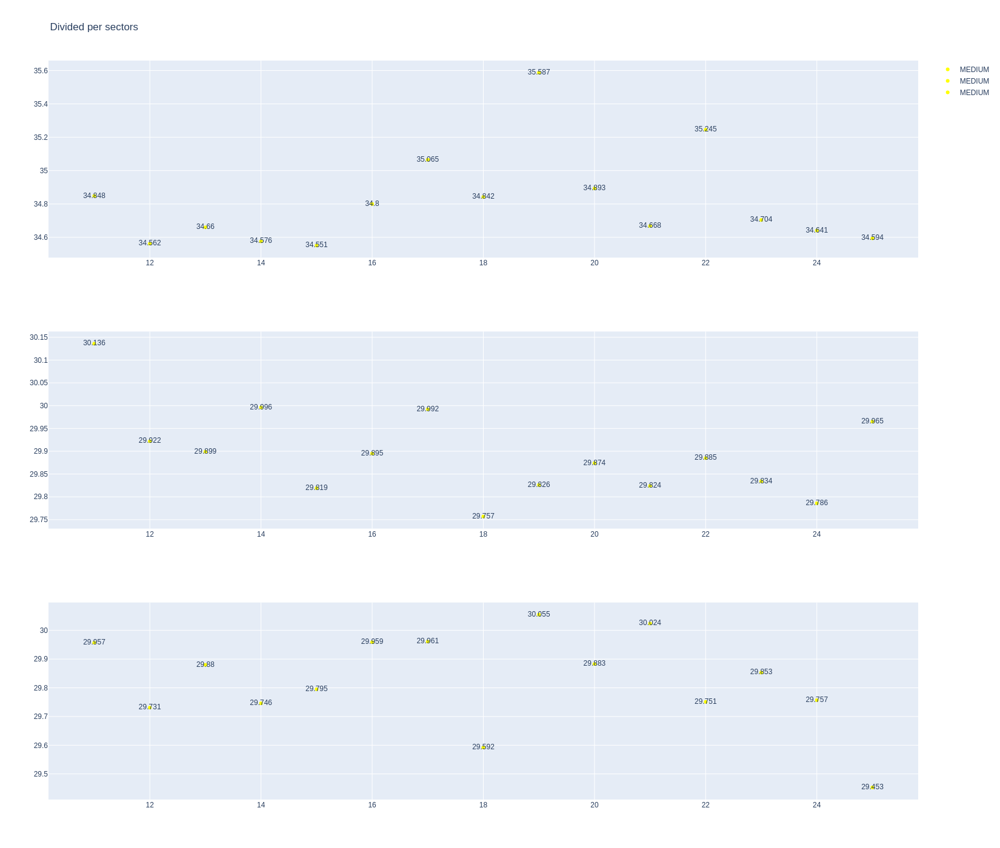

In [41]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

#### Ferrari

In [42]:
stintInformation.query('driver_number == 55 or driver_number == 16')

,meeting_key,session_key,stint_number,driver_number,lap_start,lap_end,compound,tyre_age_at_start
9,1230,9474,1,16,1,8,MEDIUM,0
14,1230,9474,1,55,1,8,MEDIUM,0
28,1230,9474,2,16,9,11,SOFT,0
29,1230,9474,2,55,9,12,SOFT,0
45,1230,9474,3,16,12,13,SOFT,3
48,1230,9474,3,55,13,17,SOFT,4
51,1230,9474,4,16,14,23,SOFT,5
68,1230,9474,4,55,18,27,MEDIUM,7
73,1230,9474,5,16,24,26,MEDIUM,7


In [43]:
data = libraryDataF1.getinfolongruns(jointables2,16,'Ferrari',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
234,Charles LECLERC,SOFT,2024-03-07T17:41:52+00:00,12,32.689,28.406,33.670,94.765
311,Charles LECLERC,SOFT,2024-03-07T17:55:19.152000+00:00,14,34.768,30.295,30.199,95.262
327,Charles LECLERC,SOFT,2024-03-07T17:56:54.457000+00:00,15,34.617,29.992,30.038,94.647
347,Charles LECLERC,SOFT,2024-03-07T17:58:29.068000+00:00,16,34.666,29.875,29.888,94.429
366,Charles LECLERC,SOFT,2024-03-07T18:00:03.654000+00:00,17,34.733,29.882,30.081,94.696
385,Charles LECLERC,SOFT,2024-03-07T18:01:38.308000+00:00,18,34.350,29.866,30.004,94.220
405,Charles LECLERC,SOFT,2024-03-07T18:03:12.368000+00:00,19,34.374,29.972,30.048,94.394
425,Charles LECLERC,SOFT,2024-03-07T18:04:46.895000+00:00,20,34.346,30.004,30.186,94.536
444,Charles LECLERC,SOFT,2024-03-07T18:06:21.391000+00:00,21,34.321,29.745,29.820,93.886
463,Charles LECLERC,SOFT,2024-03-07T18:07:55.144000+00:00,22,34.641,30.449,33.240,98.330


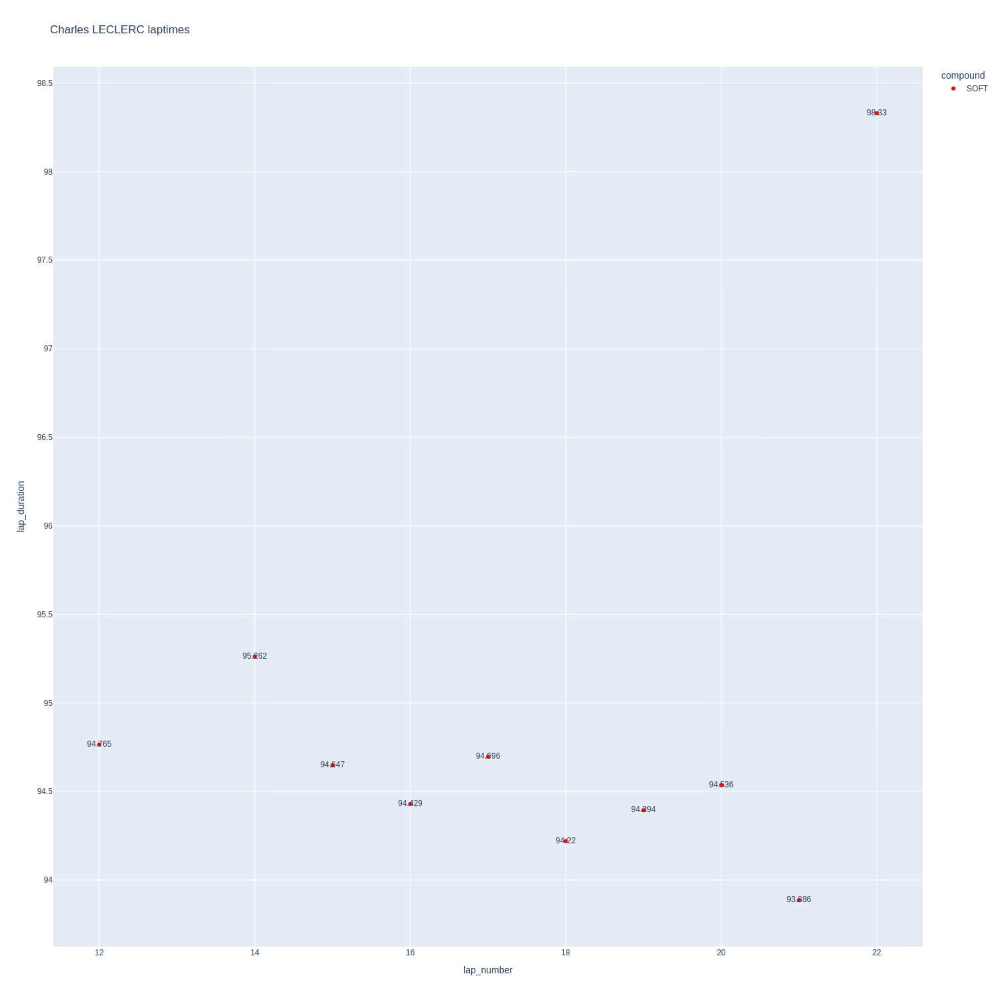

In [44]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

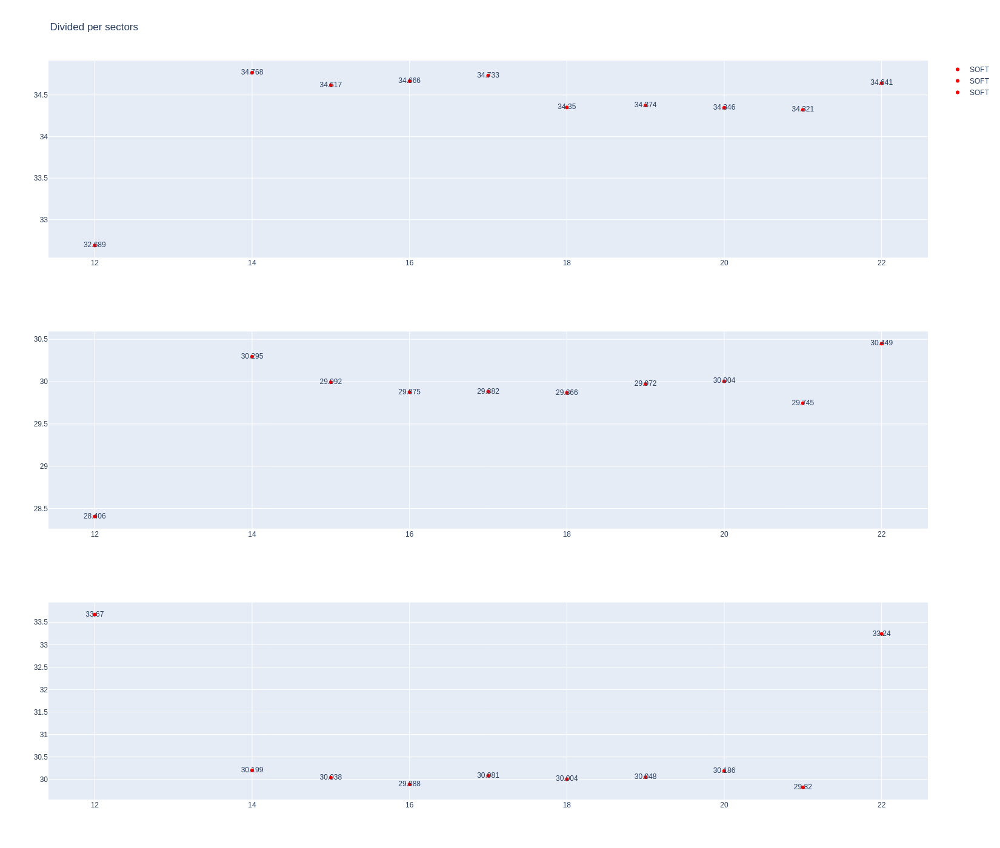

In [45]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

In [46]:
data = libraryDataF1.getinfolongruns(jointables2,55,'Ferrari',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
364,Carlos SAINZ,MEDIUM,2024-03-07T17:59:53.391000+00:00,18,35.029,30.031,30.176,95.236
383,Carlos SAINZ,MEDIUM,2024-03-07T18:01:28.691000+00:00,19,34.887,30.046,30.161,95.094
403,Carlos SAINZ,MEDIUM,2024-03-07T18:03:03.770000+00:00,20,34.778,29.982,30.193,94.953
423,Carlos SAINZ,MEDIUM,2024-03-07T18:04:38.810000+00:00,21,34.534,29.877,30.174,94.585
442,Carlos SAINZ,MEDIUM,2024-03-07T18:06:13.389000+00:00,22,34.420,29.933,30.103,94.456
461,Carlos SAINZ,MEDIUM,2024-03-07T18:07:47.752000+00:00,23,34.306,29.878,29.936,94.120


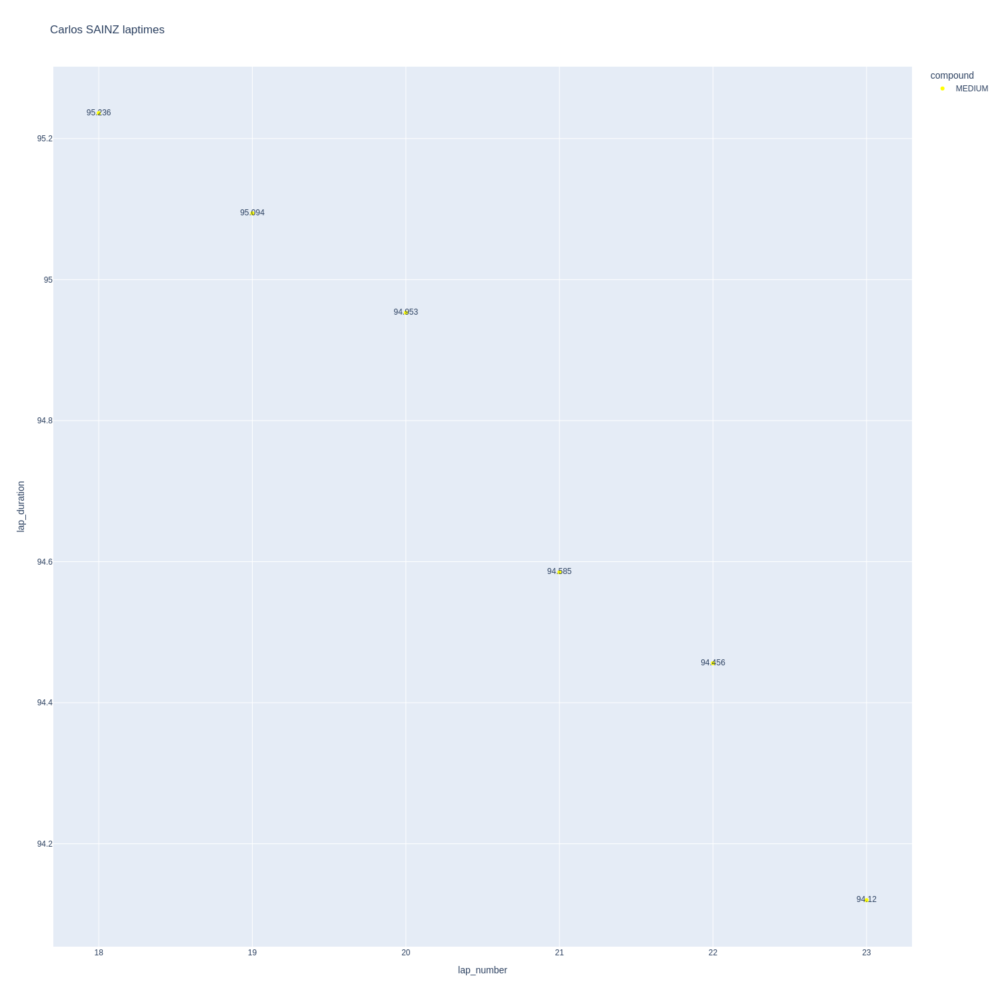

In [47]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

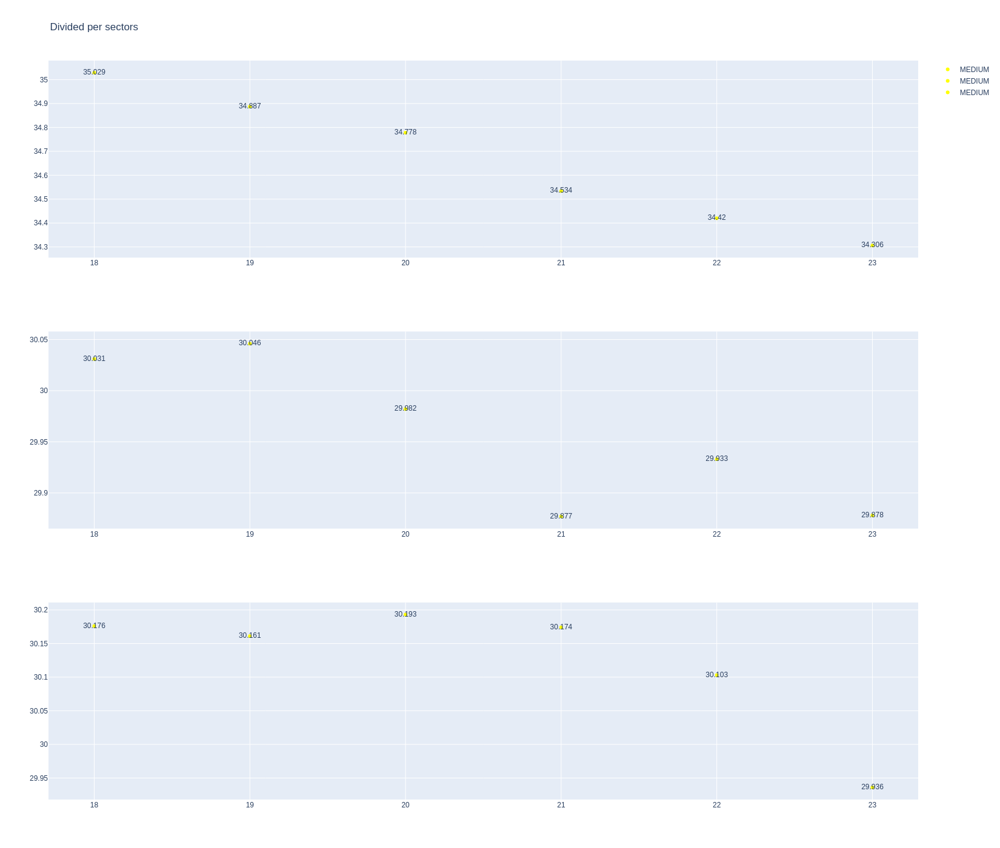

In [48]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

#### Mercedes

In [49]:
stintInformation.query('driver_number == 63 or driver_number == 44')

,meeting_key,session_key,stint_number,driver_number,lap_start,lap_end,compound,tyre_age_at_start
0,1230,9474,1,63,1,3,MEDIUM,0
18,1230,9474,1,44,1,9,MEDIUM,0
20,1230,9474,2,63,4,9,MEDIUM,2
39,1230,9474,2,44,10,14,SOFT,0
41,1230,9474,3,63,10,16,SOFT,0
55,1230,9474,3,44,15,20,MEDIUM,8
64,1230,9474,4,63,17,19,MEDIUM,8
71,1230,9474,5,63,20,25,MEDIUM,11
72,1230,9474,4,44,21,23,MEDIUM,14


In [50]:
data = libraryDataF1.getinfolongruns(jointables2,44,'Mercedes',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
257,Lewis HAMILTON,SOFT,2024-03-07T17:46:18.619000+00:00,13,32.742,29.732,33.074,95.548
329,Lewis HAMILTON,MEDIUM,2024-03-07T17:57:02.240000+00:00,15,34.992,29.554,30.082,94.628
349,Lewis HAMILTON,MEDIUM,2024-03-07T17:58:36.820000+00:00,16,34.878,29.723,30.019,94.620
368,Lewis HAMILTON,MEDIUM,2024-03-07T18:00:11.560000+00:00,17,35.492,29.902,32.384,97.778
388,Lewis HAMILTON,MEDIUM,2024-03-07T18:01:49.247000+00:00,18,34.698,29.799,29.991,94.488


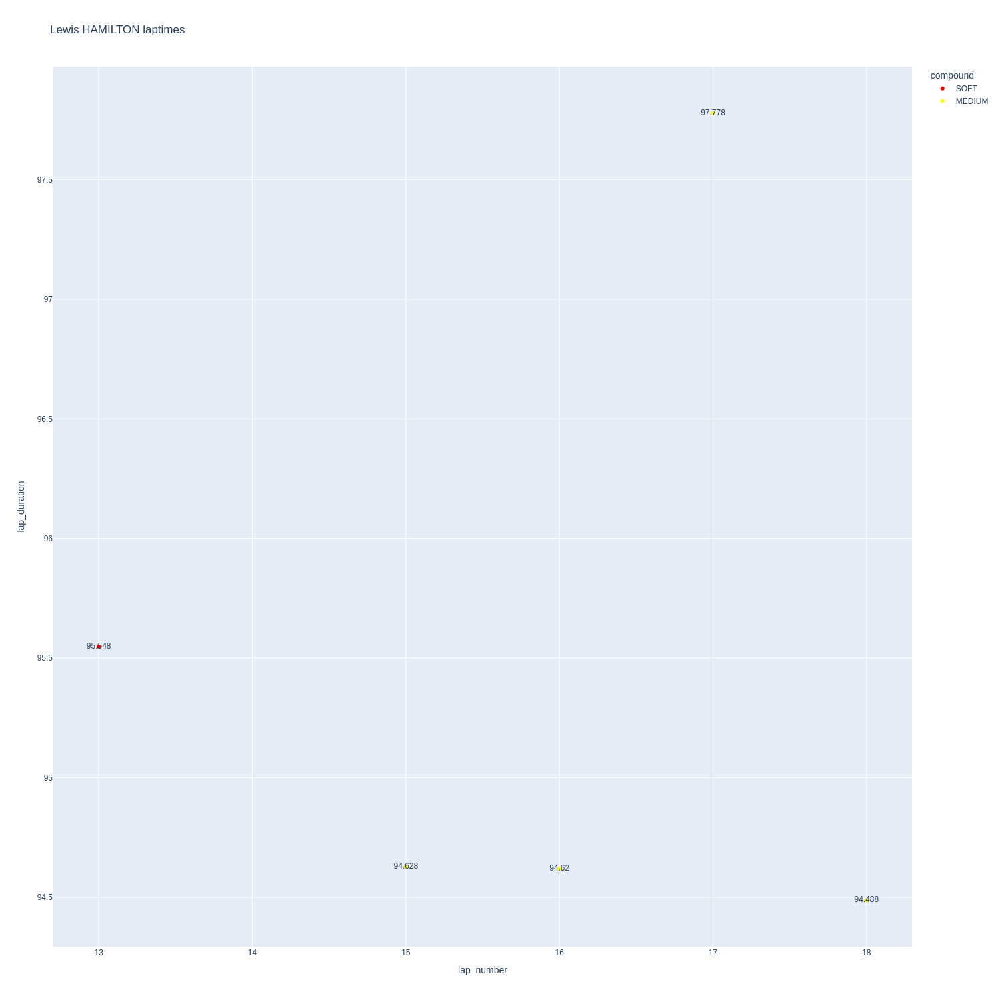

In [51]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

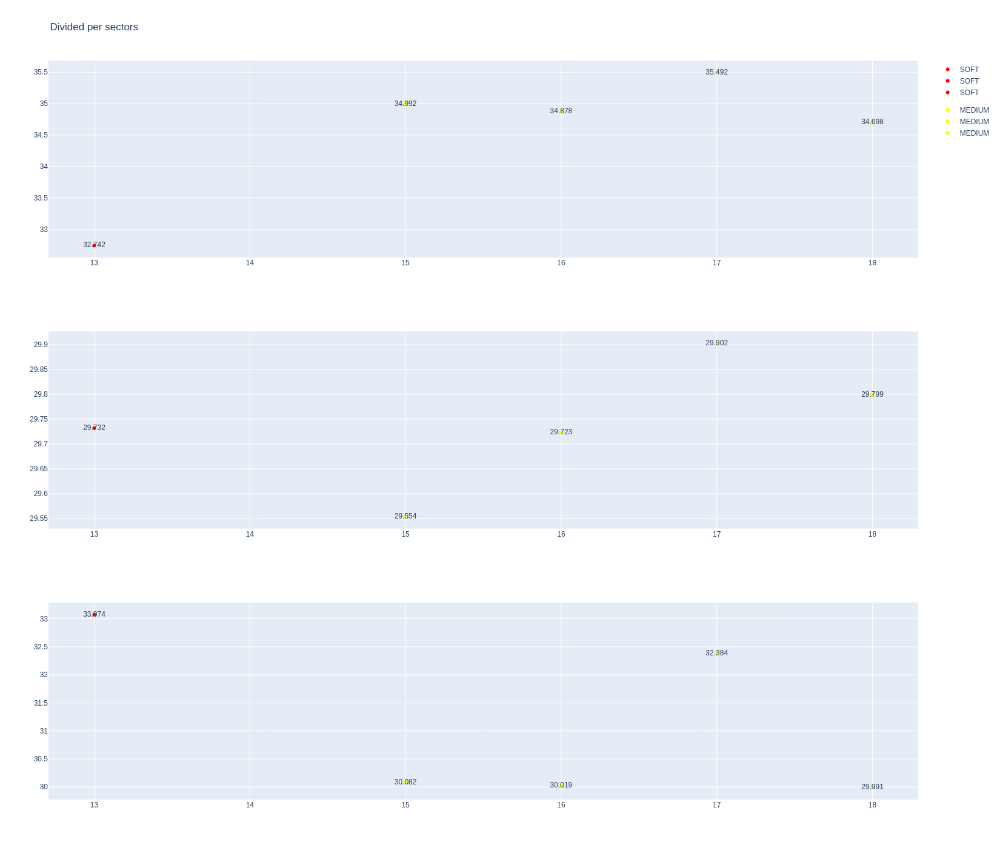

In [52]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

In [53]:
data = libraryDataF1.getinfolongruns(jointables2,63,'Mercedes',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
45,George RUSSELL,MEDIUM,2024-03-07T17:14:03.342000+00:00,2,33.456,30.278,36.984,100.718
369,George RUSSELL,MEDIUM,2024-03-07T18:00:16.167000+00:00,17,34.796,29.691,29.734,94.221
389,George RUSSELL,MEDIUM,2024-03-07T18:01:50.524000+00:00,18,34.825,29.563,32.156,96.544
432,George RUSSELL,MEDIUM,2024-03-07T18:05:20.008000+00:00,20,35.025,29.670,29.972,94.667
450,George RUSSELL,MEDIUM,2024-03-07T18:06:54.667000+00:00,21,34.922,29.724,29.831,94.477
468,George RUSSELL,MEDIUM,2024-03-07T18:08:29.123000+00:00,22,34.751,29.622,29.901,94.274


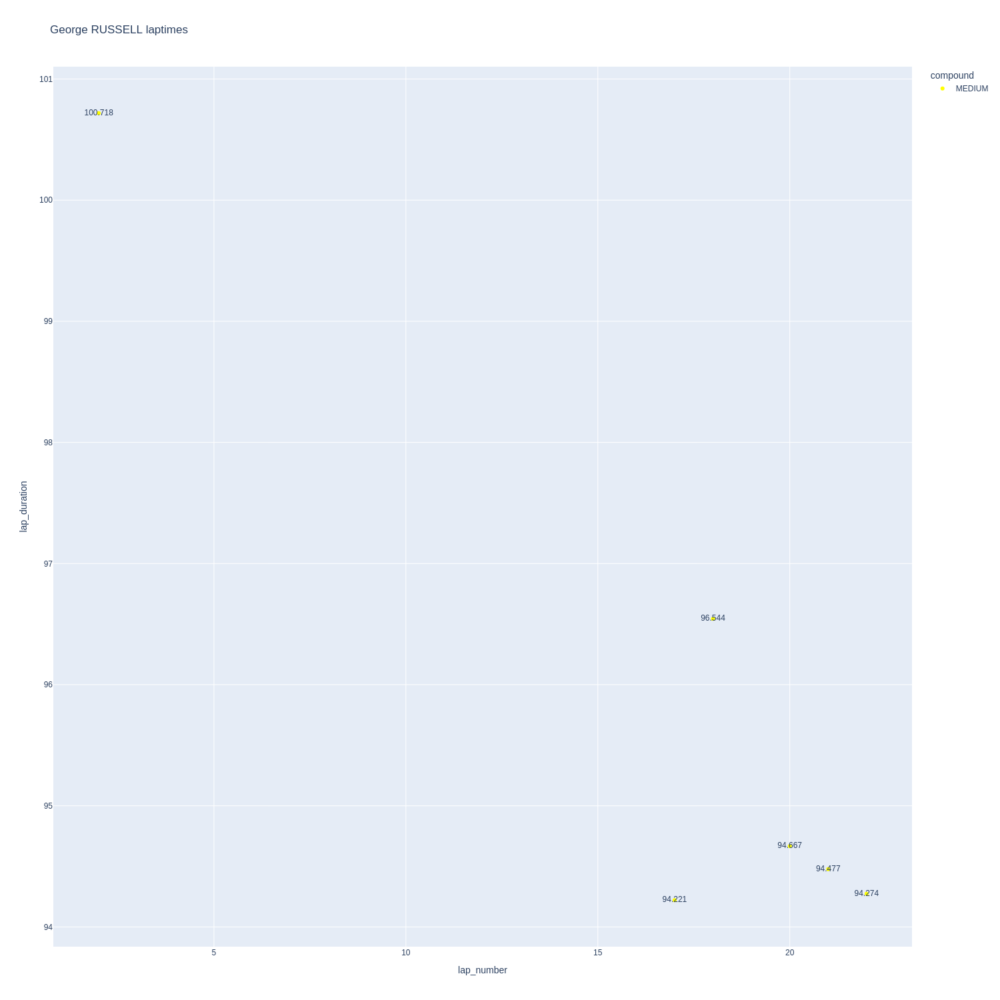

In [54]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

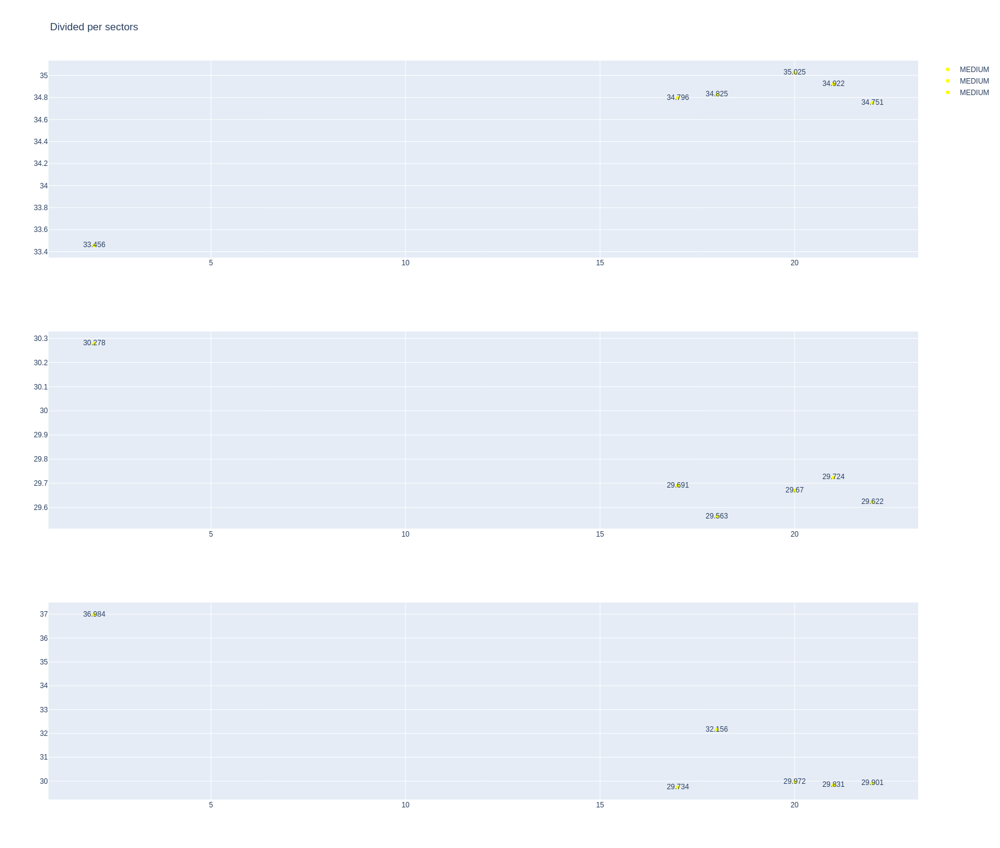

In [55]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

#### McLaren

In [56]:
stintInformation.query('driver_number == 81 or driver_number == 4')

,meeting_key,session_key,stint_number,driver_number,lap_start,lap_end,compound,tyre_age_at_start
3,1230,9474,1,81,1,5,MEDIUM,0
4,1230,9474,1,4,1,6,HARD,0
23,1230,9474,2,81,6,9,MEDIUM,4
24,1230,9474,2,4,7,9,SOFT,0
37,1230,9474,3,4,10,14,SOFT,3
42,1230,9474,3,81,10,16,SOFT,0
54,1230,9474,4,4,15,16,SOFT,8
65,1230,9474,5,4,17,24,HARD,5
66,1230,9474,4,81,17,25,MEDIUM,8
76,1230,9474,5,81,26,28,SOFT,0


In [57]:
data = libraryDataF1.getinfolongruns(jointables2,4,'McLaren',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
280,Lando NORRIS,SOFT,2024-03-07T17:51:26.915000+00:00,13,32.572,28.445,36.889,97.906
363,Lando NORRIS,SOFT,2024-03-07T17:59:45.288000+00:00,15,34.274,29.799,32.410,96.483
406,Lando NORRIS,HARD,2024-03-07T18:03:14.157000+00:00,17,34.770,29.884,30.242,94.896
426,Lando NORRIS,HARD,2024-03-07T18:04:49.092000+00:00,18,34.734,29.892,30.124,94.750
445,Lando NORRIS,HARD,2024-03-07T18:06:23.812000+00:00,19,34.726,30.129,30.110,94.965
464,Lando NORRIS,HARD,2024-03-07T18:07:58.767000+00:00,20,34.555,29.814,30.105,94.474
483,Lando NORRIS,HARD,2024-03-07T18:09:33.400000+00:00,21,34.402,29.719,30.058,94.179


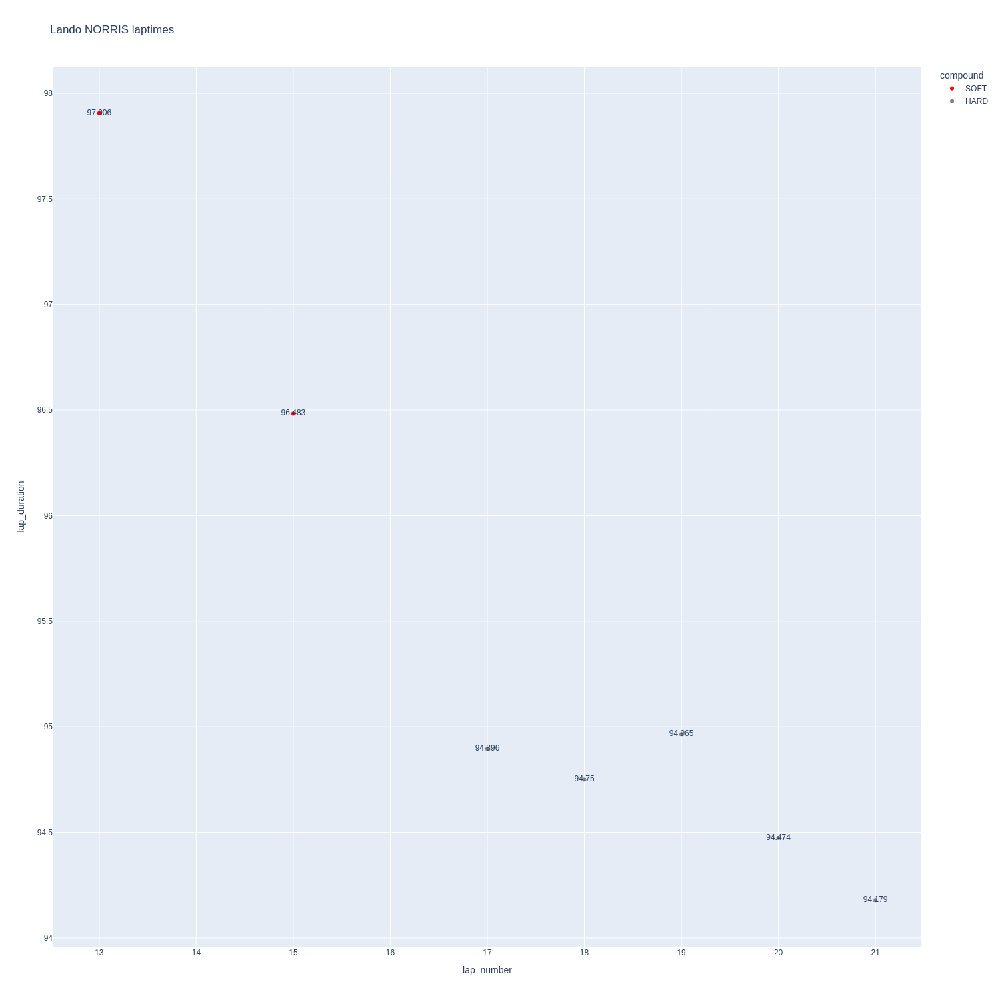

In [58]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

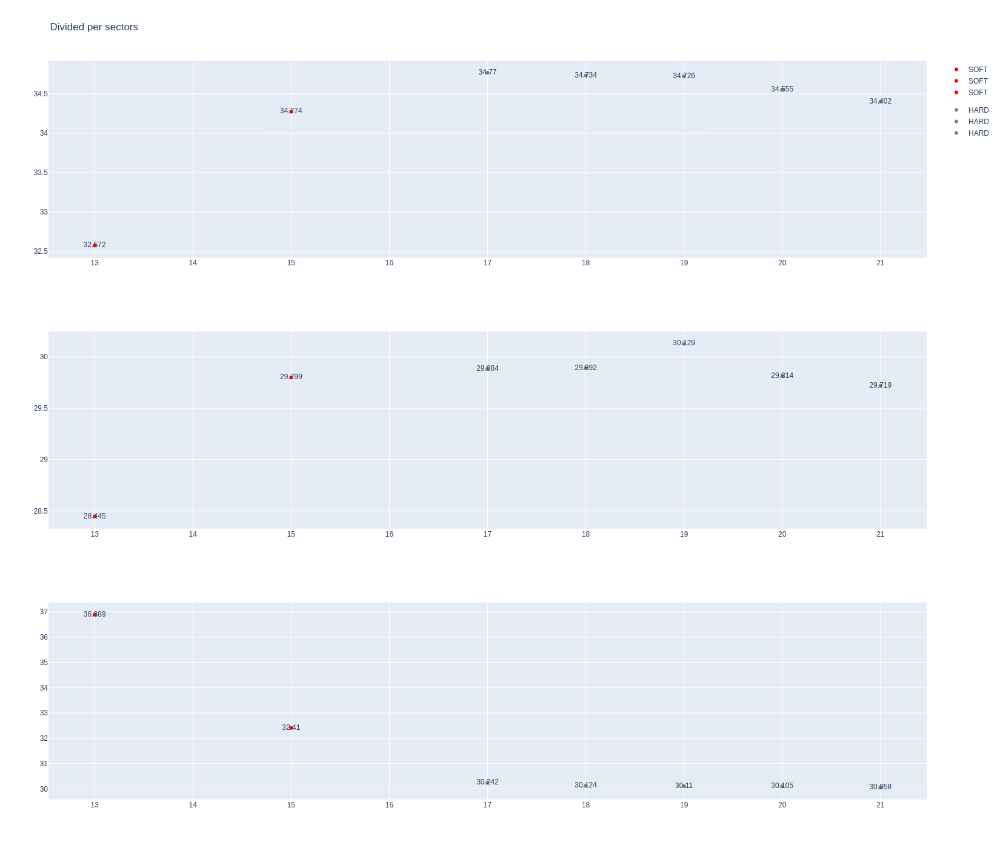

In [59]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

In [60]:
data = libraryDataF1.getinfolongruns(jointables2,81,'McLaren',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
259,Oscar PIASTRI,SOFT,2024-03-07T17:46:36.192000+00:00,15,32.866,28.398,31.838,93.102
314,Oscar PIASTRI,MEDIUM,2024-03-07T17:55:35.292000+00:00,17,34.707,29.826,30.214,94.747
331,Oscar PIASTRI,MEDIUM,2024-03-07T17:57:09.943000+00:00,18,34.575,29.826,30.013,94.414
351,Oscar PIASTRI,MEDIUM,2024-03-07T17:58:44.428000+00:00,19,34.883,29.929,30.242,95.054
371,Oscar PIASTRI,MEDIUM,2024-03-07T18:00:19.408000+00:00,20,35.014,29.884,30.287,95.185
391,Oscar PIASTRI,MEDIUM,2024-03-07T18:01:54.528000+00:00,21,35.087,29.844,30.248,95.179
410,Oscar PIASTRI,MEDIUM,2024-03-07T18:03:29.722000+00:00,22,35.250,30.168,30.953,96.371
428,Oscar PIASTRI,MEDIUM,2024-03-07T18:05:06.191000+00:00,23,34.979,29.924,30.238,95.141
447,Oscar PIASTRI,MEDIUM,2024-03-07T18:06:41.323000+00:00,24,34.526,29.969,32.882,97.377


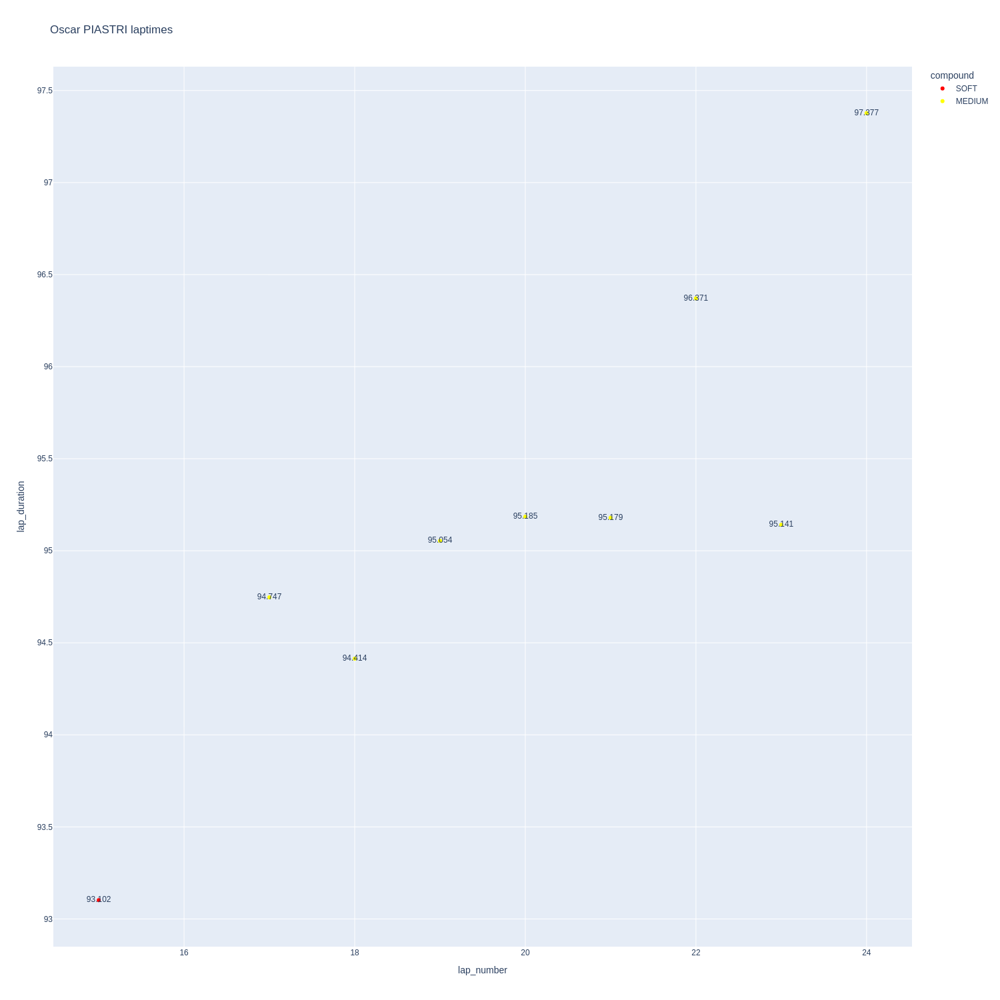

In [61]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

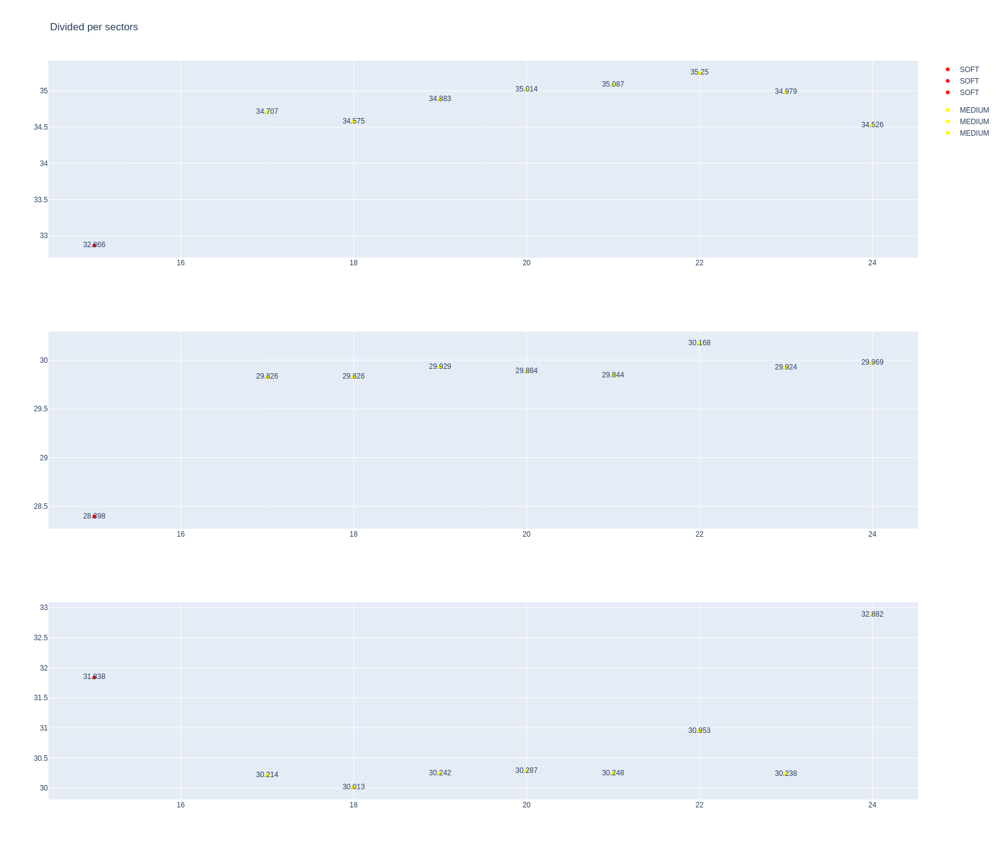

In [62]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

#### Aston Martin

In [63]:
stintInformation.query('driver_number == 18 or driver_number == 14')

,meeting_key,session_key,stint_number,driver_number,lap_start,lap_end,compound,tyre_age_at_start
8,1230,9474,1,14,1,8,MEDIUM,0
10,1230,9474,1,18,1,8,MEDIUM,0
32,1230,9474,2,14,9,14,SOFT,0
33,1230,9474,2,18,9,14,SOFT,0
56,1230,9474,3,18,15,25,MEDIUM,7
57,1230,9474,3,14,15,29,MEDIUM,7
75,1230,9474,4,18,26,28,SOFT,6


In [64]:
data = libraryDataF1.getinfolongruns(jointables2,14,'Aston Martin',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
218,Fernando ALONSO,SOFT,2024-03-07T17:39:45.201000+00:00,12,32.604,36.296,37.967,106.867
231,Fernando ALONSO,SOFT,2024-03-07T17:41:32.143000+00:00,13,32.287,29.094,35.949,97.330
279,Fernando ALONSO,MEDIUM,2024-03-07T17:51:19.635000+00:00,15,34.750,29.720,30.148,94.618
289,Fernando ALONSO,MEDIUM,2024-03-07T17:52:55.025000+00:00,16,34.766,29.889,30.094,94.749
305,Fernando ALONSO,MEDIUM,2024-03-07T17:54:28.930000+00:00,17,34.645,29.758,30.103,94.506
321,Fernando ALONSO,MEDIUM,2024-03-07T17:56:03.393000+00:00,18,34.723,29.782,30.205,94.710
338,Fernando ALONSO,MEDIUM,2024-03-07T17:57:38.208000+00:00,19,34.710,29.799,30.128,94.637
358,Fernando ALONSO,MEDIUM,2024-03-07T17:59:12.767000+00:00,20,34.906,29.654,29.964,94.524
377,Fernando ALONSO,MEDIUM,2024-03-07T18:00:47.350000+00:00,21,35.025,29.717,30.236,94.978
397,Fernando ALONSO,MEDIUM,2024-03-07T18:02:22.351000+00:00,22,35.399,30.112,34.726,100.237


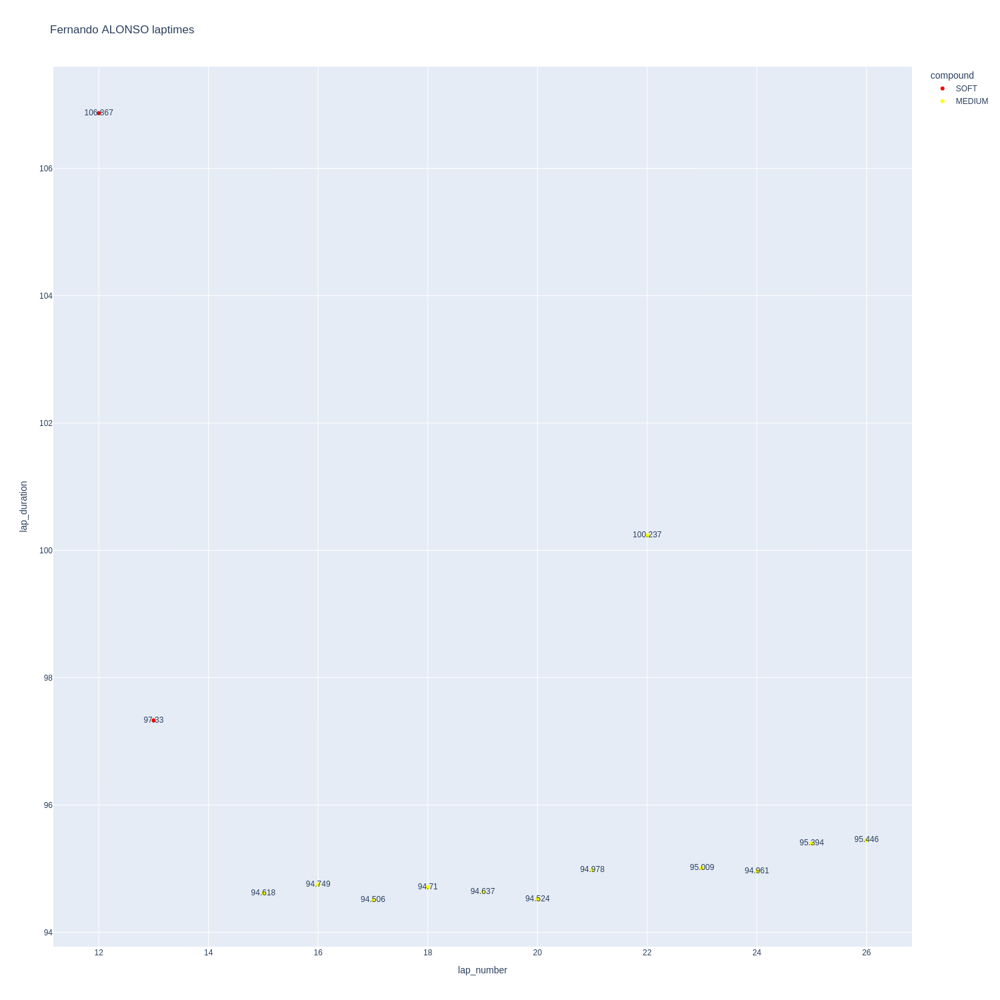

In [65]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

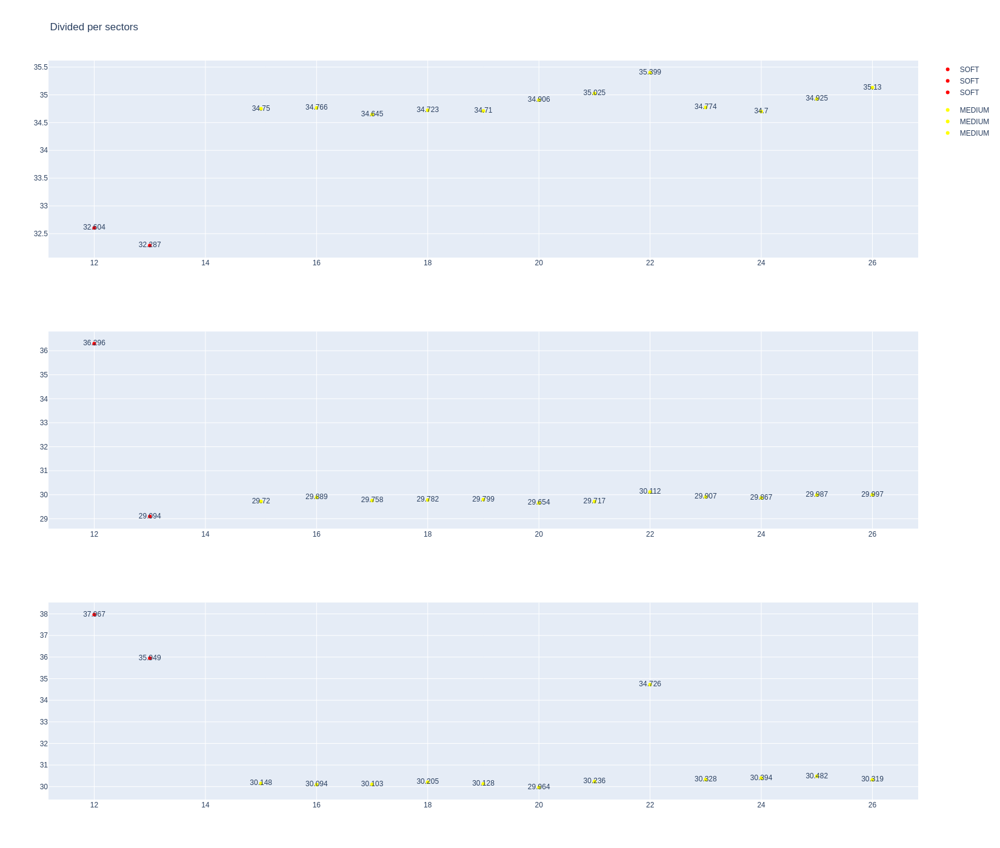

In [66]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

In [67]:
data = libraryDataF1.getinfolongruns(jointables2,18,'Aston Martin',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
291,Lance STROLL,MEDIUM,2024-03-07T17:53:01.223000+00:00,15,34.912,29.916,30.118,94.946
306,Lance STROLL,MEDIUM,2024-03-07T17:54:36.119000+00:00,16,35.033,29.912,30.099,95.044
322,Lance STROLL,MEDIUM,2024-03-07T17:56:11.308000+00:00,17,34.833,29.951,30.286,95.070
339,Lance STROLL,MEDIUM,2024-03-07T17:57:46.290000+00:00,18,34.695,29.858,30.114,94.667
359,Lance STROLL,MEDIUM,2024-03-07T17:59:20.986000+00:00,19,35.053,30.002,30.420,95.475
379,Lance STROLL,MEDIUM,2024-03-07T18:00:56.688000+00:00,20,34.899,30.085,30.415,95.399
399,Lance STROLL,MEDIUM,2024-03-07T18:02:31.733000+00:00,21,35.249,30.380,30.534,96.163
419,Lance STROLL,MEDIUM,2024-03-07T18:04:07.950000+00:00,22,34.975,30.169,30.374,95.518
438,Lance STROLL,MEDIUM,2024-03-07T18:05:43.619000+00:00,23,34.987,30.233,30.438,95.658
457,Lance STROLL,MEDIUM,2024-03-07T18:07:19.164000+00:00,24,35.425,30.156,33.106,98.687


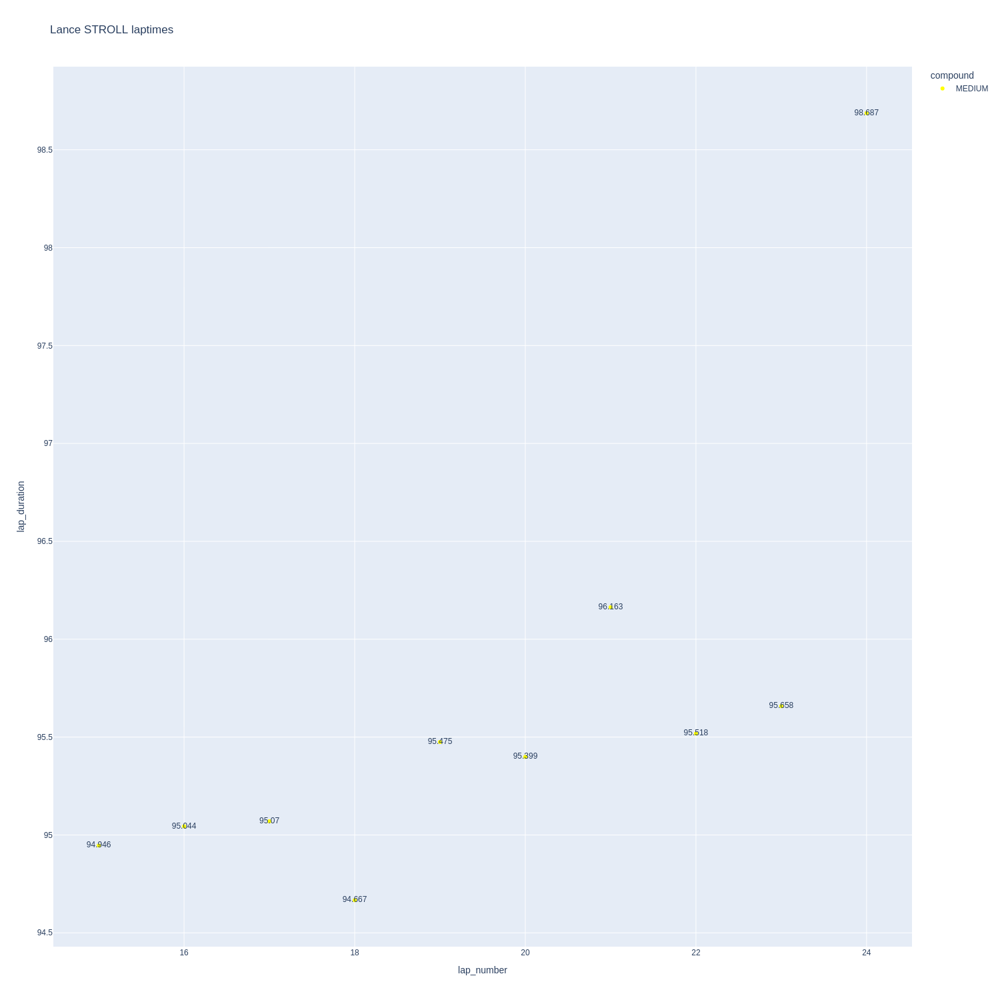

In [68]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

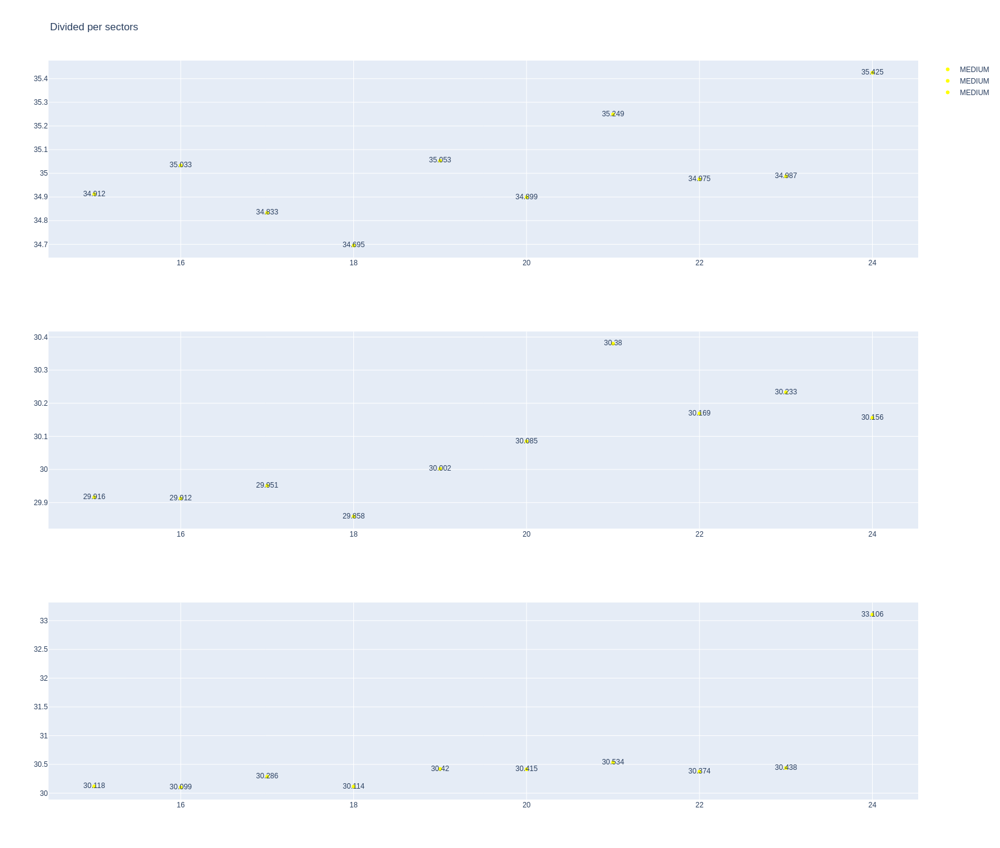

In [69]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

#### RB

In [70]:
stintInformation.query('driver_number == 3 or driver_number == 22')

,meeting_key,session_key,stint_number,driver_number,lap_start,lap_end,compound,tyre_age_at_start
16,1230,9474,1,22,1,9,SOFT,0
19,1230,9474,1,3,1,11,SOFT,0
38,1230,9474,2,22,10,14,SOFT,0
46,1230,9474,2,3,12,17,SOFT,0
58,1230,9474,3,22,15,29,SOFT,5
69,1230,9474,3,3,18,30,SOFT,6


In [71]:
data = libraryDataF1.getinfolongruns(jointables2,3,'RB',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
307,Daniel RICCIARDO,SOFT,2024-03-07T17:54:47.054000+00:00,18,34.975,29.931,30.055,94.961
324,Daniel RICCIARDO,SOFT,2024-03-07T17:56:22.064000+00:00,19,35.097,30.144,30.172,95.413
343,Daniel RICCIARDO,SOFT,2024-03-07T17:57:57.483000+00:00,20,34.738,29.872,30.072,94.682
361,Daniel RICCIARDO,SOFT,2024-03-07T17:59:32.065000+00:00,21,34.969,30.007,30.115,95.091
381,Daniel RICCIARDO,SOFT,2024-03-07T18:01:07.121000+00:00,22,34.974,29.902,30.004,94.880
401,Daniel RICCIARDO,SOFT,2024-03-07T18:02:42.064000+00:00,23,35.080,30.061,30.059,95.200
421,Daniel RICCIARDO,SOFT,2024-03-07T18:04:17.201000+00:00,24,35.106,30.189,30.123,95.418
440,Daniel RICCIARDO,SOFT,2024-03-07T18:05:52.706000+00:00,25,35.151,30.371,30.157,95.679
459,Daniel RICCIARDO,SOFT,2024-03-07T18:07:28.314000+00:00,26,35.210,30.381,30.296,95.887
477,Daniel RICCIARDO,SOFT,2024-03-07T18:09:04.225000+00:00,27,35.377,30.379,30.468,96.224


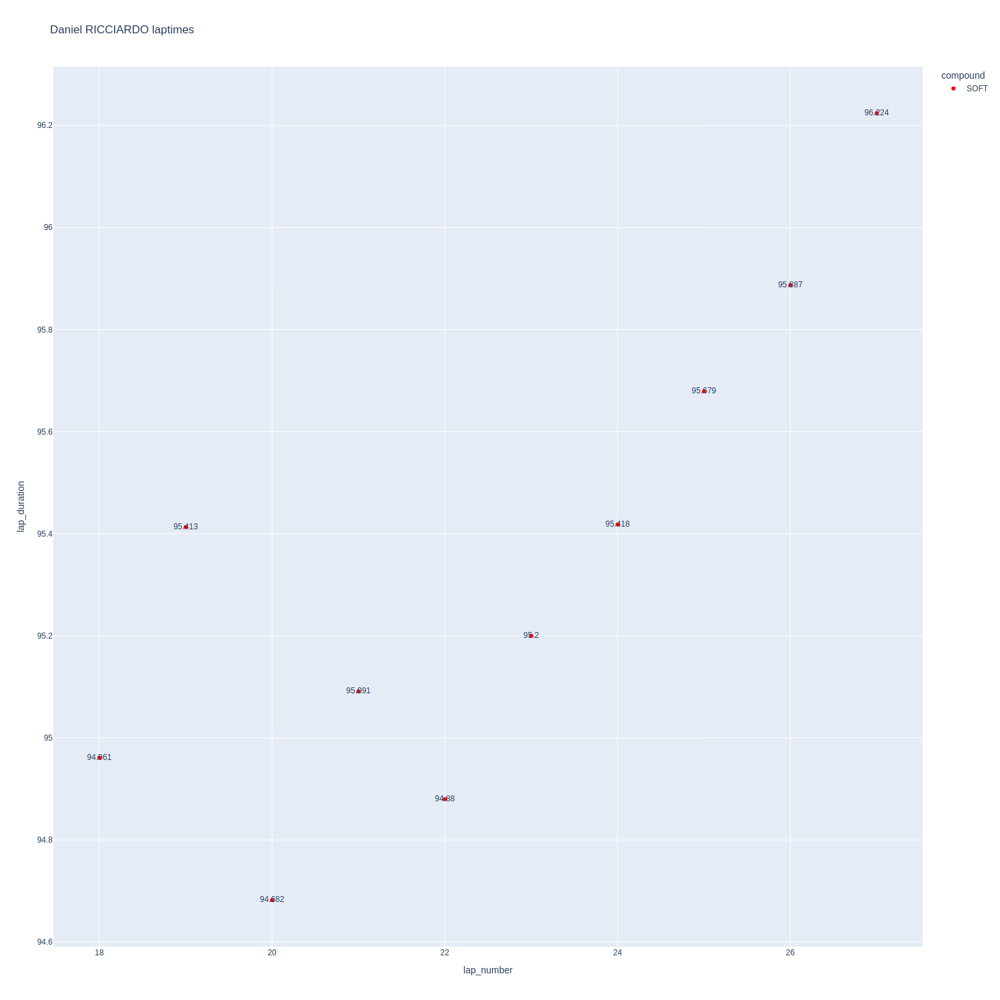

In [72]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

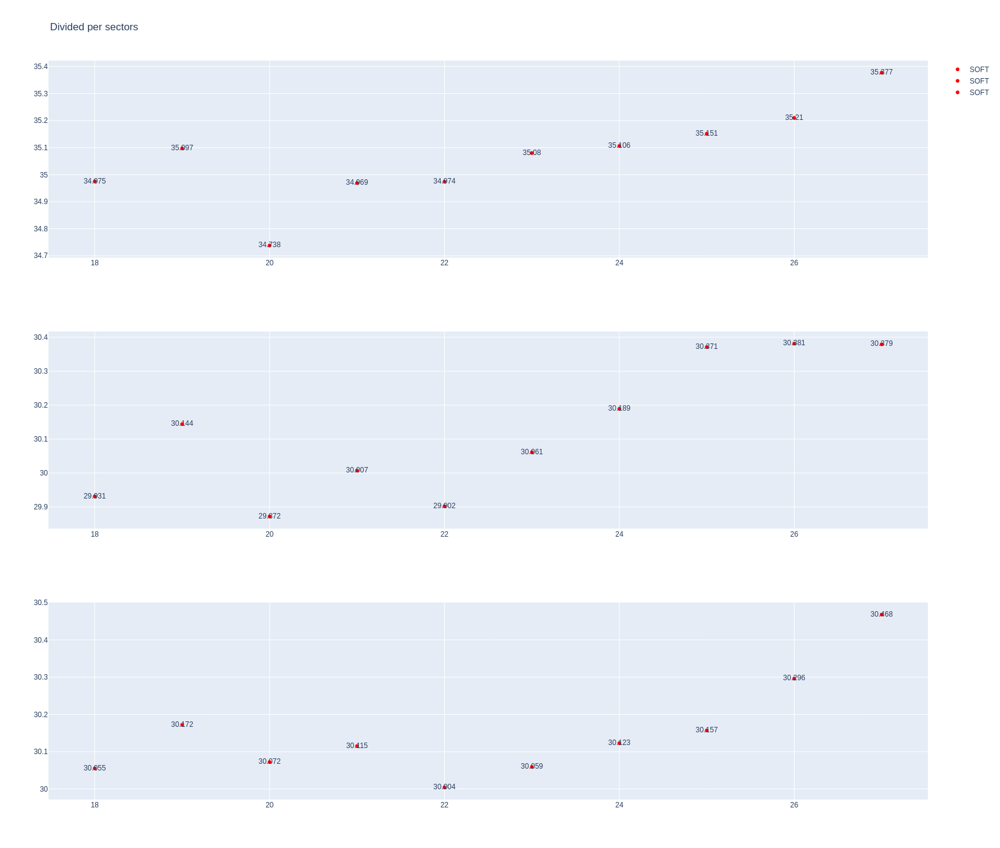

In [73]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

In [74]:
data = libraryDataF1.getinfolongruns(jointables2,22,'RB',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
232,Yuki TSUNODA,SOFT,2024-03-07T17:41:38.648000+00:00,13,33.030,28.784,34.748,96.562
278,Yuki TSUNODA,SOFT,2024-03-07T17:51:07.058000+00:00,15,35.520,30.114,30.263,95.897
287,Yuki TSUNODA,SOFT,2024-03-07T17:52:42.872000+00:00,16,35.627,30.358,30.418,96.403
302,Yuki TSUNODA,SOFT,2024-03-07T17:54:19.316000+00:00,17,35.626,30.223,30.345,96.194
319,Yuki TSUNODA,SOFT,2024-03-07T17:55:55.484000+00:00,18,35.450,30.201,30.341,95.992
336,Yuki TSUNODA,SOFT,2024-03-07T17:57:31.504000+00:00,19,35.172,29.983,30.120,95.275
356,Yuki TSUNODA,SOFT,2024-03-07T17:59:06.763000+00:00,20,35.496,30.047,30.208,95.751
375,Yuki TSUNODA,SOFT,2024-03-07T18:00:42.461000+00:00,21,35.049,30.003,30.127,95.179
395,Yuki TSUNODA,SOFT,2024-03-07T18:02:17.701000+00:00,22,35.085,30.199,30.078,95.362
415,Yuki TSUNODA,SOFT,2024-03-07T18:03:53.123000+00:00,23,35.093,30.048,30.211,95.352


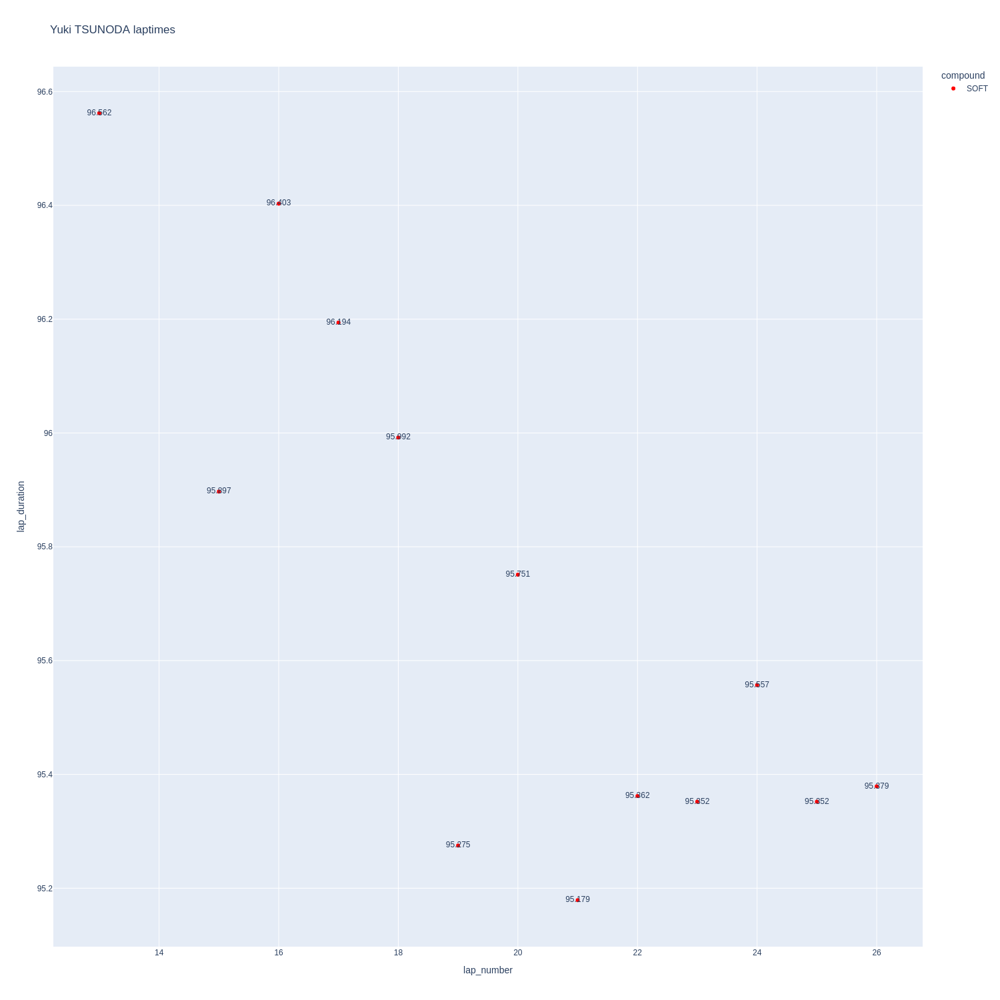

In [75]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

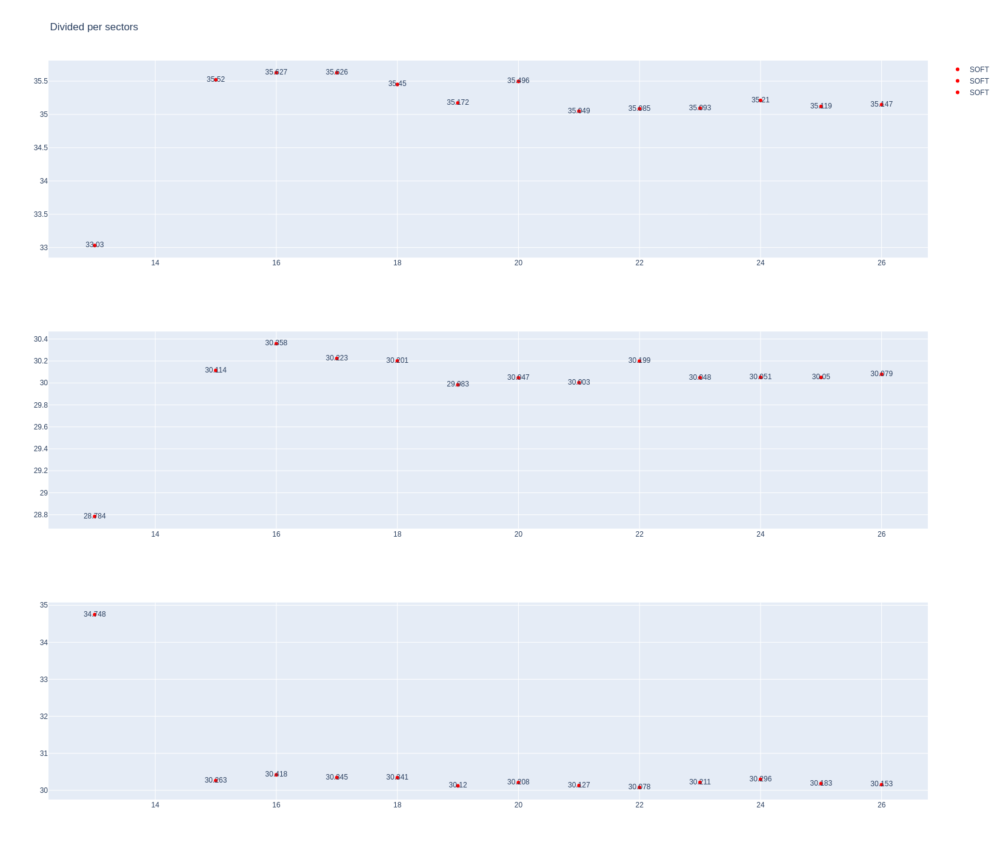

In [76]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

#### Haas

In [77]:
stintInformation.query('driver_number == 20 or driver_number == 27')

,meeting_key,session_key,stint_number,driver_number,lap_start,lap_end,compound,tyre_age_at_start
5,1230,9474,1,20,1,6,MEDIUM,0
17,1230,9474,1,27,1,9,HARD,0
25,1230,9474,2,20,7,11,SOFT,0
36,1230,9474,2,27,10,12,SOFT,0
47,1230,9474,3,20,12,25,SOFT,0
49,1230,9474,3,27,13,23,HARD,8
74,1230,9474,4,27,24,27,SOFT,0


In [78]:
data = libraryDataF1.getinfolongruns(jointables2,20,'Haas F1 Team',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
288,Kevin MAGNUSSEN,SOFT,2024-03-07T17:52:48.056000+00:00,12,35.905,30.172,30.262,96.339
304,Kevin MAGNUSSEN,SOFT,2024-03-07T17:54:25.208000+00:00,13,35.442,30.086,30.145,95.673
320,Kevin MAGNUSSEN,SOFT,2024-03-07T17:56:00.067000+00:00,14,35.131,30.017,30.355,95.503
337,Kevin MAGNUSSEN,SOFT,2024-03-07T17:57:35.487000+00:00,15,35.361,30.099,30.217,95.677
357,Kevin MAGNUSSEN,SOFT,2024-03-07T17:59:11.074000+00:00,16,34.866,29.951,30.234,95.051
376,Kevin MAGNUSSEN,SOFT,2024-03-07T18:00:46.170000+00:00,17,35.040,30.184,30.325,95.549
396,Kevin MAGNUSSEN,SOFT,2024-03-07T18:02:21.839000+00:00,18,34.983,30.030,30.184,95.197
416,Kevin MAGNUSSEN,SOFT,2024-03-07T18:03:57.065000+00:00,19,34.919,30.123,30.222,95.264
435,Kevin MAGNUSSEN,SOFT,2024-03-07T18:05:32.250000+00:00,20,34.827,30.080,30.252,95.159
453,Kevin MAGNUSSEN,SOFT,2024-03-07T18:07:07.414000+00:00,21,34.840,30.136,30.178,95.154


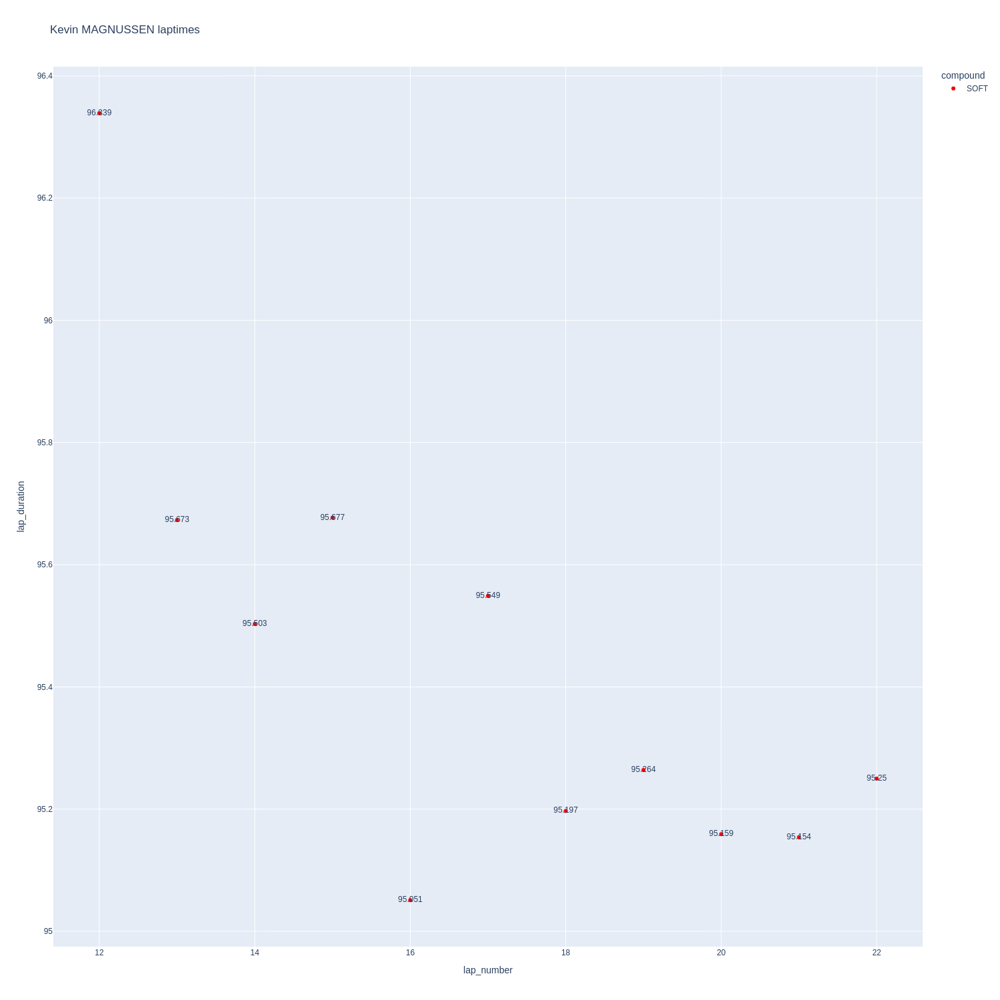

In [79]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

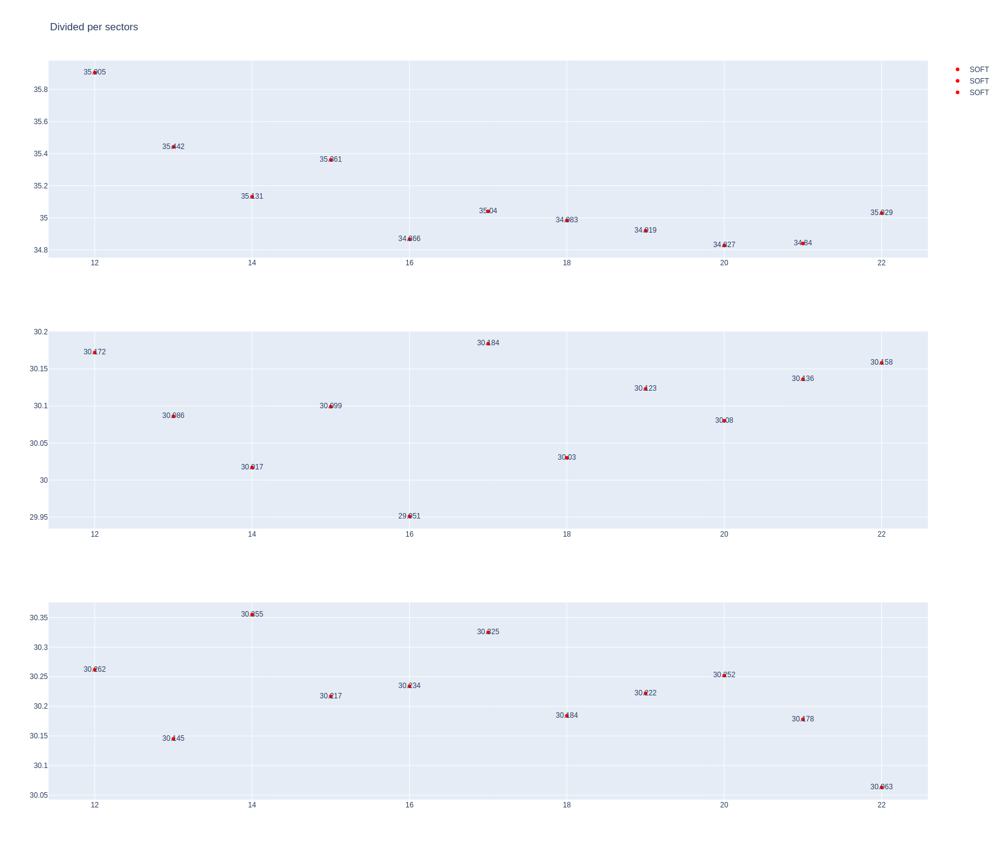

In [80]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

In [81]:
data = libraryDataF1.getinfolongruns(jointables2,27,'Haas F1 Team',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data


,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
274,Nico HULKENBERG,HARD,2024-03-07T17:50:52.657000+00:00,13,35.420,30.173,30.233,95.826
283,Nico HULKENBERG,HARD,2024-03-07T17:52:28.434000+00:00,14,35.084,30.096,30.087,95.267
298,Nico HULKENBERG,HARD,2024-03-07T17:54:03.710000+00:00,15,35.130,30.017,30.263,95.410
315,Nico HULKENBERG,HARD,2024-03-07T17:55:39.182000+00:00,16,35.134,30.040,30.192,95.366
332,Nico HULKENBERG,HARD,2024-03-07T17:57:14.437000+00:00,17,35.092,30.008,30.293,95.393
352,Nico HULKENBERG,HARD,2024-03-07T17:58:49.774000+00:00,18,35.253,30.042,30.312,95.607
372,Nico HULKENBERG,HARD,2024-03-07T18:00:25.507000+00:00,19,35.227,30.070,30.421,95.718
392,Nico HULKENBERG,HARD,2024-03-07T18:02:01.262000+00:00,20,36.510,30.194,30.329,97.033
412,Nico HULKENBERG,HARD,2024-03-07T18:03:38.165000+00:00,21,35.202,30.011,30.214,95.427
431,Nico HULKENBERG,HARD,2024-03-07T18:05:13.633000+00:00,22,35.160,29.955,33.170,98.285


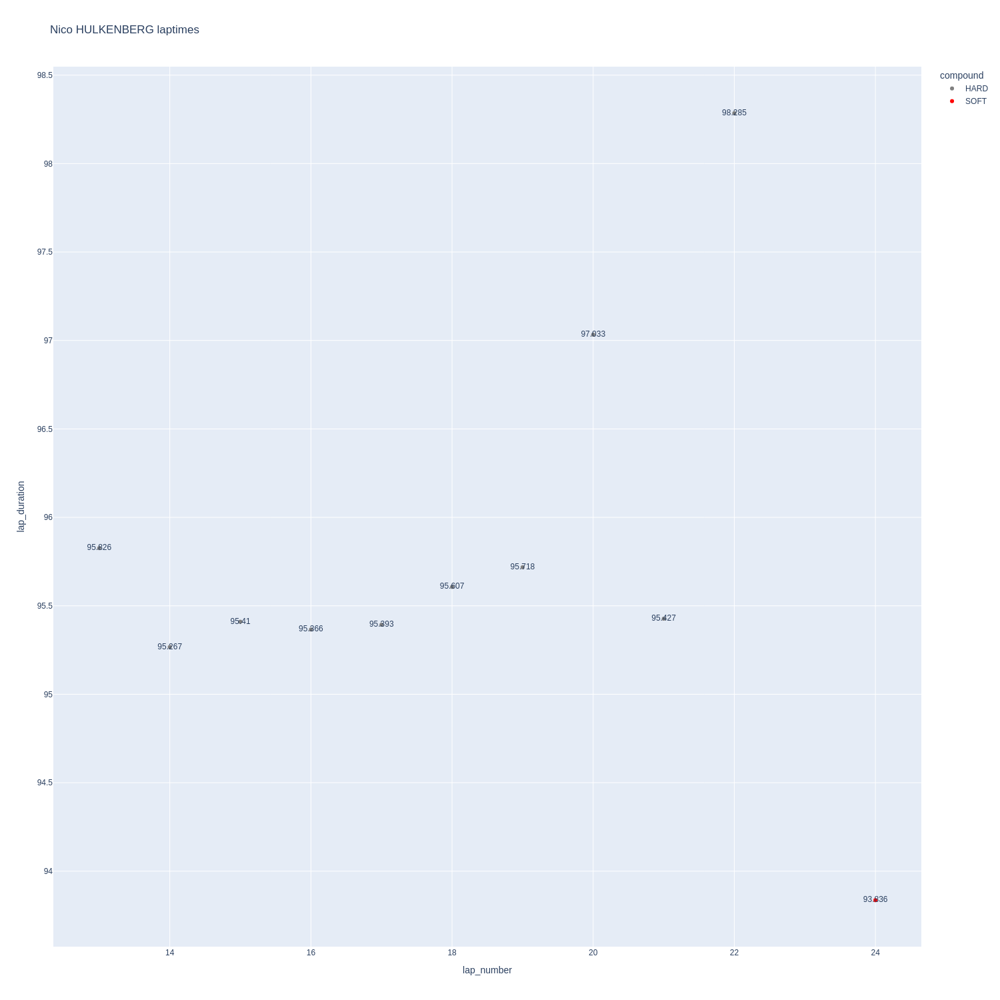

In [82]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

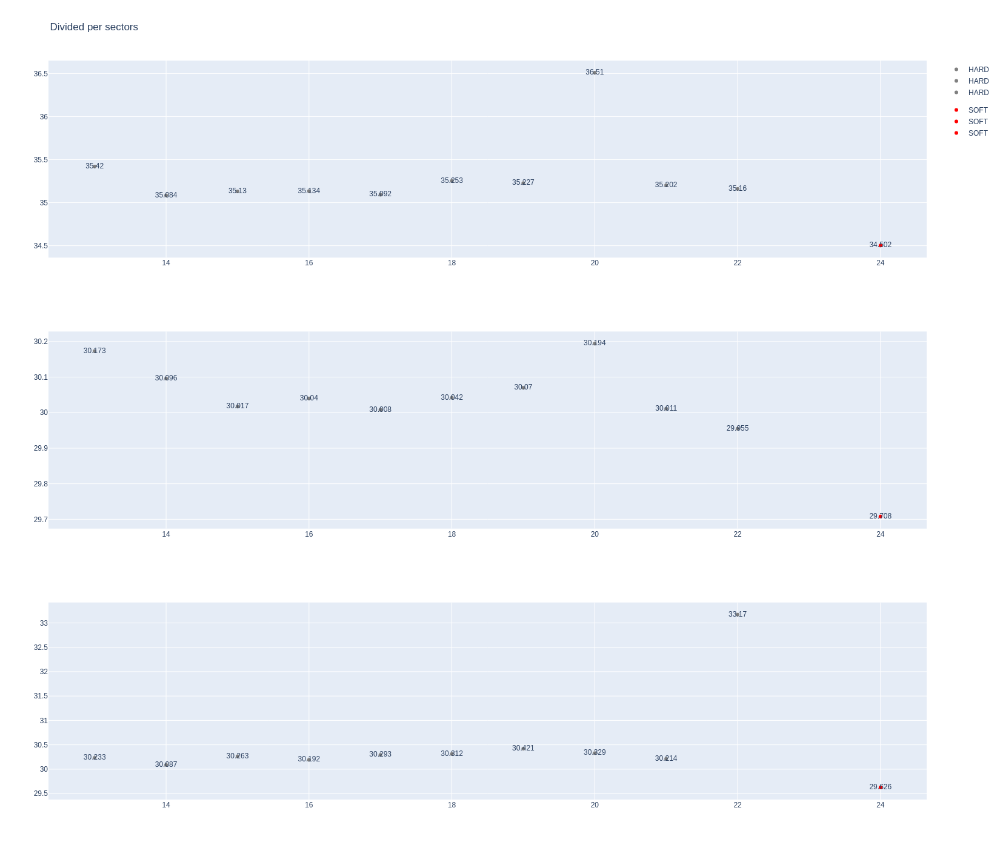

In [83]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

#### Alpine

In [84]:
stintInformation.query('driver_number == 10 or driver_number == 31')

,meeting_key,session_key,stint_number,driver_number,lap_start,lap_end,compound,tyre_age_at_start
13,1230,9474,1,31,1,8,MEDIUM,0
15,1230,9474,1,10,1,9,MEDIUM,0
35,1230,9474,2,31,9,16,SOFT,0
43,1230,9474,2,10,10,17,SOFT,0
67,1230,9474,3,31,17,28,MEDIUM,7
70,1230,9474,3,10,18,30,MEDIUM,8


In [85]:
data =libraryDataF1.getinfolongruns(jointables2,31,'Alpine',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
323,Esteban OCON,MEDIUM,2024-03-07T17:56:14.057000+00:00,17,35.103,30.084,30.665,95.852
341,Esteban OCON,MEDIUM,2024-03-07T17:57:49.870000+00:00,18,34.826,30.011,30.150,94.987
360,Esteban OCON,MEDIUM,2024-03-07T17:59:24.957000+00:00,19,34.795,29.968,30.136,94.899
380,Esteban OCON,MEDIUM,2024-03-07T18:00:59.805000+00:00,20,35.118,30.062,30.234,95.414
400,Esteban OCON,MEDIUM,2024-03-07T18:02:35.219000+00:00,21,34.944,29.998,30.697,95.639
420,Esteban OCON,MEDIUM,2024-03-07T18:04:10.877000+00:00,22,35.192,30.190,30.397,95.779
439,Esteban OCON,MEDIUM,2024-03-07T18:05:46.685000+00:00,23,35.214,30.131,30.303,95.648
458,Esteban OCON,MEDIUM,2024-03-07T18:07:22.292000+00:00,24,35.241,30.123,30.285,95.649
476,Esteban OCON,MEDIUM,2024-03-07T18:08:57.998000+00:00,25,34.973,30.028,30.175,95.176


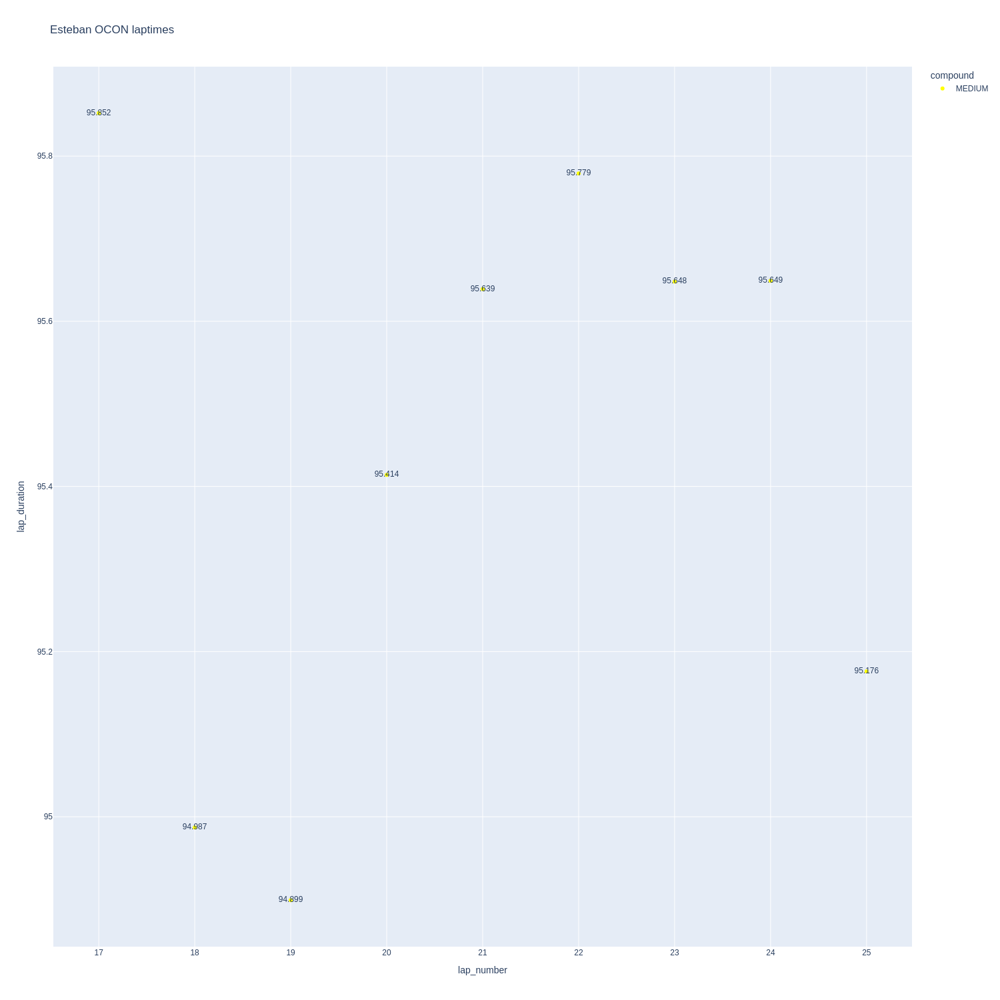

In [86]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

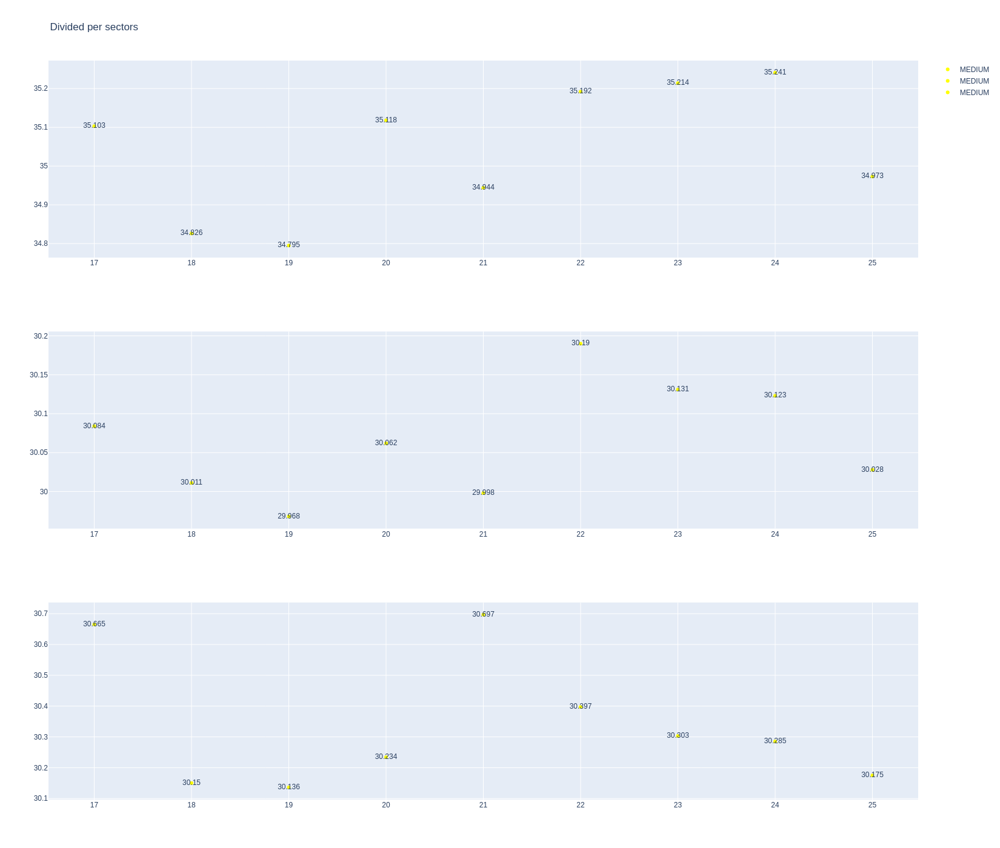

In [87]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

In [88]:
data = libraryDataF1.getinfolongruns(jointables2,10,'Alpine',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
21,Pierre GASLY,MEDIUM,2024-03-07T17:12:06.737000+00:00,2,35.358,37.788,33.892,107.038
312,Pierre GASLY,MEDIUM,2024-03-07T17:55:21.338000+00:00,18,35.020,30.165,30.255,95.440
328,Pierre GASLY,MEDIUM,2024-03-07T17:56:56.870000+00:00,19,34.818,29.870,30.025,94.713
348,Pierre GASLY,MEDIUM,2024-03-07T17:58:31.566000+00:00,20,35.183,29.929,30.073,95.185
367,Pierre GASLY,MEDIUM,2024-03-07T18:00:06.744000+00:00,21,36.771,30.267,30.323,97.361
387,Pierre GASLY,MEDIUM,2024-03-07T18:01:44.165000+00:00,22,35.154,30.213,30.266,95.633
407,Pierre GASLY,MEDIUM,2024-03-07T18:03:19.690000+00:00,23,35.040,30.006,30.259,95.305
427,Pierre GASLY,MEDIUM,2024-03-07T18:04:55.079000+00:00,24,35.014,30.034,30.264,95.312
446,Pierre GASLY,MEDIUM,2024-03-07T18:06:30.311000+00:00,25,35.181,30.051,30.091,95.323
465,Pierre GASLY,MEDIUM,2024-03-07T18:08:05.681000+00:00,26,34.793,30.140,30.221,95.154


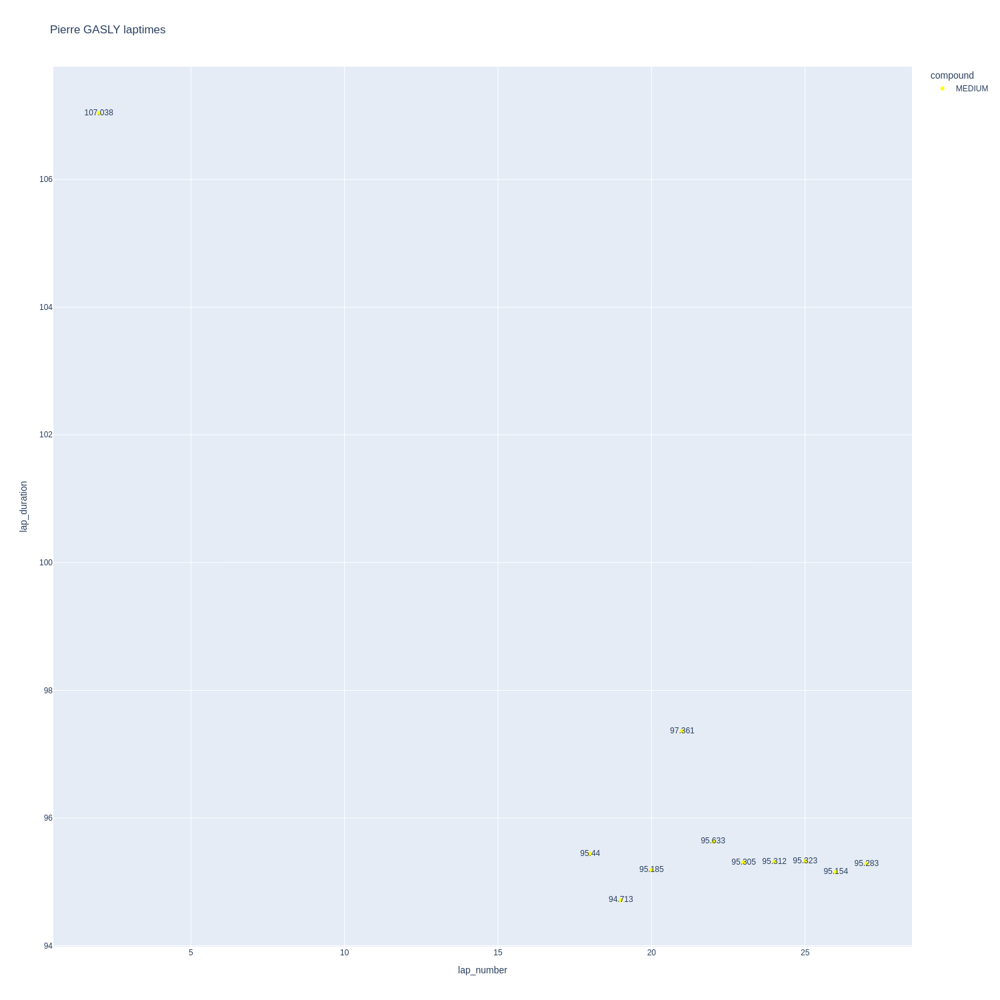

In [89]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

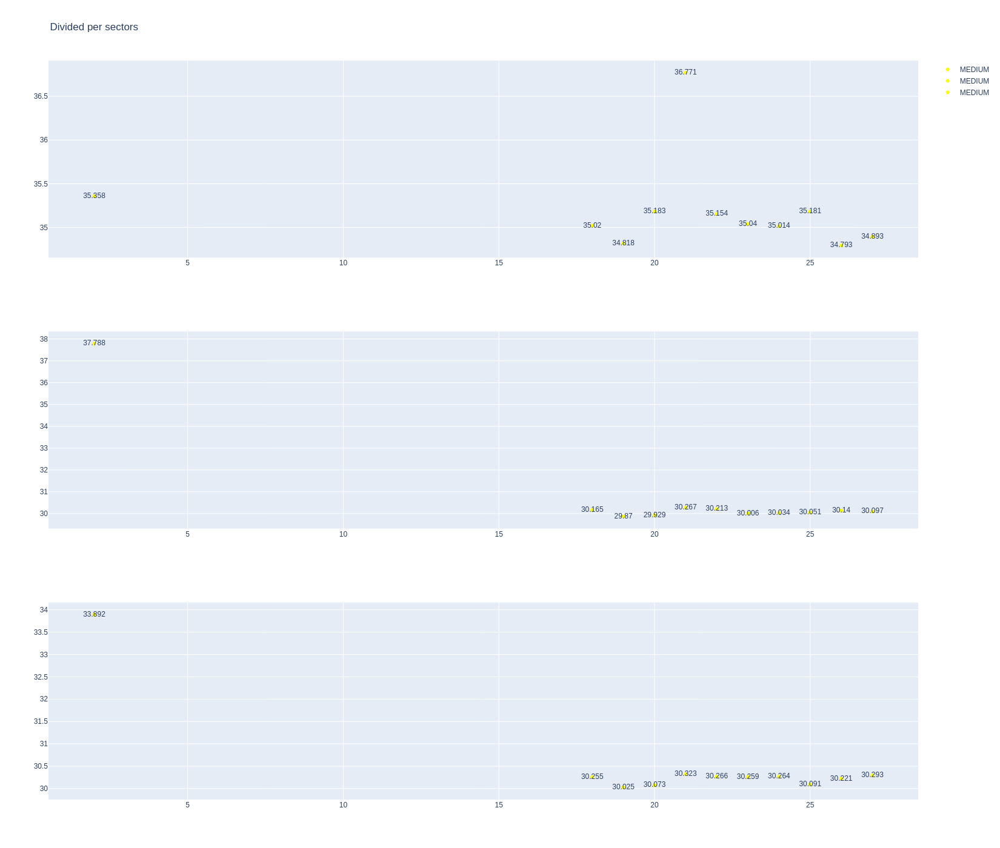

In [90]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

#### Williams

In [91]:
stintInformation.query('driver_number == 2 or driver_number == 23')

,meeting_key,session_key,stint_number,driver_number,lap_start,lap_end,compound,tyre_age_at_start
7,1230,9474,1,2,1,8,MEDIUM,0
11,1230,9474,1,23,1,8,HARD,0
30,1230,9474,2,23,9,13,SOFT,0
31,1230,9474,2,2,9,14,SOFT,0
50,1230,9474,3,23,14,14,SOFT,5
52,1230,9474,3,2,15,15,SOFT,6
59,1230,9474,4,23,15,29,HARD,0
61,1230,9474,4,2,16,28,MEDIUM,7


In [92]:
data = libraryDataF1.getinfolongruns(jointables2,23,'Williams',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
20,Alexander ALBON,HARD,2024-03-07T17:12:03.062000+00:00,2,34.633,29.383,29.537,93.553
282,Alexander ALBON,HARD,2024-03-07T17:51:40.768000+00:00,15,35.133,30.003,30.171,95.307
292,Alexander ALBON,HARD,2024-03-07T17:53:16.078000+00:00,16,35.075,30.010,30.075,95.160
308,Alexander ALBON,HARD,2024-03-07T17:54:51.228000+00:00,17,34.998,29.924,30.181,95.103
325,Alexander ALBON,HARD,2024-03-07T17:56:26.253000+00:00,18,35.187,29.899,30.195,95.281
344,Alexander ALBON,HARD,2024-03-07T17:58:01.522000+00:00,19,34.835,29.715,30.050,94.600
362,Alexander ALBON,HARD,2024-03-07T17:59:36.148000+00:00,20,37.266,30.194,30.177,97.637
382,Alexander ALBON,HARD,2024-03-07T18:01:13.813000+00:00,21,34.755,29.871,30.125,94.751
402,Alexander ALBON,HARD,2024-03-07T18:02:48.652000+00:00,22,34.702,29.782,30.046,94.530
422,Alexander ALBON,HARD,2024-03-07T18:04:23.214000+00:00,23,34.907,29.861,29.952,94.720


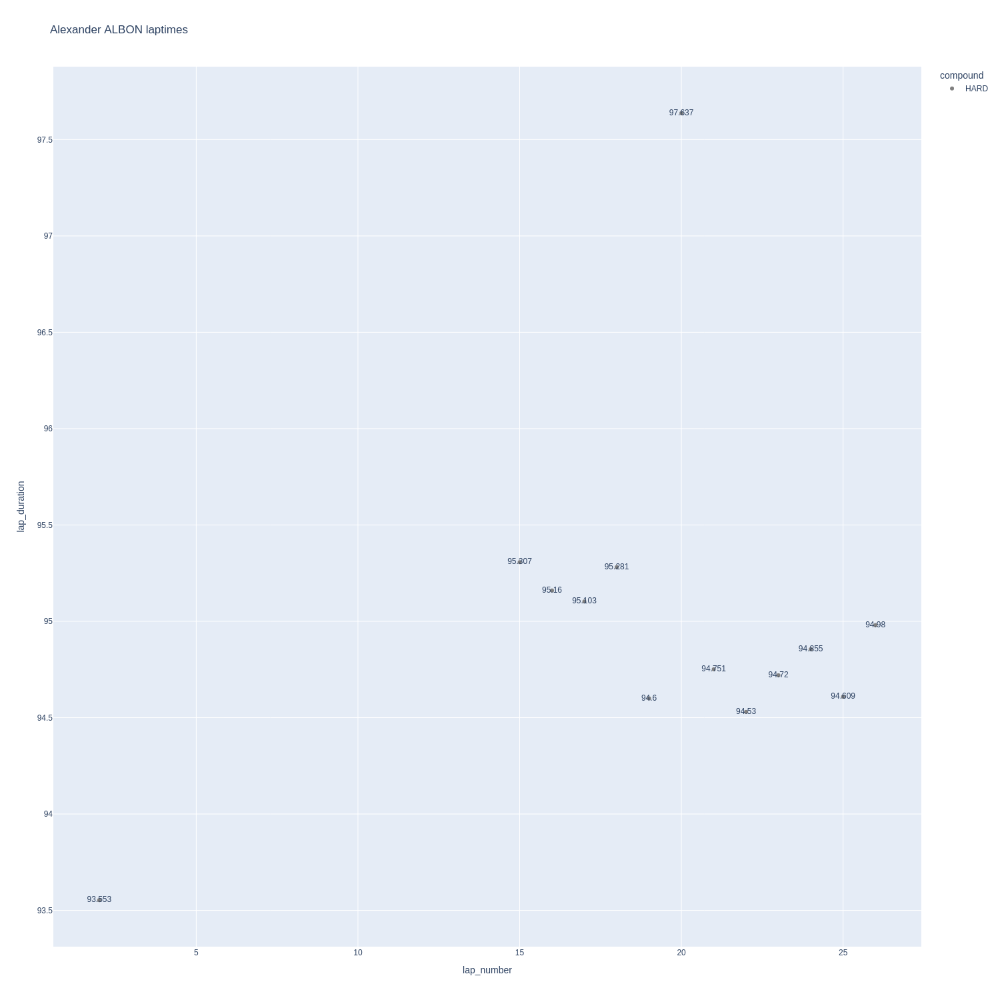

In [93]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

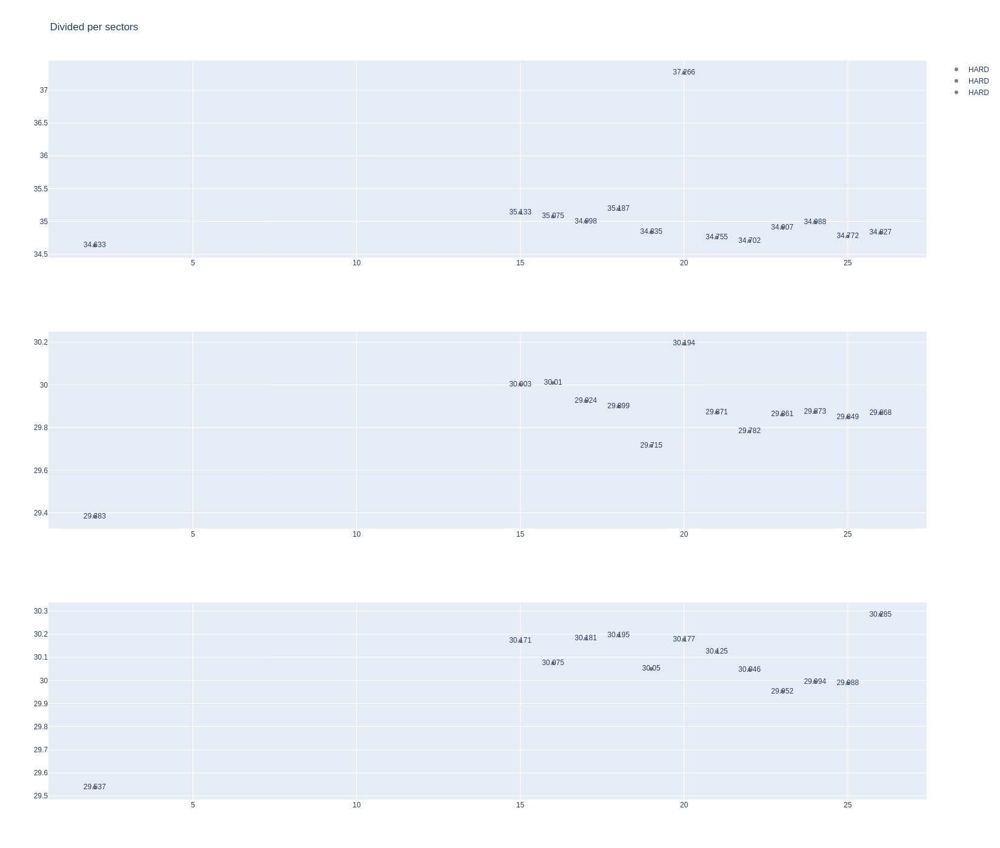

In [94]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

In [95]:
data= libraryDataF1.getinfolongruns(jointables2,2,'Williams',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
124,Logan SARGEANT,MEDIUM,2024-03-07T17:22:43.726000+00:00,7,37.178,31.841,33.987,103.006
235,Logan SARGEANT,SOFT,2024-03-07T17:41:59.059000+00:00,13,32.980,28.876,34.760,96.616
301,Logan SARGEANT,MEDIUM,2024-03-07T17:54:16.843000+00:00,16,35.177,29.973,30.063,95.213
318,Logan SARGEANT,MEDIUM,2024-03-07T17:55:52.082000+00:00,17,35.065,30.106,30.283,95.454
335,Logan SARGEANT,MEDIUM,2024-03-07T17:57:27.464000+00:00,18,35.961,29.944,30.216,96.121
378,Logan SARGEANT,MEDIUM,2024-03-07T18:00:52.540000+00:00,20,35.107,30.191,30.278,95.576
398,Logan SARGEANT,MEDIUM,2024-03-07T18:02:28.081000+00:00,21,35.328,30.175,30.291,95.794
418,Logan SARGEANT,MEDIUM,2024-03-07T18:04:03.837000+00:00,22,35.342,30.290,30.225,95.857
437,Logan SARGEANT,MEDIUM,2024-03-07T18:05:39.823000+00:00,23,35.447,30.112,30.191,95.750
456,Logan SARGEANT,MEDIUM,2024-03-07T18:07:15.529000+00:00,24,35.230,30.059,30.144,95.433


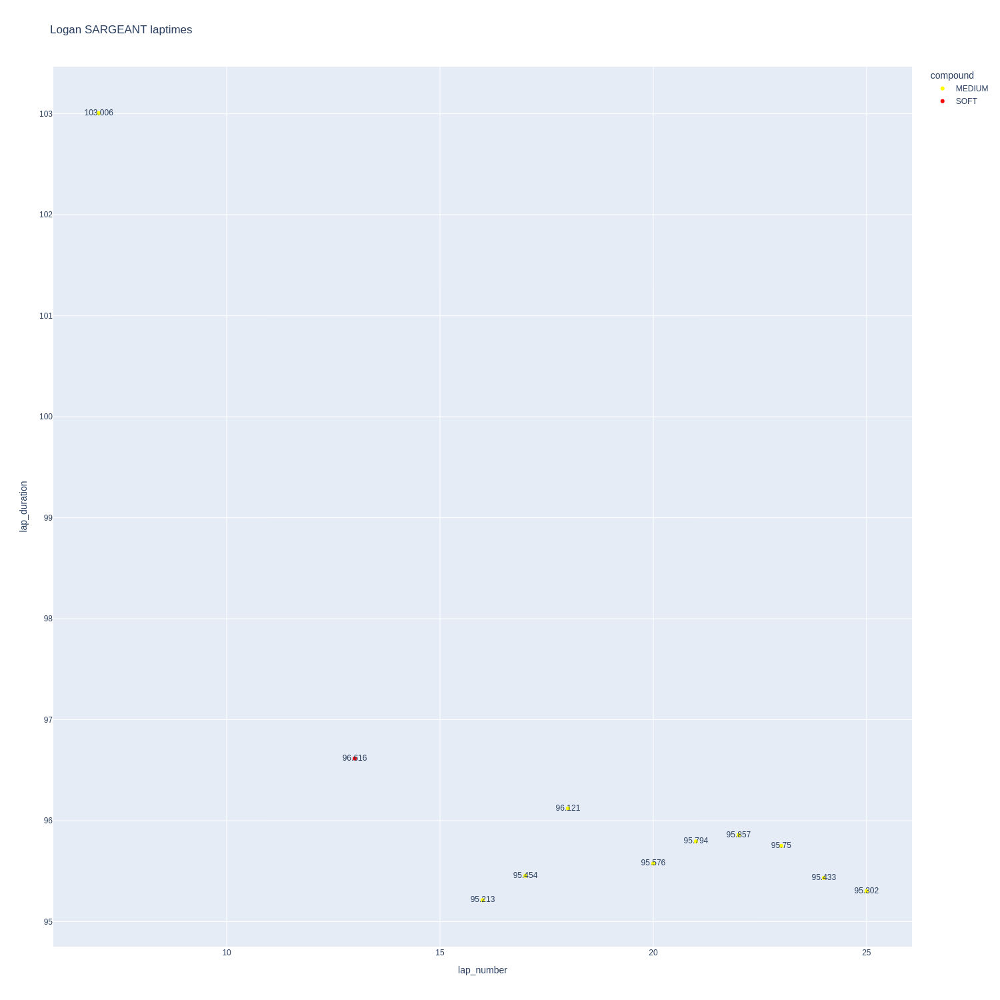

In [96]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

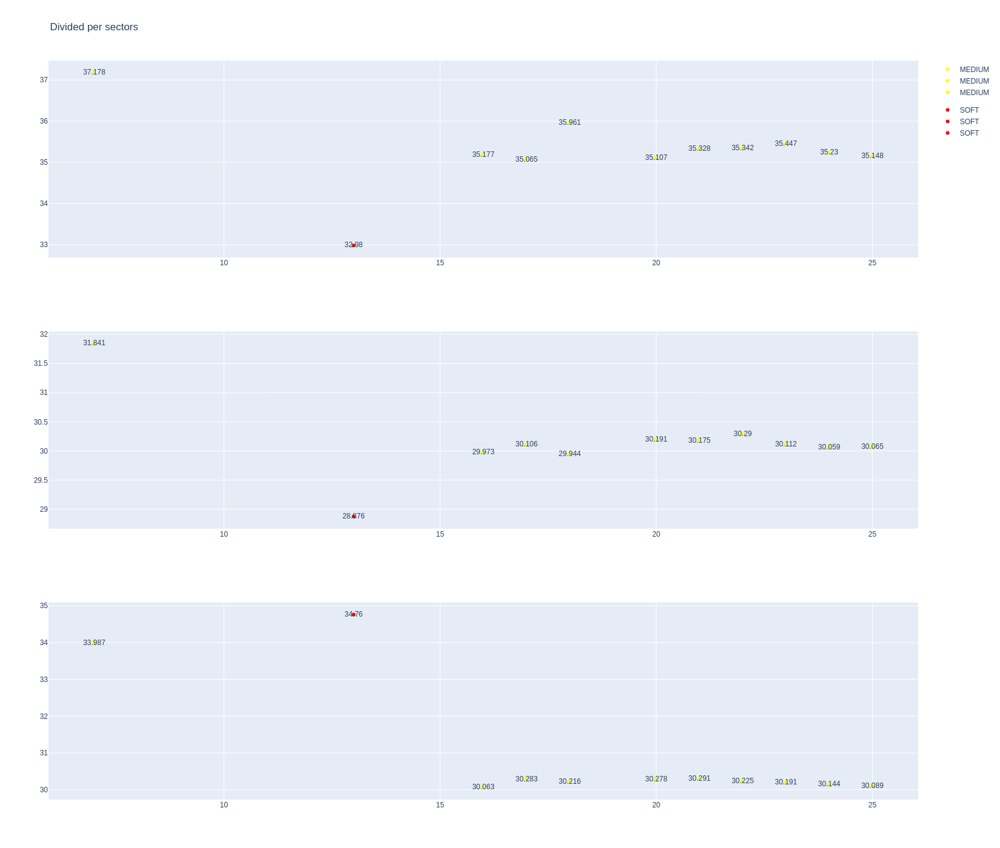

In [97]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

#### Kick Sauber

In [98]:
stintInformation.query('driver_number == 24 or driver_number == 77')

,meeting_key,session_key,stint_number,driver_number,lap_start,lap_end,compound,tyre_age_at_start
6,1230,9474,1,77,1,7,HARD,0
12,1230,9474,1,24,1,8,MEDIUM,0
27,1230,9474,2,77,8,14,SOFT,0
34,1230,9474,2,24,9,15,SOFT,0
53,1230,9474,3,77,15,15,SOFT,7
62,1230,9474,3,24,16,28,MEDIUM,7
63,1230,9474,4,77,16,28,HARD,6


In [99]:
data = libraryDataF1.getinfolongruns(jointables2,24,'Kick Sauber',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
309,ZHOU Guanyu,MEDIUM,2024-03-07T17:55:10.854000+00:00,16,35.115,30.000,30.195,95.310
326,ZHOU Guanyu,MEDIUM,2024-03-07T17:56:46.198000+00:00,17,34.966,30.051,30.091,95.108
346,ZHOU Guanyu,MEDIUM,2024-03-07T17:58:21.266000+00:00,18,35.111,29.993,29.911,95.015
365,ZHOU Guanyu,MEDIUM,2024-03-07T17:59:56.520000+00:00,19,34.983,29.760,30.018,94.761
384,ZHOU Guanyu,MEDIUM,2024-03-07T18:01:31.002000+00:00,20,34.972,29.823,29.919,94.714
404,ZHOU Guanyu,MEDIUM,2024-03-07T18:03:05.891000+00:00,21,35.353,30.158,30.313,95.824
424,ZHOU Guanyu,MEDIUM,2024-03-07T18:04:41.673000+00:00,22,35.176,30.115,30.189,95.480
443,ZHOU Guanyu,MEDIUM,2024-03-07T18:06:17.129000+00:00,23,35.098,30.038,30.283,95.419
462,ZHOU Guanyu,MEDIUM,2024-03-07T18:07:52.562000+00:00,24,35.020,30.102,30.235,95.357
482,ZHOU Guanyu,MEDIUM,2024-03-07T18:09:27.900000+00:00,25,35.045,30.204,30.399,95.648


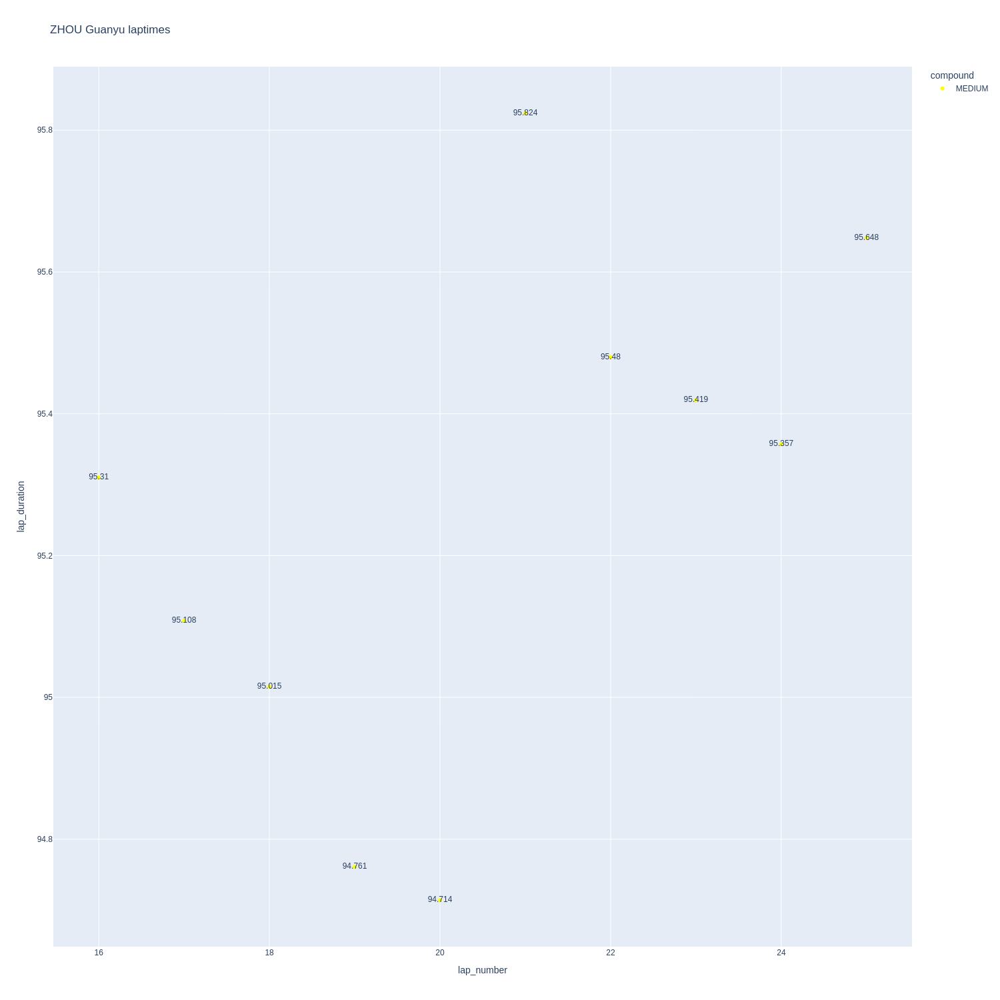

In [100]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

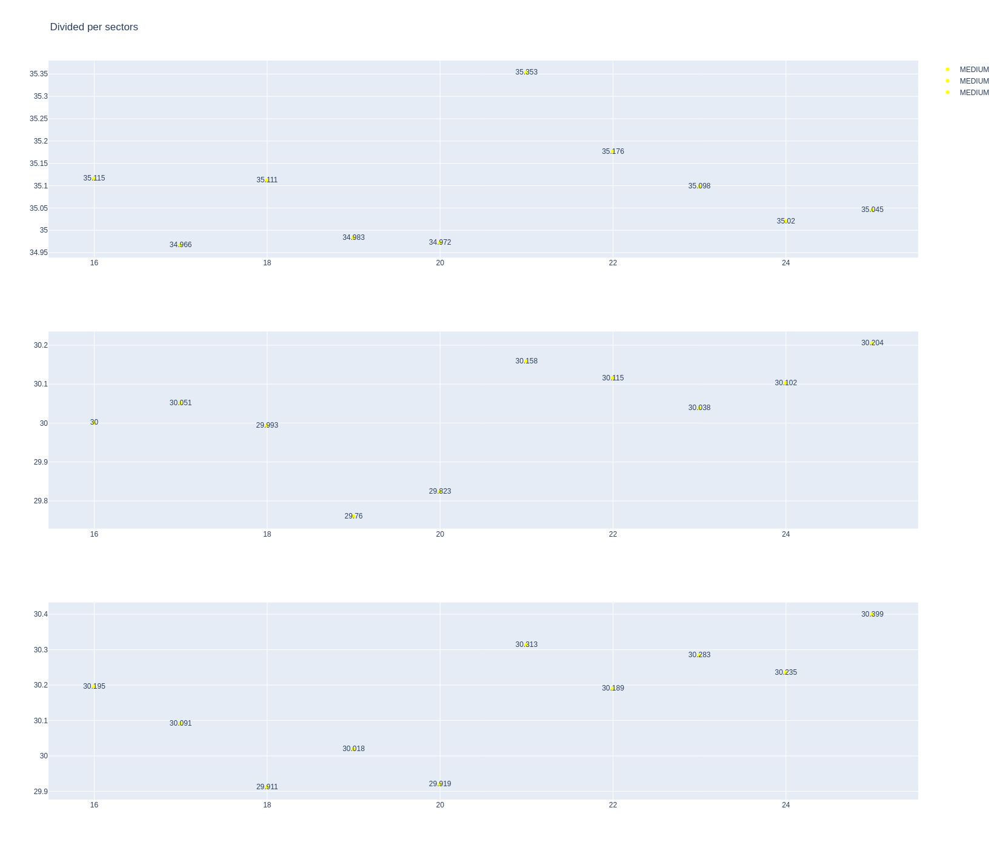

In [101]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

In [102]:
data = libraryDataF1.getinfolongruns(jointables2,77,'Kick Sauber',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
313,Valtteri BOTTAS,HARD,2024-03-07T17:55:28.805000+00:00,16,35.311,30.253,30.216,95.780
330,Valtteri BOTTAS,HARD,2024-03-07T17:57:04.731000+00:00,17,36.584,30.136,30.495,97.215
350,Valtteri BOTTAS,HARD,2024-03-07T17:58:41.919000+00:00,18,35.162,30.193,30.310,95.665
370,Valtteri BOTTAS,HARD,2024-03-07T18:00:17.545000+00:00,19,35.328,30.188,30.269,95.785
390,Valtteri BOTTAS,HARD,2024-03-07T18:01:53.243000+00:00,20,35.170,30.184,30.053,95.407
409,Valtteri BOTTAS,HARD,2024-03-07T18:03:28.698000+00:00,21,35.998,30.342,34.271,100.611
429,Valtteri BOTTAS,HARD,2024-03-07T18:05:09.308000+00:00,22,35.480,30.231,30.740,96.451
449,Valtteri BOTTAS,HARD,2024-03-07T18:06:45.731000+00:00,23,36.147,30.467,30.643,97.257
467,Valtteri BOTTAS,HARD,2024-03-07T18:08:22.965000+00:00,24,35.688,30.174,30.351,96.213


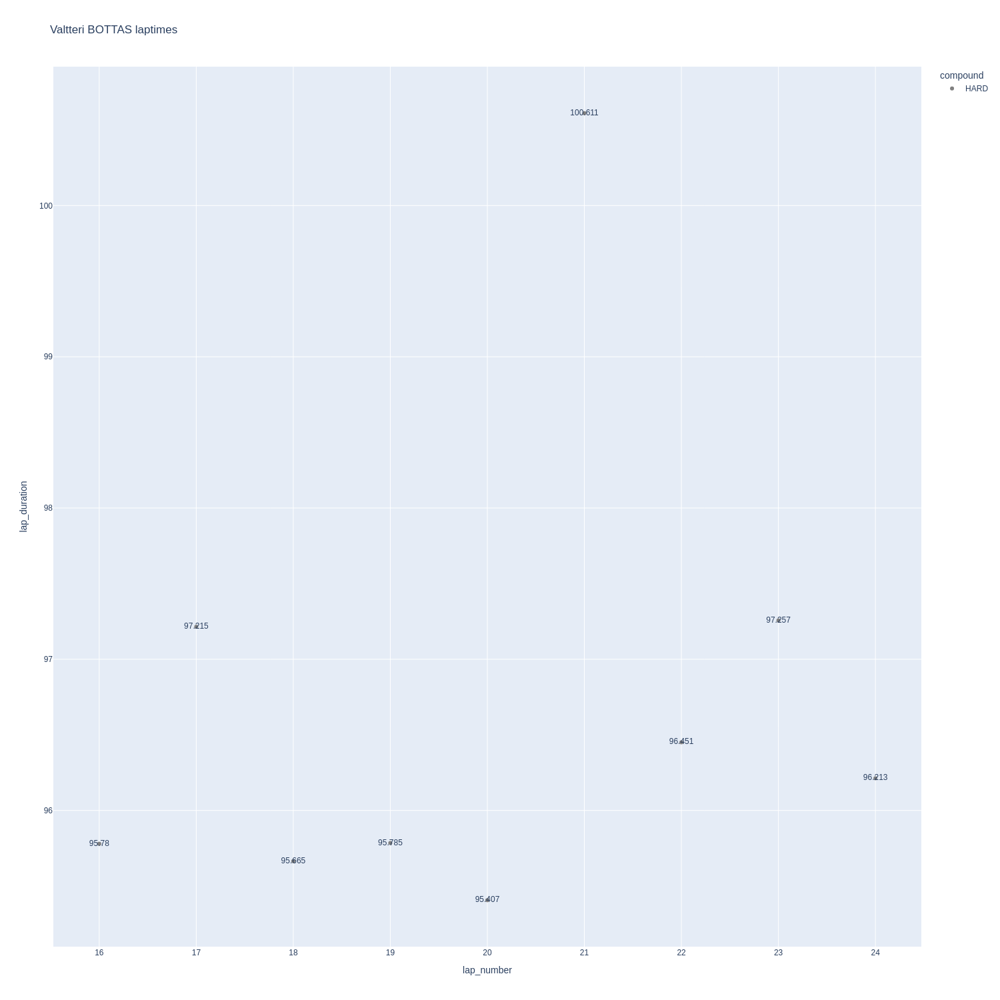

In [103]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

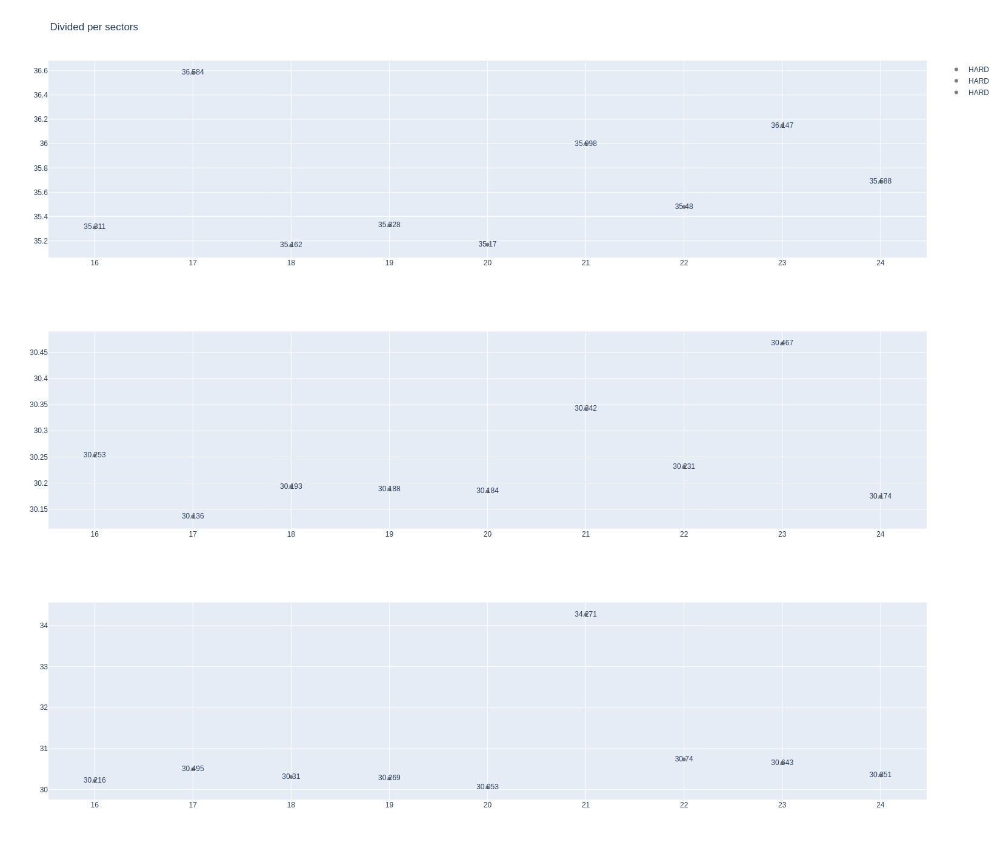

In [104]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

#### Long runs mean for each driver

In [105]:
longrun_data = libraryDataF1.obtainLongRunData(drivers,jointables2,MINIMUN_SECONDS,MAXIMUM_SECONDS)

##### Sorted by lap duration

In [106]:
sorted_laps = pd.DataFrame(longrun_data,columns=['driver','compound','lap_duration','sector1','sector2','sector3'])

In [107]:
sorted_laps.sort_values(by='lap_duration',ascending=True)

,driver,compound,lap_duration,sector1,sector2,sector3
5,Sergio PEREZ,MEDIUM,94.536200,34.815733,29.894000,29.826467
16,Carlos SAINZ,MEDIUM,94.740667,34.659000,29.957833,30.123833
7,Charles LECLERC,SOFT,94.916500,34.350500,29.848600,30.717400
0,Max VERSTAPPEN,MEDIUM,95.002900,34.426600,29.748700,30.827600
11,Alexander ALBON,HARD,95.006615,35.082923,29.864000,30.059692
19,Oscar PIASTRI,MEDIUM,95.174444,34.654111,29.752000,30.768333
12,ZHOU Guanyu,MEDIUM,95.263600,35.083900,30.024400,30.155300
2,Daniel RICCIARDO,SOFT,95.343500,35.067700,30.123700,30.152100
3,Lando NORRIS,HARD,95.379000,34.290429,29.668857,31.419714
15,Lewis HAMILTON,MEDIUM,95.412400,34.560400,29.742000,31.110000


##### Sorted by sector 1

In [108]:
sorted_laps.sort_values(by='sector1',ascending=True)[['driver','compound','sector1']]

,driver,compound,sector1
3,Lando NORRIS,HARD,34.290429
7,Charles LECLERC,SOFT,34.350500
0,Max VERSTAPPEN,MEDIUM,34.426600
6,Fernando ALONSO,MEDIUM,34.524571
15,Lewis HAMILTON,MEDIUM,34.560400
17,George RUSSELL,MEDIUM,34.629167
19,Oscar PIASTRI,MEDIUM,34.654111
16,Carlos SAINZ,MEDIUM,34.659000
5,Sergio PEREZ,MEDIUM,34.815733
8,Lance STROLL,MEDIUM,35.006100


##### Sorted by sector 2

In [109]:
sorted_laps.sort_values(by='sector2',ascending=True)[['driver','compound','sector2']]

,driver,compound,sector2
3,Lando NORRIS,HARD,29.668857
15,Lewis HAMILTON,MEDIUM,29.742000
0,Max VERSTAPPEN,MEDIUM,29.748700
19,Oscar PIASTRI,MEDIUM,29.752000
17,George RUSSELL,MEDIUM,29.758000
7,Charles LECLERC,SOFT,29.848600
11,Alexander ALBON,HARD,29.864000
5,Sergio PEREZ,MEDIUM,29.894000
16,Carlos SAINZ,MEDIUM,29.957833
10,Yuki TSUNODA,SOFT,30.010769


##### Sorted by sector 3

In [110]:
sorted_laps.sort_values(by='sector3',ascending=True)[['driver','compound','sector3']]

,driver,compound,sector3
5,Sergio PEREZ,MEDIUM,29.826467
11,Alexander ALBON,HARD,30.059692
16,Carlos SAINZ,MEDIUM,30.123833
2,Daniel RICCIARDO,SOFT,30.152100
12,ZHOU Guanyu,MEDIUM,30.155300
9,Kevin MAGNUSSEN,SOFT,30.221545
14,Esteban OCON,MEDIUM,30.338000
13,Nico HULKENBERG,HARD,30.467273
4,Pierre GASLY,MEDIUM,30.542000
10,Yuki TSUNODA,SOFT,30.576231


#### Long runs mean

In [111]:
longruns_summary = libraryDataF1.obtainMeanLongRuns(drivers,jointables2,MINIMUN_SECONDS,MAXIMUM_SECONDS)

##### Mean pace per compound

In [112]:
libraryDataF1.showDataLongRuns(longruns_summary,"MEDIUM","mean_lap_time",['driver','mean_lap_time'])

,driver,mean_lap_time
5,S PEREZ,94.536
16,C SAINZ,94.741
0,M VERSTAPPEN,95.003
12,G ZHOU,95.264
6,F ALONSO,95.314
15,L HAMILTON,95.378
19,O PIASTRI,95.434
14,E OCON,95.449
8,L STROLL,95.663
17,G RUSSELL,95.817


In [113]:
libraryDataF1.showDataLongRuns(longruns_summary,"SOFT","mean_lap_time",['driver','mean_lap_time'])

,driver,mean_lap_time
7,C LECLERC,94.917
2,D RICCIARDO,95.344
9,K MAGNUSSEN,95.438
10,Y TSUNODA,95.712


In [114]:
libraryDataF1.showDataLongRuns(longruns_summary,"HARD","mean_lap_time",['driver','mean_lap_time'])

,driver,mean_lap_time
3,L NORRIS,94.653
11,A ALBON,95.007
13,N HULKENBERG,95.933
18,V BOTTAS,96.709


## Free Practice 3
### Obtain setup

In [115]:
practice = libraryDataF1.obtain_information('laps',session_key=9475)
stintInformation = libraryDataF1.obtain_information('stints',session_key=9475)
drivers = libraryDataF1.obtain_information('drivers',session_key=9475)

In [116]:
stintsDataFrame =libraryDataF1.stint_configuration(drivers,stintInformation)
jointables2 = pd.merge(practice,stintsDataFrame,on=['lap_number','driver_number'])
libraryDataF1.obtain_drivers_colours(drivers)

In [117]:
session = ff1.get_session(2024, 2, 'FP3')
session.load();

req         WARNING 	DEFAULT CACHE ENABLED! (1.44 GB) /home/frank/.cache/fastf1
core           INFO 	Loading data for Saudi Arabian Grand Prix - Practice 3 [v3.3.0]
req            INFO 	Using cached data for session_info
req            INFO 	Using cached data for driver_info
req            INFO 	Using cached data for session_status_data
req            INFO 	Using cached data for track_status_data
req            INFO 	Using cached data for _extended_timing_data
req            INFO 	Using cached data for timing_app_data
core           INFO 	Processing timing data...
req            INFO 	Using cached data for car_data
req            INFO 	Using cached data for position_data
req            INFO 	Using cached data for weather_data
req            INFO 	Using cached data for race_control_messages
core           INFO 	Finished loading data for 20 drivers: ['1', '10', '11', '14', '16', '18', '2', '20', '22', '23', '24', '27', '3', '31', '38', '4', '44', '63', '77', '81']


### Speed trap

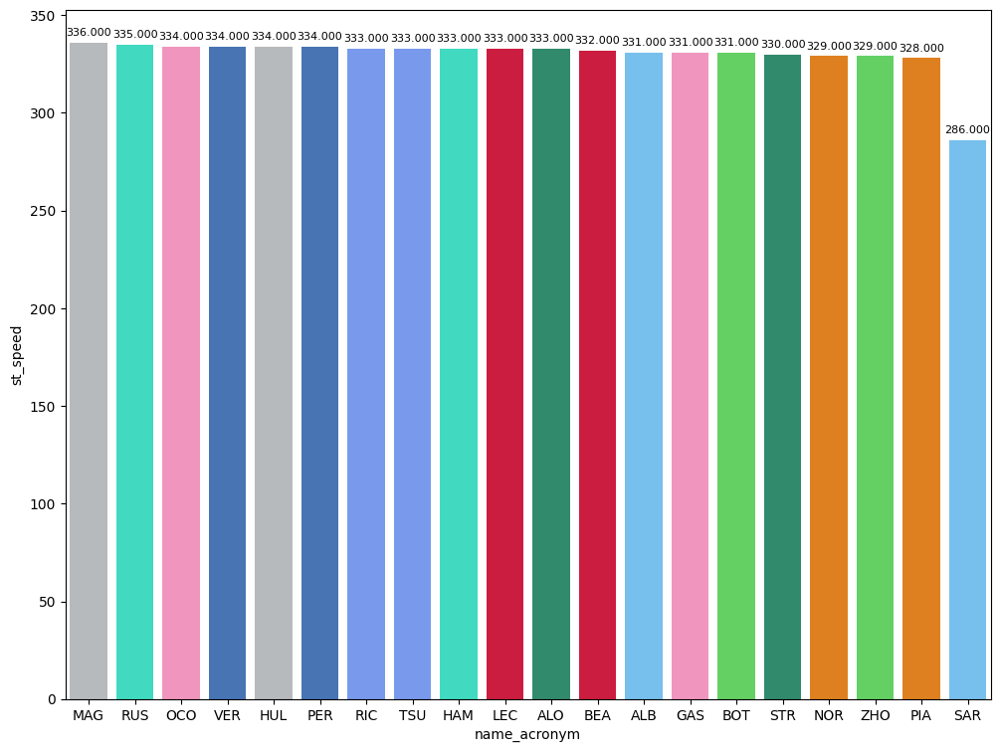

In [118]:
top_speed = jointables2.loc[jointables2.groupby(['name_acronym'])['st_speed'].idxmax()].sort_values(by=['st_speed'],ascending=False)
libraryDataF1.obtainchart("name_acronym","st_speed",top_speed)

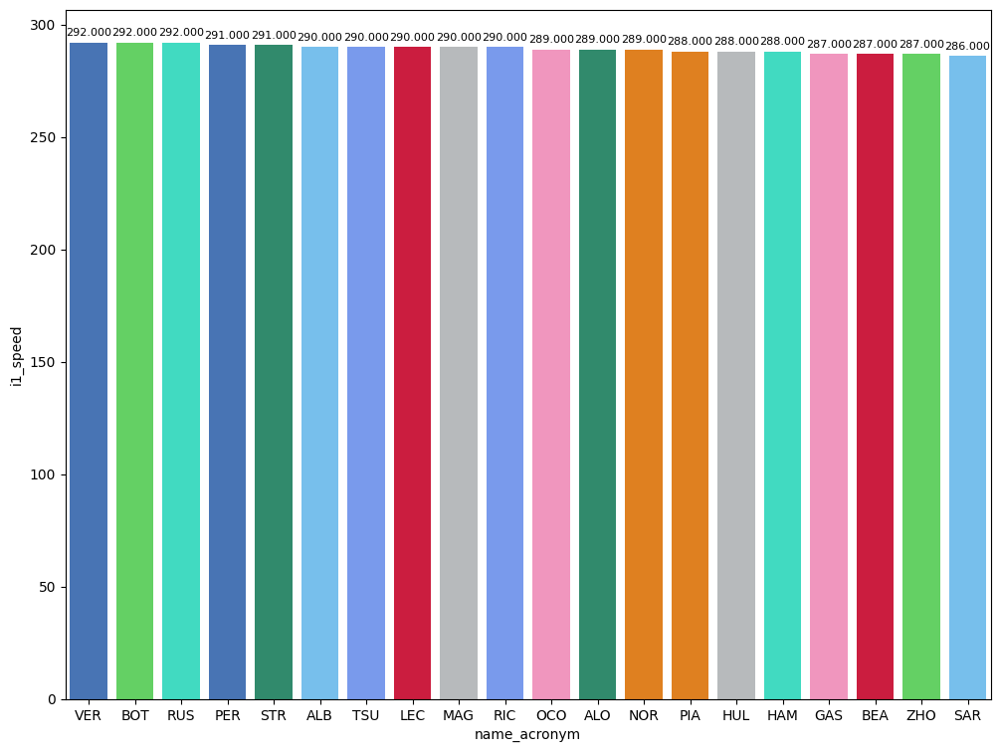

In [119]:
top_speed = jointables2.loc[jointables2.groupby(['name_acronym'])['i1_speed'].idxmax()].sort_values(by=['i1_speed'],ascending=False)
libraryDataF1.obtainchart("name_acronym","i1_speed",top_speed)

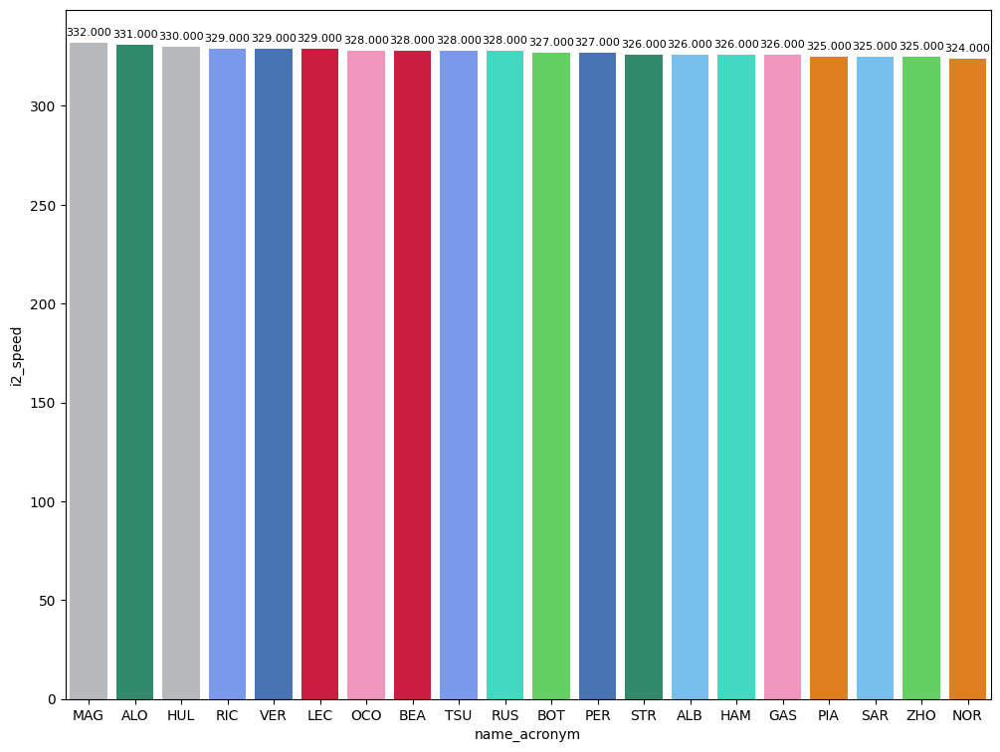

In [120]:
top_speed = jointables2.loc[jointables2.groupby(['name_acronym'])['i2_speed'].idxmax()].sort_values(by=['i2_speed'],ascending=False)
libraryDataF1.obtainchart("name_acronym","i2_speed",top_speed)

### Fastest lap per compound
In this section, I will show the best lap with the different compounds of the session. 

In [121]:
compoundsPace = jointables2.loc[jointables2.groupby(['compound'])['lap_duration'].idxmin()]
compoundsPace[['full_name','compound','duration_sector_1','duration_sector_2','duration_sector_3','lap_duration']]

,full_name,compound,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
11,Lance STROLL,HARD,63.091,31.925,42.962,137.978
91,Charles LECLERC,MEDIUM,32.526,28.249,28.431,89.206
166,Max VERSTAPPEN,SOFT,32.155,28.021,28.236,88.412


### Deltas
In this section we can see the deltas of the fastest lap of each driver compared with the fastest lap of the session

In [122]:
practiceCleaned = jointables2.query("lap_duration >1")
drivers_list = list(practiceCleaned['driver_number'].unique())
newdataset = pd.DataFrame()
for driver in drivers_list:
    newdataset =libraryDataF1.obtain_fastest_lap(driver,practiceCleaned,newdataset)

arr= libraryDataF1.obtain_deltas(newdataset)
newdataset.insert(3,'delta',arr)


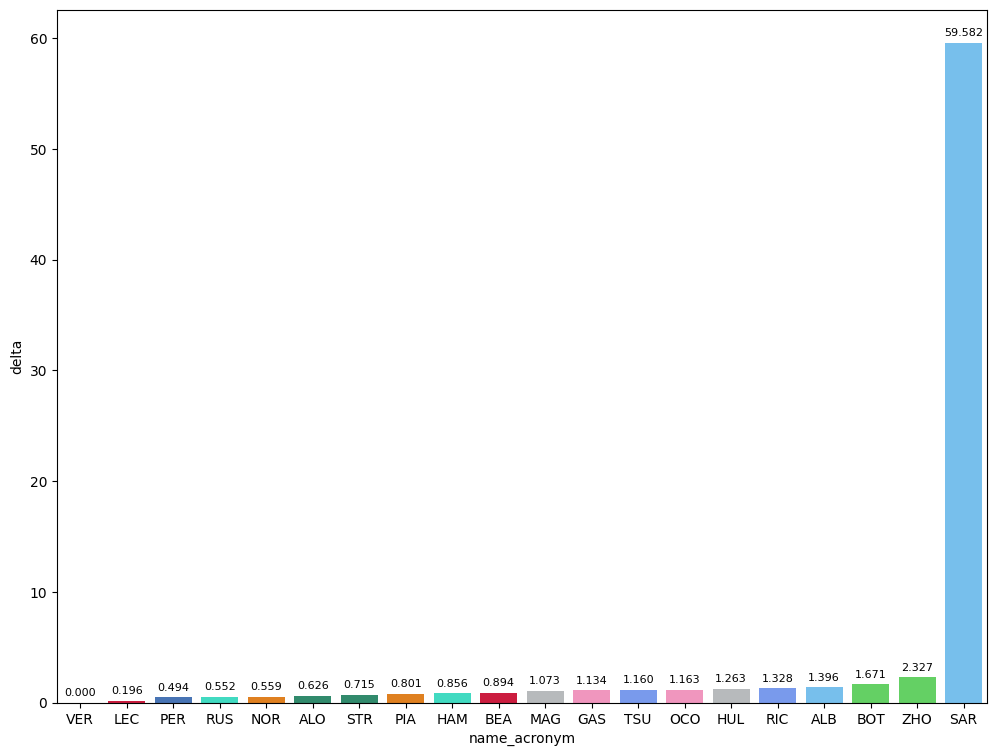

In [123]:
dt = newdataset.sort_values(ascending=True,by='delta')
libraryDataF1.obtainchart("name_acronym","delta",dt)

### Track dominance
In this section, best sector are taken of each sector to see the car's performance in each sector.

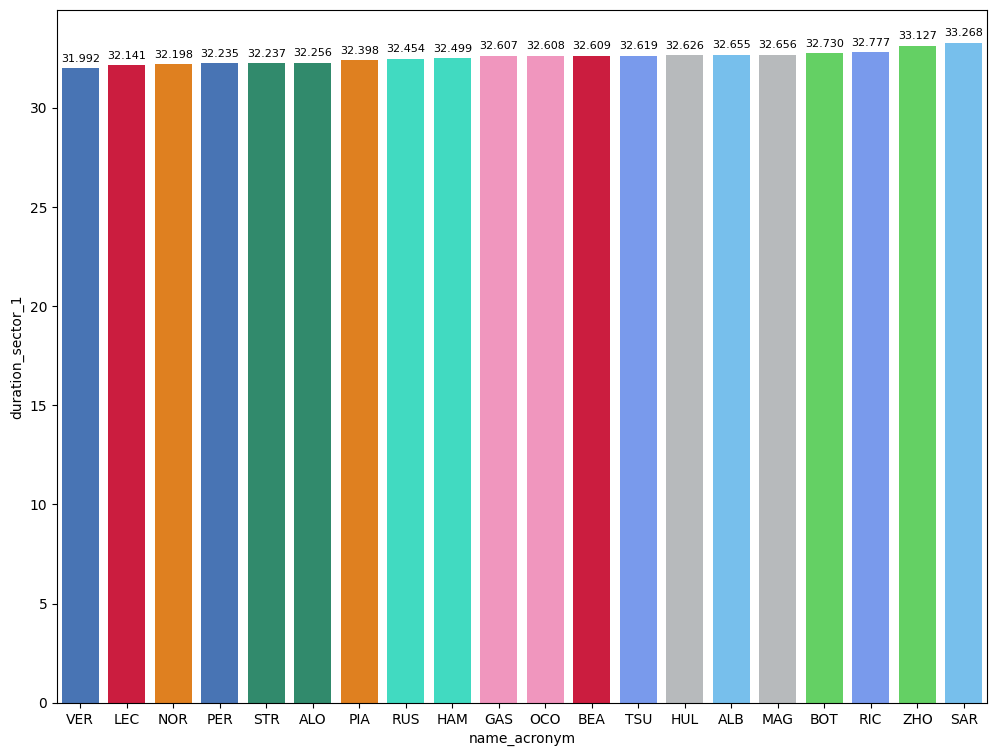

In [124]:
sectorPace = jointables2.loc[jointables2.groupby(['driver_number'])['duration_sector_1'].idxmin()].sort_values(by=['duration_sector_1'],ascending=True)
libraryDataF1.obtainchart("name_acronym","duration_sector_1",sectorPace)

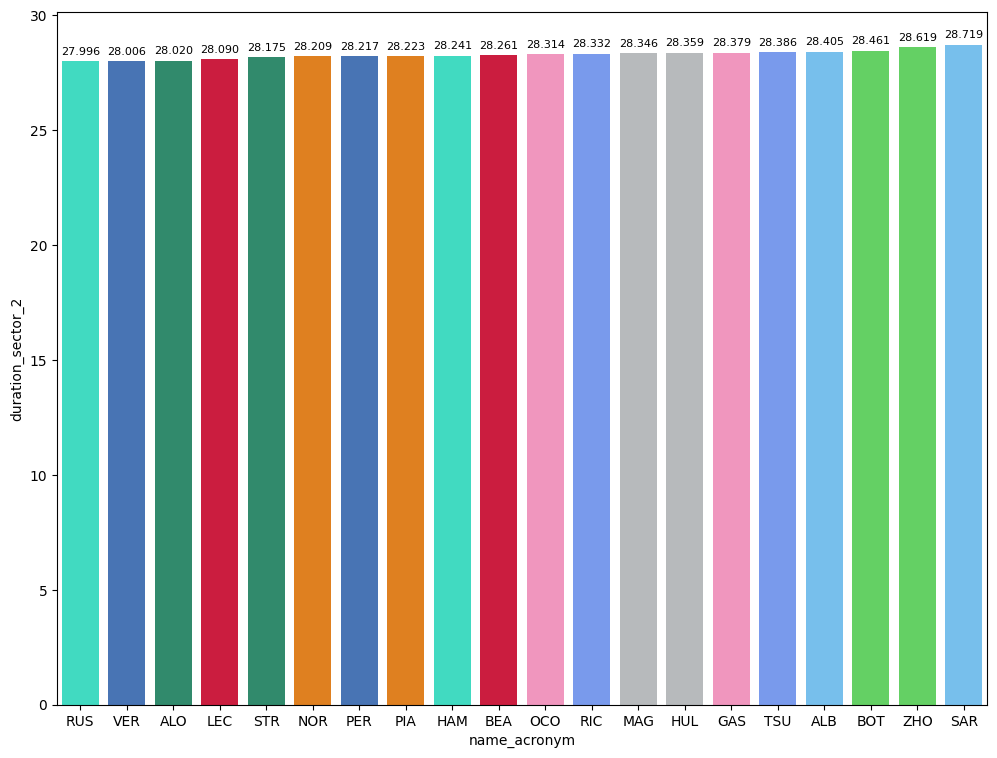

In [125]:
sectorPace = jointables2.loc[jointables2.groupby(['driver_number'])['duration_sector_2'].idxmin()].sort_values(by=['duration_sector_2'],ascending=True)
libraryDataF1.obtainchart("name_acronym","duration_sector_2",sectorPace)

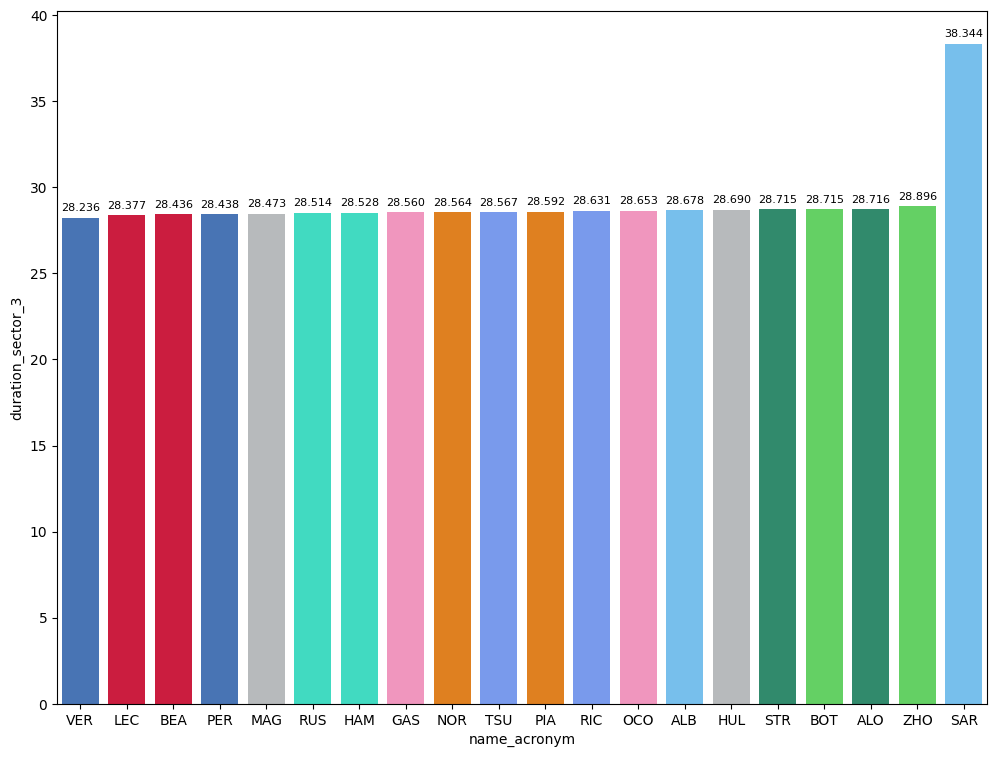

In [126]:
sectorPace = jointables2.loc[jointables2.groupby(['driver_number'])['duration_sector_3'].idxmin()].sort_values(by=['duration_sector_3'],ascending=True)
libraryDataF1.obtainchart("name_acronym","duration_sector_3",sectorPace)

### Mean pace with the different compound used on the session

In [127]:
race_pace = pd.DataFrame(jointables2.query("is_pit_out_lap == False  and lap_duration <= 108").groupby("compound")['lap_duration'].mean().sort_values(ascending=True))
race_pace

,lap_duration
compound,
SOFT,91.496610
MEDIUM,92.505109


### Gear shifts of the poleman

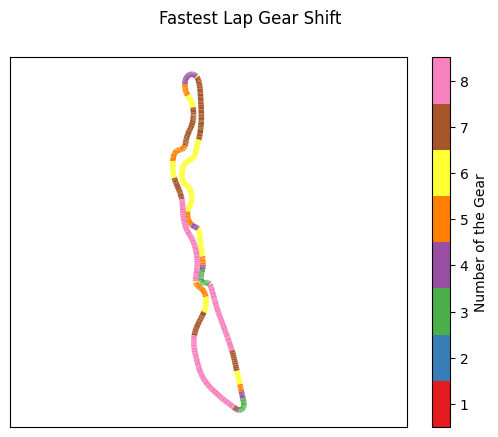

In [128]:
libraryDataF1.show_shifts_poleman(session)

### Comparaison between the poleman and the second

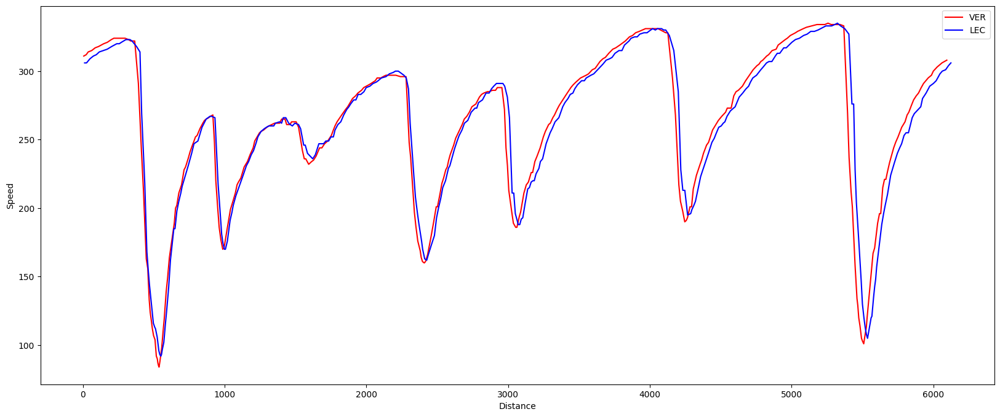

In [129]:
libraryDataF1.plot_telemetry("Distance","Speed",dt,session)

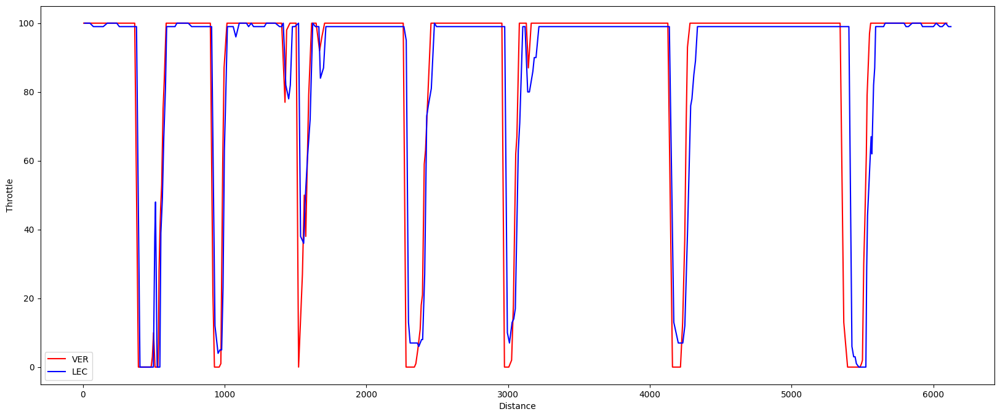

In [130]:
libraryDataF1.plot_telemetry("Distance","Throttle",dt,session)

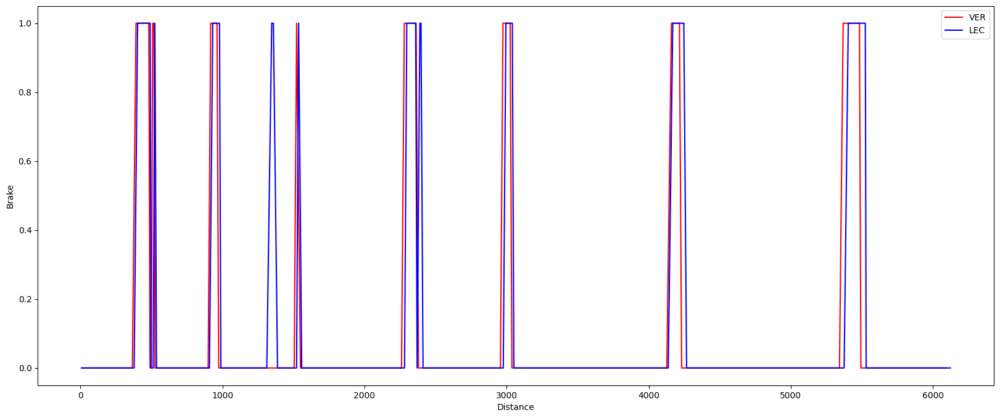

In [131]:
libraryDataF1.plot_telemetry("Distance","Brake",dt,session)

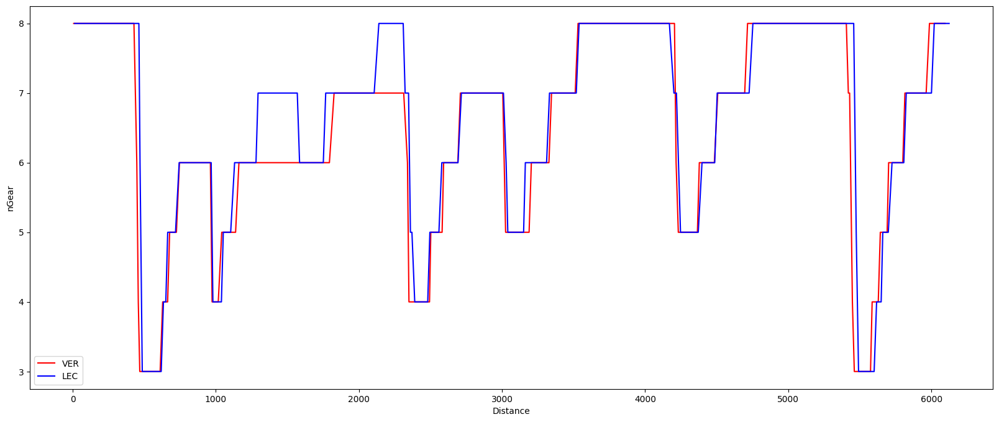

In [132]:
libraryDataF1.plot_telemetry("Distance","nGear",dt,session)

## Qualyfing
### Set up
First of all, it is neccesary to obtain the data about the qualyfing
#### Race control
This section has been added in order to know which laps has been deleted and knowing what happened on track during this session.

In [133]:
libraryDataF1.obtain_information('race_control',session_key=9476)

,session_key,meeting_key,date,category,flag,lap_number,message,driver_number,scope,sector
0,9476,1230,2024-03-08T17:00:00+00:00,Flag,GREEN,None,GREEN LIGHT - PIT EXIT OPEN,NaN,Track,NaN
1,9476,1230,2024-03-08T17:08:34+00:00,Flag,BLACK AND WHITE,None,BLACK AND WHITE FLAG FOR CAR 63 (RUS) - FAILIN...,63.0,Driver,NaN
2,9476,1230,2024-03-08T17:10:28+00:00,Other,None,None,CAR 18 (STR) LAP DELETED - TRACK LIMITS AT TUR...,NaN,None,NaN
3,9476,1230,2024-03-08T17:11:10+00:00,Other,None,None,CAR 20 (MAG) TIME 1:56.534 DELETED - TRACK LIM...,NaN,None,NaN
4,9476,1230,2024-03-08T17:18:00+00:00,Flag,CHEQUERED,None,CHEQUERED FLAG,NaN,Track,NaN
5,9476,1230,2024-03-08T17:18:09+00:00,Other,None,None,FIRST CAR TO TAKE THE FLAG - CAR 24 (ZHO),NaN,None,NaN
6,9476,1230,2024-03-08T17:19:15+00:00,Other,None,None,CAR 38 (BEA) LAP DELETED - TRACK LIMITS AT TUR...,NaN,None,NaN
7,9476,1230,2024-03-08T17:20:38+00:00,Other,None,None,CAR 23 (ALB) LAP DELETED - TRACK LIMITS AT TUR...,NaN,None,NaN
8,9476,1230,2024-03-08T17:20:52+00:00,Other,None,None,FIA STEWARDS: INCIDENT INVOLVING CARS 38 (BEA)...,NaN,None,NaN
9,9476,1230,2024-03-08T17:21:06+00:00,Other,None,None,FIA STEWARDS: INCIDENT INVOLVING CAR 38 (BEA) ...,NaN,None,NaN


### Obtain setup

In [134]:
qualyfing = libraryDataF1.obtain_information('laps',session_key=9476)
stintInformation = libraryDataF1.obtain_information('stints',session_key=9476)
drivers = libraryDataF1.obtain_information('drivers',session_key=9476)
libraryDataF1.obtain_drivers_colours(drivers)

In [135]:
session = ff1.get_session(2024, 2, 'Q')
session.load()
session.laps["LapTimeSeconds"] = session.laps["LapTime"].dt.total_seconds()

core           INFO 	Loading data for Saudi Arabian Grand Prix - Qualifying [v3.3.0]
req            INFO 	Using cached data for session_info
req            INFO 	Using cached data for driver_info
req            INFO 	Using cached data for session_status_data
req            INFO 	Using cached data for track_status_data
req            INFO 	Using cached data for _extended_timing_data
req            INFO 	Using cached data for timing_app_data
core           INFO 	Processing timing data...
req            INFO 	Using cached data for car_data
req            INFO 	Using cached data for position_data
req            INFO 	Using cached data for weather_data
req            INFO 	Using cached data for race_control_messages
core           INFO 	Finished loading data for 20 drivers: ['1', '16', '11', '14', '81', '4', '63', '44', '22', '18', '38', '23', '20', '3', '27', '77', '31', '10', '2', '24']


To obtain a better analysis, those laptimes deleted will be removed from this analysis in order to obtain the data with valid values. So that,taking into account the race control table, it will be neccesary to consult the qualyfing data to obtain the ids. 

In [136]:
#qualyfing = qualyfing.drop(7)
#qualyfing = qualyfing.drop(137)

In [137]:
bestlap = qualyfing.loc[qualyfing.groupby(['driver_number'])['lap_duration'].idxmin()].sort_values(by=['lap_duration'],ascending=True)
bestlap[0:1]

,meeting_key,session_key,driver_number,i1_speed,i2_speed,st_speed,date_start,lap_duration,is_pit_out_lap,duration_sector_1,duration_sector_2,duration_sector_3,segments_sector_1,segments_sector_2,segments_sector_3,lap_number
274,1230,9476,1,294.0,326.0,330.0,2024-03-08T17:55:57.692000+00:00,87.472,False,31.763,27.8,27.909,"[2049, 2051, 2049, 2049, 2049, 2049, 2049, 205...","[2049, 2049, 2051, 2051, 2051, 2049, 2049]","[2048, 2048, 2048, 2048, 2048, 2048, 2048, 204...",14


In this case, the fastest lap is 89.165 seconds (1.29.165= so that to obtain the competitve laps the fastest lap will be multiplied by 1.07 (95.406 seconds) due to, according to the rules all the drivers have to do unless one lap within this gap.

In [138]:
competitiveLaps = qualyfing.query("is_pit_out_lap == False and lap_duration < 95.406")

In [139]:
drivers_list = list(competitiveLaps['driver_number'].unique())
newdataset = pd.DataFrame()
for driver in drivers_list:
    newdataset =libraryDataF1.obtain_information_qualy(driver,competitiveLaps,newdataset)
jointables = pd.merge(newdataset,drivers,on=['driver_number'])
jointables.sort_values(by=['fastest_lap'],ascending=True)
print()

#### Best lap per driver compared with the best lap of the session
In this chart we can see the deltas with compared with the fastest lap of the session that it could be different than the pole. In this case, this happened with Leclerc taking the best time but not taking the pole because his cest time in Q3 was not the best time of the session.

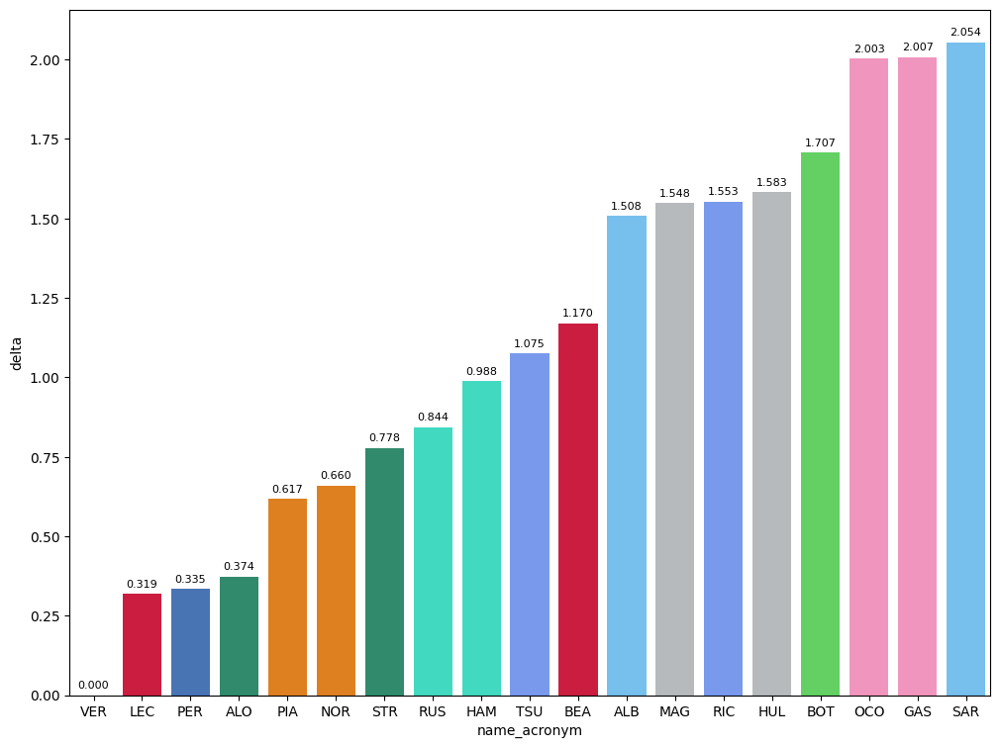

In [140]:
dt = jointables.sort_values(by=['fastest_lap'],ascending=True)
libraryDataF1.obtainchart("name_acronym","delta",dt)

### Speed trap

#### Maximum speed per drivers

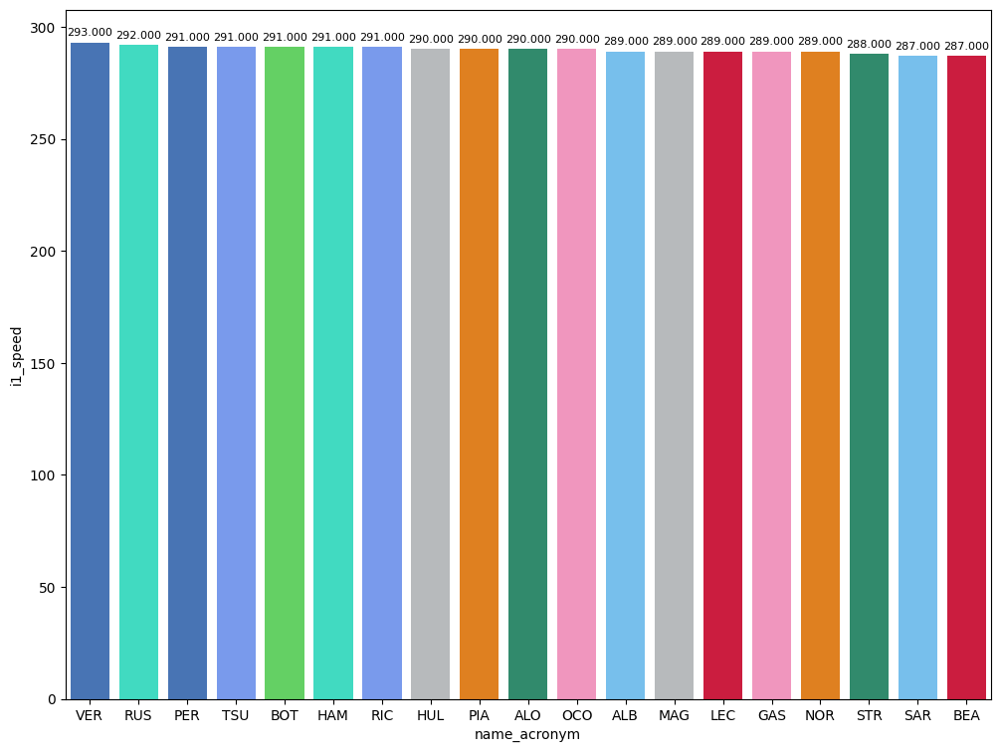

In [141]:
top_speed = jointables.loc[jointables.groupby(['name_acronym'])['i1_speed'].idxmax()].sort_values(by=['i1_speed'],ascending=False)
libraryDataF1.obtainchart("name_acronym","i1_speed",top_speed)

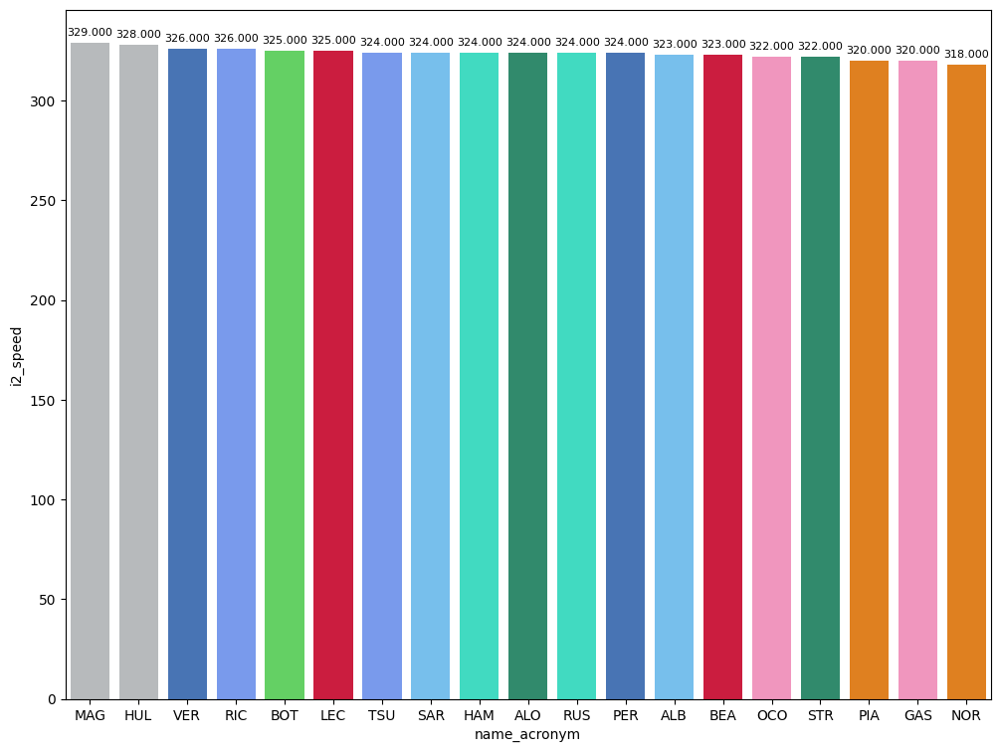

In [142]:
top_speed = jointables.loc[jointables.groupby(['name_acronym'])['i2_speed'].idxmax()].sort_values(by=['i2_speed'],ascending=False)
libraryDataF1.obtainchart("name_acronym","i2_speed",top_speed)

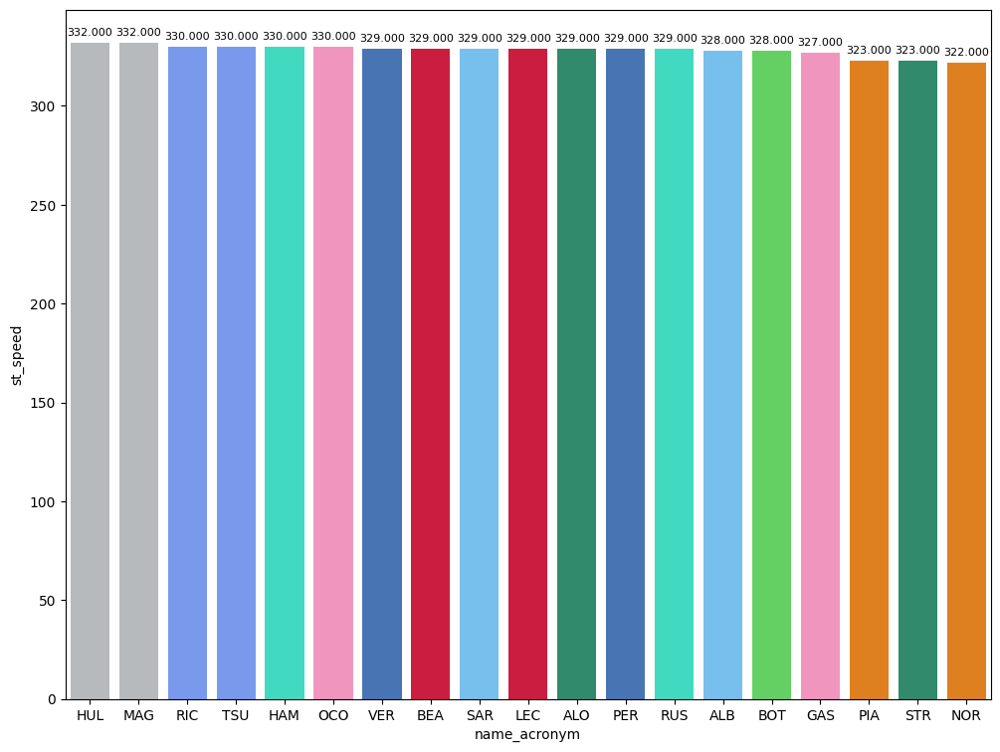

In [143]:
top_speed = jointables.loc[jointables.groupby(['name_acronym'])['st_speed'].idxmax()].sort_values(by=['st_speed'],ascending=False)
libraryDataF1.obtainchart("name_acronym","st_speed",top_speed)

### Maximum speed per teams

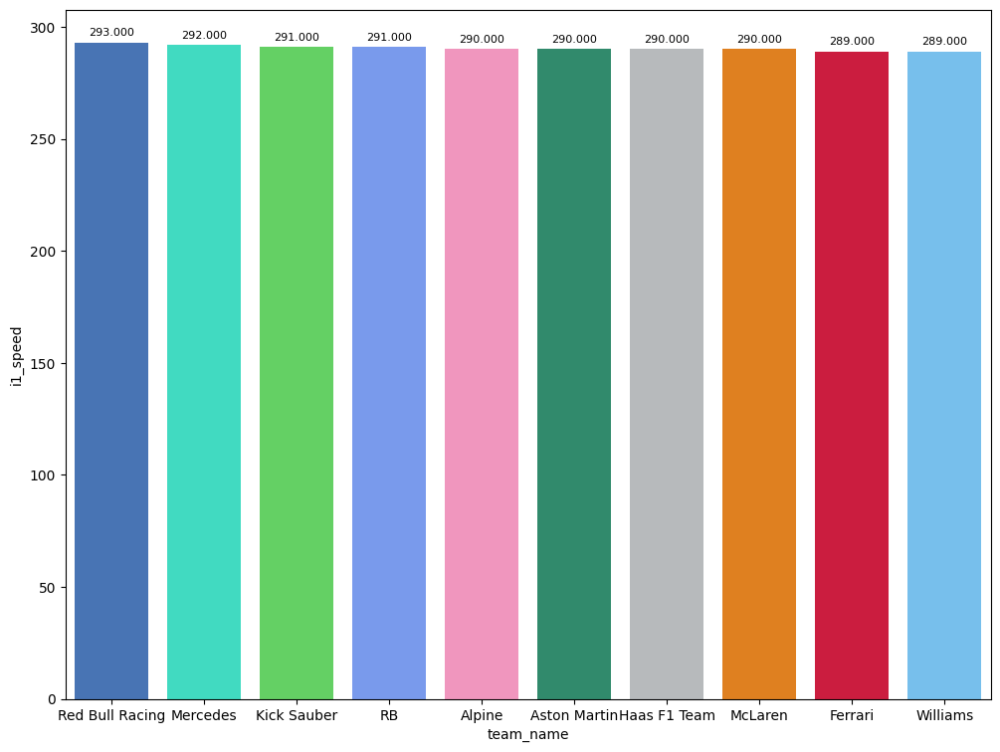

In [144]:
top_speed = jointables.loc[jointables.groupby(['team_name'])['i1_speed'].idxmax()].sort_values(by=['i1_speed'],ascending=False)
libraryDataF1.obtainchart("team_name","i1_speed",top_speed)

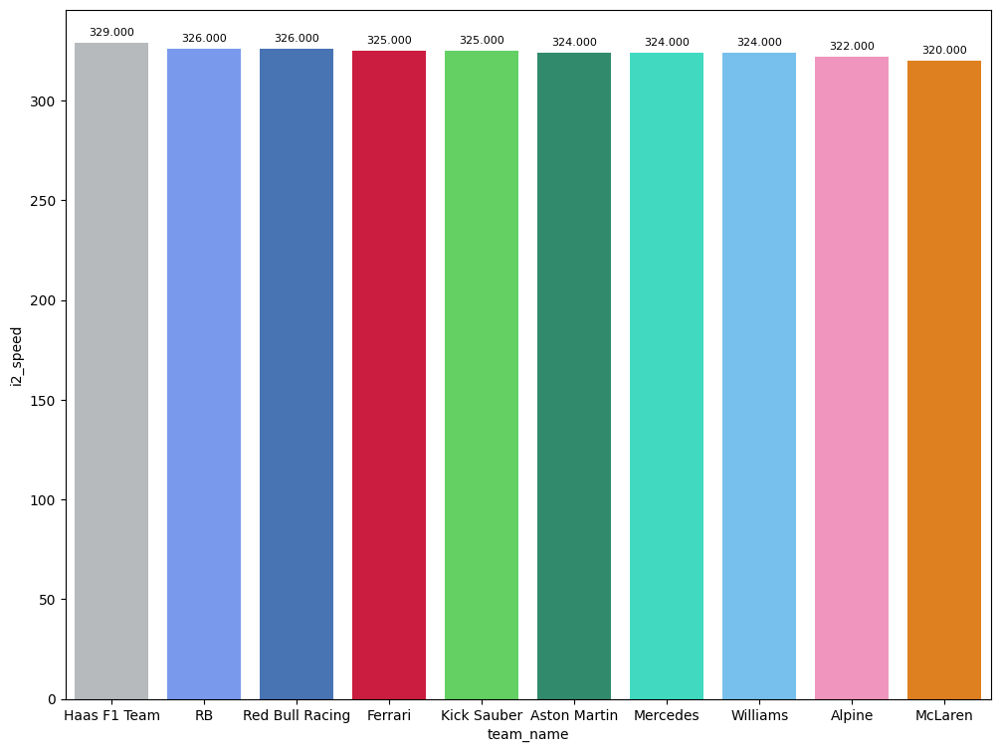

In [145]:
top_speed = jointables.loc[jointables.groupby(['team_name'])['i2_speed'].idxmax()].sort_values(by=['i2_speed'],ascending=False)
libraryDataF1.obtainchart("team_name","i2_speed",top_speed)

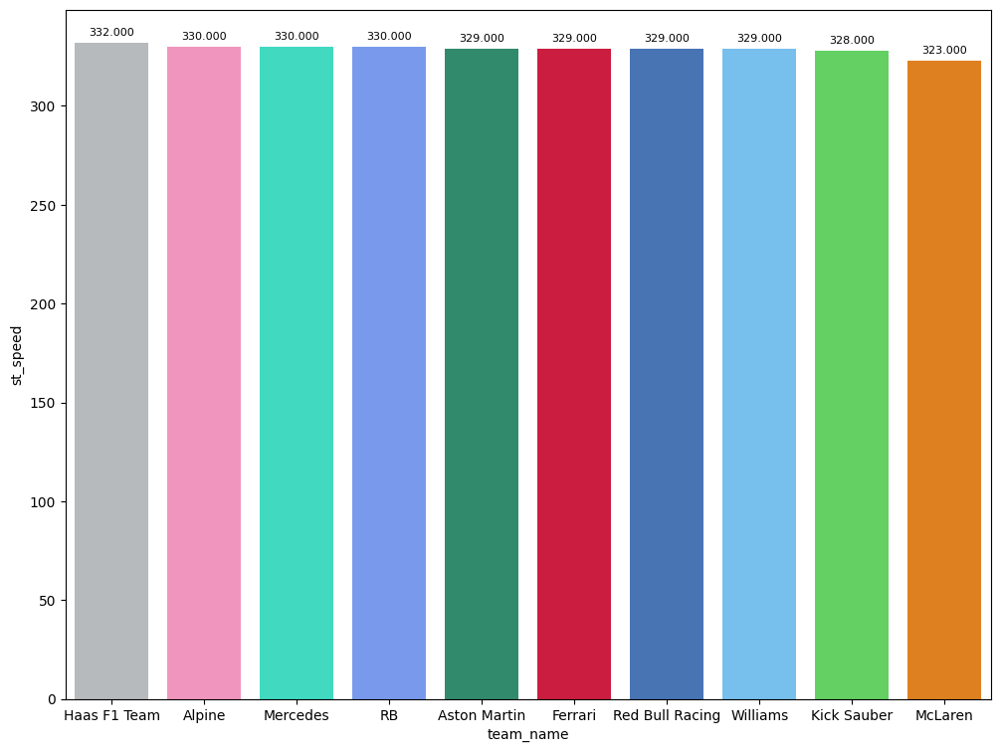

In [146]:
top_speed = jointables.loc[jointables.groupby(['team_name'])['st_speed'].idxmax()].sort_values(by=['st_speed'],ascending=False)
libraryDataF1.obtainchart("team_name","st_speed",top_speed)

In [147]:
mergequaly = pd.merge(competitiveLaps,drivers,on=['driver_number'])

In order to know when each session finished, race control dataset will be consulted.

In [148]:
maximumDateQ1 = "date_start <'2024-03-08T17:25:00+00:00'"
maximumDateQ2 = "date_start <'2024-03-08T17:53:00+00:00' and date_start >'2024-03-08T17:25:00+00:00'"
maximumDateQ3 = "date_start >'2024-03-08T17:53:00+00:00'"

### Qualyfing 1
In this session, I did not see any surprise with the favourites qualyfing to Q2. As we can in testing, we knew that Alpine was the worst team and that was constrasted in qualyfing finishing P19 and P20. Other team that finished out of Q1 was Kick Sauber finishing Zhou P17 and Bottas P16. Differences beetween sectors will be shown in the following section.

In [149]:
q1Data = libraryDataF1.obtainInfoAboutQualySession(mergequaly,maximumDateQ1).query("isFastestLap == True").sort_values(by=['lap_duration'],ascending=True)

##### Comparaison with driver at risk
In this section with the fastest lap done for each driver (laptimes deleted will not be taken into account to do this analysis) it will do a comparaison in order to see where the driver eliminated lost/gain time in their fastest lap.

In [150]:
#Reference
P15 = q1Data[14:15]

In [151]:
print(
"Driver:",P15.full_name.to_string(index=False),
"Sector 1: ",P15.duration_sector_1.to_string(index=False),
"Sector 2: ",P15.duration_sector_2.to_string(index=False),
"Sector 3: ",P15.duration_sector_3.to_string(index=False)
)

Driver: Alexander ALBON Sector 1:  32.284 Sector 2:  28.293 Sector 3:  28.53


##### Analysis of each sector of the driver at risk compared to the drivers eliminated.
In the first sector we can see that none of the eliminated drivers were close to pass to Q2.

In [152]:
newdataset2 = pd.DataFrame()
for index,row in q1Data[15::].iterrows():
    newdataset2 = libraryDataF1.obtain_difference_regard_reference(row,P15,newdataset2)

newdataset2

,driver_number,lap_duration,difference_sector_1,difference_sector_2,difference_sector_3,name_acronym
0,77,0.072,0.195,0.048,-0.171,BOT
1,31,0.368,0.371,-0.043,0.040,OCO
2,10,0.372,0.234,0.076,0.062,GAS
3,2,0.419,0.407,0.090,-0.078,SAR


/home/frank/.local/lib/python3.8/site-packages/fastf1/utils.py:91: FutureWarning:

`utils.delta_time` is considered deprecated and willbe modified or removed in a future release because it hasa tendency to give inaccurate results.

/home/frank/.local/lib/python3.8/site-packages/fastf1/utils.py:91: FutureWarning:

`utils.delta_time` is considered deprecated and willbe modified or removed in a future release because it hasa tendency to give inaccurate results.

/home/frank/.local/lib/python3.8/site-packages/fastf1/utils.py:91: FutureWarning:

`utils.delta_time` is considered deprecated and willbe modified or removed in a future release because it hasa tendency to give inaccurate results.

/home/frank/.local/lib/python3.8/site-packages/fastf1/utils.py:91: FutureWarning:

`utils.delta_time` is considered deprecated and willbe modified or removed in a future release because it hasa tendency to give inaccurate results.



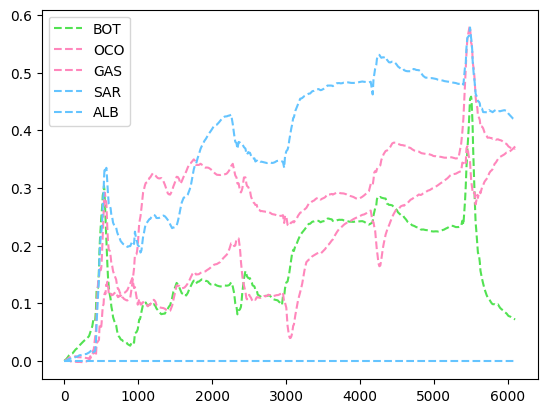

In [153]:
libraryDataF1.draw_gap(P15,15,20,q1Data,drivers,session)

##### Analysis with the drivers that finished better than the driver at risk
I bring this section in order to know where the driver at risk lost his chances to improve in the qualyfing.
In general, the unique driver that was at risk if Albon had improved his first sector it would have been Magnussen because his first was worse than the Thailand driver.

In [154]:
newdataset2 = pd.DataFrame()
for index,row in q1Data[0:14].iterrows():
    newdataset2 = libraryDataF1.obtain_difference_regard_reference(row,P15,newdataset2)

newdataset2

,driver_number,lap_duration,difference_sector_1,difference_sector_2,difference_sector_3,name_acronym
0,1,-0.936,-0.331,-0.302,-0.303,VER
1,18,-0.857,-0.237,-0.371,-0.249,STR
2,16,-0.789,-0.184,-0.245,-0.360,LEC
3,11,-0.469,-0.203,0.023,-0.289,PER
4,14,-0.401,-0.192,-0.309,0.100,ALO
5,63,-0.358,0.102,-0.272,-0.188,RUS
6,81,-0.352,-0.147,-0.193,-0.012,PIA
7,4,-0.302,-0.082,-0.142,-0.078,NOR
8,38,-0.123,0.155,-0.025,-0.253,BEA
9,22,-0.119,0.130,-0.120,-0.129,TSU


#### Best sector per driver
In this section we can see the best sector of the session

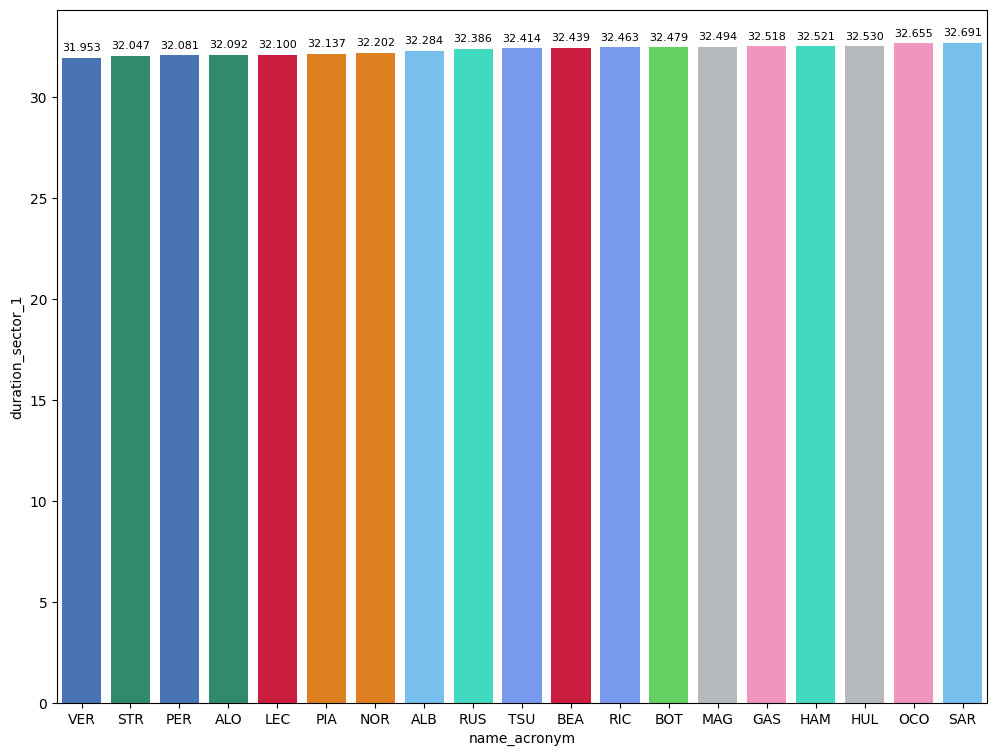

In [155]:
libraryDataF1.obtainchart("name_acronym","duration_sector_1",q1Data.sort_values(by=['duration_sector_1'],ascending=True))

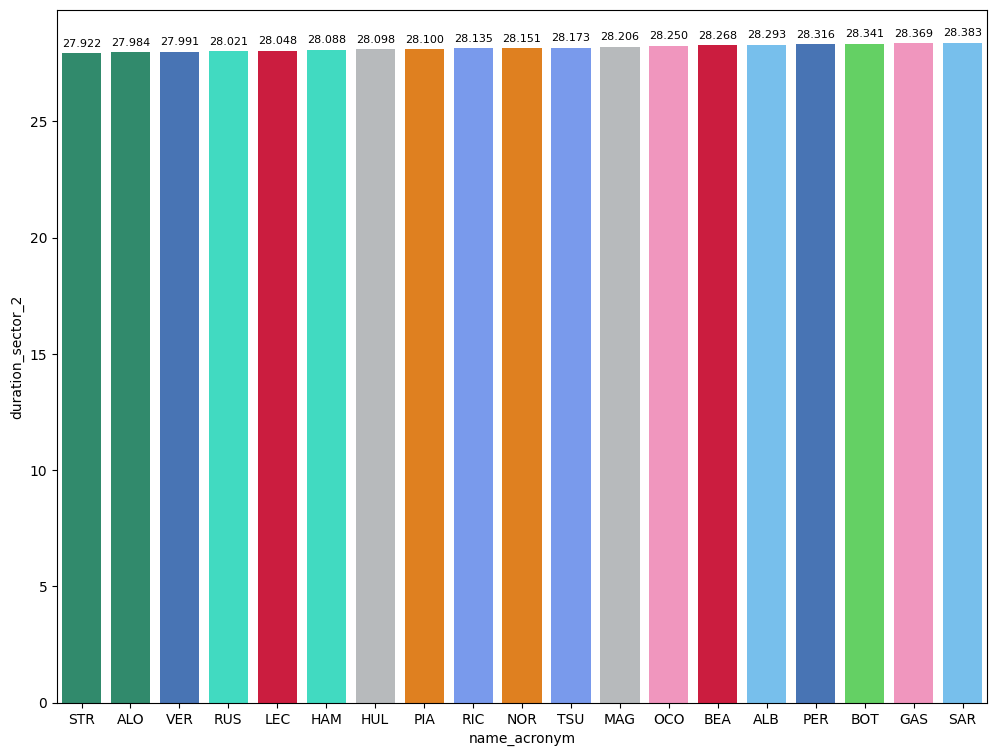

In [156]:
libraryDataF1.obtainchart("name_acronym","duration_sector_2",q1Data.sort_values(by=['duration_sector_2'],ascending=True))

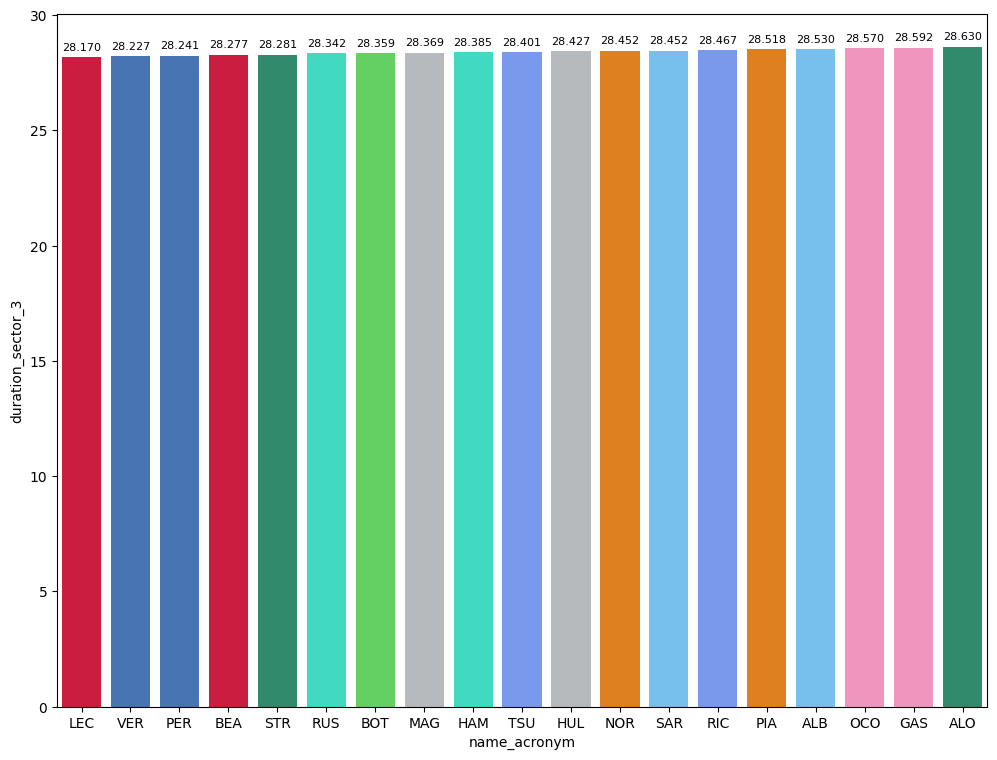

In [157]:
libraryDataF1.obtainchart("name_acronym","duration_sector_3",q1Data.sort_values(by=['duration_sector_3'],ascending=True))

### Qualyfing 2
In this session, we had the surprise of the Stroll's elimination finishing P12 and the incredible lap that afford to promote Hulkenberg to P6. Also, both RB were knocked-out finishing Tsunoda 9 thousands behind Piastri

In [158]:
q2Data = libraryDataF1.obtainInfoAboutQualySession(mergequaly,maximumDateQ2).query("isFastestLap == True").sort_values(by=['lap_duration'],ascending=True)

##### Comparaison with driver at risk
In this section with the fastest lap done for each driver (laptimes deleted will not be taken into account to do this analysis) it will be a comparaison in order to see where the driver eliminated lost/gain time in their fastest lap.

In [159]:
#Reference
P10 = q2Data[9:10]
print(
"Driver:",P10.full_name.to_string(index=False),
"Sector 1: ",P10.duration_sector_1.to_string(index=False),
"Sector 2: ",P10.duration_sector_2.to_string(index=False),
"Sector 3: ",P10.duration_sector_3.to_string(index=False)
)

Driver: Lewis HAMILTON Sector 1:  32.499 Sector 2:  27.927 Sector 3:  28.18


##### Analysis of each sector of the driver at risk compared to the drivers eliminated.
In the first sector we can see that Bearman and Albon were faster than Hamilton, being Bearman chances to make it through Q3.
But the rookie was not able to improve in the second and third sector to pass to Q3

In [160]:
newdataset2 = pd.DataFrame()
for index,row in q2Data[10::].iterrows():
    newdataset2 = libraryDataF1.obtain_difference_regard_reference(row,P10,newdataset2)

newdataset2

,driver_number,lap_duration,difference_sector_1,difference_sector_2,difference_sector_3,name_acronym
0,38,0.036,-0.244,0.188,0.092,BEA
1,23,0.374,-0.015,0.198,0.191,ALB
2,20,0.414,0.015,0.234,0.165,MAG
3,3,0.419,0.096,0.265,0.058,RIC


/home/frank/.local/lib/python3.8/site-packages/fastf1/utils.py:91: FutureWarning:

`utils.delta_time` is considered deprecated and willbe modified or removed in a future release because it hasa tendency to give inaccurate results.

/home/frank/.local/lib/python3.8/site-packages/fastf1/utils.py:91: FutureWarning:

`utils.delta_time` is considered deprecated and willbe modified or removed in a future release because it hasa tendency to give inaccurate results.

/home/frank/.local/lib/python3.8/site-packages/fastf1/utils.py:91: FutureWarning:

`utils.delta_time` is considered deprecated and willbe modified or removed in a future release because it hasa tendency to give inaccurate results.

/home/frank/.local/lib/python3.8/site-packages/fastf1/utils.py:91: FutureWarning:

`utils.delta_time` is considered deprecated and willbe modified or removed in a future release because it hasa tendency to give inaccurate results.



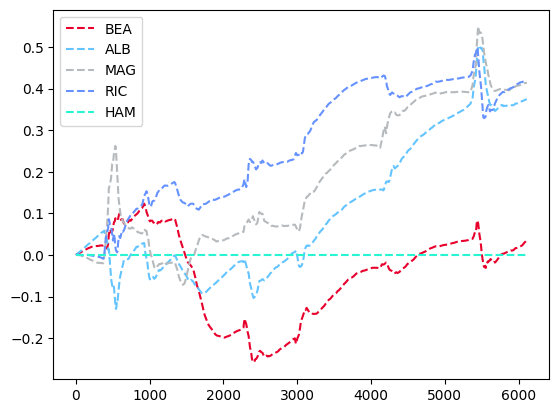

In [161]:
libraryDataF1.draw_gap(P10,10,15,q2Data,drivers,session)

##### Analysis with the drivers that finished better than the driver at risk
I bring this section in order to know where the driver at risk lost his chances to improve in the qualyfing.
Mercedes suffered a lot in the first sector being 3 tenths slower than Stroll in this sector. One thing I would like to stand out is the third sector of Stroll who, if he had improved his sector he would have been able to finish,at least, in P6.

In [162]:
newdataset2 = pd.DataFrame()
for index,row in q2Data[0:9].iterrows():
    newdataset2 = libraryDataF1.obtain_difference_regard_reference(row,P10,newdataset2)

newdataset2

,driver_number,lap_duration,difference_sector_1,difference_sector_2,difference_sector_3,name_acronym
0,1,-0.573,-0.607,0.108,-0.074,VER
1,16,-0.494,-0.390,-0.059,-0.045,LEC
2,14,-0.484,-0.535,-0.068,0.119,ALO
3,81,-0.263,-0.438,0.080,0.095,PIA
4,63,-0.158,-0.029,-0.104,-0.025,RUS
5,11,-0.139,-0.290,0.157,-0.006,PER
6,4,-0.127,-0.431,0.112,0.192,NOR
7,22,-0.042,-0.231,0.130,0.059,TSU
8,18,-0.028,-0.416,0.007,0.381,STR


#### Best sector per driver
In this section we can see the best sector of the session

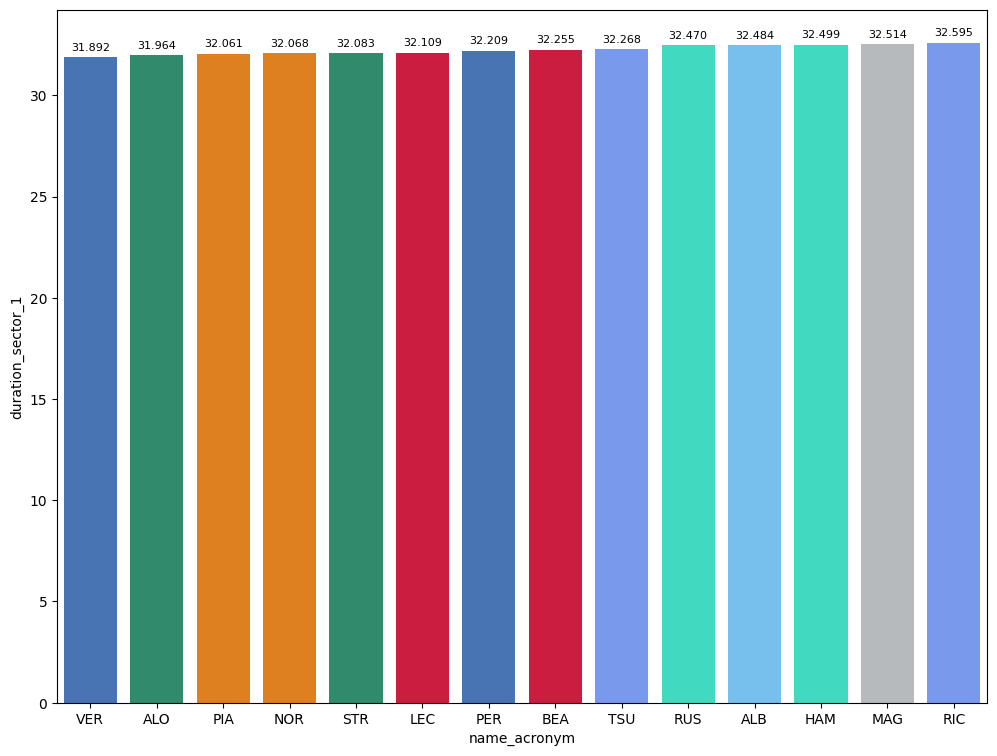

In [163]:
libraryDataF1.obtainchart("name_acronym","duration_sector_1",q2Data.sort_values(by=['duration_sector_1'],ascending=True))

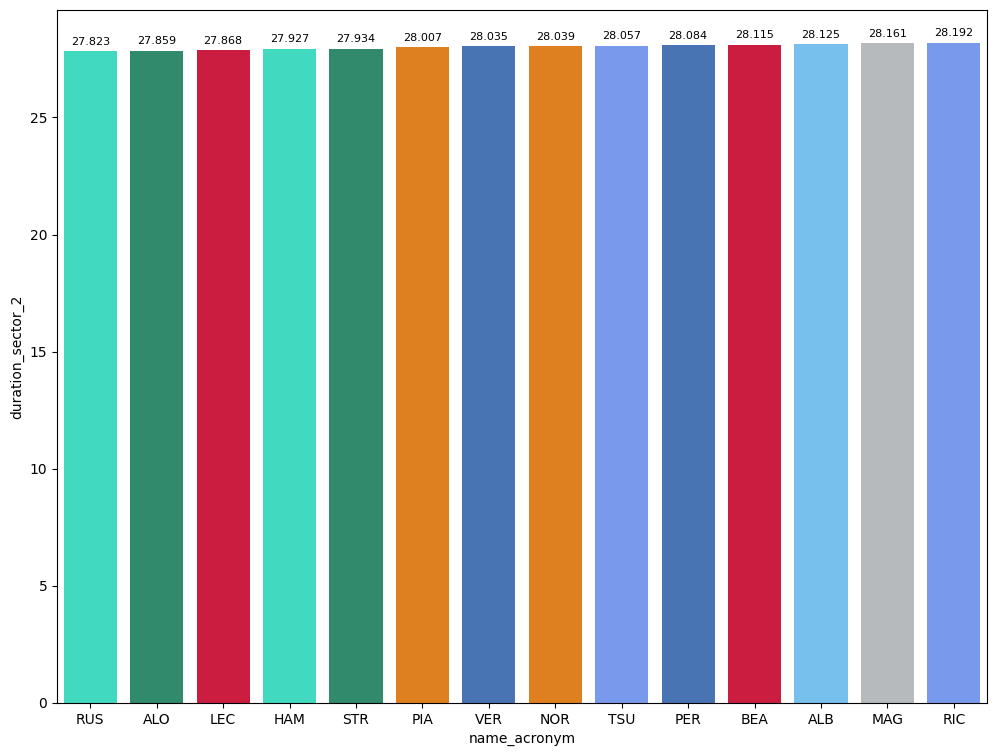

In [164]:
libraryDataF1.obtainchart("name_acronym","duration_sector_2",q2Data.sort_values(by=['duration_sector_2'],ascending=True))

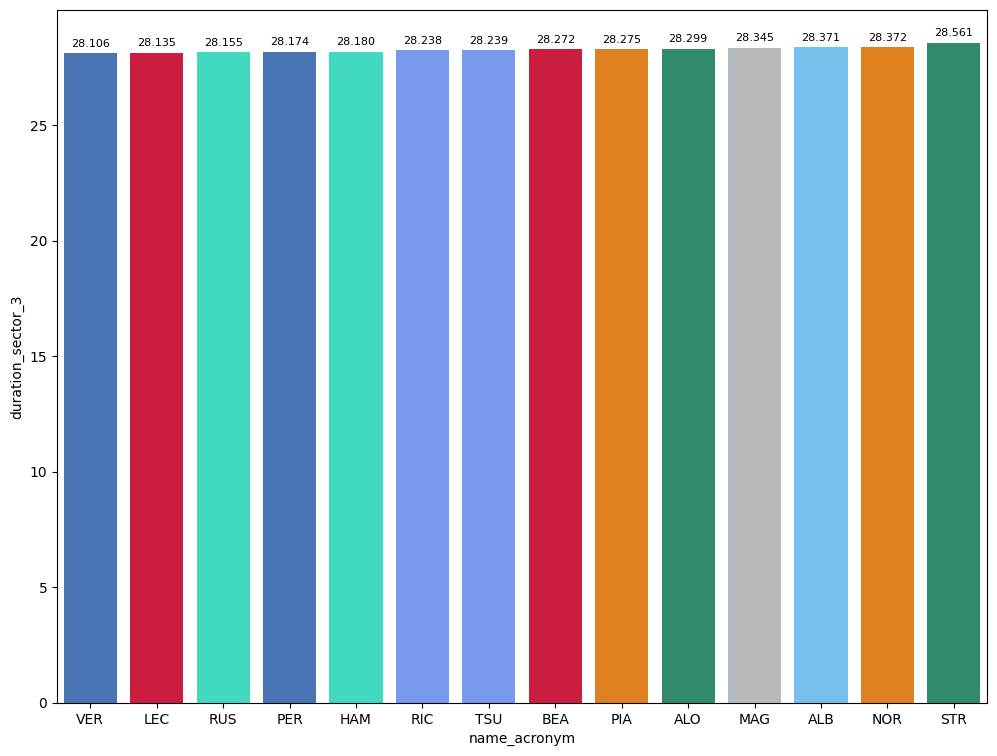

In [165]:
libraryDataF1.obtainchart("name_acronym","duration_sector_3",q2Data.sort_values(by=['duration_sector_3'],ascending=True))

### Qualyfing 3

In [166]:
q3Data = libraryDataF1.obtainInfoAboutQualySession(mergequaly,maximumDateQ3).query("isFastestLap == True").sort_values(by=['lap_duration'],ascending=True)

##### Comparaison with poleman
In this section with the fastest lap done for each driver (laptimes deleted will not be taken into account to do this analysis) it will be a comparaison in order to see where the driver eliminated lost/gain time in their fastest lap.

In [167]:
#Reference
P1 = q3Data[:1]
print(
"Driver:",P1.full_name.to_string(index=False),
"Sector 1: ",P1.duration_sector_1.to_string(index=False),
"Sector 2: ",P1.duration_sector_2.to_string(index=False),
"Sector 3: ",P1.duration_sector_3.to_string(index=False)
)

Driver: Max VERSTAPPEN Sector 1:  31.763 Sector 2:  27.8 Sector 3:  27.909


##### Analysis of each sector of the driver at risk compared to the drivers eliminated.
Verstappen did not have any problem to defend his pole. Until the third sector, the driver that was closer Verstappen was Fernando but the problem that Aston Martin has with the straights impeding to take the P2.

In [168]:
newdataset2 = pd.DataFrame()
for index,row in q3Data[1::].iterrows():
    newdataset2 = libraryDataF1.obtain_difference_regard_reference(row,P1,newdataset2)
newdataset2

,driver_number,lap_duration,difference_sector_1,difference_sector_2,difference_sector_3,name_acronym
0,16,0.319,0.170,0.042,0.107,LEC
1,11,0.335,0.181,0.066,0.088,PER
2,14,0.374,0.077,0.023,0.274,ALO
3,81,0.617,0.231,0.088,0.298,PIA
4,4,0.660,0.117,0.222,0.321,NOR
5,63,0.844,0.530,0.084,0.230,RUS
6,44,0.988,0.656,0.079,0.253,HAM
7,22,1.075,0.417,0.310,0.348,TSU
8,18,1.100,0.180,0.212,0.708,STR


#### Best sector per driver
In this section we can see the best sector of the session

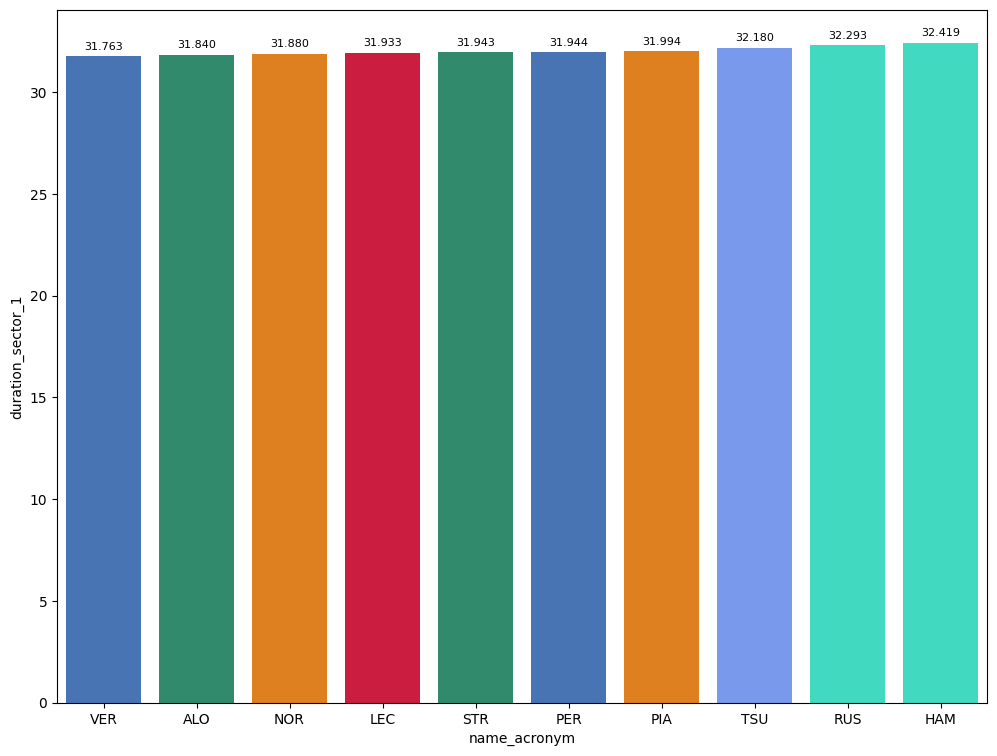

In [169]:
libraryDataF1.obtainchart("name_acronym","duration_sector_1",q3Data.sort_values(by=['duration_sector_1'],ascending=True))

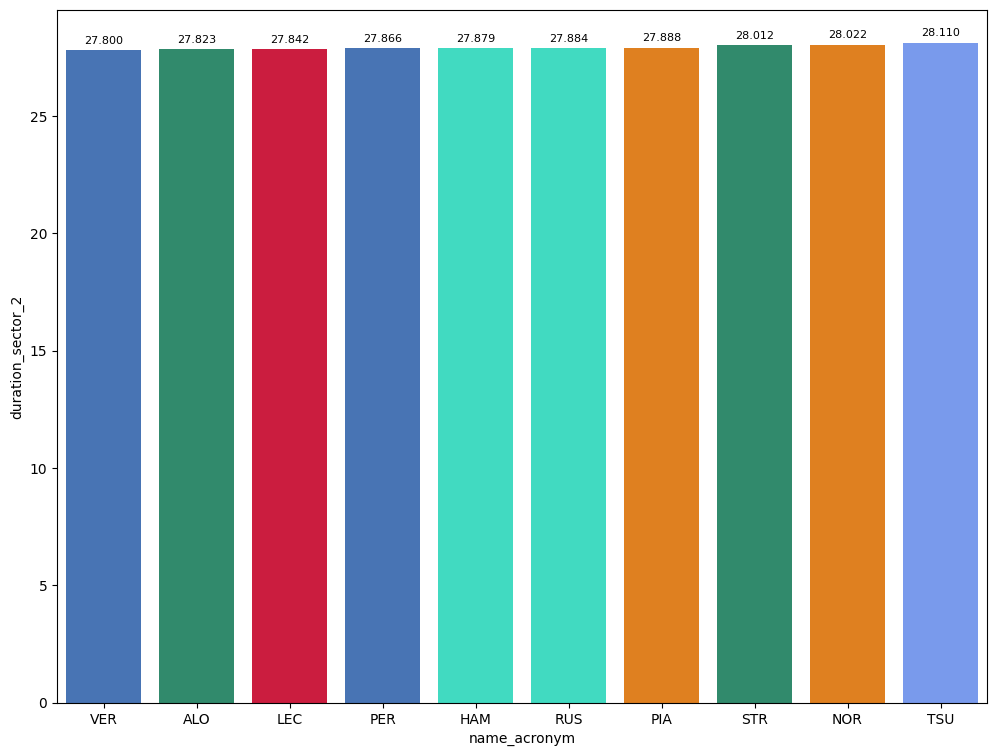

In [170]:
libraryDataF1.obtainchart("name_acronym","duration_sector_2",q3Data.sort_values(by=['duration_sector_2'],ascending=True))

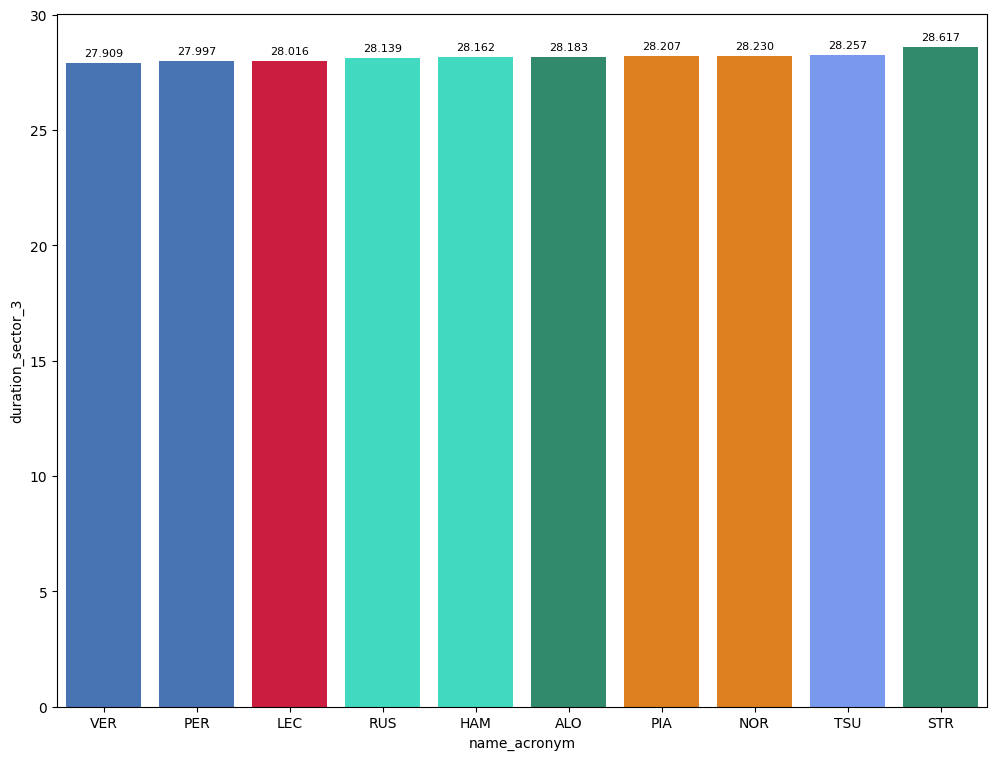

In [171]:
libraryDataF1.obtainchart("name_acronym","duration_sector_3",q3Data.sort_values(by=['duration_sector_3'],ascending=True))

#### Best sector per driver of the session (in general)

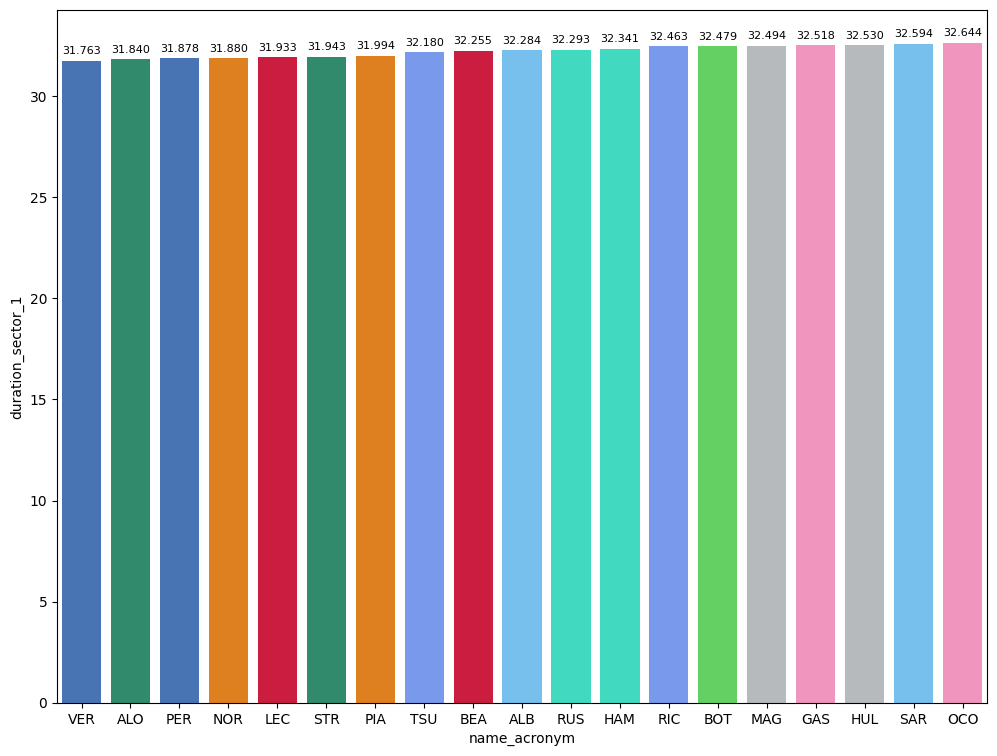

In [172]:
libraryDataF1.obtainchart("name_acronym","duration_sector_1",pd.DataFrame(mergequaly.groupby("name_acronym")['duration_sector_1'].min().sort_values(ascending=True)).reset_index())

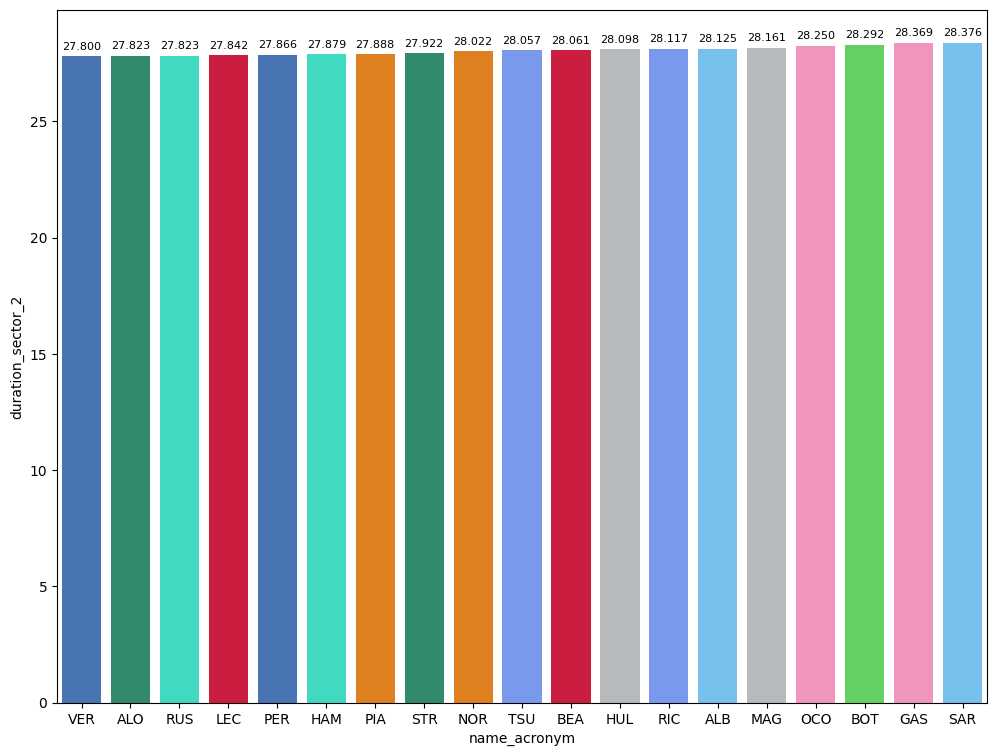

In [173]:
libraryDataF1.obtainchart("name_acronym","duration_sector_2",pd.DataFrame(mergequaly.groupby("name_acronym")['duration_sector_2'].min().sort_values(ascending=True)).reset_index())

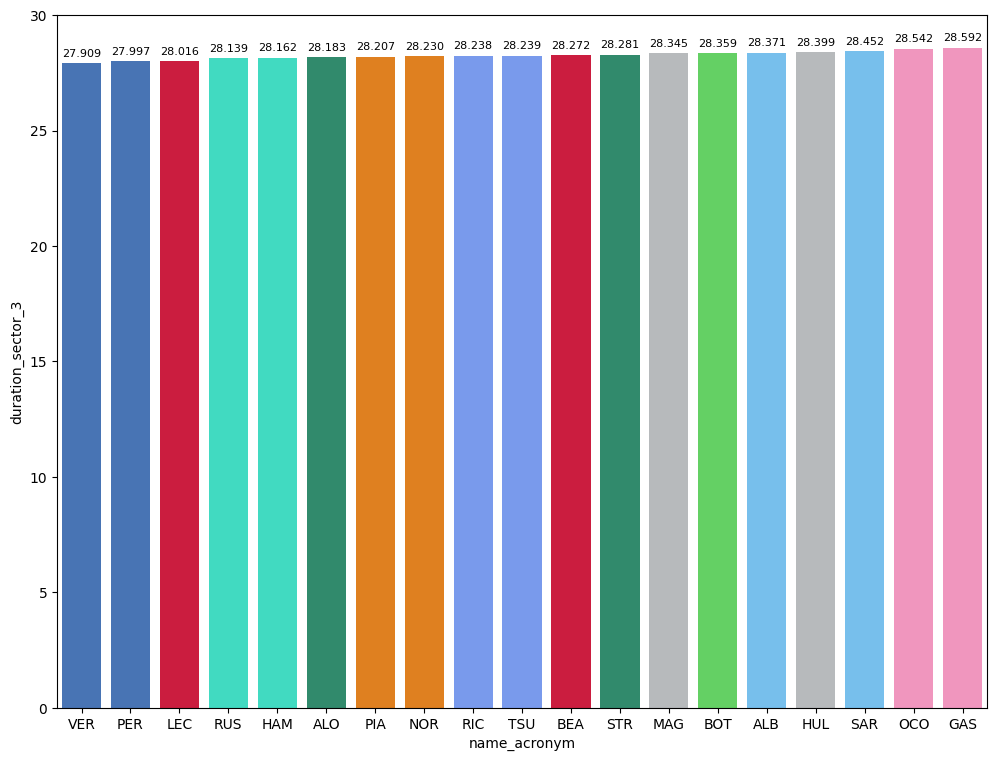

In [174]:
libraryDataF1.obtainchart("name_acronym","duration_sector_3",pd.DataFrame(mergequaly.groupby("name_acronym")['duration_sector_3'].min().sort_values(ascending=True)).reset_index())

### Gear shifts of the poleman

core        WARNING 	Failed to preserve data type for column 'X' while merging telemetry.
core        WARNING 	Failed to preserve data type for column 'Y' while merging telemetry.
core        WARNING 	Failed to preserve data type for column 'Z' while merging telemetry.


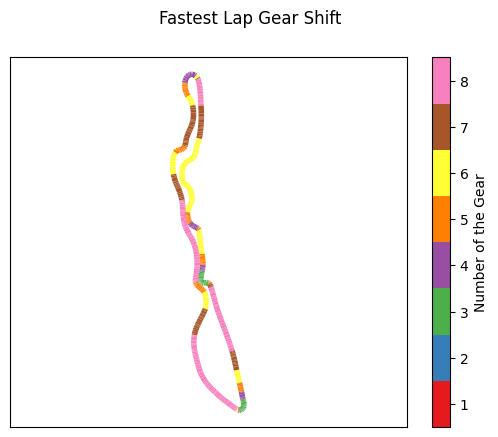

In [175]:
libraryDataF1.show_shifts_poleman(session)

### Comparaison between the poleman and the second

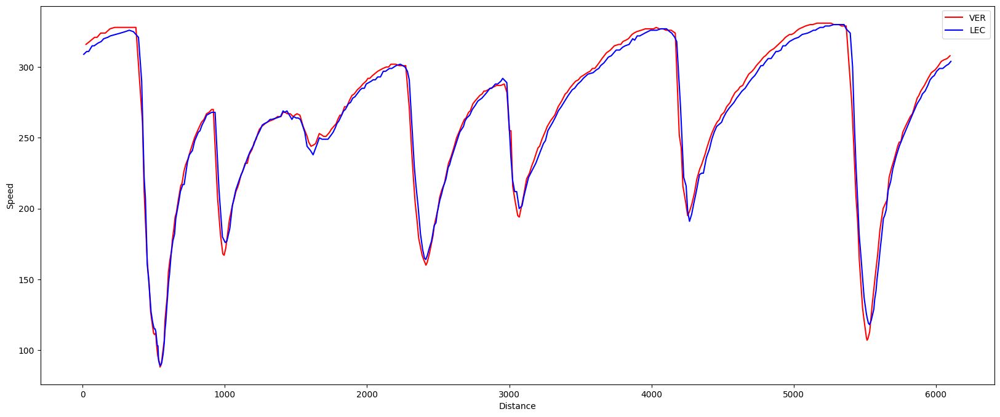

In [176]:
libraryDataF1.plot_telemetry("Distance","Speed",dt,session)

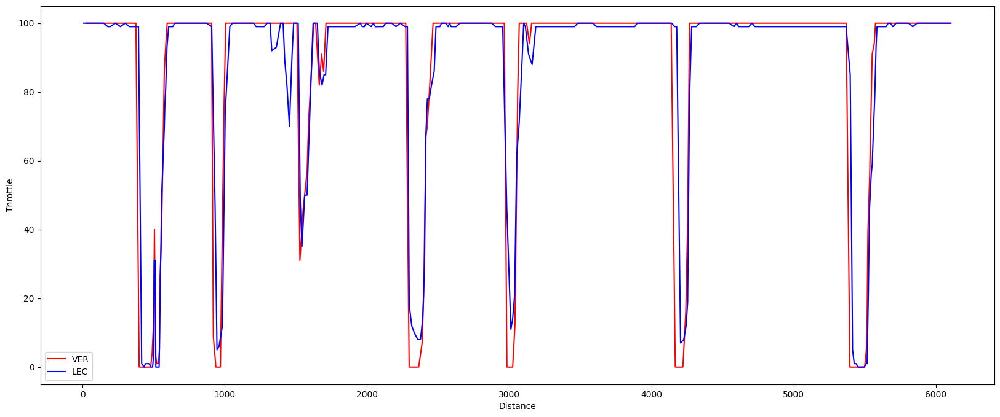

In [177]:
libraryDataF1.plot_telemetry("Distance","Throttle",dt,session)

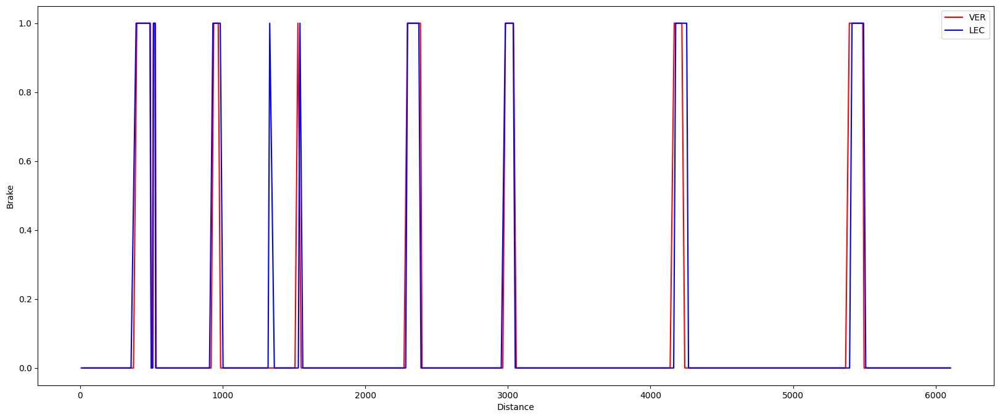

In [178]:
libraryDataF1.plot_telemetry("Distance","Brake",dt,session)

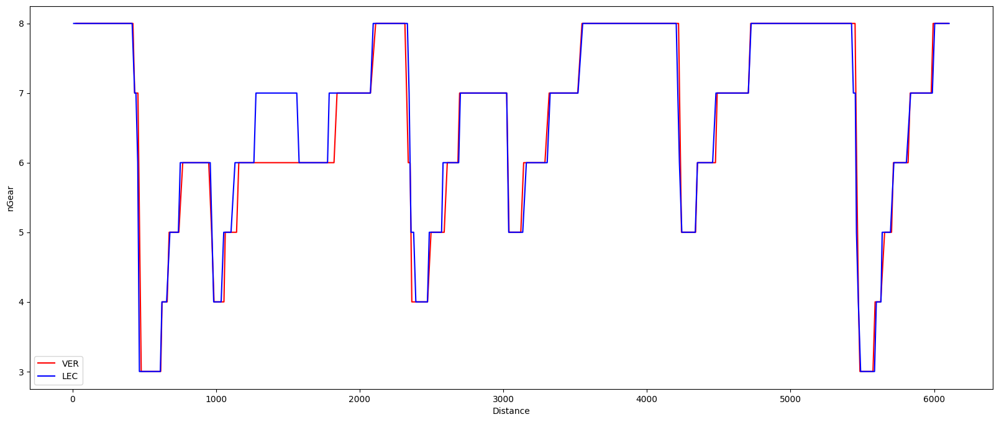

In [179]:
libraryDataF1.plot_telemetry("Distance","nGear",dt,session)

## Race
### Obtain setup

In [180]:
race = libraryDataF1.obtain_information('laps',session_key=9480)
stintInformation = libraryDataF1.obtain_information('stints',session_key=9480)
drivers = libraryDataF1.obtain_information('drivers',session_key=9480)

In [181]:
stintsDataFrame =libraryDataF1.stint_configuration(drivers,stintInformation)

In [182]:
raceLaps = race.query("is_pit_out_lap == False")
jointables = pd.merge(raceLaps,stintsDataFrame,on=['lap_number','driver_number'])

### Mean pace with the different compound used on the session

In [183]:
race_pace = pd.DataFrame(jointables.query("is_pit_out_lap == False  and lap_duration <= 108").groupby("compound")['lap_duration'].mean().sort_values(ascending=True))
race_pace

,lap_duration
compound,
SOFT,93.328127
HARD,94.236979
MEDIUM,95.054641


### Speed trap

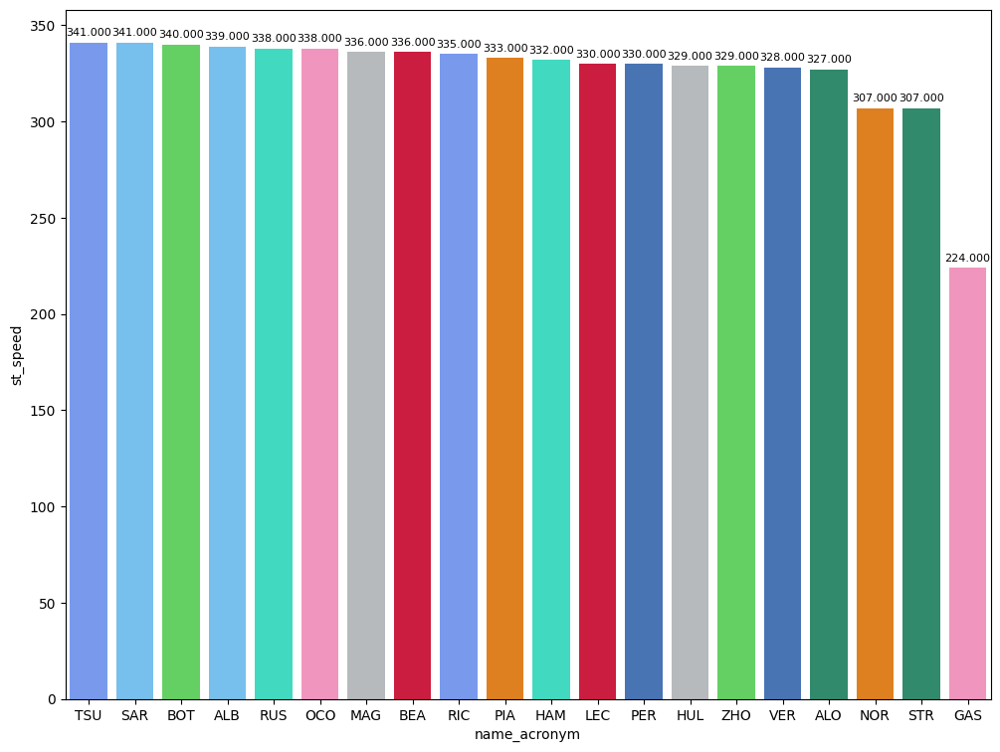

In [184]:
top_speed = jointables.loc[jointables.groupby(['name_acronym'])['st_speed'].idxmax()].sort_values(by=['st_speed'],ascending=False)
libraryDataF1.obtainchart("name_acronym","st_speed",top_speed)

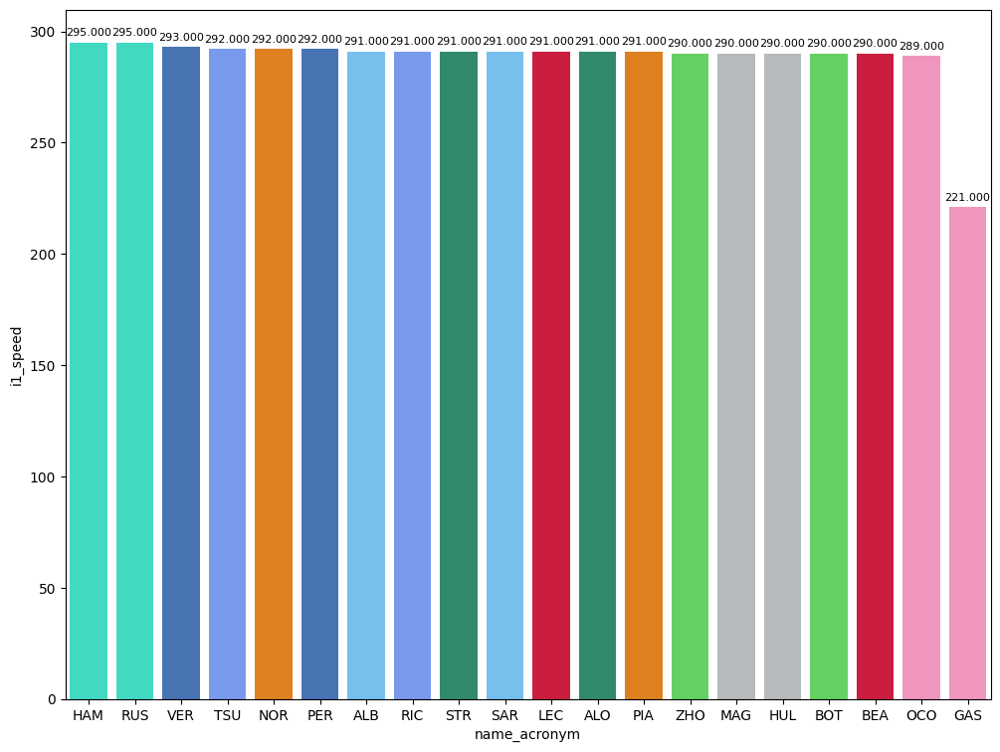

In [185]:
top_speed = jointables.loc[jointables.groupby(['name_acronym'])['i1_speed'].idxmax()].sort_values(by=['i1_speed'],ascending=False)
libraryDataF1.obtainchart("name_acronym","i1_speed",top_speed)

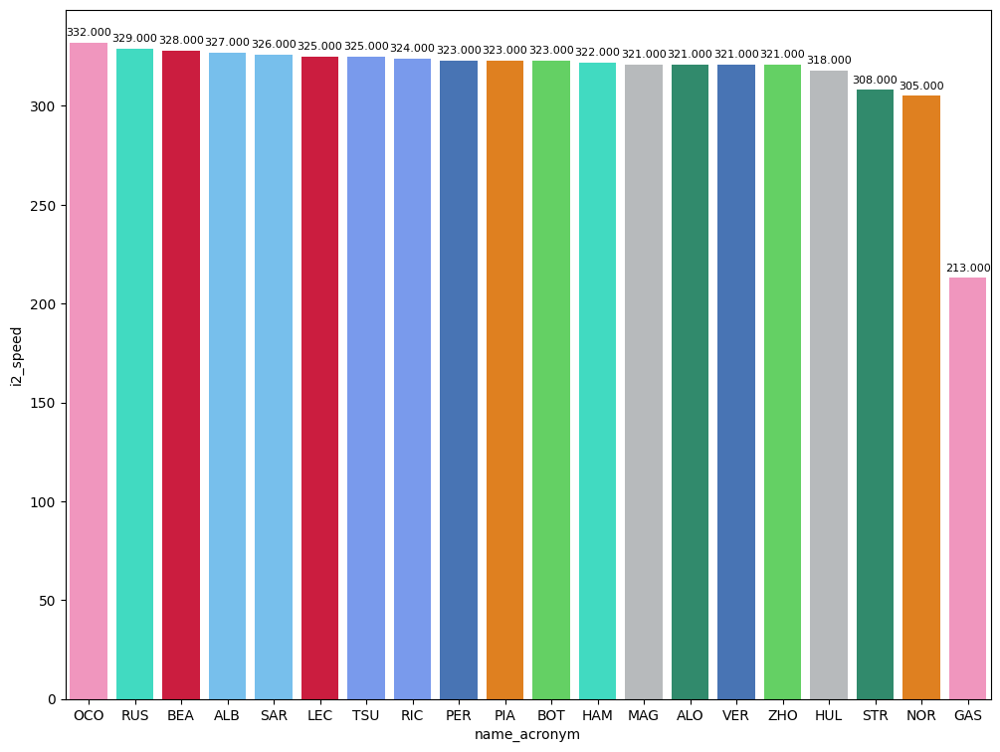

In [186]:
top_speed = jointables.loc[jointables.groupby(['name_acronym'])['i2_speed'].idxmax()].sort_values(by=['i2_speed'],ascending=False)
libraryDataF1.obtainchart("name_acronym","i2_speed",top_speed)

### Race pace
General explanation
Explanation per teams

In [187]:
race_pace = pd.DataFrame(jointables.query("is_pit_out_lap == False  and lap_duration <= 110").dropna().groupby("team_name")['lap_duration'].mean().sort_values(ascending=True))
race_pace

,lap_duration
team_name,
Red Bull Racing,93.021507
Mercedes,93.682692
McLaren,93.693812
Ferrari,93.749191
Aston Martin,94.009000
Haas F1 Team,94.762517
Kick Sauber,95.168416
Alpine,95.418543
RB,95.475843


#### Mean race pace per sector
In this section, we can see the pace shown per each team in each sector sorted ascending.

#### Sector 1
General explanation

In [188]:
race_pace = pd.DataFrame(jointables.query("is_pit_out_lap == False  and lap_duration <= 110").dropna().groupby("team_name")['duration_sector_1'].mean().sort_values(ascending=True))
race_pace

,duration_sector_1
team_name,
Red Bull Racing,34.258884
McLaren,34.541058
Ferrari,34.635044
Aston Martin,34.757429
Mercedes,34.810731
Haas F1 Team,35.182083
Kick Sauber,35.282649
Alpine,35.660400
Williams,35.706267


#### Sector 2
General explanation

In [189]:
race_pace = pd.DataFrame(jointables.query("is_pit_out_lap == False  and lap_duration <= 110").dropna().groupby("team_name")['duration_sector_2'].mean().sort_values(ascending=True))
race_pace

,duration_sector_2
team_name,
Red Bull Racing,29.287725
Mercedes,29.288135
McLaren,29.434319
Aston Martin,29.484750
Ferrari,29.497279
Haas F1 Team,29.723100
Alpine,29.857429
Kick Sauber,29.876506
Williams,29.883500


#### Sector 3
General explanation

In [190]:
race_pace = pd.DataFrame(jointables.query("is_pit_out_lap == False  and lap_duration <= 110").dropna().groupby("team_name")['duration_sector_3'].mean().sort_values(ascending=True))
race_pace

,duration_sector_3
team_name,
Red Bull Racing,29.474899
Mercedes,29.583827
Ferrari,29.616868
McLaren,29.718435
Aston Martin,29.766821
RB,29.818814
Haas F1 Team,29.857333
Williams,29.895667
Alpine,29.900714


### Long runs

In [191]:
MINIMUN_SECONDS = 90
MAXIMUM_SECONDS = 108

#### Red Bull Racing

In [192]:
stintInformation.query('driver_number == 1 or driver_number == 11')

,meeting_key,session_key,stint_number,driver_number,lap_start,lap_end,compound,tyre_age_at_start
2,1230,9480,1,1,1,7,MEDIUM,0
5,1230,9480,1,11,1,7,MEDIUM,0
25,1230,9480,2,1,8,51,HARD,0
26,1230,9480,2,11,8,51,HARD,0


In [193]:
data = libraryDataF1.getinfolongruns(jointables,1,'Red Bull Racing',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
20,Max VERSTAPPEN,MEDIUM,2024-03-09T17:05:34.885000+00:00,2,34.720,29.628,29.857,94.205
39,Max VERSTAPPEN,MEDIUM,2024-03-09T17:07:09.250000+00:00,3,34.530,29.621,29.892,94.043
58,Max VERSTAPPEN,MEDIUM,2024-03-09T17:08:43.306000+00:00,4,34.416,29.541,29.797,93.754
77,Max VERSTAPPEN,MEDIUM,2024-03-09T17:10:17.093000+00:00,5,34.457,29.590,29.908,93.955
96,Max VERSTAPPEN,MEDIUM,2024-03-09T17:11:50.933000+00:00,6,34.355,29.545,29.776,93.676
155,Max VERSTAPPEN,HARD,2024-03-09T17:21:17.723000+00:00,10,35.648,29.514,29.862,95.024
173,Max VERSTAPPEN,HARD,2024-03-09T17:22:52.628000+00:00,11,34.555,29.427,29.628,93.610
191,Max VERSTAPPEN,HARD,2024-03-09T17:24:26.243000+00:00,12,34.391,29.239,29.691,93.321
209,Max VERSTAPPEN,HARD,2024-03-09T17:25:59.611000+00:00,13,34.096,29.411,29.637,93.144
227,Max VERSTAPPEN,HARD,2024-03-09T17:27:32.604000+00:00,14,34.303,29.274,29.617,93.194


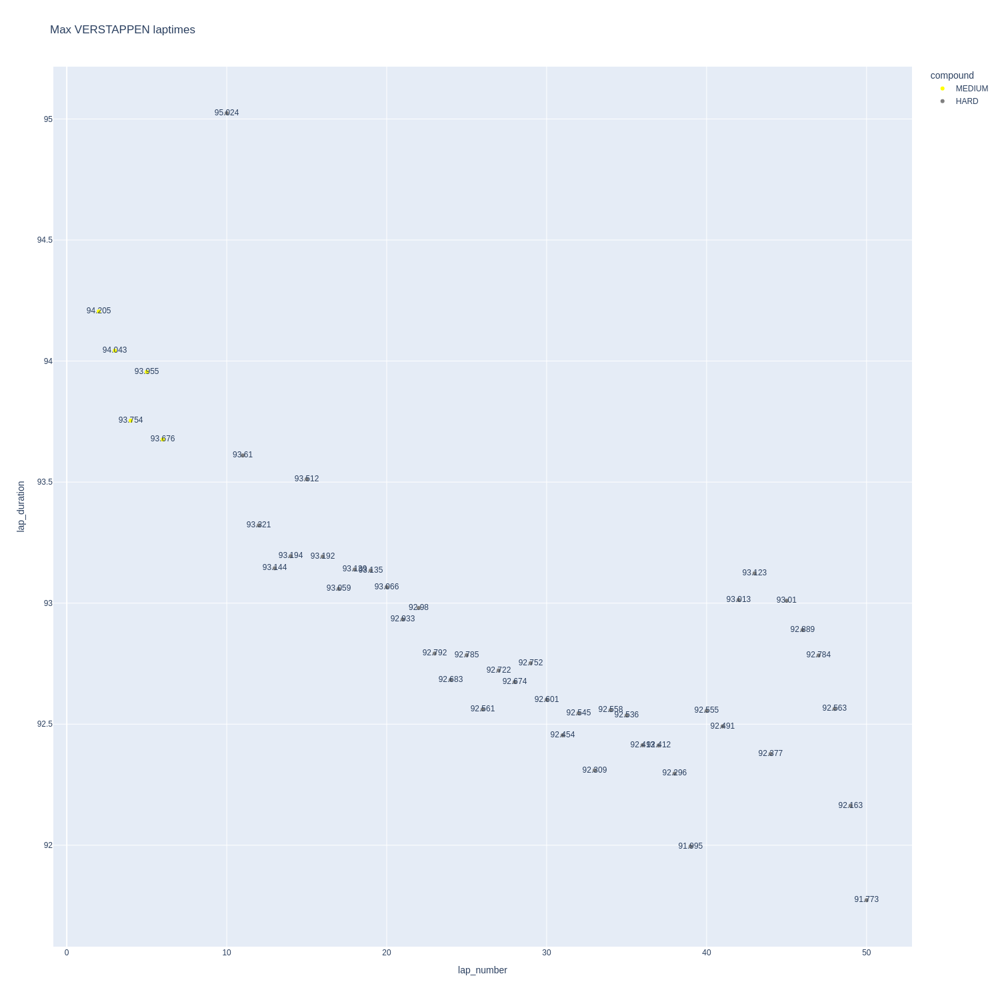

In [194]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

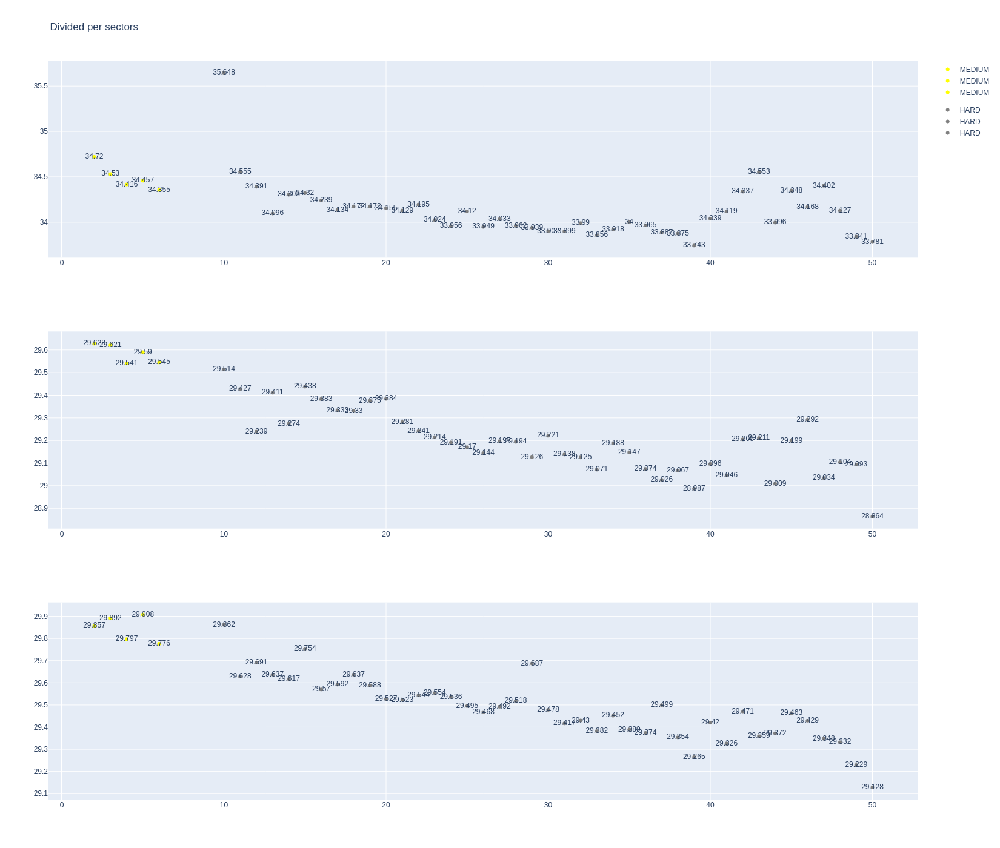

In [195]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

In [196]:
data = libraryDataF1.getinfolongruns(jointables,11,'Red Bull Racing',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
24,Sergio PEREZ,MEDIUM,2024-03-09T17:05:36.711000+00:00,2,35.070,29.781,29.664,94.515
43,Sergio PEREZ,MEDIUM,2024-03-09T17:07:11.256000+00:00,3,34.799,29.603,29.653,94.055
62,Sergio PEREZ,MEDIUM,2024-03-09T17:08:45.305000+00:00,4,34.751,29.570,29.725,94.046
81,Sergio PEREZ,MEDIUM,2024-03-09T17:10:19.312000+00:00,5,34.625,29.673,29.787,94.085
100,Sergio PEREZ,MEDIUM,2024-03-09T17:11:53.330000+00:00,6,34.574,29.549,29.719,93.842
159,Sergio PEREZ,HARD,2024-03-09T17:21:18.137000+00:00,10,36.360,29.896,29.749,96.005
177,Sergio PEREZ,HARD,2024-03-09T17:22:54.126000+00:00,11,35.019,29.543,29.297,93.859
195,Sergio PEREZ,HARD,2024-03-09T17:24:28.016000+00:00,12,35.000,29.502,29.428,93.930
213,Sergio PEREZ,HARD,2024-03-09T17:26:01.897000+00:00,13,34.785,29.641,29.627,94.053
231,Sergio PEREZ,HARD,2024-03-09T17:27:35.851000+00:00,14,34.633,29.519,29.662,93.814


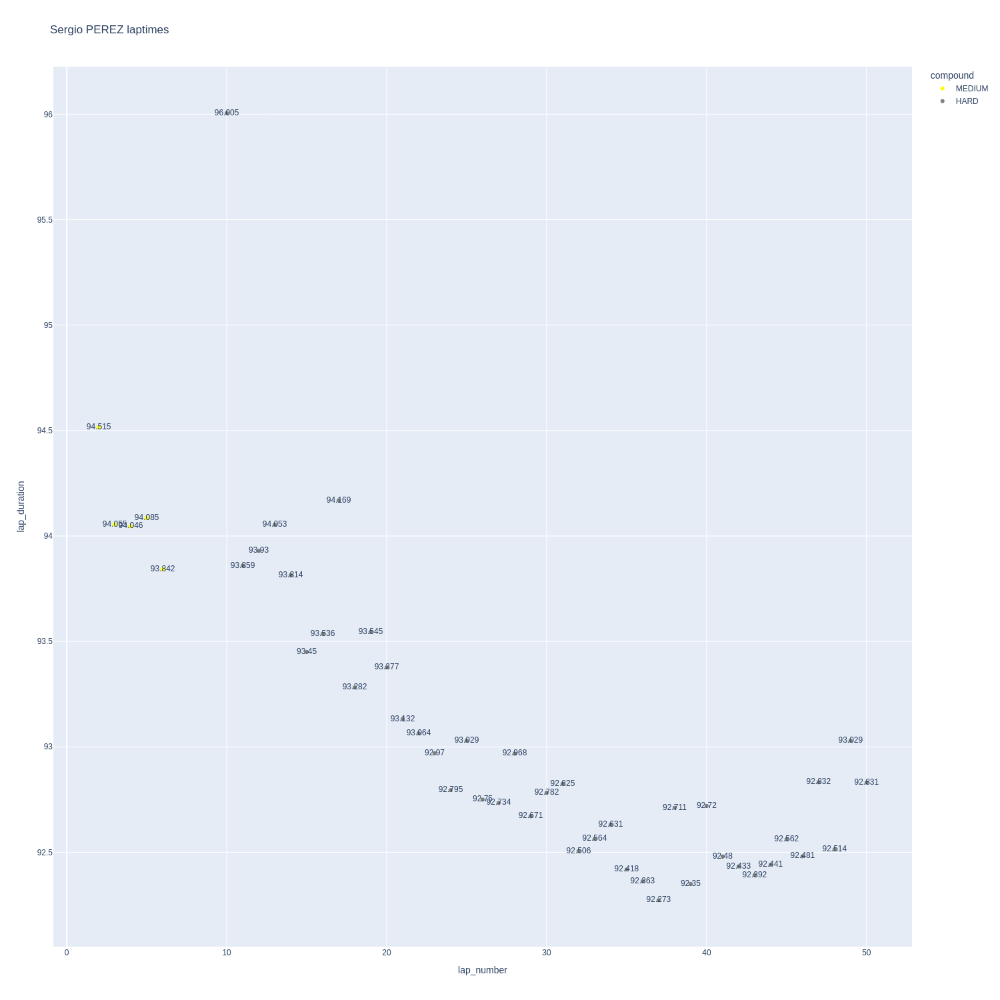

In [197]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

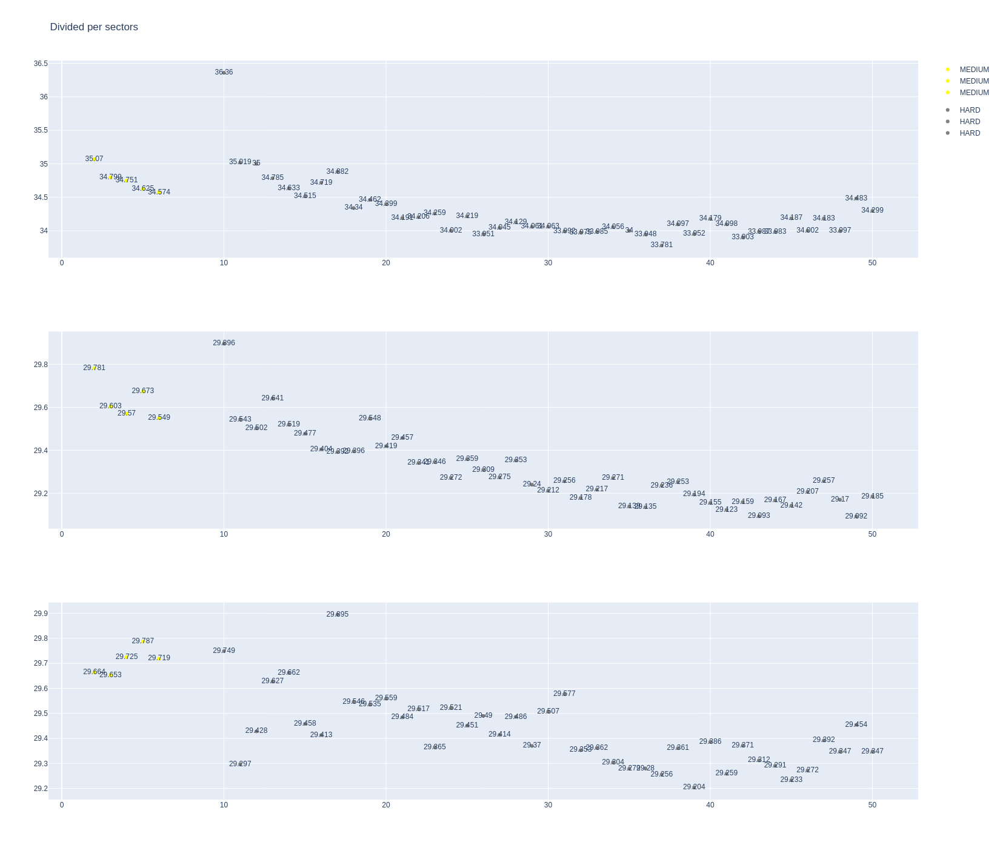

In [198]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

#### Ferrari

In [199]:
stintInformation.query('driver_number == 55 or driver_number == 38')

,meeting_key,session_key,stint_number,driver_number,lap_start,lap_end,compound,tyre_age_at_start
12,1230,9480,1,38,1,7,SOFT,0
31,1230,9480,2,38,8,51,HARD,0


In [200]:
data = libraryDataF1.getinfolongruns(jointables,16,'Ferrari',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
26,Charles LECLERC,MEDIUM,2024-03-09T17:05:36.112000+00:00,2,34.757,29.603,29.819,94.179
45,Charles LECLERC,MEDIUM,2024-03-09T17:07:10.280000+00:00,3,34.851,29.856,29.842,94.549
64,Charles LECLERC,MEDIUM,2024-03-09T17:08:44.924000+00:00,4,35.927,29.635,29.651,95.213
83,Charles LECLERC,MEDIUM,2024-03-09T17:10:20.146000+00:00,5,34.902,29.654,29.826,94.382
102,Charles LECLERC,MEDIUM,2024-03-09T17:11:54.577000+00:00,6,34.737,29.696,29.811,94.244
161,Charles LECLERC,HARD,2024-03-09T17:21:18.576000+00:00,10,36.458,29.741,29.883,96.082
179,Charles LECLERC,HARD,2024-03-09T17:22:54.603000+00:00,11,35.345,29.571,29.527,94.443
197,Charles LECLERC,HARD,2024-03-09T17:24:29.101000+00:00,12,34.732,29.576,29.291,93.599
215,Charles LECLERC,HARD,2024-03-09T17:26:02.823000+00:00,13,35.443,29.747,29.437,94.627
233,Charles LECLERC,HARD,2024-03-09T17:27:37.378000+00:00,14,35.106,29.602,29.331,94.039


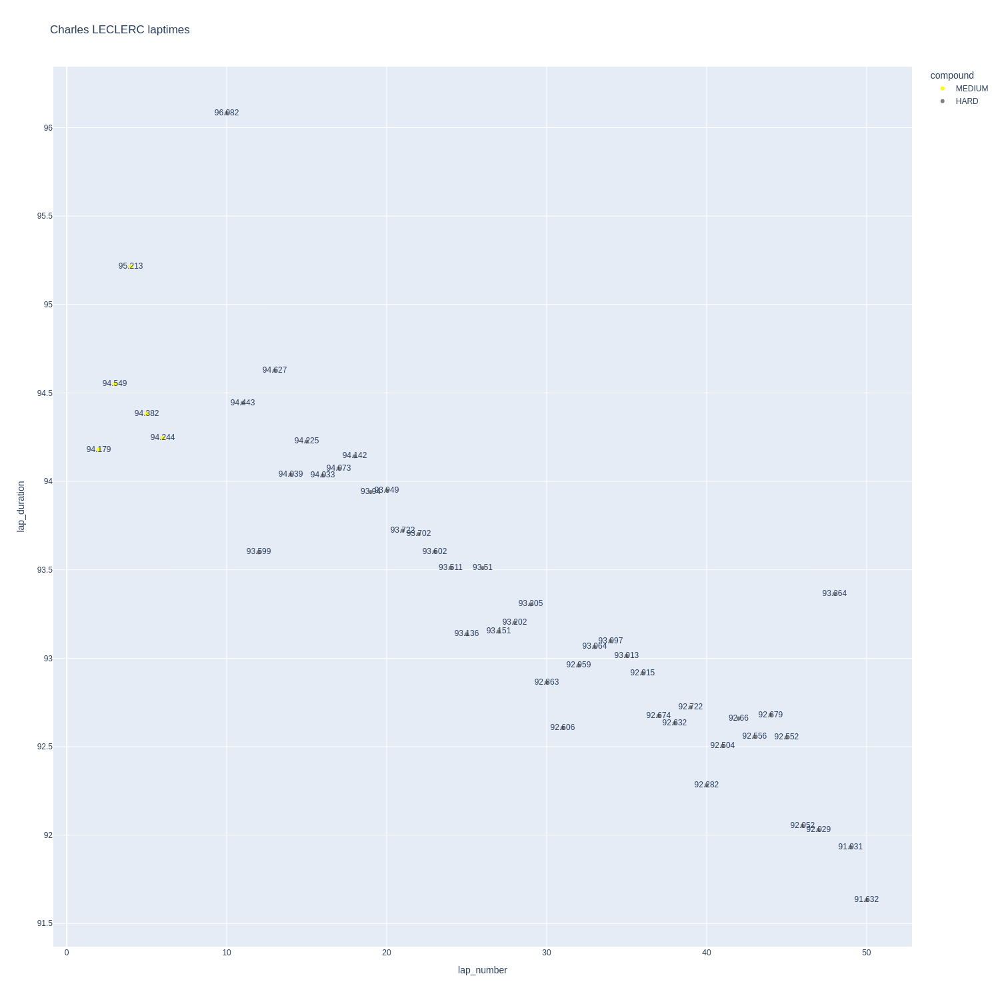

In [201]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

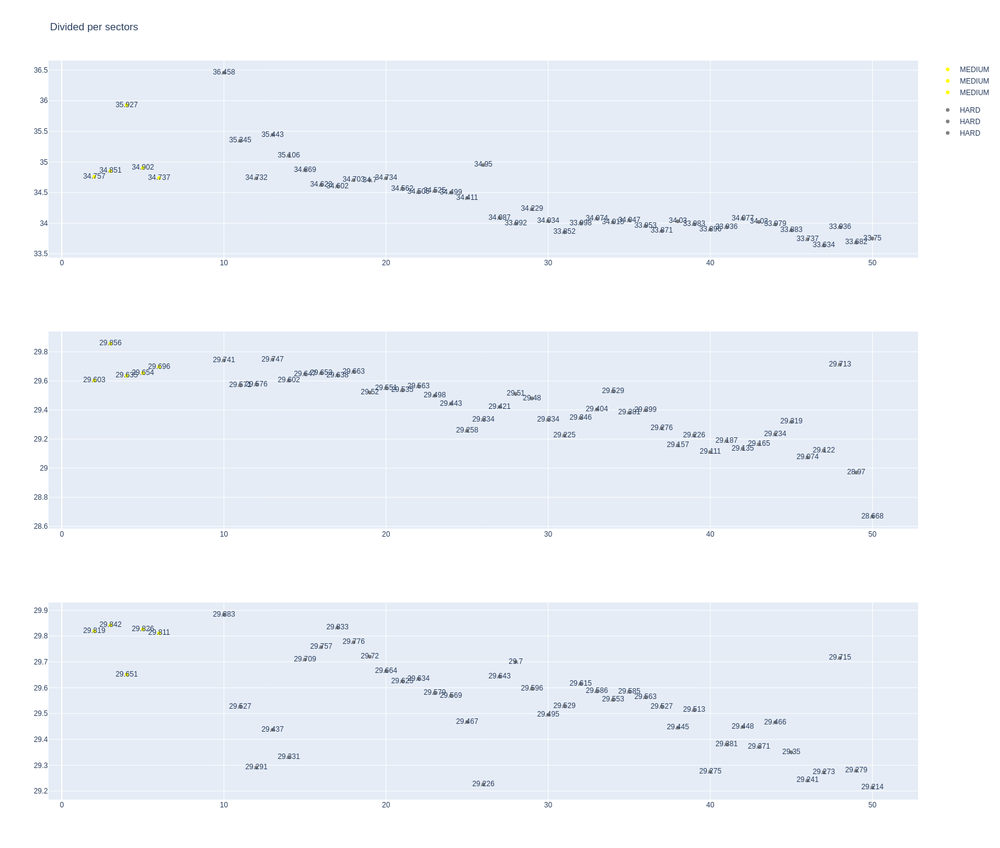

In [202]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

In [203]:
data = libraryDataF1.getinfolongruns(jointables,38,'Ferrari',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
34,Oliver BEARMAN,SOFT,2024-03-09T17:05:42.160000+00:00,2,37.634,29.937,29.844,97.415
53,Oliver BEARMAN,SOFT,2024-03-09T17:07:19.454000+00:00,3,35.728,30.062,29.725,95.515
72,Oliver BEARMAN,SOFT,2024-03-09T17:08:55.129000+00:00,4,35.862,30.067,29.716,95.645
91,Oliver BEARMAN,SOFT,2024-03-09T17:10:30.710000+00:00,5,35.766,30.040,29.787,95.593
110,Oliver BEARMAN,SOFT,2024-03-09T17:12:06.252000+00:00,6,35.873,30.007,30.242,96.122
168,Oliver BEARMAN,HARD,2024-03-09T17:21:20.350000+00:00,10,37.734,30.418,30.275,98.427
186,Oliver BEARMAN,HARD,2024-03-09T17:22:58.736000+00:00,11,35.816,30.052,29.777,95.645
204,Oliver BEARMAN,HARD,2024-03-09T17:24:34.306000+00:00,12,35.377,29.858,29.672,94.907
222,Oliver BEARMAN,HARD,2024-03-09T17:26:09.279000+00:00,13,35.641,29.885,29.627,95.153
240,Oliver BEARMAN,HARD,2024-03-09T17:27:44.425000+00:00,14,35.530,30.013,29.936,95.479


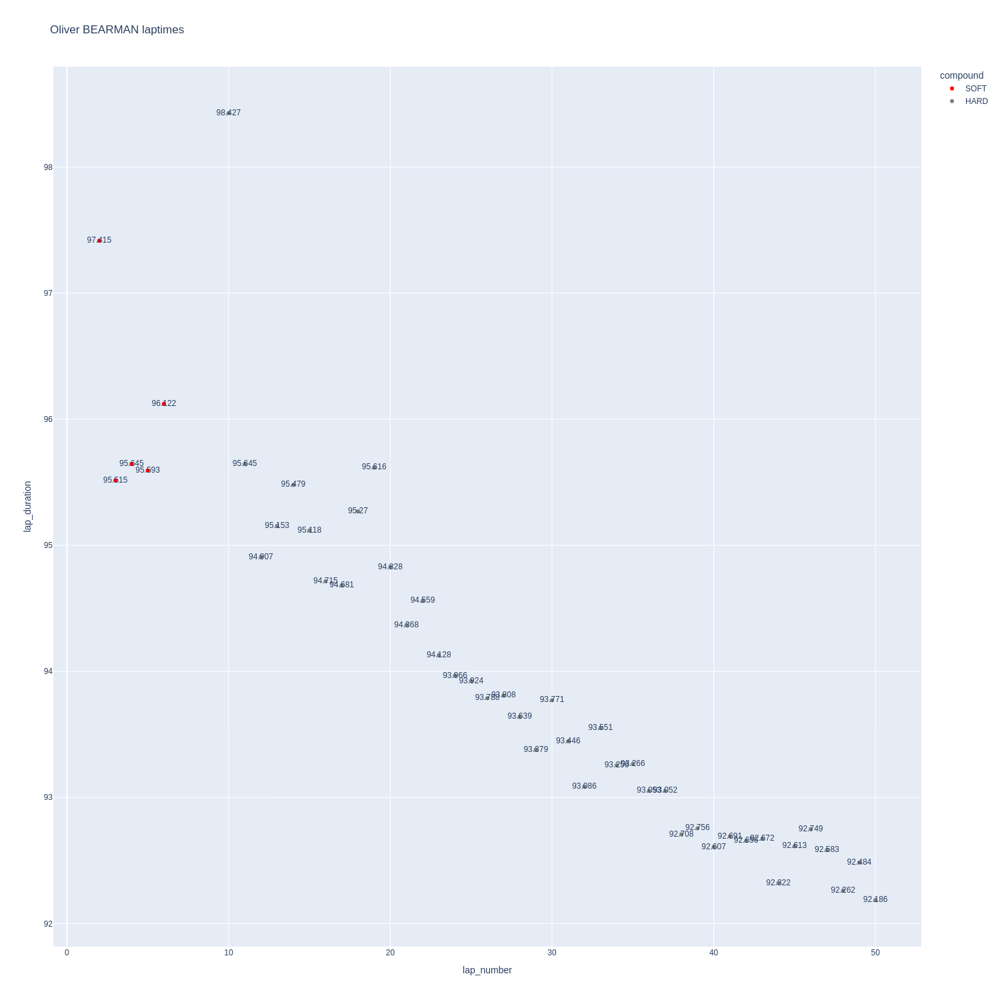

In [204]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

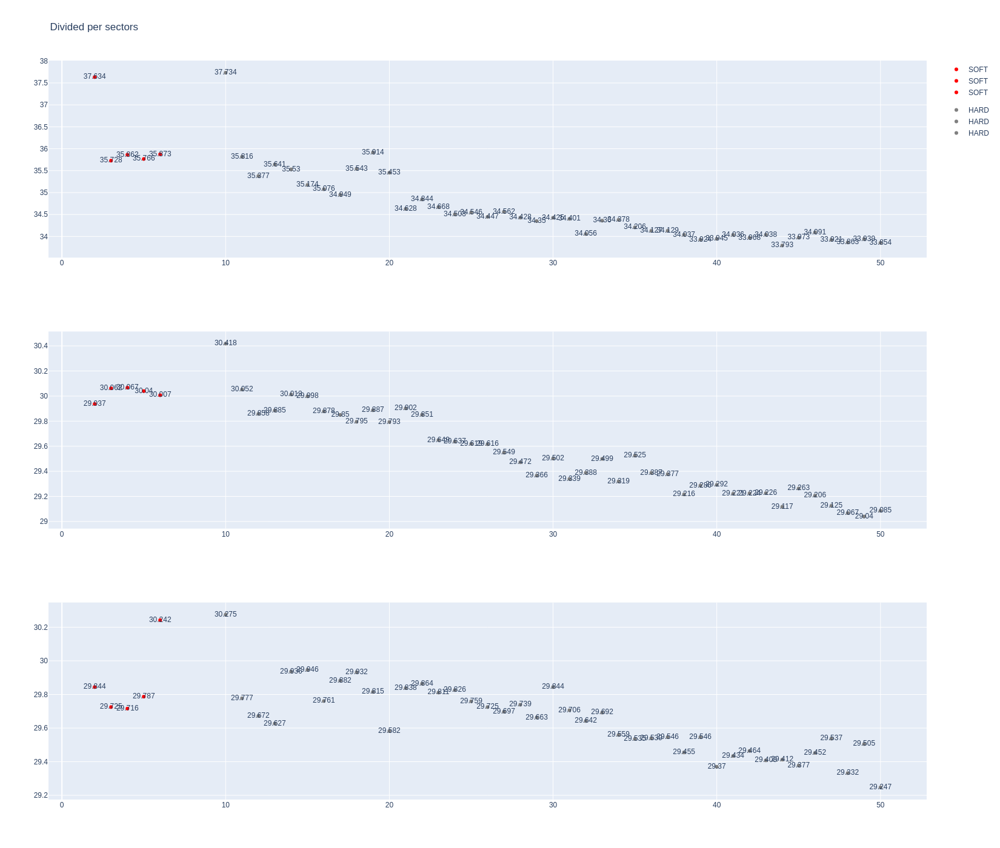

In [205]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

#### Mercedes

In [206]:
stintInformation.query('driver_number == 63 or driver_number == 44')

,meeting_key,session_key,stint_number,driver_number,lap_start,lap_end,compound,tyre_age_at_start
13,1230,9480,1,63,1,7,MEDIUM,0
17,1230,9480,1,44,1,36,MEDIUM,0
32,1230,9480,2,63,8,51,HARD,0
36,1230,9480,2,44,37,51,SOFT,3


In [207]:
data = libraryDataF1.getinfolongruns(jointables,44,'Mercedes',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
35,Lewis HAMILTON,MEDIUM,2024-03-09T17:05:40.365000+00:00,2,36.082,29.801,29.658,95.541
54,Lewis HAMILTON,MEDIUM,2024-03-09T17:07:15.871000+00:00,3,35.620,29.818,29.746,95.184
73,Lewis HAMILTON,MEDIUM,2024-03-09T17:08:51.131000+00:00,4,35.622,29.971,30.079,95.672
92,Lewis HAMILTON,MEDIUM,2024-03-09T17:10:26.789000+00:00,5,35.365,29.797,29.945,95.107
111,Lewis HAMILTON,MEDIUM,2024-03-09T17:12:01.878000+00:00,6,35.389,29.730,29.958,95.077
169,Lewis HAMILTON,MEDIUM,2024-03-09T17:21:17.869000+00:00,10,36.023,29.399,29.835,95.257
187,Lewis HAMILTON,MEDIUM,2024-03-09T17:22:53.208000+00:00,11,35.119,29.502,29.713,94.334
205,Lewis HAMILTON,MEDIUM,2024-03-09T17:24:27.573000+00:00,12,34.807,29.506,29.705,94.018
223,Lewis HAMILTON,MEDIUM,2024-03-09T17:26:01.536000+00:00,13,36.142,29.596,29.574,95.312
241,Lewis HAMILTON,MEDIUM,2024-03-09T17:27:36.795000+00:00,14,34.994,29.546,29.801,94.341


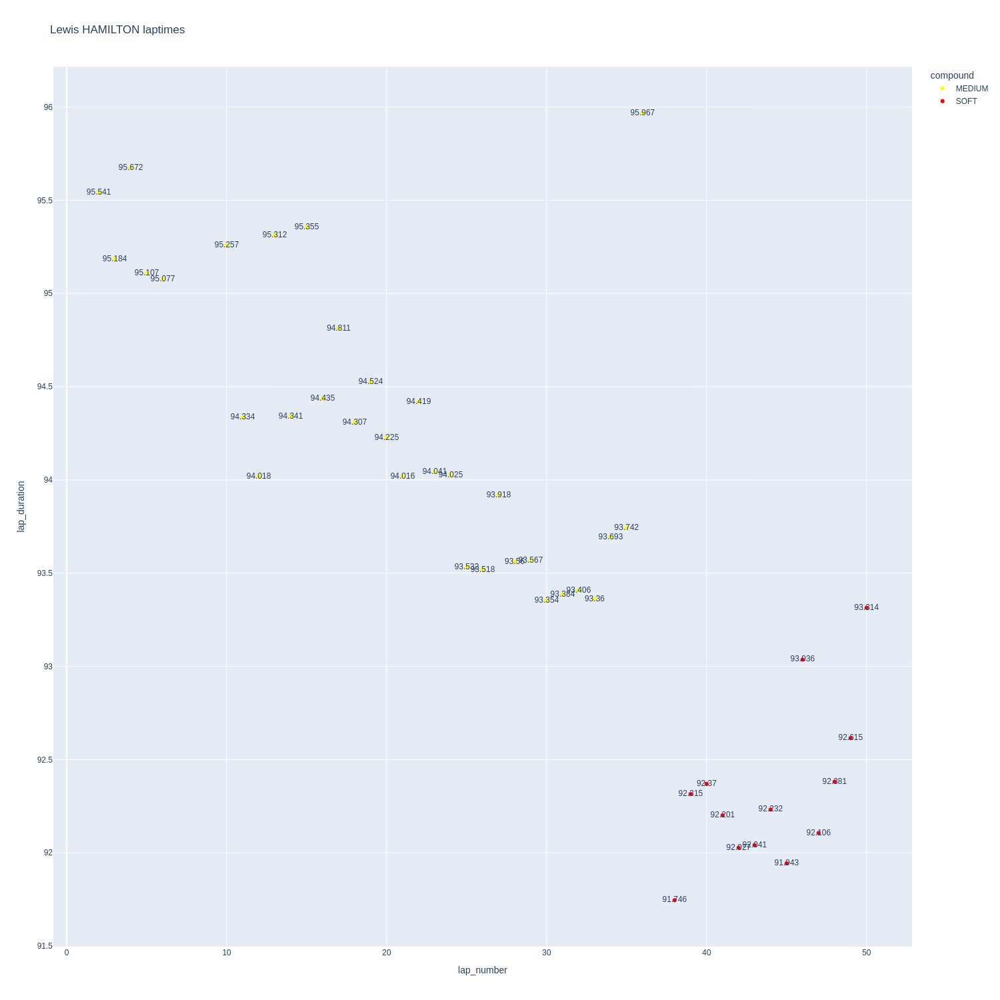

In [208]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

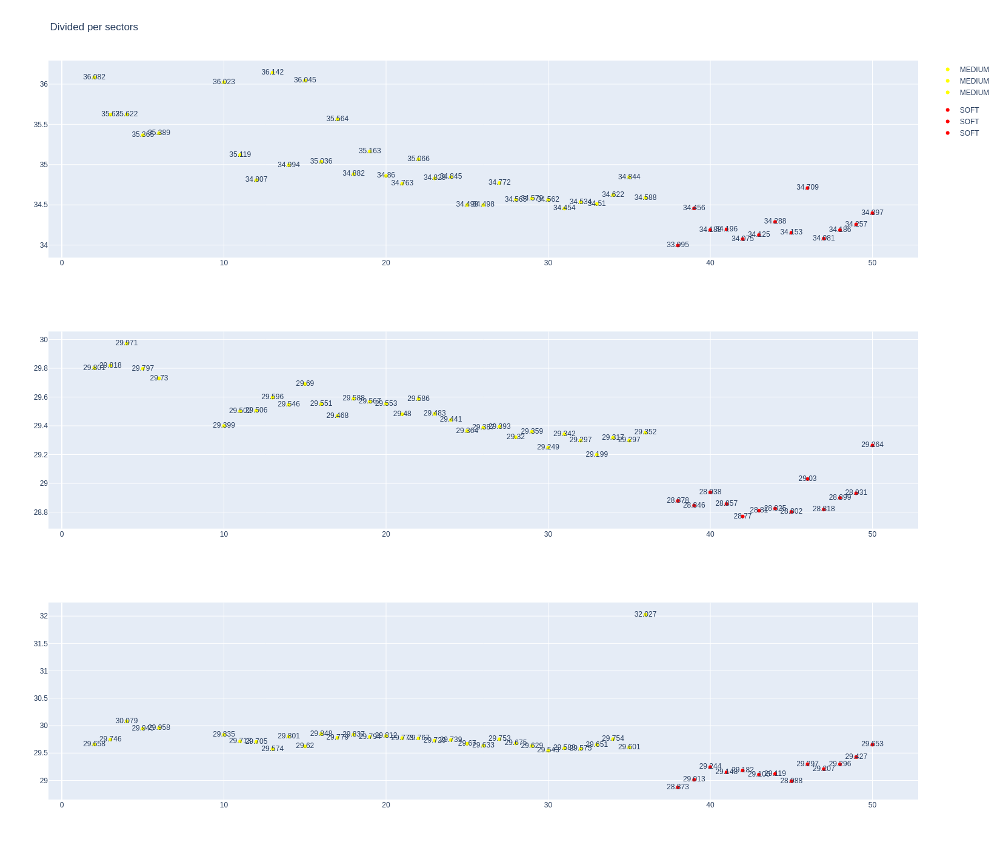

In [209]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

In [210]:
data = libraryDataF1.getinfolongruns(jointables,63,'Mercedes',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
36,George RUSSELL,MEDIUM,2024-03-09T17:05:39.868000+00:00,2,35.762,29.646,29.738,95.146
55,George RUSSELL,MEDIUM,2024-03-09T17:07:15.135000+00:00,3,35.737,29.727,29.755,95.219
74,George RUSSELL,MEDIUM,2024-03-09T17:08:50.307000+00:00,4,35.522,29.747,29.764,95.033
93,George RUSSELL,MEDIUM,2024-03-09T17:10:25.283000+00:00,5,35.467,29.730,29.953,95.150
112,George RUSSELL,MEDIUM,2024-03-09T17:12:00.536000+00:00,6,35.505,29.744,29.811,95.060
170,George RUSSELL,HARD,2024-03-09T17:21:19.460000+00:00,10,37.722,30.004,30.217,97.943
188,George RUSSELL,HARD,2024-03-09T17:22:57.445000+00:00,11,35.820,29.607,29.621,95.048
206,George RUSSELL,HARD,2024-03-09T17:24:32.404000+00:00,12,35.327,29.546,29.615,94.488
224,George RUSSELL,HARD,2024-03-09T17:26:06.980000+00:00,13,35.530,29.642,29.910,95.082
242,George RUSSELL,HARD,2024-03-09T17:27:42.080000+00:00,14,35.046,29.535,29.798,94.379


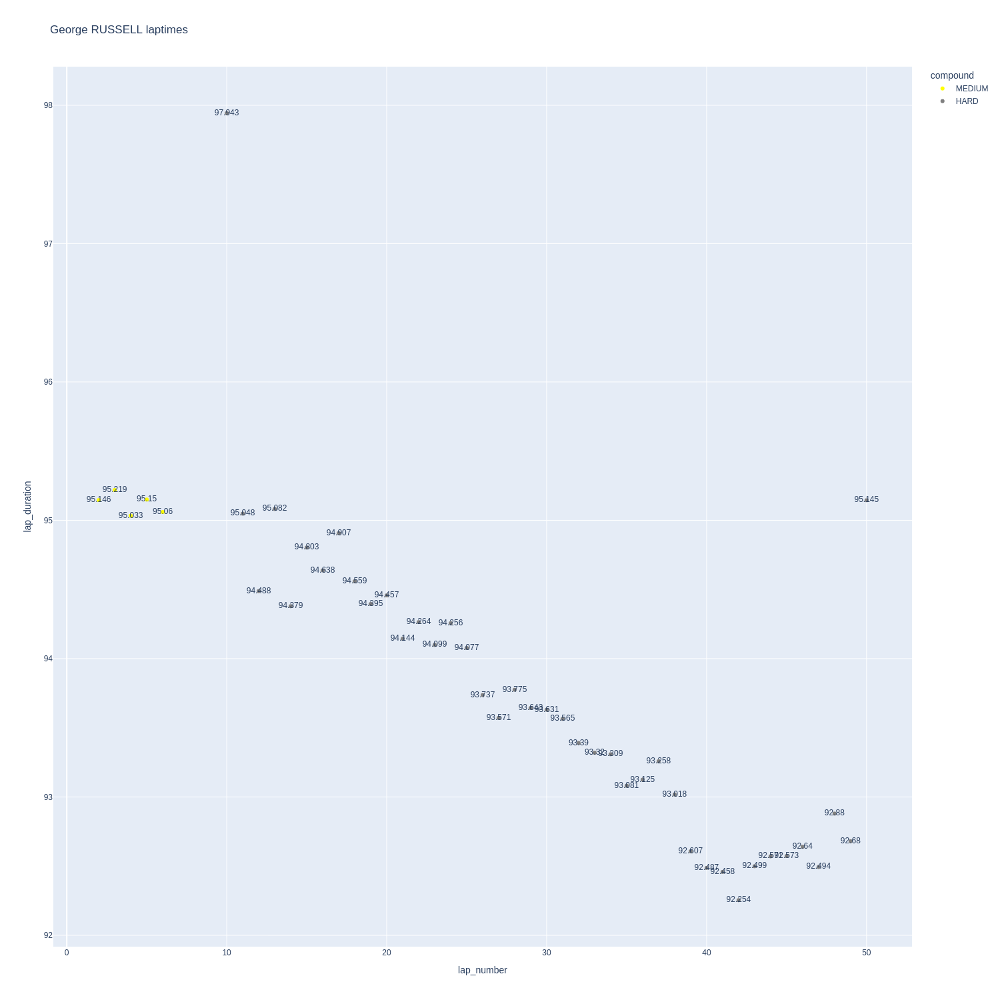

In [211]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

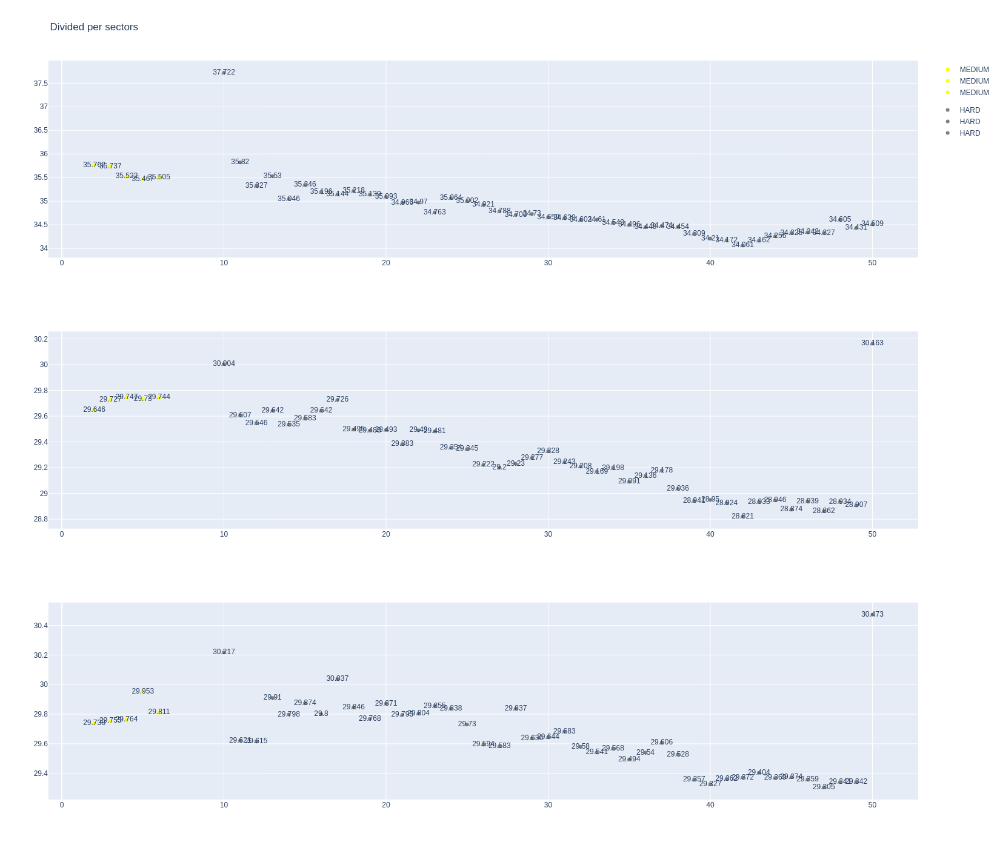

In [212]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

#### McLaren

In [213]:
stintInformation.query('driver_number == 81 or driver_number == 4')

,meeting_key,session_key,stint_number,driver_number,lap_start,lap_end,compound,tyre_age_at_start
15,1230,9480,1,81,1,7,MEDIUM,0
18,1230,9480,1,4,1,37,MEDIUM,0
33,1230,9480,2,81,8,51,HARD,1
37,1230,9480,2,4,38,51,SOFT,1


In [214]:
data = libraryDataF1.getinfolongruns(jointables,4,'McLaren',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
23,Lando NORRIS,MEDIUM,2024-03-09T17:05:39.455000+00:00,2,35.355,29.959,29.932,95.246
42,Lando NORRIS,MEDIUM,2024-03-09T17:07:14.651000+00:00,3,35.158,29.767,30.154,95.079
61,Lando NORRIS,MEDIUM,2024-03-09T17:08:49.750000+00:00,4,35.054,29.889,29.954,94.897
80,Lando NORRIS,MEDIUM,2024-03-09T17:10:24.642000+00:00,5,35.043,29.824,30.035,94.902
99,Lando NORRIS,MEDIUM,2024-03-09T17:11:59.573000+00:00,6,35.133,29.856,30.025,95.014
158,Lando NORRIS,MEDIUM,2024-03-09T17:21:17.536000+00:00,10,34.882,29.644,29.826,94.352
176,Lando NORRIS,MEDIUM,2024-03-09T17:22:51.733000+00:00,11,34.198,29.625,29.851,93.674
194,Lando NORRIS,MEDIUM,2024-03-09T17:24:25.525000+00:00,12,34.258,29.634,29.985,93.877
212,Lando NORRIS,MEDIUM,2024-03-09T17:25:59.337000+00:00,13,35.575,29.624,29.932,95.131
230,Lando NORRIS,MEDIUM,2024-03-09T17:27:34.446000+00:00,14,34.497,29.550,29.924,93.971


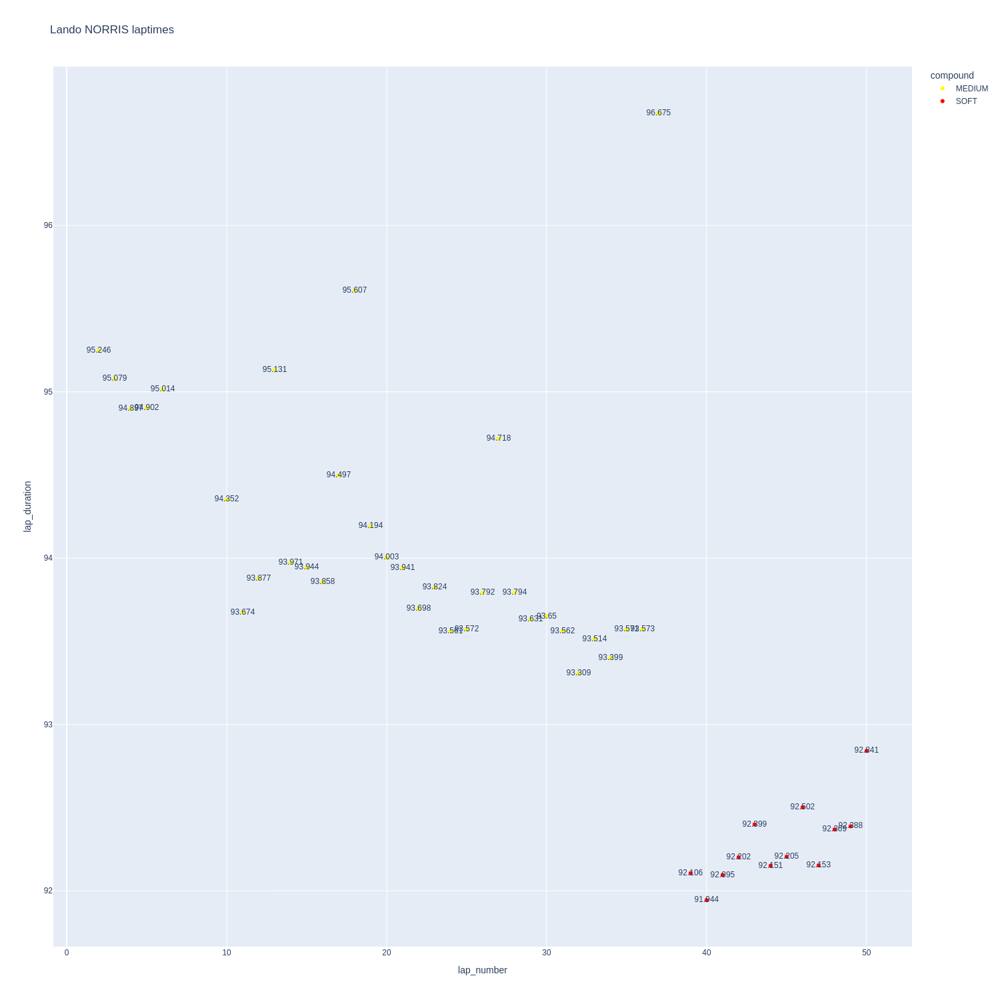

In [215]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

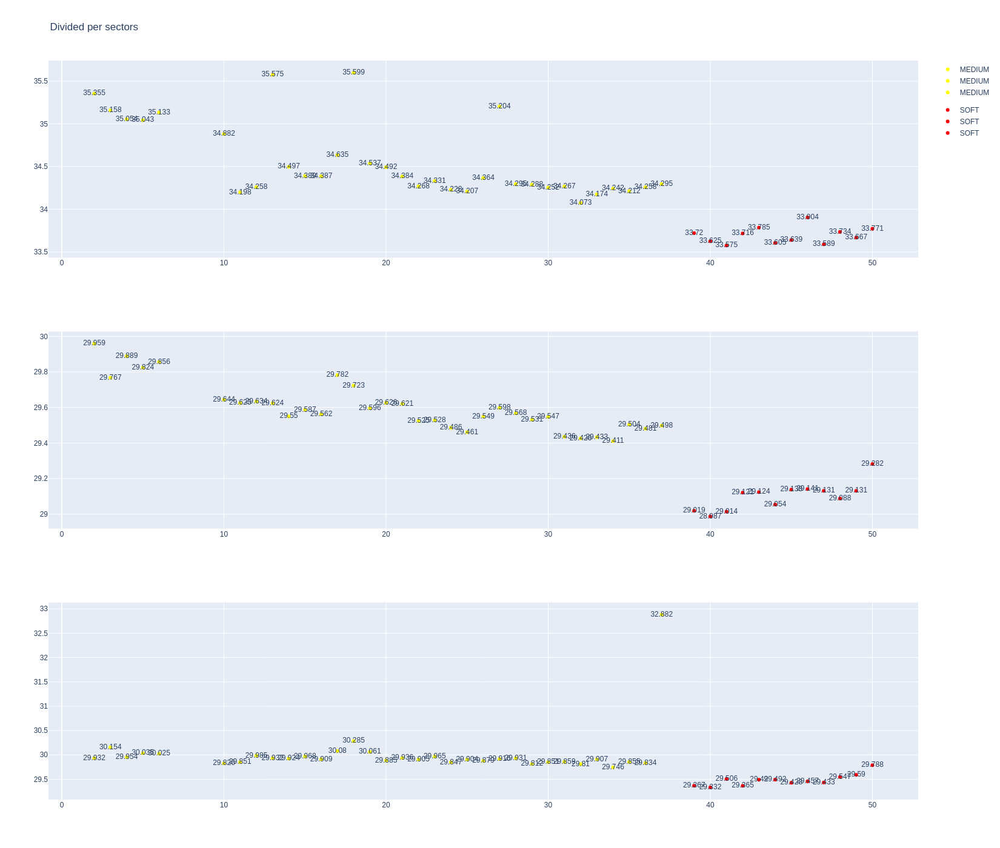

In [216]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

In [217]:
data = libraryDataF1.getinfolongruns(jointables,81,'McLaren',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
38,Oscar PIASTRI,MEDIUM,2024-03-09T17:05:38.133000+00:00,2,34.965,29.949,30.168,95.082
57,Oscar PIASTRI,MEDIUM,2024-03-09T17:07:13.200000+00:00,3,34.586,29.726,30.067,94.379
76,Oscar PIASTRI,MEDIUM,2024-03-09T17:08:47.691000+00:00,4,34.810,29.760,30.019,94.589
95,Oscar PIASTRI,MEDIUM,2024-03-09T17:10:22.205000+00:00,5,34.773,29.755,30.029,94.557
114,Oscar PIASTRI,MEDIUM,2024-03-09T17:11:56.771000+00:00,6,34.705,29.757,29.947,94.409
172,Oscar PIASTRI,HARD,2024-03-09T17:21:18.871000+00:00,10,36.736,29.821,30.211,96.768
190,Oscar PIASTRI,HARD,2024-03-09T17:22:55.487000+00:00,11,35.264,29.527,29.657,94.448
208,Oscar PIASTRI,HARD,2024-03-09T17:24:29.862000+00:00,12,34.817,29.496,29.633,93.946
226,Oscar PIASTRI,HARD,2024-03-09T17:26:03.859000+00:00,13,35.103,29.500,29.737,94.340
244,Oscar PIASTRI,HARD,2024-03-09T17:27:38.123000+00:00,14,34.969,29.601,29.861,94.431


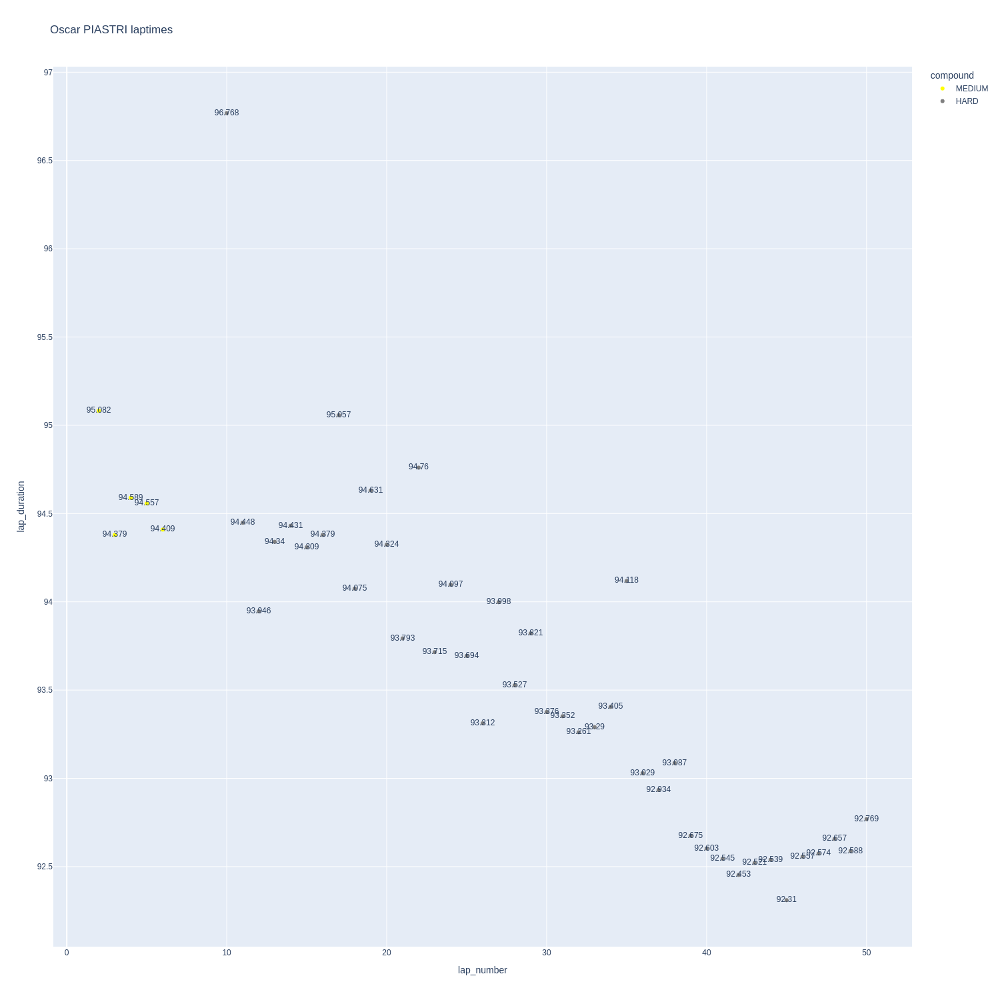

In [218]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

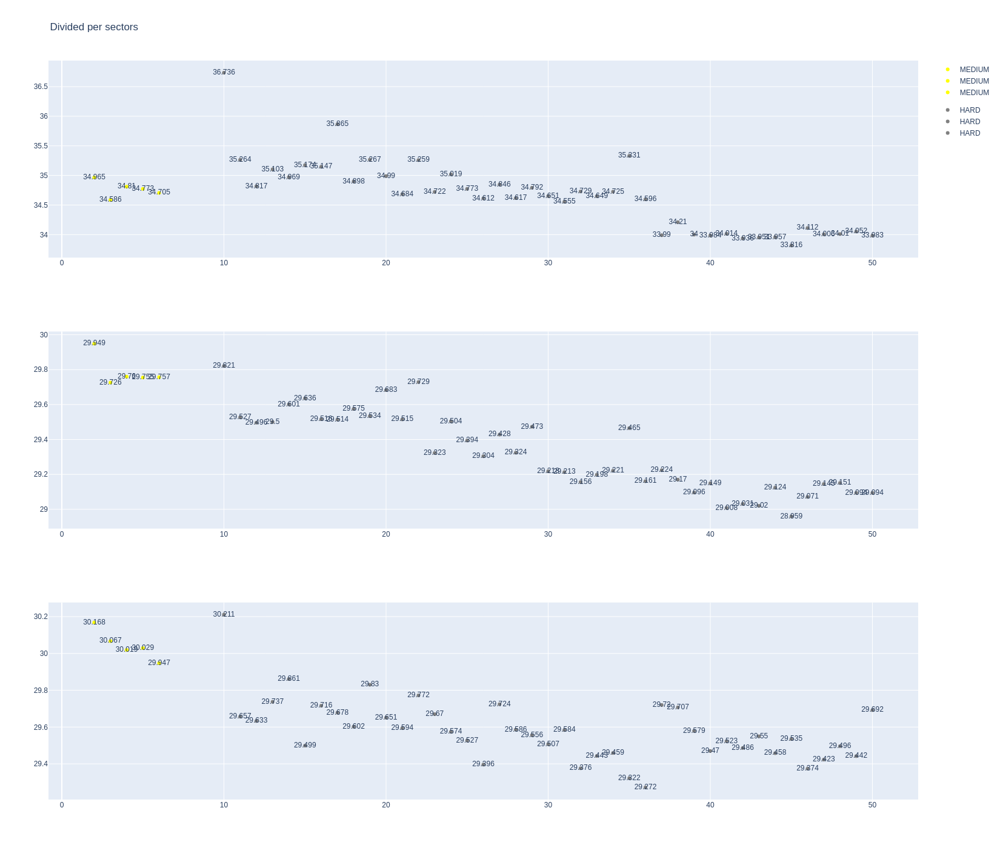

In [219]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

#### Aston Martin

In [220]:
stintInformation.query('driver_number == 18 or driver_number == 14')

,meeting_key,session_key,stint_number,driver_number,lap_start,lap_end,compound,tyre_age_at_start
1,1230,9480,1,18,1,6,MEDIUM,1
6,1230,9480,1,14,1,7,MEDIUM,1
27,1230,9480,2,14,8,51,HARD,1


In [221]:
data = libraryDataF1.getinfolongruns(jointables,14,'Aston Martin',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
25,Fernando ALONSO,MEDIUM,2024-03-09T17:05:37.943000+00:00,2,35.945,29.705,30.074,95.724
44,Fernando ALONSO,MEDIUM,2024-03-09T17:07:13.681000+00:00,3,35.214,29.443,29.782,94.439
63,Fernando ALONSO,MEDIUM,2024-03-09T17:08:48.153000+00:00,4,35.313,29.540,29.893,94.746
82,Fernando ALONSO,MEDIUM,2024-03-09T17:10:22.921000+00:00,5,35.061,29.628,29.823,94.512
101,Fernando ALONSO,MEDIUM,2024-03-09T17:11:57.457000+00:00,6,35.089,29.616,29.775,94.480
160,Fernando ALONSO,HARD,2024-03-09T17:21:19.140000+00:00,10,36.944,30.179,30.173,97.296
178,Fernando ALONSO,HARD,2024-03-09T17:22:56.331000+00:00,11,35.307,29.584,29.639,94.530
196,Fernando ALONSO,HARD,2024-03-09T17:24:30.963000+00:00,12,35.001,29.760,29.974,94.735
214,Fernando ALONSO,HARD,2024-03-09T17:26:05.556000+00:00,13,34.964,29.795,29.905,94.664
232,Fernando ALONSO,HARD,2024-03-09T17:27:40.303000+00:00,14,35.033,29.853,29.991,94.877


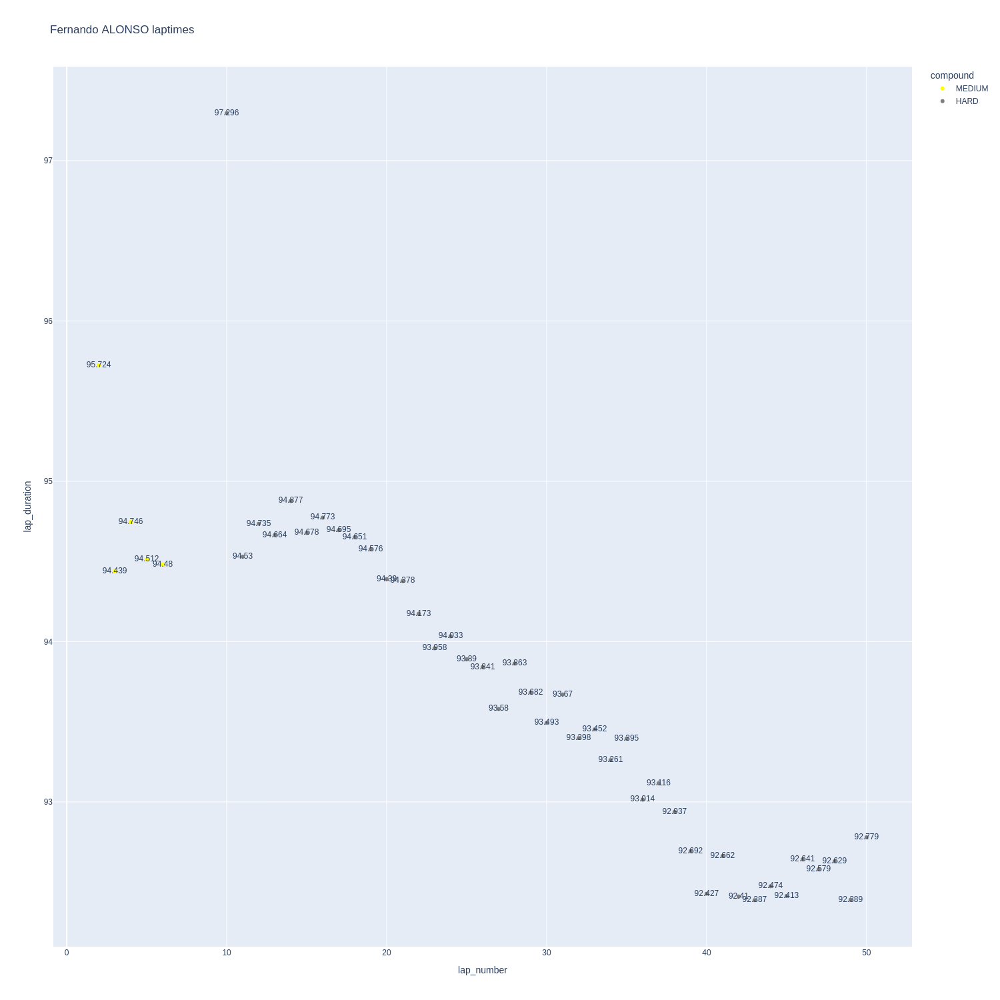

In [222]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

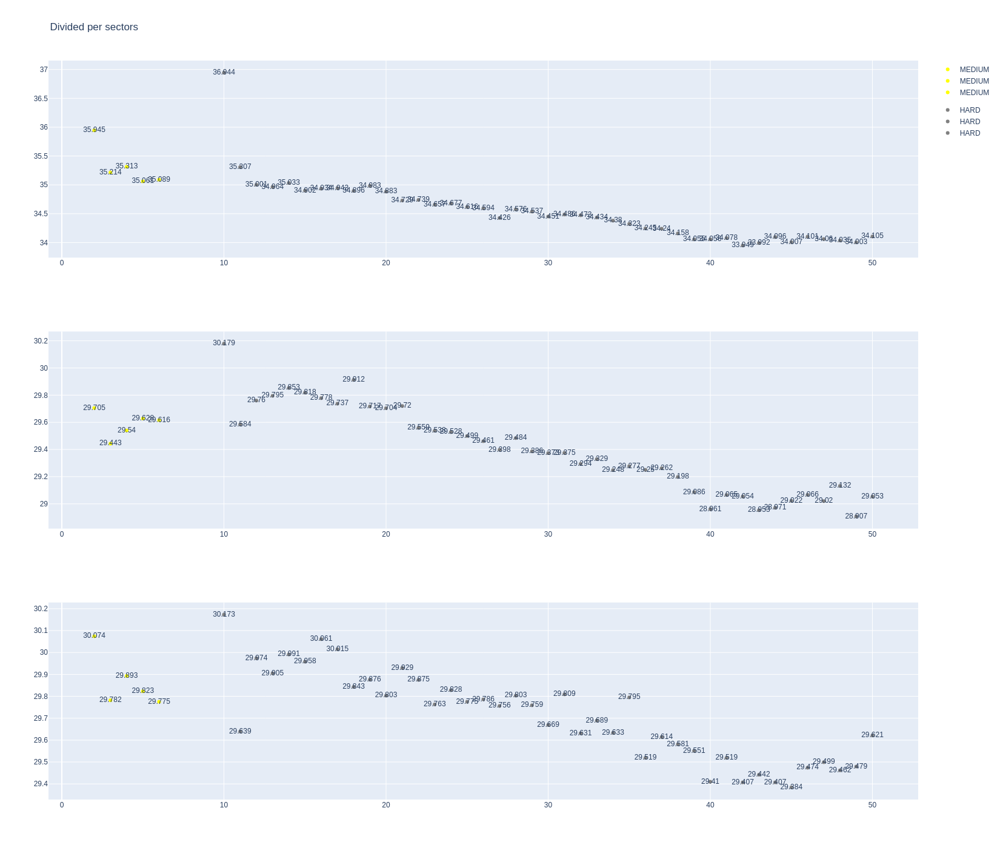

In [223]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

In [224]:
data = libraryDataF1.getinfolongruns(jointables,18,'Aston Martin',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
27,Lance STROLL,MEDIUM,2024-03-09T17:05:41.933000+00:00,2,35.771,30.160,30.163,96.094
46,Lance STROLL,MEDIUM,2024-03-09T17:07:18.074000+00:00,3,35.453,30.148,30.189,95.790
65,Lance STROLL,MEDIUM,2024-03-09T17:08:53.791000+00:00,4,35.301,30.247,30.187,95.735
84,Lance STROLL,MEDIUM,2024-03-09T17:10:29.589000+00:00,5,35.293,30.188,30.079,95.560


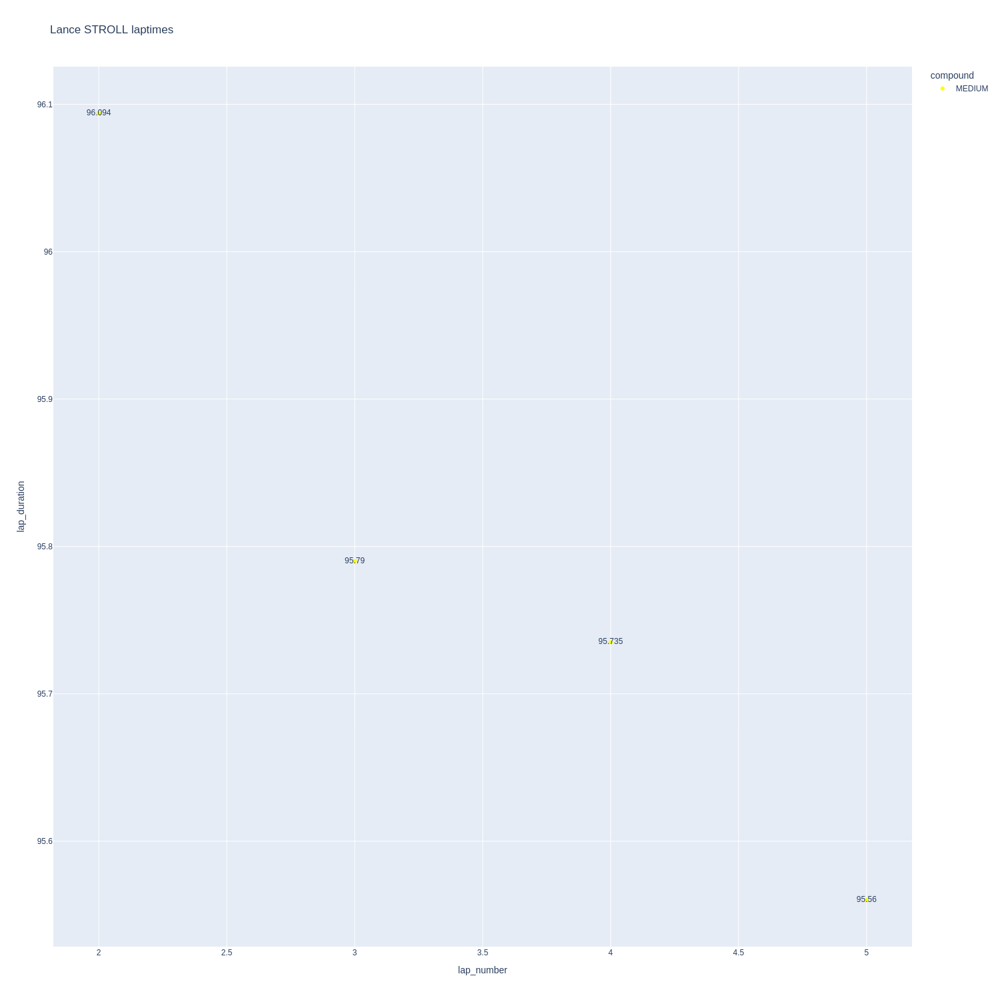

In [225]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

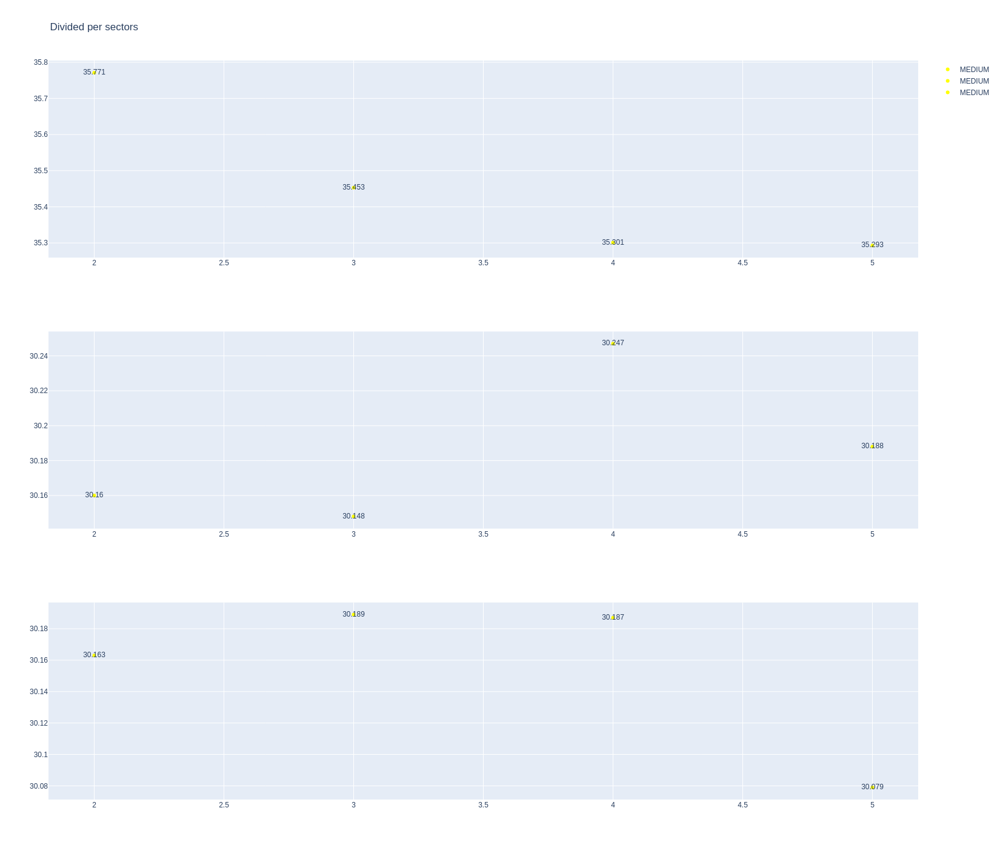

In [226]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

#### RB

In [227]:
stintInformation.query('driver_number == 3 or driver_number == 22')

,meeting_key,session_key,stint_number,driver_number,lap_start,lap_end,compound,tyre_age_at_start
4,1230,9480,1,3,1,7,MEDIUM,0
9,1230,9480,1,22,1,7,MEDIUM,0
22,1230,9480,2,3,8,50,HARD,0
23,1230,9480,2,22,8,50,HARD,0


In [228]:
data = libraryDataF1.getinfolongruns(jointables,3,'RB',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
22,Daniel RICCIARDO,MEDIUM,2024-03-09T17:05:43.944000+00:00,2,37.420,30.467,30.148,98.035
41,Daniel RICCIARDO,MEDIUM,2024-03-09T17:07:21.833000+00:00,3,36.440,30.303,30.023,96.766
60,Daniel RICCIARDO,MEDIUM,2024-03-09T17:08:58.600000+00:00,4,35.734,30.292,30.245,96.271
79,Daniel RICCIARDO,MEDIUM,2024-03-09T17:10:34.862000+00:00,5,35.461,30.256,29.982,95.699
98,Daniel RICCIARDO,MEDIUM,2024-03-09T17:12:10.560000+00:00,6,35.463,30.075,30.309,95.847
157,Daniel RICCIARDO,HARD,2024-03-09T17:21:22.640000+00:00,10,38.260,31.032,30.698,99.990
175,Daniel RICCIARDO,HARD,2024-03-09T17:23:02.549000+00:00,11,36.633,30.266,29.920,96.819
193,Daniel RICCIARDO,HARD,2024-03-09T17:24:39.330000+00:00,12,35.792,30.336,29.967,96.095
211,Daniel RICCIARDO,HARD,2024-03-09T17:26:15.528000+00:00,13,35.538,30.714,30.085,96.337
229,Daniel RICCIARDO,HARD,2024-03-09T17:27:51.811000+00:00,14,35.562,30.218,29.826,95.606


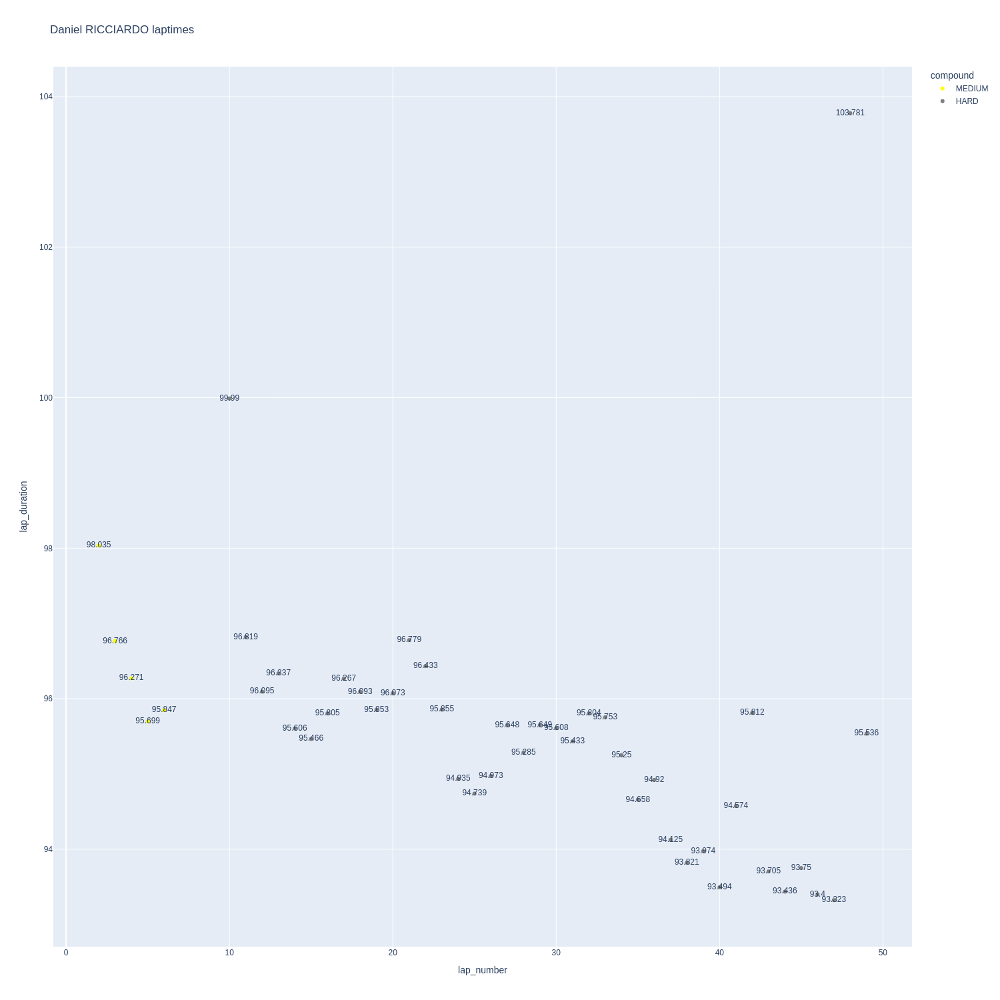

In [229]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

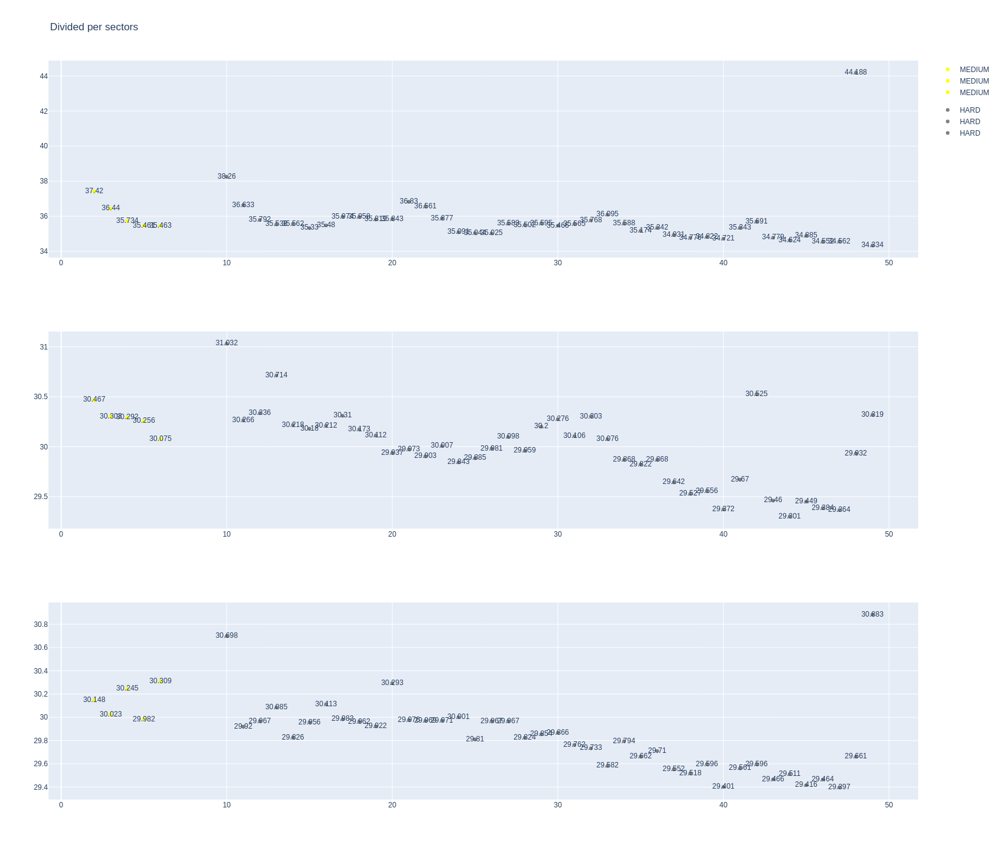

In [230]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

In [231]:
data = libraryDataF1.getinfolongruns(jointables,22,'RB',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
29,Yuki TSUNODA,MEDIUM,2024-03-09T17:05:42.090000+00:00,2,36.610,30.236,30.027,96.873
48,Yuki TSUNODA,MEDIUM,2024-03-09T17:07:18.870000+00:00,3,35.593,30.170,29.940,95.703
67,Yuki TSUNODA,MEDIUM,2024-03-09T17:08:54.576000+00:00,4,35.570,29.858,29.950,95.378
86,Yuki TSUNODA,MEDIUM,2024-03-09T17:10:29.998000+00:00,5,35.908,30.063,29.618,95.589
105,Yuki TSUNODA,MEDIUM,2024-03-09T17:12:05.581000+00:00,6,36.227,30.049,29.999,96.275
163,Yuki TSUNODA,HARD,2024-03-09T17:21:20.168000+00:00,10,38.387,30.481,30.354,99.222
181,Yuki TSUNODA,HARD,2024-03-09T17:22:59.494000+00:00,11,36.072,29.954,29.712,95.738
199,Yuki TSUNODA,HARD,2024-03-09T17:24:35.140000+00:00,12,35.637,29.947,29.679,95.263
217,Yuki TSUNODA,HARD,2024-03-09T17:26:10.351000+00:00,13,35.622,30.067,29.636,95.325
235,Yuki TSUNODA,HARD,2024-03-09T17:27:45.685000+00:00,14,35.709,30.068,29.798,95.575


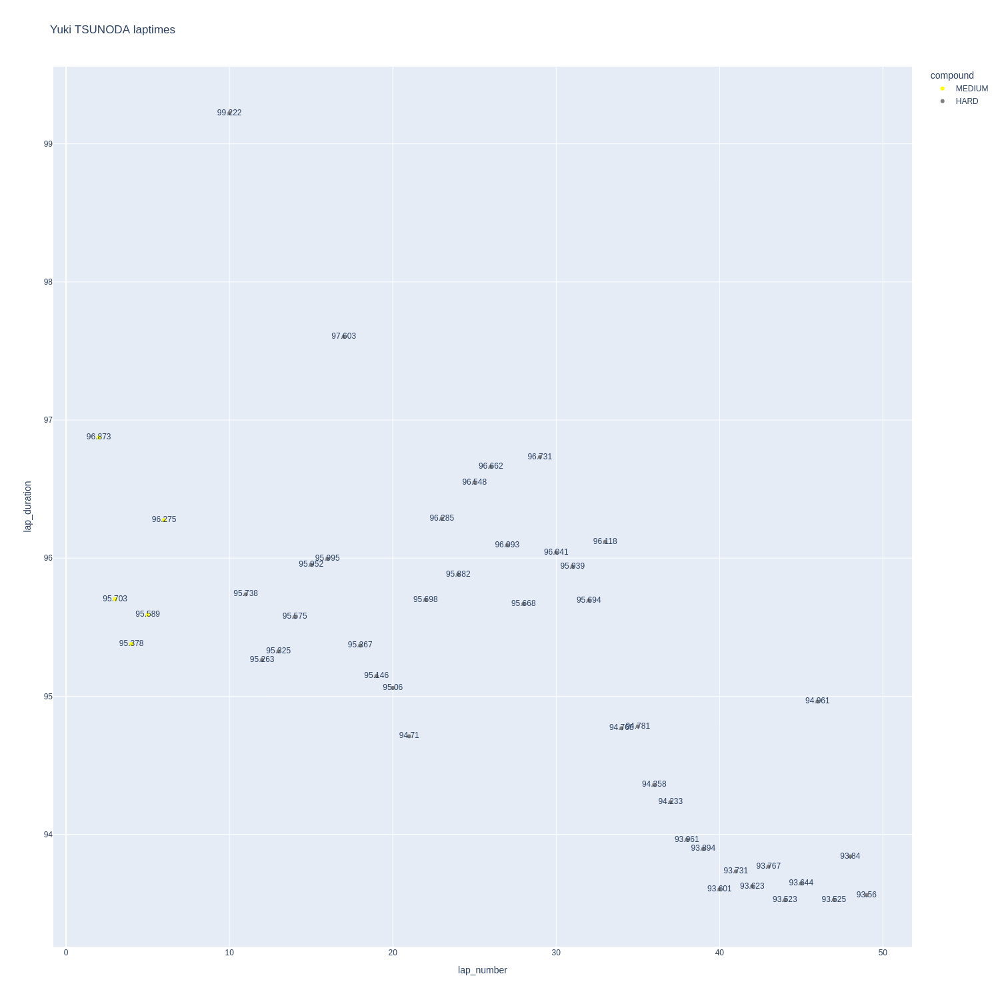

In [232]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

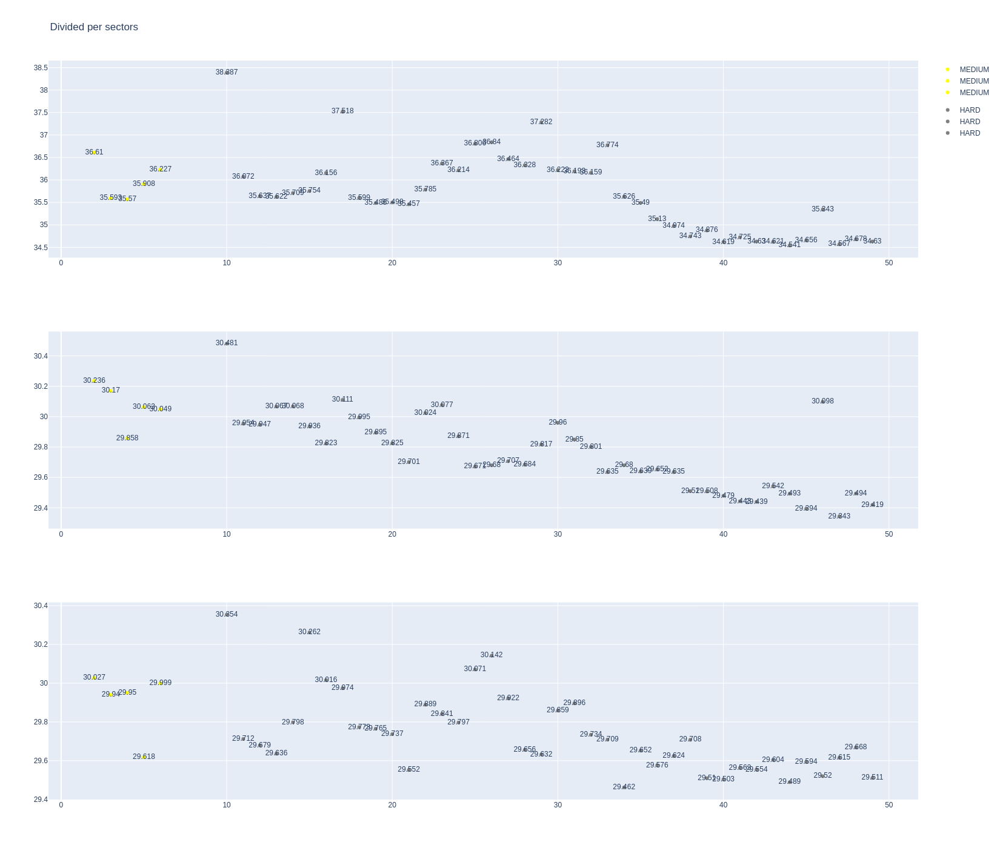

In [233]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

#### Haas

In [234]:
stintInformation.query('driver_number == 20 or driver_number == 27')

,meeting_key,session_key,stint_number,driver_number,lap_start,lap_end,compound,tyre_age_at_start
8,1230,9480,1,20,1,7,MEDIUM,0
16,1230,9480,1,27,1,34,MEDIUM,0
29,1230,9480,2,20,8,51,HARD,0
34,1230,9480,2,27,34,51,HARD,0


In [235]:
data = libraryDataF1.getinfolongruns(jointables,20,'Haas F1 Team',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
28,Kevin MAGNUSSEN,MEDIUM,2024-03-09T17:05:42.717000+00:00,2,37.419,30.138,29.965,97.522
47,Kevin MAGNUSSEN,MEDIUM,2024-03-09T17:07:20.224000+00:00,3,35.815,30.103,29.932,95.850
66,Kevin MAGNUSSEN,MEDIUM,2024-03-09T17:08:55.973000+00:00,4,35.537,29.956,29.874,95.367
85,Kevin MAGNUSSEN,MEDIUM,2024-03-09T17:10:31.345000+00:00,5,35.781,30.081,29.822,95.684
104,Kevin MAGNUSSEN,MEDIUM,2024-03-09T17:12:07.080000+00:00,6,35.769,30.206,30.052,96.027
162,Kevin MAGNUSSEN,HARD,2024-03-09T17:21:20.485000+00:00,10,38.527,30.559,30.377,99.463
180,Kevin MAGNUSSEN,HARD,2024-03-09T17:22:59.914000+00:00,11,36.096,30.152,29.788,96.036
198,Kevin MAGNUSSEN,HARD,2024-03-09T17:24:35.978000+00:00,12,35.570,29.944,29.715,95.229
216,Kevin MAGNUSSEN,HARD,2024-03-09T17:26:11.310000+00:00,13,35.513,29.888,29.661,95.062
234,Kevin MAGNUSSEN,HARD,2024-03-09T17:27:46.259000+00:00,14,35.596,30.154,29.803,95.553


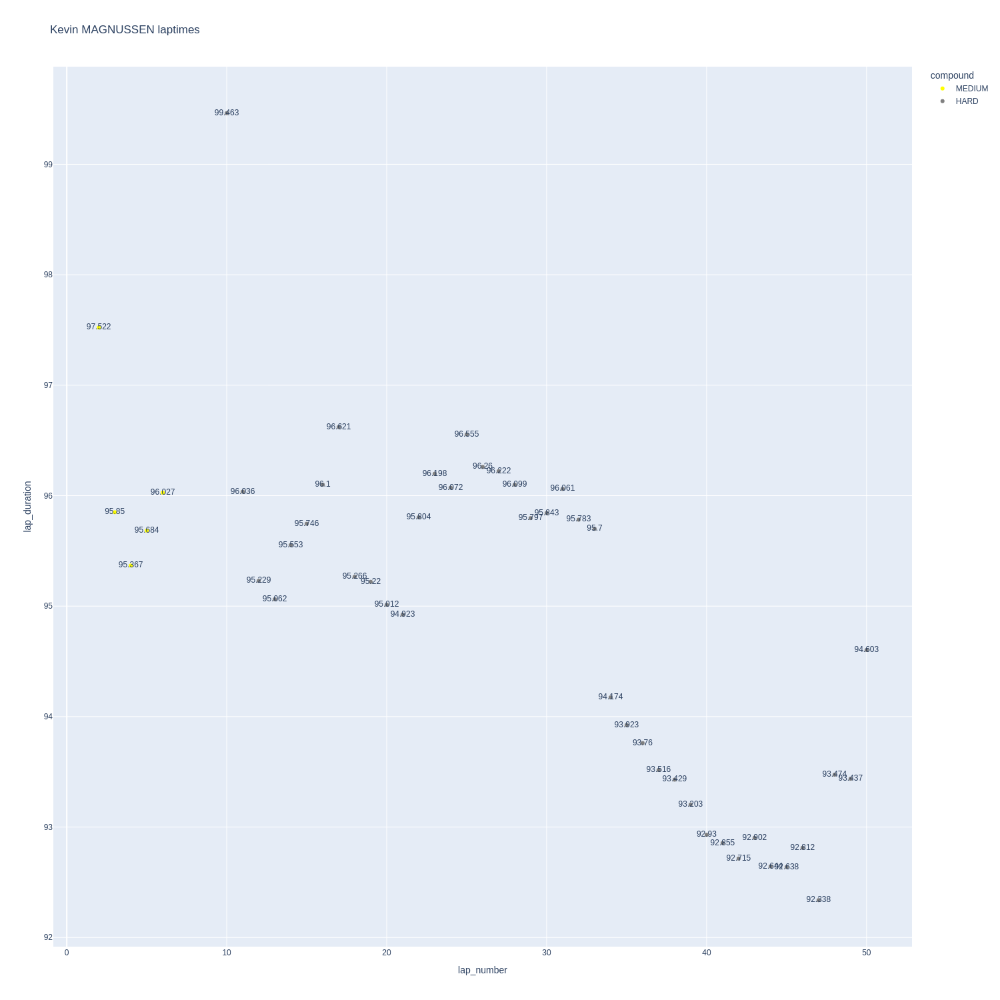

In [236]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

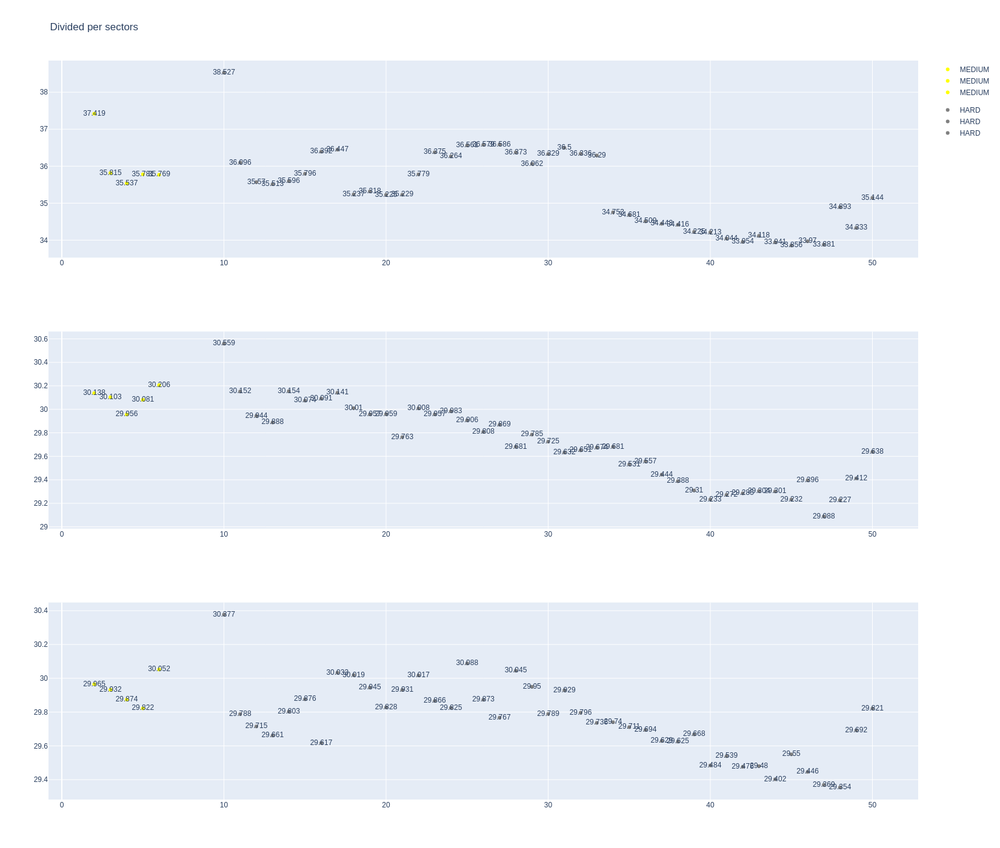

In [237]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

In [238]:
data = libraryDataF1.getinfolongruns(jointables,27,'Haas F1 Team',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data


,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
32,Nico HULKENBERG,MEDIUM,2024-03-09T17:05:43.291000+00:00,2,37.559,30.401,29.876,97.836
51,Nico HULKENBERG,MEDIUM,2024-03-09T17:07:20.999000+00:00,3,36.146,30.285,29.951,96.382
70,Nico HULKENBERG,MEDIUM,2024-03-09T17:08:57.498000+00:00,4,35.786,30.354,30.091,96.231
89,Nico HULKENBERG,MEDIUM,2024-03-09T17:10:33.704000+00:00,5,35.486,30.198,30.039,95.723
108,Nico HULKENBERG,MEDIUM,2024-03-09T17:12:09.516000+00:00,6,35.701,30.239,30.458,96.398
166,Nico HULKENBERG,MEDIUM,2024-03-09T17:21:19.204000+00:00,10,37.449,30.017,30.330,97.796
184,Nico HULKENBERG,MEDIUM,2024-03-09T17:22:56.856000+00:00,11,35.558,29.716,29.590,94.864
202,Nico HULKENBERG,MEDIUM,2024-03-09T17:24:31.696000+00:00,12,35.112,29.784,29.709,94.605
220,Nico HULKENBERG,MEDIUM,2024-03-09T17:26:06.339000+00:00,13,35.322,29.978,30.067,95.367
238,Nico HULKENBERG,MEDIUM,2024-03-09T17:27:41.780000+00:00,14,36.334,30.027,30.120,96.481


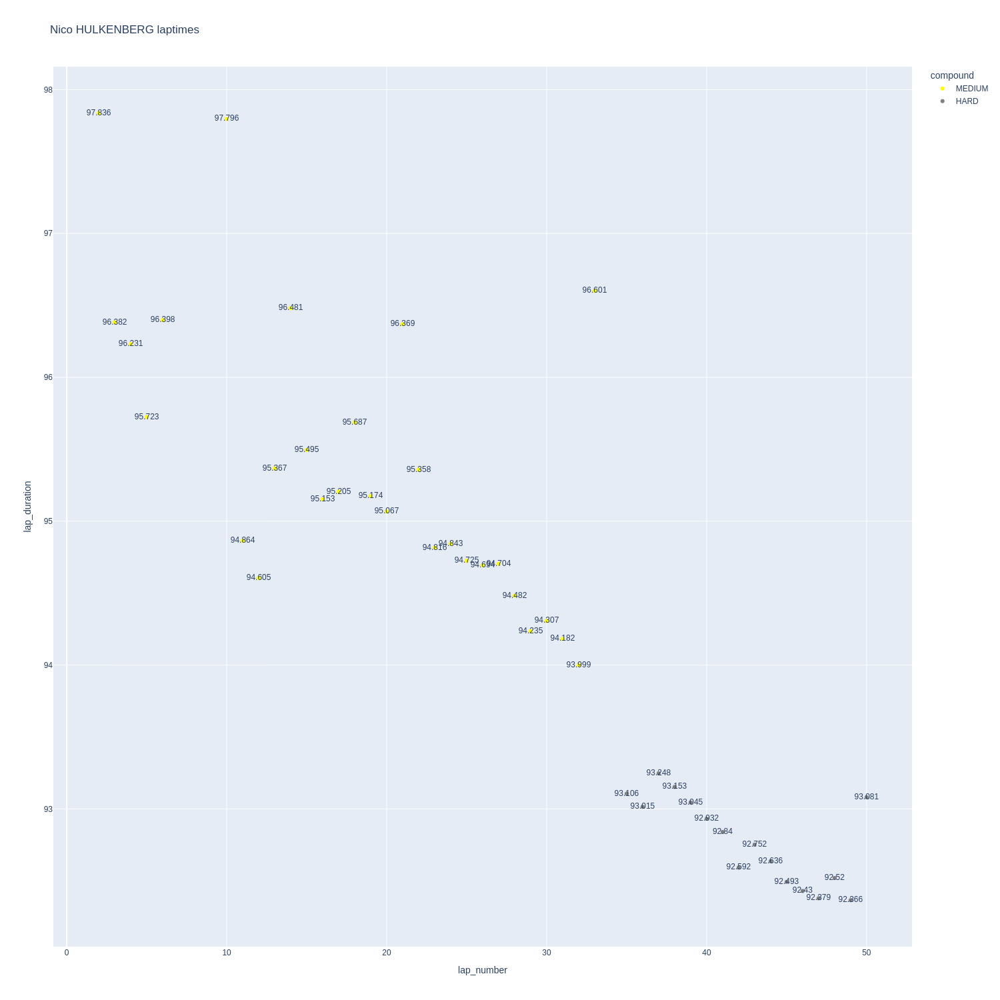

In [239]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

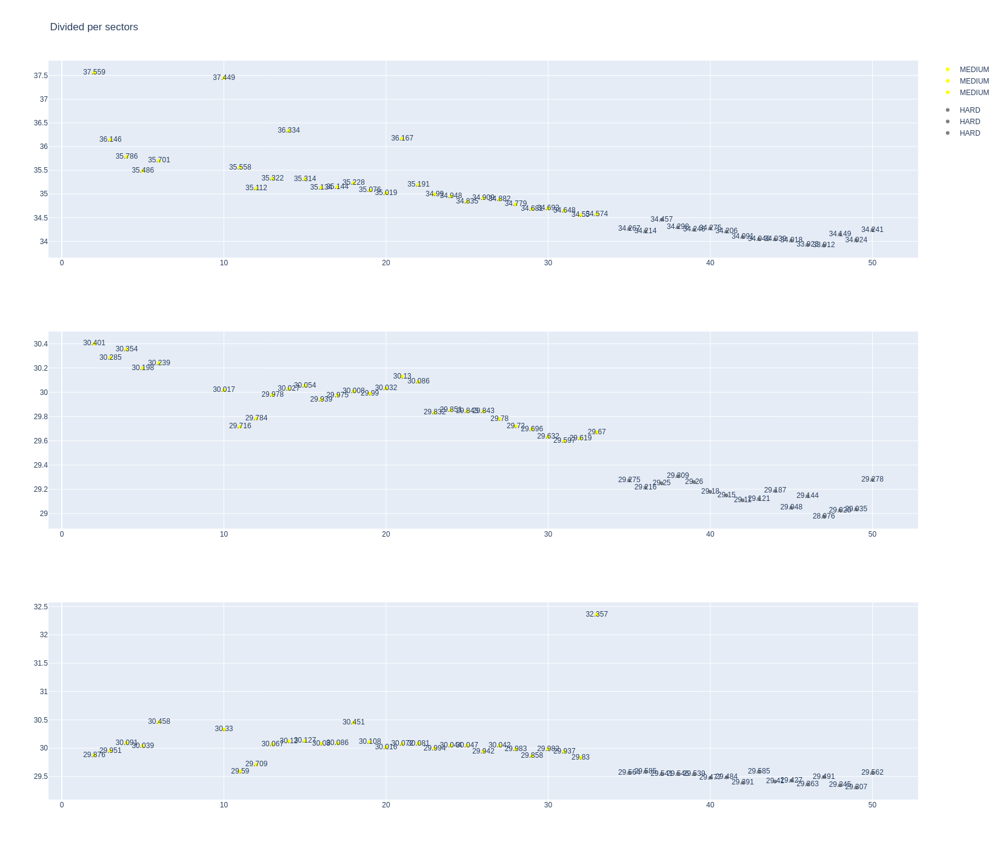

In [240]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

#### Alpine

In [241]:
stintInformation.query('driver_number == 10 or driver_number == 31')

,meeting_key,session_key,stint_number,driver_number,lap_start,lap_end,compound,tyre_age_at_start
0,1230,9480,1,10,1,2,MEDIUM,0
11,1230,9480,1,31,1,7,MEDIUM,0
24,1230,9480,2,31,8,50,HARD,0


In [242]:
data =libraryDataF1.getinfolongruns(jointables,31,'Alpine',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
33,Esteban OCON,MEDIUM,2024-03-09T17:05:43.944000+00:00,2,37.709,30.659,30.114,98.482
52,Esteban OCON,MEDIUM,2024-03-09T17:07:22.282000+00:00,3,36.320,30.427,30.173,96.920
71,Esteban OCON,MEDIUM,2024-03-09T17:08:59.213000+00:00,4,35.875,30.204,30.182,96.261
90,Esteban OCON,MEDIUM,2024-03-09T17:10:35.520000+00:00,5,35.727,30.153,30.123,96.003
109,Esteban OCON,MEDIUM,2024-03-09T17:12:11.492000+00:00,6,35.505,30.389,30.904,96.798
167,Esteban OCON,HARD,2024-03-09T17:21:21.140000+00:00,10,38.307,30.515,30.617,99.439
185,Esteban OCON,HARD,2024-03-09T17:23:00.461000+00:00,11,36.156,30.118,29.695,95.969
203,Esteban OCON,HARD,2024-03-09T17:24:36.474000+00:00,12,35.633,29.872,29.895,95.400
221,Esteban OCON,HARD,2024-03-09T17:26:11.991000+00:00,13,35.506,29.824,29.777,95.107
239,Esteban OCON,HARD,2024-03-09T17:27:47.127000+00:00,14,35.525,30.106,29.801,95.432


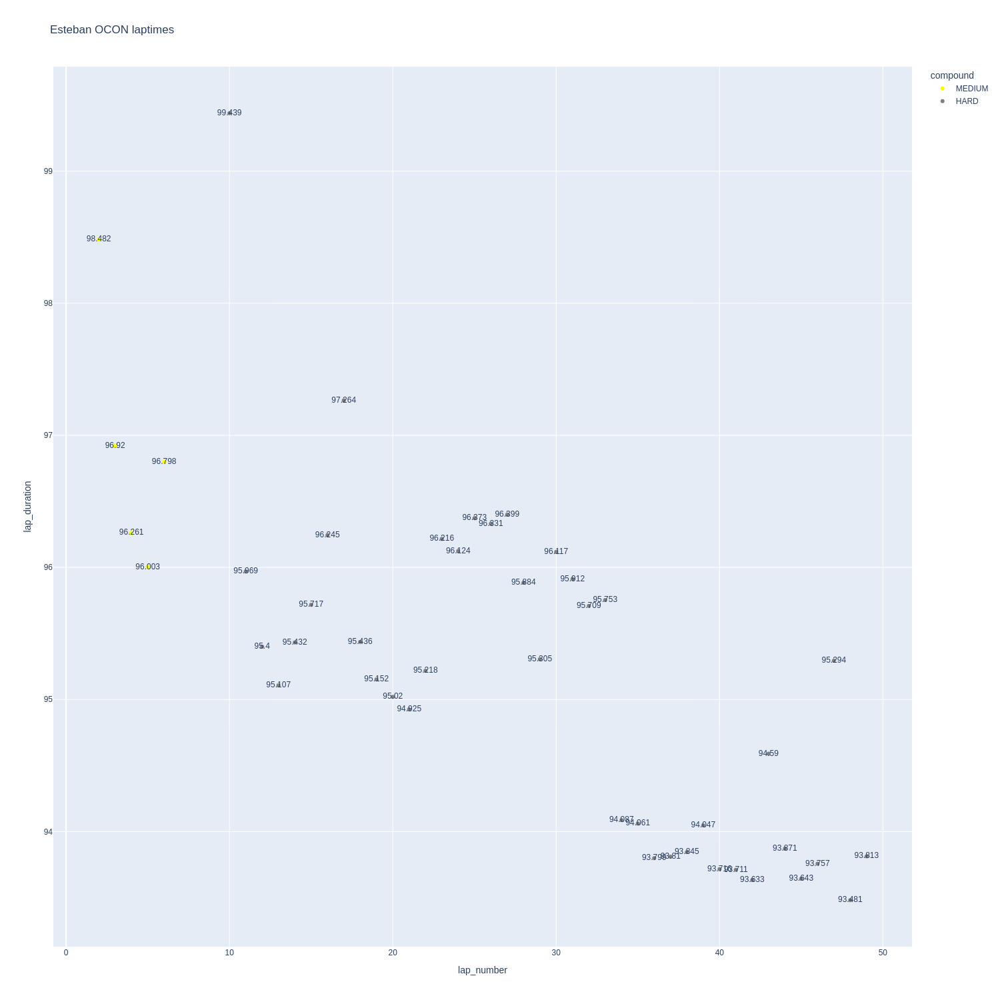

In [243]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

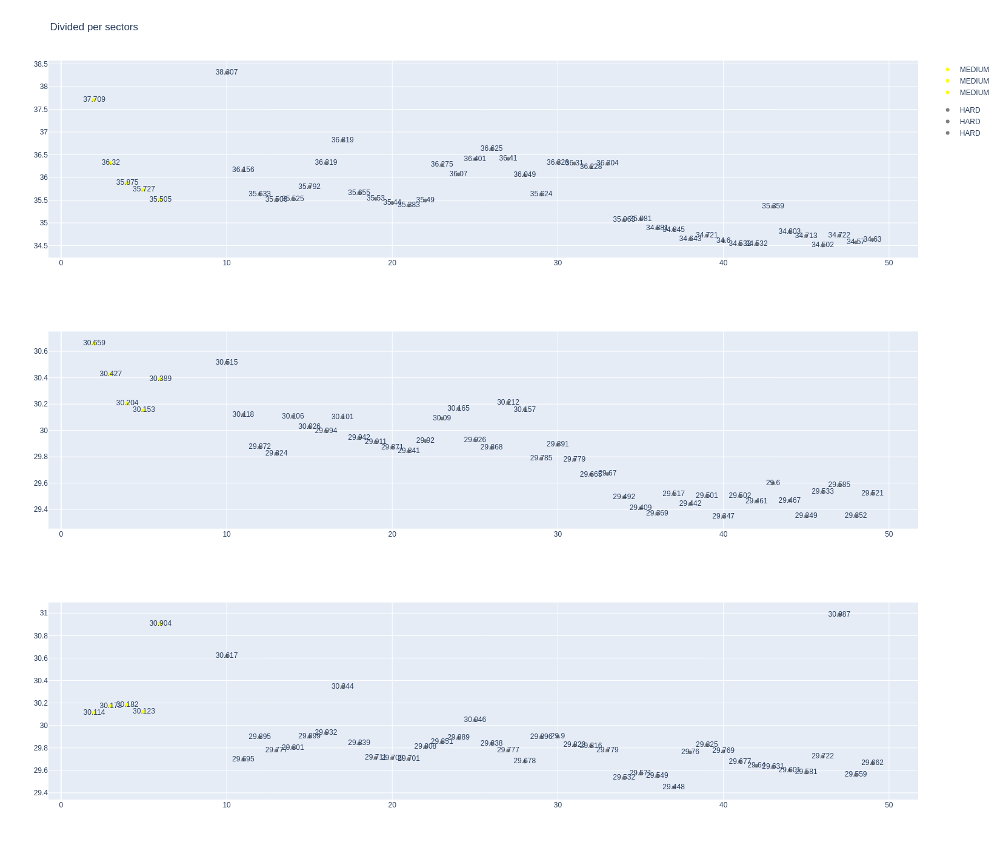

In [244]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

In [245]:
data = libraryDataF1.getinfolongruns(jointables,10,'Alpine',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration


In [246]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

In [247]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

#### Williams

In [248]:
stintInformation.query('driver_number == 2 or driver_number == 23')

,meeting_key,session_key,stint_number,driver_number,lap_start,lap_end,compound,tyre_age_at_start
3,1230,9480,1,2,1,7,MEDIUM,0
10,1230,9480,1,23,1,7,MEDIUM,0
21,1230,9480,2,2,8,50,HARD,0
30,1230,9480,2,23,8,51,HARD,0


In [249]:
data = libraryDataF1.getinfolongruns(jointables,23,'Williams',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
30,Alexander ALBON,MEDIUM,2024-03-09T17:05:43.110000+00:00,2,37.270,30.174,30.109,97.553
49,Alexander ALBON,MEDIUM,2024-03-09T17:07:20.685000+00:00,3,35.739,30.029,30.218,95.986
68,Alexander ALBON,MEDIUM,2024-03-09T17:08:56.605000+00:00,4,35.715,29.935,29.903,95.553
87,Alexander ALBON,MEDIUM,2024-03-09T17:10:32.229000+00:00,5,35.622,30.005,29.963,95.590
106,Alexander ALBON,MEDIUM,2024-03-09T17:12:07.859000+00:00,6,35.791,30.052,30.134,95.977
164,Alexander ALBON,HARD,2024-03-09T17:21:20.738000+00:00,10,39.036,30.557,30.725,100.318
182,Alexander ALBON,HARD,2024-03-09T17:23:01.096000+00:00,11,36.040,30.082,30.110,96.232
200,Alexander ALBON,HARD,2024-03-09T17:24:37.335000+00:00,12,35.514,29.964,29.963,95.441
218,Alexander ALBON,HARD,2024-03-09T17:26:12.809000+00:00,13,35.449,29.919,29.845,95.213
236,Alexander ALBON,HARD,2024-03-09T17:27:47.973000+00:00,14,35.471,29.892,29.818,95.181


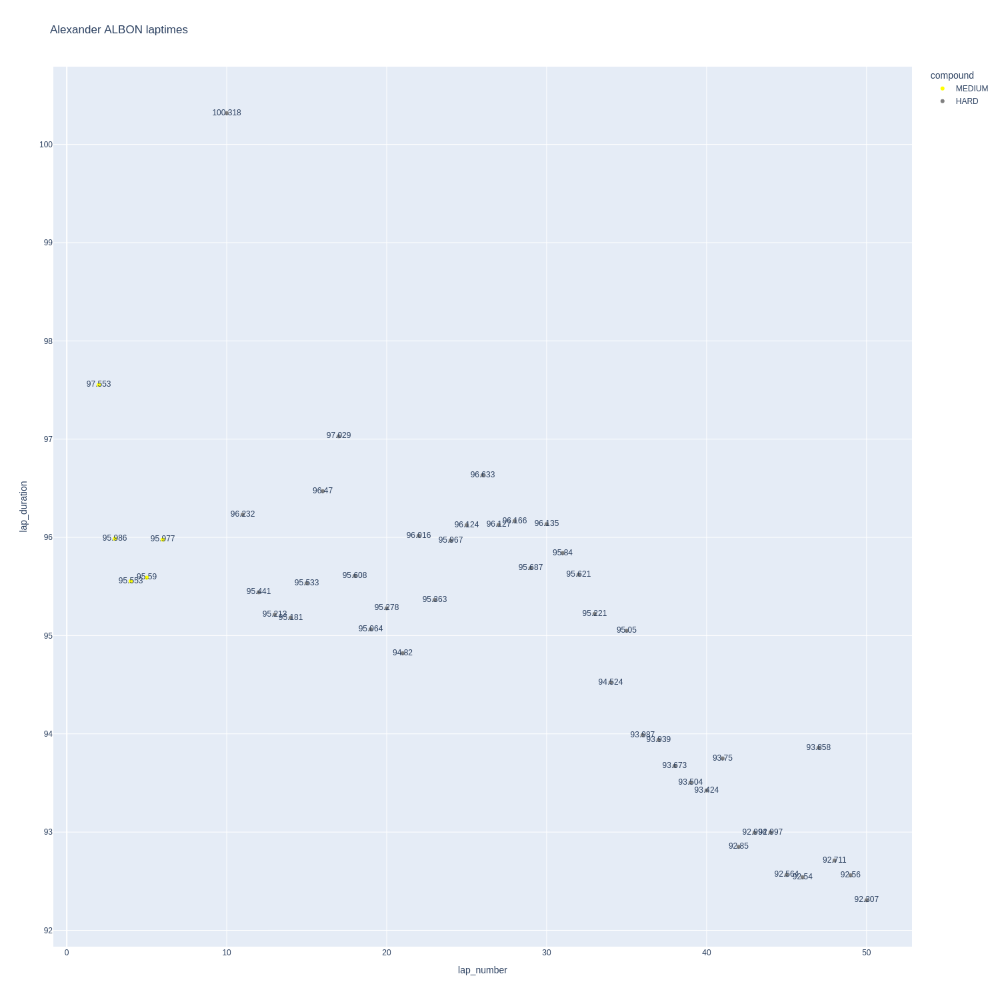

In [250]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

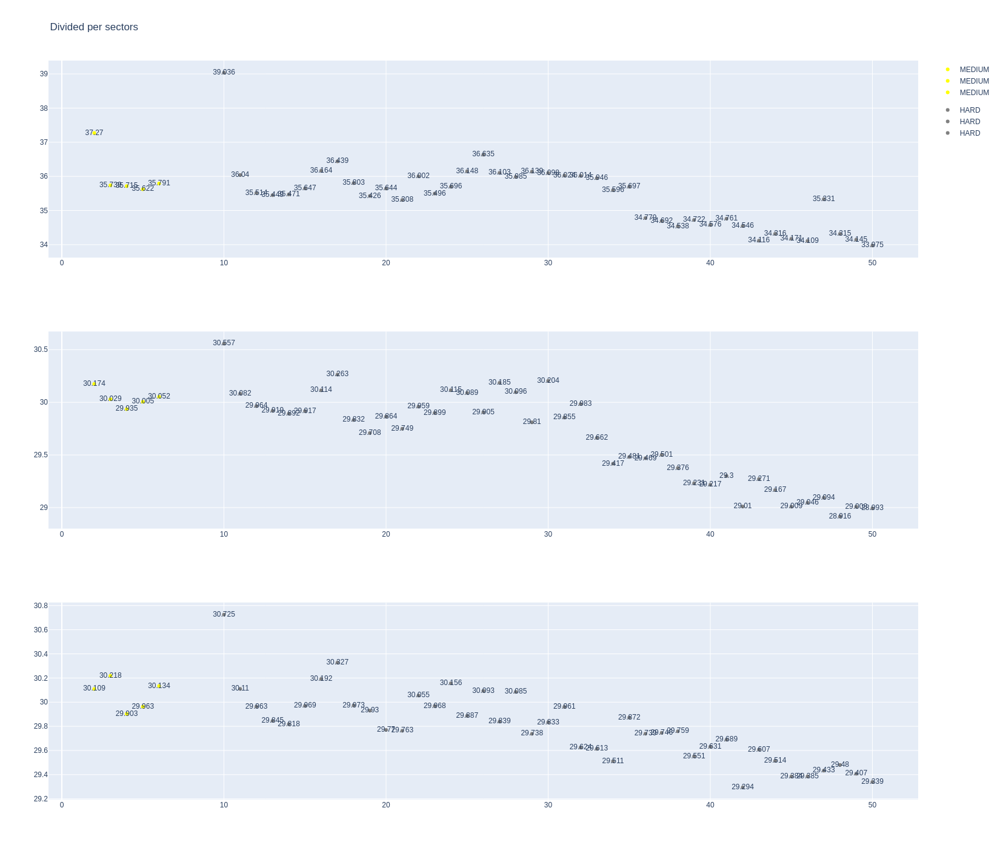

In [251]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

In [252]:
data= libraryDataF1.getinfolongruns(jointables,2,'Williams',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
21,Logan SARGEANT,MEDIUM,2024-03-09T17:05:44.873000+00:00,2,37.303,30.722,30.393,98.418
40,Logan SARGEANT,MEDIUM,2024-03-09T17:07:23.293000+00:00,3,36.326,30.341,30.204,96.871
59,Logan SARGEANT,MEDIUM,2024-03-09T17:09:00.292000+00:00,4,36.153,30.291,30.100,96.544
78,Logan SARGEANT,MEDIUM,2024-03-09T17:10:36.739000+00:00,5,35.938,30.121,30.145,96.204
97,Logan SARGEANT,MEDIUM,2024-03-09T17:12:13.089000+00:00,6,35.749,30.086,30.368,96.203
156,Logan SARGEANT,HARD,2024-03-09T17:21:22.105000+00:00,10,38.458,30.866,30.817,100.141
174,Logan SARGEANT,HARD,2024-03-09T17:23:02.142000+00:00,11,36.344,30.175,29.949,96.468
192,Logan SARGEANT,HARD,2024-03-09T17:24:38.540000+00:00,12,35.639,30.071,29.932,95.642
210,Logan SARGEANT,HARD,2024-03-09T17:26:14.291000+00:00,13,35.743,30.108,29.900,95.751
228,Logan SARGEANT,HARD,2024-03-09T17:27:50.131000+00:00,14,35.526,29.922,29.759,95.207


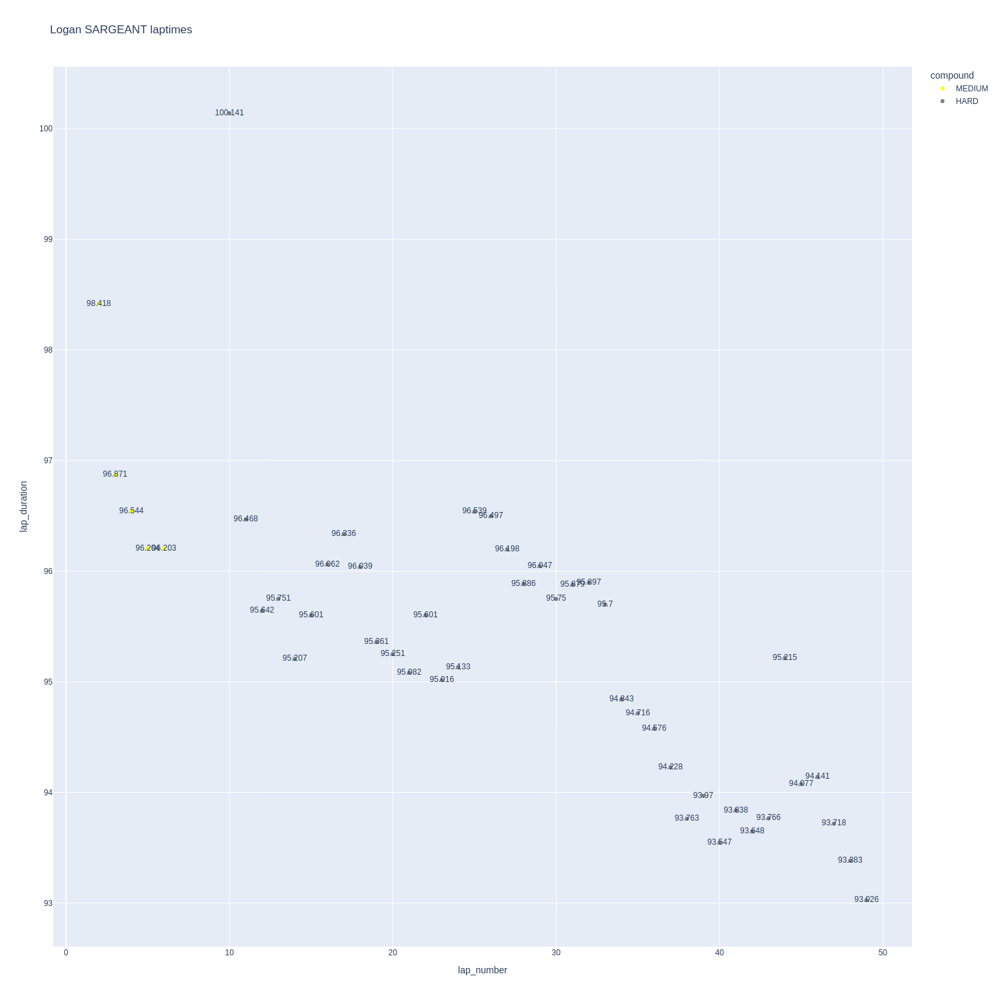

In [253]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

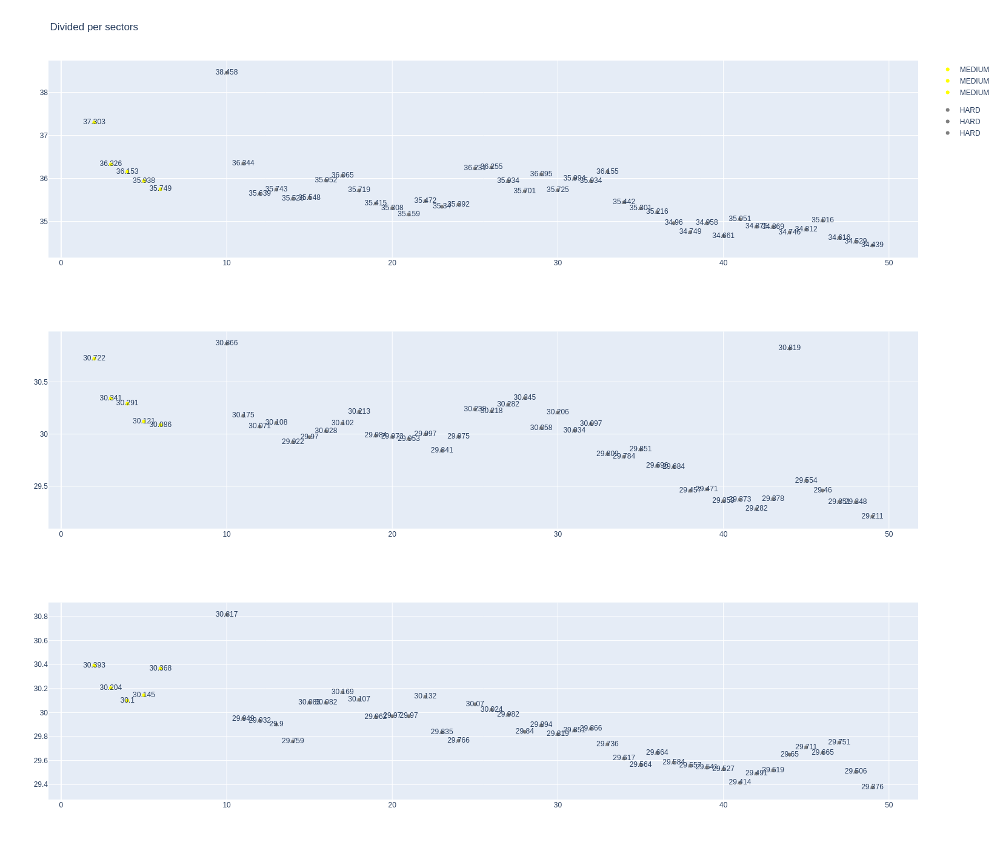

In [254]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

#### Kick Sauber

In [255]:
stintInformation.query('driver_number == 24 or driver_number == 77')

,meeting_key,session_key,stint_number,driver_number,lap_start,lap_end,compound,tyre_age_at_start
14,1230,9480,1,77,1,7,SOFT,0
19,1230,9480,1,24,1,41,MEDIUM,0
20,1230,9480,2,77,8,35,HARD,0
35,1230,9480,3,77,36,50,SOFT,0
38,1230,9480,2,24,42,50,SOFT,0


In [256]:
data = libraryDataF1.getinfolongruns(jointables,24,'Kick Sauber',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
31,ZHOU Guanyu,MEDIUM,2024-03-09T17:05:45.375000+00:00,2,37.329,30.946,30.264,98.539
50,ZHOU Guanyu,MEDIUM,2024-03-09T17:07:23.826000+00:00,3,36.300,30.556,30.376,97.232
69,ZHOU Guanyu,MEDIUM,2024-03-09T17:09:01.132000+00:00,4,36.001,30.359,30.166,96.526
88,ZHOU Guanyu,MEDIUM,2024-03-09T17:10:37.509000+00:00,5,35.861,30.252,30.125,96.238
107,ZHOU Guanyu,MEDIUM,2024-03-09T17:12:13.894000+00:00,6,35.967,30.415,30.690,97.072
165,ZHOU Guanyu,MEDIUM,2024-03-09T17:21:19.721000+00:00,10,37.871,30.292,30.254,98.417
183,ZHOU Guanyu,MEDIUM,2024-03-09T17:22:58.111000+00:00,11,35.805,30.006,29.884,95.695
201,ZHOU Guanyu,MEDIUM,2024-03-09T17:24:33.781000+00:00,12,35.228,29.896,29.874,94.998
219,ZHOU Guanyu,MEDIUM,2024-03-09T17:26:08.773000+00:00,13,35.518,29.938,29.899,95.355
237,ZHOU Guanyu,MEDIUM,2024-03-09T17:27:44.095000+00:00,14,36.466,29.899,30.293,96.658


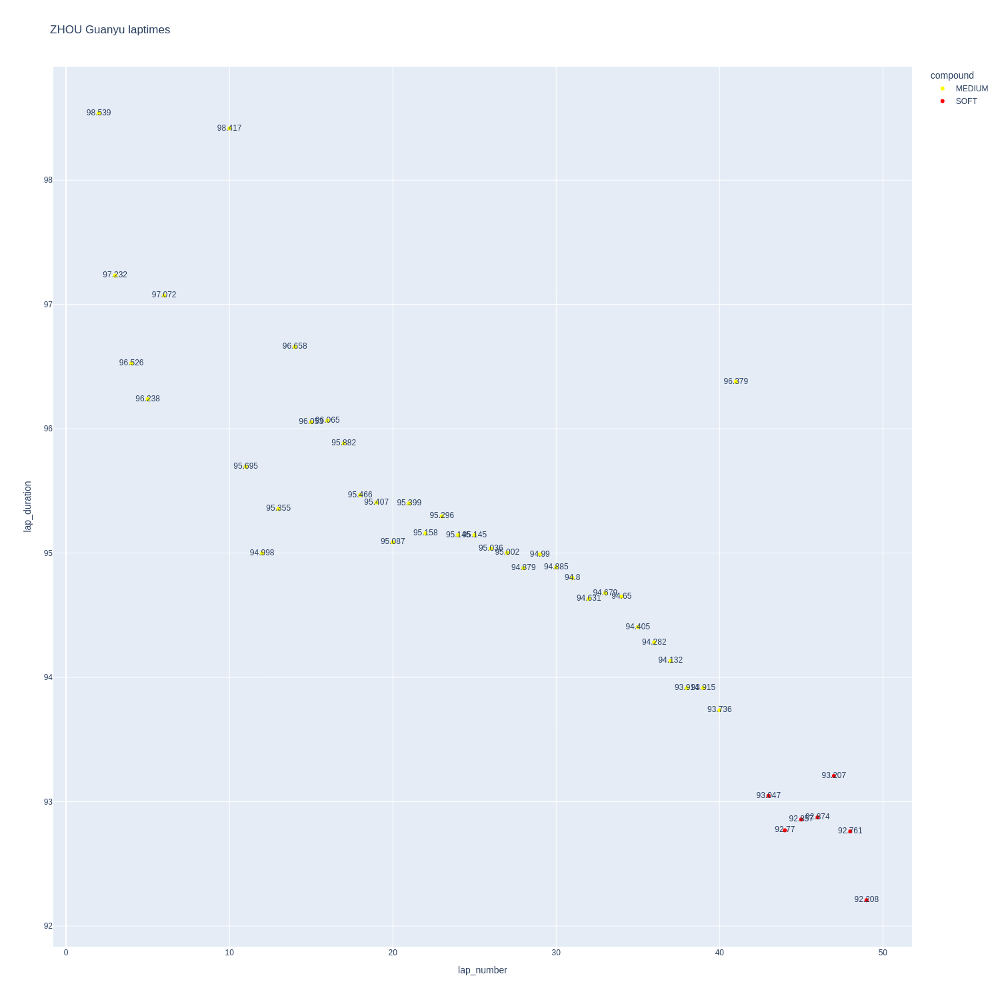

In [257]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

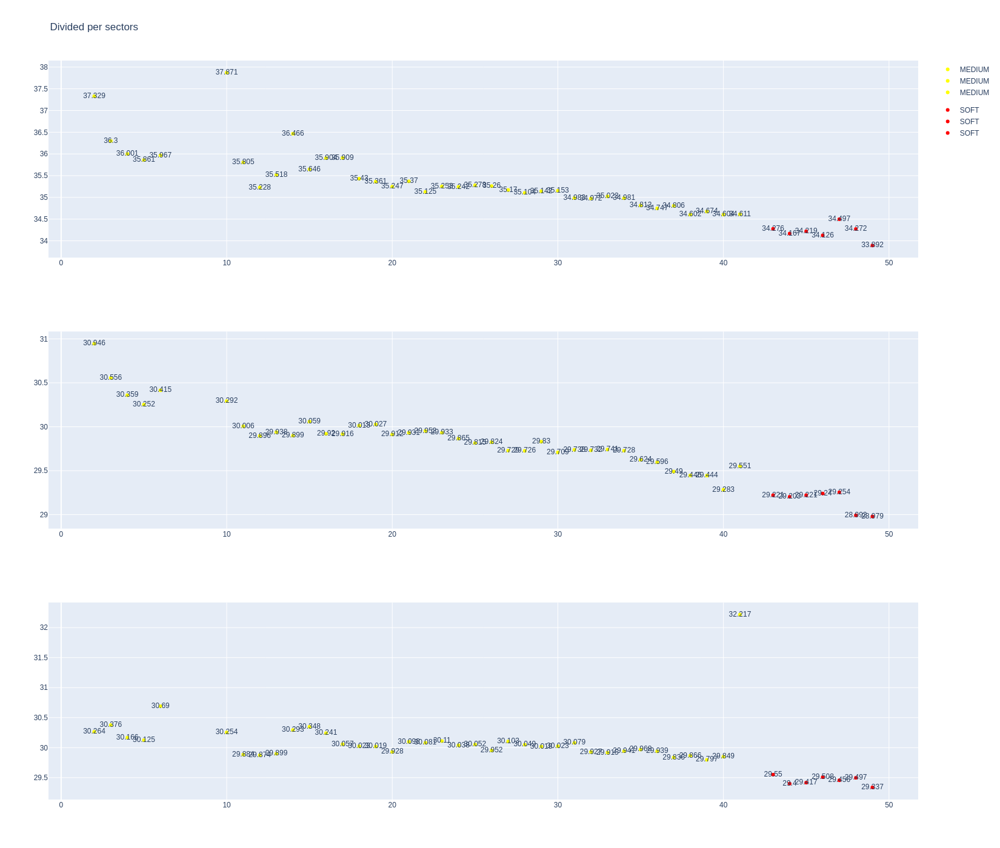

In [258]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

In [259]:
data = libraryDataF1.getinfolongruns(jointables,77,'Kick Sauber',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
37,Valtteri BOTTAS,SOFT,2024-03-09T17:05:44.260000+00:00,2,37.493,30.680,30.301,98.474
56,Valtteri BOTTAS,SOFT,2024-03-09T17:07:22.879000+00:00,3,36.222,30.520,30.224,96.966
75,Valtteri BOTTAS,SOFT,2024-03-09T17:08:59.748000+00:00,4,35.910,30.330,30.177,96.417
94,Valtteri BOTTAS,SOFT,2024-03-09T17:10:36.132000+00:00,5,35.837,30.360,30.047,96.244
113,Valtteri BOTTAS,SOFT,2024-03-09T17:12:12.360000+00:00,6,35.387,30.125,30.713,96.225
171,Valtteri BOTTAS,HARD,2024-03-09T17:21:21.418000+00:00,10,38.709,30.926,30.447,100.082
189,Valtteri BOTTAS,HARD,2024-03-09T17:23:01.429000+00:00,11,36.431,30.173,29.852,96.456
207,Valtteri BOTTAS,HARD,2024-03-09T17:24:37.916000+00:00,12,35.578,30.285,29.964,95.827
225,Valtteri BOTTAS,HARD,2024-03-09T17:26:13.791000+00:00,13,35.489,29.924,30.034,95.447
243,Valtteri BOTTAS,HARD,2024-03-09T17:27:49.209000+00:00,14,35.414,30.050,29.960,95.424


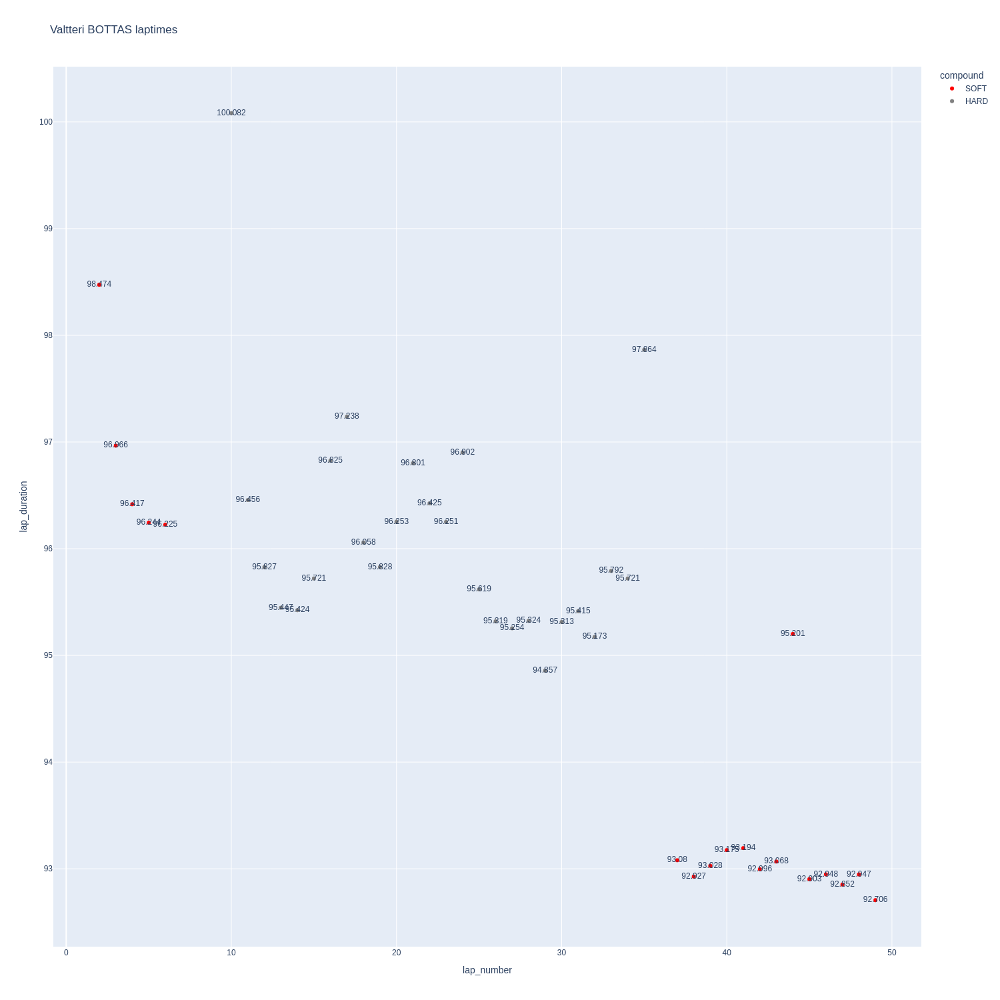

In [260]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

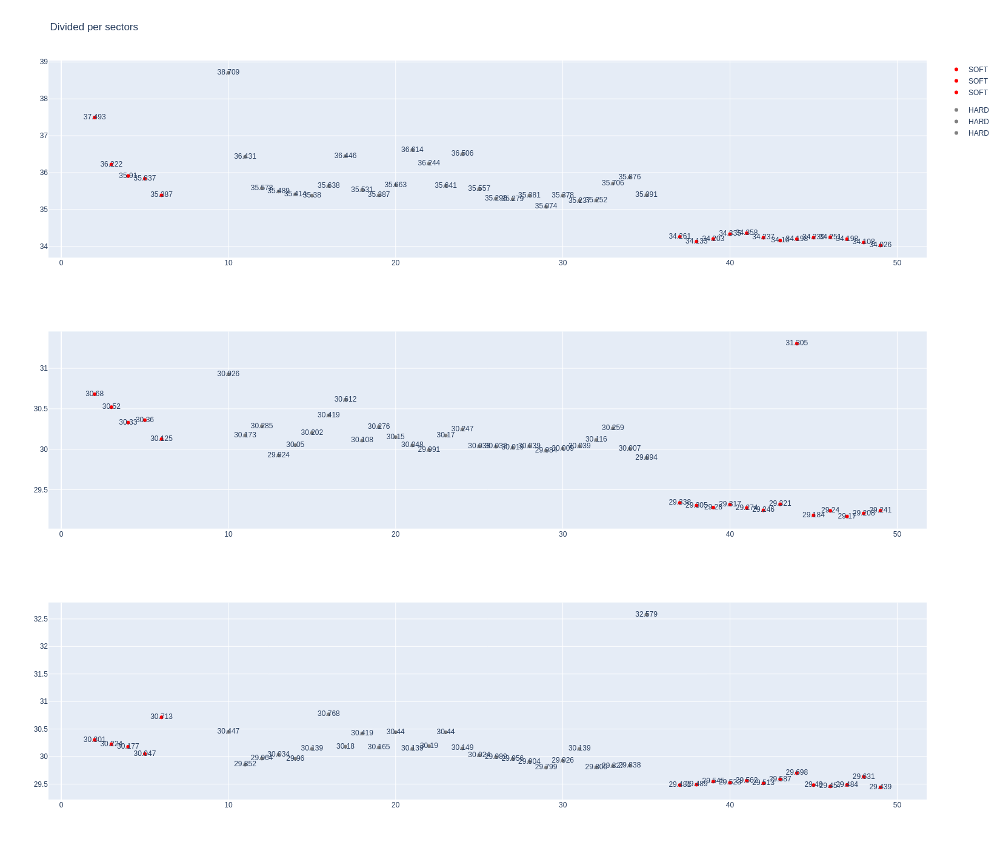

In [261]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

### Pits
Before to finish the analysis, I added the Pits sections where it can see how much time teams spent in the box.

In [262]:
pit = libraryDataF1.obtain_information('pit',session_key=9472)

In [263]:
jointables = pd.merge(drivers,pit,on=['driver_number']).query("pit_duration<120")
jointables
pit_duration = pd.DataFrame(jointables.groupby('team_name')['pit_duration'].mean().sort_values(ascending=True))
pit_duration

,pit_duration
team_name,
Ferrari,24.050
Red Bull Racing,24.550
Mercedes,24.625
Aston Martin,24.675
RB,24.675
McLaren,24.775
Alpine,26.280
Williams,27.040
Haas F1 Team,27.180
